# Scaling Natural Flood Management on Agricultural Land in England: Spatial Opportunity, Participation Costs and Financing

**MSc Sustainability, Enterprise and the Environment Dissertation code notebook**  
**Candidate number:** 1100992

## Introduction <a id="introduction"></a>

This code supports the dissertation **Scaling Natural Flood Management on Agricultural Land in England: Spatial Opportunity, Participation Costs and Financing**. It provides a reproducible code used to identify potential locations for farm-scale natural flood management (NFM), estimate the payments that may be required for land-manager participation, and examine the implications for policy and finance.

The studies overarching research question: **To what extent, and under what spatial and economic conditions, is there potential for farm-scale NFM across England?**

This question is addressed through three sub-questions:

1. Where in England do areas of flood risk overlap with biophysical suitability and agricultural land availability to identify opportunities for farm-scale NFM?
2. How do agricultural productivity, land use, farm characteristics and intervention type influence the estimated financial cost of farm-scale NFM, and to what extent are existing payments sufficient to cover these costs?
3. What are the implications of the spatial and financial findings for the design and targeting of funding, governance and policy mechanisms for farm-scale NFM?

Together, these questions identify where farm-scale NFM may be suitable, examine the economic conditions that may affect adoption, and assess how spatial and economic evidence can support more targeted policy and financing approaches.

## Methodology <a class="anchor" id="methodology"></a>

To address the research questions, a national spatial-economic framework is used to identify patterns and priority areas for future NFM. This national perspective is important for strategic planning but cannot provide the detail needed to assess catchment- or site-level feasibility or downstream flood-risk reduction. The findings therefore identify areas for further investigation rather than detailing where NFM will be feasible or effective.

This section outlines the data, preprocessing, and analytical methods used in this study. All analyses were conducted in Python using various libraries such as `GeoPandas`, `pandas`, `scikit-learn`, and `matplotlib`. Geographic data was projected to EPSG:27700 for spatial consistency, and missing values were handled.

The analysis combines the datasets listed in Table 1, using individual agricultural fields as the unit of analysis. This reflects the scale at which farmers typically make land-management decisions and captures variation in land use, agricultural quality and field size. FLAME (Sheikh et al., 2025) provides the field boundaries and field–farm linkages, with RPA Parcel Points used to independently assess its coverage.

**Table 1: Data sources, scale and limitations**

*Links found in references*

| Stage                                        | Dataset                                                                | Analytical use                             | Scale / resolution         | Key limitation                                                                     |
| -------------------------------------------- | ---------------------------------------------------------------------- | ------------------------------------------ | -------------------------- | ---------------------------------------------------------------------------------- |
| **Reference geography**                      | English Regions (ONS, 2025)                                            | Regional reporting                         | 9 English regions          | —                                                                                  |
| **Reference geography**                      | WFD Operational Catchments, Cycle 4 (DEFRA, 2026b)                     | Catchment reporting                        | Operational catchment      | Boundaries are designed for WFD management and differ from hydrological catchments |
| **Reference geography**                      | OS Local Authority Boundaries (Ordnance Survey, 2026a)                 | Local authority reporting                  | Local authorities          | —                                                                                  |
| **Hard exclusions**                          | OS Open Built Up Areas (Ordnance Survey, 2022)                         | Exclude built-up land                      | Areas ≥20 ha               | Omits smaller settlements and recent development                                   |
| **Hard exclusions**                          | UKCEH Spatial Inventory of UK Waterbodies v3.6 (Taylor, 2021)          | Exclude standing water                     | Waterbody polygons         | Does not represent the full drainage network                                       |
| **Hard exclusions**                          | OS MasterMap Water Networks (Ordnance Survey, 2026b)                   | Exclude watercourses                       | Vector network             | May omit smaller channels                                                          |
| **Hard exclusions**                          | OS Open Roads (Ordnance Survey, 2026)                                  | Exclude road infrastructure                | Vector network             | Does not represent full road width                                                 |
| **Hard exclusions**                          | OpenStreetMap railway network (HOT, 2025)                              | Exclude railway infrastructure             | Vector network             | Completeness and positional accuracy vary                                          |
| **Constraint screening**                     | England Peat Map Depth (DEFRA, 2025b)                                  | Flag peat depth ≥30 cm                     | 50 m modelled grid         | Local depths may differ from predictions                                           |
| **Constraint screening**                     | Areas of Outstanding Natural Beauty (AONB) (Natural England, 2024a)    | Flag landscape designations                | Designation boundaries     | Does not establish site-specific constraints                                       |
| **Constraint screening**                     | Sites of Special Scientific Interest (SSSI) (Natural England, 2026c)   | Flag nationally protected sites            | Site boundaries            | Does not establish site condition or intervention suitability                      |
| **Constraint screening**                     | Special Areas of Conservation (SAC) (Natural England, 2024d)           | Flag protected habitats                    | Site boundaries            | Does not establish habitat condition or management requirements                    |
| **Constraint screening**                     | Special Protection Areas (SPA) (Natural England, 2025)                 | Flag protected bird habitats               | Site boundaries            | Does not establish current populations or habitat condition                        |
| **Constraint screening**                     | Ramsar sites (Natural England, 2024c)                                  | Flag important wetlands                    | Site boundaries            | Does not establish current condition                                               |
| **Constraint screening**                     | National Nature Reserves (NNR) (Natural England, 2026b)                | Flag national conservation areas           | Site boundaries            | Does not establish management requirements                                         |
| **Constraint screening**                     | Local Nature Reserves (LNR) (Natural England, 2026a)                   | Flag local conservation areas              | Site boundaries            | Local records may be more complete                                                 |
| **Constraint screening**                     | National Parks (Natural England, 2024b)                                | Flag landscape and planning designations   | Designation boundaries     | Does not establish local ecological sensitivity                                    |
| **Agricultural fields and characteristics** | Field Level Assets Mapping in England (FLAME) (Sheikh *et al.*, 2025a) | Define fields and farm linkages            | Field–farm                 | Incomplete coverage, inferred links, and uncertain agricultural attribution        |
| **Agricultural fields and characteristics** | Crop Map of England (CROME) (DEFRA, 2024)                              | Classify crops and broad land use          | Approximately 0.4 ha cells | Annual variation and classification error                                          |
| **Agricultural fields and characteristics** | Predictive Agricultural Land Classification (ALC) (DEFRA, 2025d)       | Compare agricultural land quality          | 50 m grid                  | Modelled and not suitable for definitive field classification                      |
| **Agricultural fields and characteristics** | AgCensus (DEFRA, 2021)                                                 | Characterise livestock and farming systems | 5 km grid                  | Spatial redistribution introduces small-area uncertainty                           |
| **Agricultural fields and characteristics** | RPA Parcel Points (DEFRA, 2026a)                                       | Assess FLAME coverage independently        | Parcel centroids           | Points do not represent field boundaries                                           |
| **Hydrological opportunity**                 | Environment Agency Flood Map for Planning (Environment Agency, 2025a)  | Identify overlap with Flood Zones 2 and 3  | Flood-zone polygons        | Does not estimate NFM effectiveness or downstream flood reduction                  |


Each field is assessed against three dimensions:

1. **Physical availability (RQ1):** the area remaining after spatial exclusions are applied to account for biophysical suitability. Screening draws on OS Open Built Up Areas, OS Open Roads, the OpenStreetMap railway network, the UKCEH Spatial Inventory of UK Waterbodies and the England Peat Map Depth dataset. Protected-site and landscape-designation datasets identify areas where conservation, landscape or planning considerations may affect intervention suitability.

2. **Hydrological opportunity (RQ1):** the extent of field overlap with Flood Zones 2 and 3, identified using the Environment Agency Flood Map for Planning. This provides a screening measure rather than an estimate of field-level NFM effectiveness or downstream flood-risk reduction.

3. **Compensation requirement (RQ2):** the estimated break-even payment required by landowners for each of the 5 assessed NFM interventions. Estimates account for land use and crop type using CROME data, comparative agricultural productivity using ALC data, and farm-system and livestock characteristics using FLAME and AgCensus data. These characteristics are combined with intervention-specific assumptions to estimate compensation requirements.

The analysis also examines existing payments and how these could affect the additional compensation required (RQ2). Results are aggregated using ONS English Regions, WFD Operational Catchments, and OS Local Authority Boundaries to support interpretation at regional, catchment and local-authority scales. Together, these assessments inform the design and targeting of funding, governance and policy mechanisms for farm-scale NFM (RQ3).





### Setup and configuration <a class="anchor" id="setup-and-configuration"></a>

In [ ]:
from google.colab import drive

drive.mount('/content/google_drive')

Drive already mounted at /content/google_drive; to attempt to forcibly remount, call drive.mount("/content/google_drive", force_remount=True).


In [ ]:
# Install required packages# Install required packages directly in the notebook
%pip install -q numpy pandas matplotlib shapely pyogrio geopandas rasterio

In [ ]:
# Import necessary libraries
import warnings, time, re, gc
from pathlib import Path

import numpy as np
import pandas as pd
import geopandas as gpd

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import shapely
import rasterio
from rasterio.mask import mask
from rasterio.features import shapes
from shapely.geometry import shape, MultiPolygon
from shapely import wkt
from shapely.geometry import box, mapping

import sqlite3
from io import StringIO

from rasterio.enums import Resampling
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
from matplotlib.lines import Line2D
from rasterio.windows import Window
from rasterio.enums import Resampling
from matplotlib.ticker import MaxNLocator
import matplotlib.ticker as mticker
from matplotlib.patches import Patch

from IPython.display import display

try:
    from shapely import make_valid
    _HAS_MV = True
except Exception:
    _HAS_MV = False

import pyogrio

import json, hashlib
import pyarrow.parquet as pq
from time import perf_counter
from threading import Event, Thread
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.patches import ConnectionPatch, Rectangle, Polygon as MPolygon
from rasterio.features import rasterize
from rasterio.transform import from_bounds

warnings.filterwarnings("ignore", message=".*invalid value encountered.*")
pd.set_option("display.width", 120)
print("Packages ready.")
# Shared visual defaults for all dissertation exhibits. Individual map legends
# retain their analysis-specific scales and category colours.
def apply_dissertation_style():
    plt.rcParams.update({
        "font.family": "DejaVu Sans",
        "font.size": 9,
        "axes.titlesize": 11,
        "axes.titleweight": "semibold",
        "axes.labelsize": 9,
        "figure.titlesize": 13,
        "figure.facecolor": "white",
        "savefig.facecolor": "white",
        "figure.dpi": 120,
        "savefig.dpi": 300,
        "axes.spines.top": False,
        "axes.spines.right": False,
        "axes.axisbelow": True,
        "grid.color": "#D9D9D9",
        "grid.linewidth": 0.5,
    })

apply_dissertation_style()

# One finishing contract for maps, charts and schematic figures. The plots
# retain their analysis-specific content, colour scales and geographic extent.
def format_dissertation_figure(fig):
    fig.patch.set_facecolor("white")
    if getattr(fig, "_suptitle", None) is not None:
        fig._suptitle.set_fontfamily("DejaVu Sans")
        fig._suptitle.set_fontsize(13)
        fig._suptitle.set_fontweight("semibold")
    for ax in fig.axes:
        ax.set_facecolor("white")
        for title in (ax.title, ax._left_title, ax._right_title):
            title.set_fontfamily("DejaVu Sans")
            title.set_fontsize(11)
            title.set_fontweight("semibold")
        for label in (ax.xaxis.label, ax.yaxis.label):
            label.set_fontfamily("DejaVu Sans")
            label.set_fontsize(9)
        ax.tick_params(labelsize=8)
        legend = ax.get_legend()
        if legend is not None:
            for item in legend.get_texts():
                item.set_fontfamily("DejaVu Sans")
                item.set_fontsize(8)
            if legend.get_title() is not None:
                legend.get_title().set_fontfamily("DejaVu Sans")
                legend.get_title().set_fontsize(8)
        ax.spines["top"].set_visible(False)
        ax.spines["right"].set_visible(False)
    for item in fig.texts:
        if item is fig._suptitle:
            continue
        item.set_fontfamily("DejaVu Sans")
        if item.get_position()[1] > 0.85 and item.get_fontsize() >= 11:
            item.set_fontsize(13)
            item.set_fontweight("semibold")
        else:
            item.set_fontsize(8)
    return fig

def save_dissertation_figure(fig, path, **kwargs):
    """Apply the shared format and save PNG/PDF without changing plotted data."""
    format_dissertation_figure(fig)
    kwargs.update(dpi=300, bbox_inches="tight", facecolor="white")
    return fig.savefig(path, **kwargs)


Packages ready.


In [ ]:
# Set NFM_DATA_ROOT to a directory containing raw/ and processed/.
# Otherwise use this repository's data/ directory, independent of the current cwd.
DATA_ROOT = Path("/content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/")

# ---- Folders -----------------------------------------------------------------
RAW = DATA_ROOT / "raw"
OUT = DATA_ROOT / "processed";  OUT.mkdir(parents=True, exist_ok=True)
FIG = OUT / "figures";          FIG.mkdir(exist_ok=True)
TAB = OUT / "tables";           TAB.mkdir(exist_ok=True)

# ---- Analysis settings -------------------------------------------------------
ANALYSIS_CRS = "EPSG:27700"     # British National Grid
PURITY_MIN   = 0.50             # attribute counts as "confident" at >= this share
FORCE_REBUILD = False           # True = ignore cached checkpoints and rebuild every step from raw

# ---- All file paths ----------------------------------------------------------
PATHS = {
    "agriculture": OUT / "agriculture_regrouped.gpkg",
    # geographies
    "regions":      RAW / "Regions_England" / "RGN_DEC_2025_EN_BFC.shp",
    "local_auth":   RAW / "Local_Authority_England" / "LAD_MAY_2025_UK_BGC_V2.shp",
    "catchments":   RAW / "WFD_Surface_Water_Operational_Catchments_Cycle_4.shp/WFD_Surface_Water_Operational_Catchments_Cycle_4.shp",
    # field-level inputs
    "flame_farm":   RAW / "FLAME_field_polygons_with_farm.csv",
    "flame_owner": RAW / "FLAME_field_polygons_owner.csv",
    "crome":    RAW / "Crop_Map_of_England_CROME_2024.gpkg",
    "alc":          RAW / "Predictive_Agricultural_Land_Classification_Map_for_England" / "Predictive_ALC_England.shp",
    "agcensus_dir": RAW / "Agcensus_England",
    "rpa_points":   RAW / "RPA_Parcel_Points_England" / "RPA_Parcel_Points_England.shp",
    # exclusion layers
    "built_up":     RAW / "Built_Up_Areas" / "OS_Open_Built_Up_Extents.csv",
    "protected_dir":RAW / "Protected_Areas",
    "peat_tif":     RAW / "Peat" / "peaty_soil_depth_v1_download.tif",
    "road_dir":     RAW / "Transport" / "road",
    "rail":         RAW / "Transport" / "hotosm_gbr_railways_lines_shp.shp",
    "lakes":        RAW / "Water_Rivers" / "uklakes_v3_6_poly.gpkg",
    "watercourses": RAW / "Water_Rivers" / "WatercourseLink.shp",
    # hydrological opportunity
    "flood_risk_zone": RAW / "flood-risk-zone.parquet",
    "fz2":          OUT / "flood_zones_2_3.gpkg",          # combined FZ2+3 layer, built by cell 3.0
        # Checkpoints
    "ck_flame": OUT / "flame_farm_owner_combined.parquet",
    "ck_crop":      OUT / "mp_flame_crop.parquet",
    "ck_alc":       OUT / "mp_flame_crop_alc.parquet",
    "ck_live":      OUT / "mp_flame_crop_alc_live_v2_age_grass.parquet",
    "exclusions":   OUT / "exclusions_england_streamed.parquet",
}
print("DATA_ROOT:", DATA_ROOT)
print("Outputs: ", OUT)
# Preserve stored regional labels by default and inspect before changing them.
REASSIGN_REGIONS = False
REGION_SPAN_WARNING_KM = 50

_figure_export_counts = {}
def export_figure(fig, stem):
    """Save a white-background, print-resolution PNG and a vector PDF.

    A suffix prevents multiple figures in one results cell from overwriting
    one another; the same execution order gives the same filenames.
    """
    count = _figure_export_counts.get(stem, 0) + 1
    _figure_export_counts[stem] = count
    name = f"{stem}_{count:02d}"
    FIG.mkdir(parents=True, exist_ok=True)
    for extension in ("png", "pdf"):
        save_dissertation_figure(fig, FIG / f"{name}.{extension}", dpi=300,
                    bbox_inches="tight", facecolor="white")
    return name


DATA_ROOT: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data
Outputs:  /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed


In [ ]:
# ---- Helper Functions ------------------------------------------
def load_vector(path, layer=None, crs=ANALYSIS_CRS, bbox=None):
    """Read a vector file (shp/gpkg/gdb layer), reproject to `crs`.
    Retries in latin1 for files with non-UTF-8 attribute text."""
    try:
        g = gpd.read_file(path, layer=layer, bbox=bbox)
    except UnicodeDecodeError:
        g = gpd.read_file(path, layer=layer, bbox=bbox, encoding="latin1")
    if g.crs is None:
        raise ValueError(f"Missing CRS in {path}; verify the source CRS before proceeding.")
    return g.to_crs(crs)

def repair(gdf):
    """Drop empty/missing geometries, make invalid polygons valid, and force
    every geometry to Polygon/MultiPolygon so it's safe to pass to gpd.overlay().
    """
    gdf = gdf[gdf.geometry.notna() & ~gdf.geometry.is_empty].copy()
    bad = ~gdf.geometry.is_valid
    if bad.any():
        gdf.loc[bad, "geometry"] = (gdf.loc[bad, "geometry"].apply(make_valid)
                                    if _HAS_MV else gdf.loc[bad, "geometry"].buffer(0))
    gdf = gdf.explode(index_parts=False)
    gdf = gdf[gdf.geom_type.isin(["Polygon", "MultiPolygon"])]
    return gdf[gdf.geometry.notna() & ~gdf.geometry.is_empty].reset_index(drop=True)

def to_exclusion(gdf, type_label, buffer_m=0):
    """Standardise ANY layer to the exclusion schema -> [type, geometry].
    `buffer_m` turns a line feature into a corridor of that half-width (m)."""
    if not buffer_m:
        gdf = repair(gdf)   # only safe to repair() BEFORE buffering when there's no buffering --
                             # i.e. gdf is already polygons (built_up, protected, peat)
    geom = gdf.geometry.buffer(buffer_m) if buffer_m else gdf.geometry
    out = gpd.GeoDataFrame({"type": type_label, "geometry": geom}, geometry="geometry", crs=gdf.crs)
    return repair(out)   # this repair() is always safe: `out` is always polygons by this point

def first_present(columns, candidates):
    """First name in `candidates` that exists in `columns`, else None."""
    return next((c for c in candidates if c in columns), None)

def centroid_join(fields, polys, value_col):
    """Assign using a representative interior point, preserving one row per field.

    Despite the legacy name this is not a centroid or an area-majority rule.
    A multipart record can extend beyond the selected reporting polygon.
    """
    if fields.crs is None or polys.crs is None:
        raise ValueError("Both join inputs need a known CRS.")
    if fields["field_id"].isna().any() or fields["field_id"].duplicated().any():
        raise ValueError("field_id must be non-null and unique before assigning geography.")
    pts = fields[["field_id", "geometry"]].copy().reset_index(drop=True)
    pts.geometry = pts.geometry.representative_point()
    joined = gpd.sjoin(pts, polys.to_crs(fields.crs)[[value_col, "geometry"]],
                      how="left", predicate="within")
    if joined.index.duplicated().any():
        raise ValueError(f"Multiple {value_col} matches: inspect overlapping boundaries.")
    labels = joined.set_index("field_id")[value_col]
    result = fields.copy()
    result[value_col] = result["field_id"].map(labels)
    return result


def dominant_by_area(fields, polygons, value_col, weight_col=None):
    """Dominant CLASS per field. Sums intersection area BY CLASS first, then
    picks the largest class. purity = winning-class area / field's intersected area.
    If `weight_col` given (e.g. CROME confidence), ranks by area*weight and also
    returns the winning class's mean weight as `<value_col>_conf`."""
    keep = [c for c in [value_col, weight_col] if c] + ["geometry"]
    ov = gpd.overlay(fields[["field_id", "geometry"]], polygons[keep],
                     how="intersection", keep_geom_type=False)
    if ov.empty:
        return pd.DataFrame(columns=["field_id", value_col, f"{value_col}_purity"])
    ov["_a"] = ov.geometry.area
    tot = ov.groupby("field_id")["_a"].sum()
    if weight_col:
        ov["_wa"] = ov["_a"] * ov[weight_col]
        agg = (ov.groupby(["field_id", value_col]).agg(_a=("_a","sum"), _wa=("_wa","sum")).reset_index())
        agg["_rank"] = agg["_wa"]
    else:
        agg = ov.groupby(["field_id", value_col])["_a"].sum().reset_index()
        agg["_rank"] = agg["_a"]
    win = agg.sort_values("_rank").drop_duplicates("field_id", keep="last")
    out = pd.DataFrame({"field_id": win["field_id"].values,
                        value_col: win[value_col].values,
                        f"{value_col}_purity": (win["_a"].values / win["field_id"].map(tot).values)})
    if weight_col:
        out[f"{value_col}_conf"] = win["_wa"].values / win["_a"].values
    return out

def overlap_fraction_by_region(fields, layer, region_list, id_col="field_id"):
    """Fraction of each field covered by `layer`, computed region by region
    (bounded, so it scales to national size). Returns [id_col, frac]."""
    parts = []
    for reg in region_list:
        f_r = fields[fields["region"] == reg]
        if f_r.empty:
            continue
        minx, miny, maxx, maxy = f_r.total_bounds
        l_r = layer.cx[minx:maxx, miny:maxy]
        fa = f_r.set_index(id_col).geometry.area
        if l_r.empty:
            frac = pd.Series(0.0, index=f_r[id_col].values)
        else:
            ov = gpd.overlay(f_r[[id_col, "geometry"]], l_r[["geometry"]],
                             how="intersection", keep_geom_type=False)
            frac = (ov.assign(_a=ov.geometry.area).groupby(id_col)["_a"].sum() / fa).clip(0, 1) \
                   if not ov.empty else pd.Series(0.0, index=f_r[id_col].values)
        parts.append(frac.reindex(f_r[id_col].values).fillna(0.0)
                          .rename_axis(id_col).reset_index(name="frac"))
    return pd.concat(parts, ignore_index=True) if parts else pd.DataFrame(columns=[id_col, "frac"])

def minmax(s):
    """Scale a numeric series to [0,1]; returns 0.5 everywhere if it is constant."""
    s = pd.to_numeric(s, errors="coerce")
    lo, hi = s.min(), s.max()
    if not np.isfinite(lo) or not np.isfinite(hi) or hi == lo:
        return pd.Series(0.5, index=s.index)
    return ((s - lo) / (hi - lo)).clip(0, 1)

def quick_look(gdf, name="layer"):
    crs = gdf.crs.to_epsg() if gdf.crs else None
    print(f"{name:<26} rows={len(gdf):>9,}  crs={crs}")

def save_table(df, name):
    """Save a table to processed/tables as CSV and echo the path."""
    p = TAB / f"{name}.csv"; df.to_csv(p, index=False); print("saved table:", p.name); return df

# Reuse the large agricultural layer in memory.
_AGRICULTURE_SOURCE = None
_AGRICULTURE_SIGNATURE = None

def get_agriculture(reload=False):
    global _AGRICULTURE_SOURCE, _AGRICULTURE_SIGNATURE
    path = PATHS["agriculture"]
    stat = path.stat()
    signature = (str(path.resolve()), stat.st_mtime_ns, stat.st_size, ANALYSIS_CRS)
    if reload or _AGRICULTURE_SOURCE is None or signature != _AGRICULTURE_SIGNATURE:
        _AGRICULTURE_SOURCE = load_vector(path, layer="agriculture")
        _AGRICULTURE_SIGNATURE = signature
    return _AGRICULTURE_SOURCE


def set_map_extent(ax, boundary, padding=0.02):
    xmin, ymin, xmax, ymax = boundary.total_bounds
    dx, dy = (xmax-xmin)*padding, (ymax-ymin)*padding
    ax.set(xlim=(xmin-dx, xmax+dx), ylim=(ymin-dy, ymax+dy), aspect="equal")


def audit_field_regions(fields, boundary, span_warning_km=50):
    """Compare stored labels with point assignments; flag widely spread geometry.

    Reports only: does not repair, delete, split or relabel field geometries.
    """
    assigned = centroid_join(fields[["field_id", "geometry"]], boundary, "region")
    report = fields[["field_id"]].copy()
    report["stored_region"] = fields["region"] if "region" in fields else pd.NA
    report["point_region"] = assigned["region"].to_numpy()
    report["label_differs"] = (report.stored_region.fillna("<missing>") !=
                               report.point_region.fillna("<missing>"))
    bounds = fields.geometry.bounds
    report["span_km"] = np.maximum(bounds.maxx-bounds.minx, bounds.maxy-bounds.miny)/1000
    report["large_span"] = report.span_km > span_warning_km
    report["parts"] = shapely.get_num_geometries(fields.geometry.to_numpy())
    report["geometry_ha"] = fields.geometry.area/10000
    if "area_flame" in fields:
        report["area_flame"] = fields["area_flame"]
    print(f"Regional label differences: {report.label_differs.sum():,}")
    print(f"Unassigned interior points: {report.point_region.isna().sum():,}")
    print(f"Records spanning >{span_warning_km:g} km: {report.large_span.sum():,}")
    return report


def plot_region(fields, region_name, column=None):
    """Display geometry within an official region, without changing analytical fields.

    Select by spatial intersection, not a stored whole-record label, and clip
    only this plotting copy so distant multipart components cannot set extent.
    """
    boundary = regions.loc[regions.region.eq(region_name)]
    if boundary.empty:
        raise ValueError(f"Unknown region: {region_name}")
    view = gpd.clip(fields.to_crs(boundary.crs), boundary)
    fig, ax = plt.subplots(figsize=(7, 8))
    if not view.empty:
        view.plot(ax=ax, column=column, legend=column is not None, linewidth=0)
    boundary.boundary.plot(ax=ax, color="#444444", linewidth=0.7)
    set_map_extent(ax, boundary)
    ax.set_title(region_name)
    ax.set_axis_off()
    return fig, ax


def choropleth(fields, column, title, filename, colors, legend_title=None, order=None):
    """Shared categorical map helper (missing from the original notebook)."""
    fig, ax = plt.subplots(figsize=(7.5, 9))
    england.plot(ax=ax, color="#f4f4f4", edgecolor="#cccccc", linewidth=0.4)
    for label in (order or list(colors)):
        subset = fields.loc[fields[column].eq(label)]
        if not subset.empty:
            subset.plot(ax=ax, color=colors[label], linewidth=0)
    regions.boundary.plot(ax=ax, color="#777777", linewidth=0.3)
    set_map_extent(ax, england)
    ax.set_title(title, fontsize=11, fontweight="bold")
    ax.set_axis_off()
    ax.legend(handles=[mpatches.Patch(color=colors[k], label=k) for k in (order or list(colors))],
              title=legend_title, loc="lower left", fontsize=7)
    save_dissertation_figure(fig, FIG / filename, bbox_inches="tight", dpi=300, facecolor="white")
    plt.show()
    plt.close(fig)


### Reference geometries <a class="anchor" id="reference-geometries"></a>

Four reference layers are used throughout the study: an England outline (used to clip everything to the study area), and the region / local-authority / catchment boundaries that are later attached to each field parcel.

In [ ]:
# Load boundary layers, repair polygons and combine features by area name.
def load_boundaries(path, source_col, name_col):
    """Load and clean boundaries, returning one feature per named area."""
    gdf = (
        load_vector(path)
        .rename(columns={source_col: name_col})
        [[name_col, "geometry"]]
    )
    if gdf[name_col].isna().any():
        raise ValueError(f"Missing {name_col} in {path}")
    gdf[name_col] = gdf[name_col].astype("string").str.strip()
    if gdf[name_col].eq("").any():
        raise ValueError(f"Empty {name_col} in {path}")
    return (
        repair(gdf)
        .dissolve(by=name_col, as_index=False)
        [[name_col, "geometry"]]
    )
regions = load_boundaries(PATHS["regions"], "RGN25NM", "region")
local_auth = load_boundaries(PATHS["local_auth"], "LAD25NM", "local_authority")
catchments = load_boundaries(PATHS["catchments"], "operationa", "catchment")

if len(regions) != 9 or regions.region.nunique() != 9:
    raise ValueError("Expected nine distinct English regions; inspect the source name column.")
region_diagnostics = regions[["region"]].copy()
region_diagnostics["area_km2"] = regions.geometry.area / 1_000_000
region_diagnostics = region_diagnostics.join(regions.geometry.bounds)
save_table(region_diagnostics, "QA_region_boundaries")

saved table: QA_region_boundaries.csv


,region,area_km2,minx,miny,maxx,maxy
0,East Midlands,15643.269579,397826.1400,231281.6957,557489.8000,414654.6957
1,East of England,19132.366176,486497.3200,175098.1500,655653.8500,346771.8190
2,London,1573.327583,503571.5000,155854.3000,561957.4962,200933.6227
3,North East,8598.514945,356180.3036,506231.8021,478449.4800,657535.9723
4,North West,14167.139515,293941.1600,338994.1033,406087.1967,588517.2903
5,South East,19087.562706,403095.4021,75254.2700,640170.2000,256160.1400
6,South West,23850.279535,82668.5200,5336.9660,435920.0400,246052.2048
7,West Midlands,13003.839740,316113.5000,214348.5027,456472.5013,369909.5039
8,Yorkshire and The Humber,15408.153695,363190.9500,378555.0991,542151.1450,519006.0500


In [ ]:
# Create a SEPARATE national outline. regions remains nine features.
england = regions[["geometry"]].dissolve().reset_index(drop=True)
england_geom = england.geometry.iloc[0]

# Select authorities using a point inside each feature, keeping boundaries intact.
local_auth_england = local_auth[
    local_auth.geometry.representative_point().within(england_geom)
].copy()

REGION_LIST = sorted(regions["region"].dropna().unique().tolist())

print("Regions to process:", REGION_LIST)
print("Local authorities in source:", len(local_auth))

quick_look(regions, "English regions")
quick_look(local_auth_england, "English local authorities")
quick_look(catchments, "Operational catchments")

Regions to process: ['East Midlands', 'East of England', 'London', 'North East', 'North West', 'South East', 'South West', 'West Midlands', 'Yorkshire and The Humber']
Local authorities in source: 361
English regions            rows=        9  crs=27700
English local authorities  rows=      296  crs=27700
Operational catchments     rows=      425  crs=27700


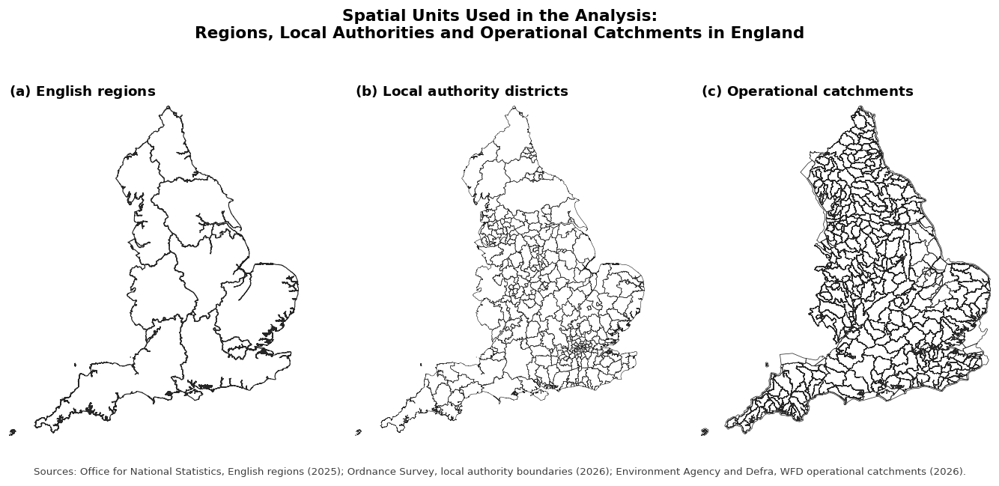

Saved figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/spatial_units.png
Saved vector figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/spatial_units.pdf


In [ ]:
# Plot Study Context figure
xmin, ymin, xmax, ymax = england.total_bounds
panels = [(regions, "English regions", 0.70),
          (local_auth_england, "Local authority districts", 0.35),
          (catchments, "Operational catchments", 0.45)]

style = {"font.family": "DejaVu Sans", "font.size": 10, "axes.titlesize": 11,
         "figure.titlesize": 13, "savefig.dpi": 300}

with plt.rc_context(style):
    fig, axes = plt.subplots(1, 3, figsize=(12, 5.4), sharex=True, sharey=True)

    for i, (ax, (layer, title, linewidth)) in enumerate(zip(axes, panels)):
        layer.boundary.plot(ax=ax, color="#262626", linewidth=linewidth)
        ax.set_title(rf"$\bf{{({chr(97 + i)})}}$ {title}", loc="left", pad=8)
        ax.set(xlim=(xmin, xmax), ylim=(ymin, ymax), aspect="equal")
        ax.set_axis_off()

    fig.suptitle(
        "Spatial Units Used in the Analysis:\n"
        "Regions, Local Authorities and Operational Catchments in England",
        y=1.0, fontweight="semibold"
    )
    fig.text(
        0.5, 0.035,
        "Sources: Office for National Statistics, English regions (2025); "
        "Ordnance Survey, local authority boundaries (2026); "
        "Environment Agency and Defra, WFD operational catchments (2026).",
        ha="center", va="bottom", fontsize=8, color="#404040", wrap=True
    )
    fig.subplots_adjust(left=0.025, right=0.975, top=0.80,
                        bottom=0.12, wspace=0.04)

    png_path, pdf_path = FIG / "spatial_units.png", FIG / "spatial_units.pdf"
    save_dissertation_figure(fig, png_path, dpi=300, bbox_inches="tight", facecolor="white")
    save_dissertation_figure(fig, pdf_path, bbox_inches="tight", facecolor="white")
    plt.show()
    plt.close(fig)

print(f"Saved figure: {png_path}")
print(f"Saved vector figure: {pdf_path}")

## Data preparation and descriptive checks

The following cells examine the field-level data and the attribute and availability decisions that help anwser all three research questions.

All data-preparation steps described in this section were carried out separately in the accompaying notebook. The setup notebook combines and processes the source datasets to create `agriculture.gpkg`, the field-level dataset used in this study. This includes preparing the FLAME field boundaries and attaching information on crop type, land quality, livestock context and land availability.

The setup notebook only needs to be run when `agriculture.gpkg` is being created or updated. Once the file has been produced, the completed agricultural dataset can be loaded directly into this notebook.




In [ ]:
# Load once,later stages reuse this in-memory dataset.
agriculture = get_agriculture(reload=FORCE_REBUILD)
print(f"Loaded {len(agriculture):,} agricultural field records; CRS: {agriculture.crs}")
region_audit = audit_field_regions(agriculture, regions, REGION_SPAN_WARNING_KM)
save_table(region_audit, "QA_field_regions")
display(region_audit.sort_values("span_km", ascending=False).head(20))
if REASSIGN_REGIONS:
    # Whole-record representative-point assignment; does not split area across regions.
    agriculture["region_original"] = agriculture["region"] if "region" in agriculture else pd.NA
    agriculture["region"] = region_audit["point_region"].to_numpy()
display(agriculture.head())

Loaded 682,623 agricultural field records; CRS: EPSG:27700
Regional label differences: 105
Unassigned interior points: 105
Records spanning >50 km: 6,017
saved table: QA_field_regions.csv


,field_id,stored_region,point_region,label_differs,span_km,large_span,parts,geometry_ha,area_flame
638230,FLAME_OWNER_207323,South West,South West,False,629.986390,True,2844,20783.061291,20813.864261
639579,FLAME_OWNER_208672,South West,South West,False,623.700140,True,197,577.265871,577.873184
639590,FLAME_OWNER_208683,East of England,East of England,False,623.091380,True,68,243.479937,243.648460
680673,FLAME_OWNER_249766,South West,South West,False,612.966750,True,1285,935.531031,948.657517
639595,FLAME_OWNER_208688,North East,North East,False,608.898550,True,249,265.091478,265.610382
680763,FLAME_OWNER_249856,Yorkshire and The Humber,Yorkshire and The Humber,False,608.188020,True,373,286.987897,287.219678
639599,FLAME_OWNER_208692,East of England,East of England,False,607.358190,True,64,680.228980,680.652803
639580,FLAME_OWNER_208673,South West,South West,False,607.253870,True,1184,10575.100981,10582.880940
638229,FLAME_OWNER_207322,South West,South West,False,606.516000,True,453,736.248292,736.683622
639592,FLAME_OWNER_208685,South West,South West,False,604.947290,True,133,589.626310,590.128942


,field_id,entity_id,ID,OWNER_ID,flame_source,source_row_id,farm_type,land_use,lu_flame,lu_crome,...,size_ha,available_ha,excluded_frac,excluded,region,local_authority,catchment,area_diff_pct,crop_old_group,geometry
0,FLAME_FARM_0,FARM_FARM00008,FARM00008,None,farm,0,Non-agricultural,Trees,Leguminous Crops,Trees,...,1.629147,1.579793,0.030295,False,West Midlands,Malvern Hills,Severn River Worcestershire,0.096995,Leguminous Crops,"MULTIPOLYGON (((376163.1 267428.19, 376163.5 2..."
1,FLAME_FARM_1,FARM_FARM00008,FARM00008,None,farm,1,Beef,Grassland,Grassland,Grassland,...,50.509488,49.970621,0.010669,False,West Midlands,Malvern Hills,Severn River Worcestershire,0.096999,Grassland,"MULTIPOLYGON (((376094.6 267181.59, 376093.93 ..."
2,FLAME_FARM_2,FARM_FARM00008,FARM00008,None,farm,2,Beef,Grassland,Leguminous Crops,Grassland,...,2.840454,2.828286,0.004284,False,West Midlands,Malvern Hills,Severn River Worcestershire,0.097009,Leguminous Crops,"MULTIPOLYGON (((376172.6 267520.89, 376172.4 2..."
3,FLAME_FARM_3,FARM_FARM00008,FARM00008,None,farm,3,Beef,Grassland,Cereal Crops,Grassland,...,5.631608,5.622810,0.001562,False,West Midlands,Malvern Hills,Severn River Worcestershire,0.097043,Cereal Crops,"MULTIPOLYGON (((376784.55 267046.49, 376782 26..."
4,FLAME_FARM_4,FARM_FARM00008,FARM00008,None,farm,4,Beef,Grassland,Cereal Crops,Grassland,...,8.167311,8.083993,0.010201,False,West Midlands,Malvern Hills,Severn River Worcestershire,0.097034,Cereal Crops,"MULTIPOLYGON (((376599.8 267730.19, 376595.9 2..."


In [ ]:
FIG.mkdir(parents=True, exist_ok=True)

if agriculture.crs is None or england.crs is None:
    raise ValueError("The agricultural and England layers require a CRS.")

FIGBASE = agriculture.to_crs("EPSG:27700").copy()
BOUNDARY = england.to_crs("EPSG:27700")

BASELINE_LABEL = "Earlier FLAME classification"
CROME_LABEL = "CROME 2024"
ALC_LABEL = "Agricultural Land Classification"
LIVESTOCK_LABEL = "Agricultural Census 5 km context"

apply_dissertation_style()

SOURCE = (
    "Sources: FLAME; CROME 2024; Agricultural Land Classification 2025; "
    "and Agricultural Census 5 km data 2021."
)

def finish(fig, ax, filename, note="", grid_axis="y"):
    """Finish and save a single-panel academic figure."""
    ax.grid(
        True, axis=grid_axis,
        color="#D9D9D9", alpha=.7, linewidth=.5
    )
    other_axis = "x" if grid_axis == "y" else "y"
    ax.grid(False, axis=other_axis)

    fig.text(
        .01, .015,
        SOURCE + (f"\nNotes: {note}" if note else ""),
        fontsize=7.5,
        color="#555555",
        ha="left",
        va="bottom",
        wrap=True
    )
    fig.tight_layout(rect=[0, .09, 1, 1])

    stem = Path(filename).stem
    png_path = FIG / f"{stem}.png"
    pdf_path = FIG / f"{stem}.pdf"

    save_dissertation_figure(fig,
        png_path, dpi=300,
        bbox_inches="tight", facecolor="white"
    )
    save_dissertation_figure(fig,
        pdf_path,
        bbox_inches="tight", facecolor="white"
    )
    plt.show()
    plt.close(fig)

    print(f"Saved figure: {png_path}")
    print(f"Saved vector figure: {pdf_path}")

In [ ]:
# Collapse detailed analytical land uses into readable plotting groups.
land_use_plot_map = {
    "Cereal Crops": "Cereal Crops",
    "Leguminous Crops": "Leguminous Crops",
    "Grassland": "Grassland",
    "Non-Agricultural Land": "Non-Agricultural Land",
    "Water": "Water",
    "Trees": "Trees",
    "Unclassified": "Unclassified",
    "Unrecognised": "Unclassified"
}

def group_land_use(series):
    return (
        series.astype("string")
        .str.strip()
        .map(land_use_plot_map)
        .fillna("Other/unclassified")
    )

FIGBASE["land_use_plot"] = group_land_use(FIGBASE["land_use"])

if "lu_flame" in FIGBASE.columns:
    FIGBASE["baseline_land_use_plot"] = group_land_use(
        FIGBASE["lu_flame"]
    )

LU_ORDER = [
    "Cereal Crops",
    "Leguminous Crops",
    "Grassland",
    "Non-Agricultural Land",
    "Water",
    "Trees",
    "Unclassified"
]

LU_COLOURS = {
    "Cereal Crops": "#D9B45B",
    "Leguminous Crops": "#9B79AF",
    "Grassland": "#6AA96F",
    "Non-Agricultural Land": "#BDBDBD",
    "Water": "#5B9BC4",
    "Trees": "#315E42",
    "Unclassified": "#E5E5E5"
}

### FLAME dataset: field data

The FLAME (Field-Level Assets Mapping in England) dataset provides the analytical base layer. It combines agricultural boundaries derived from Ordnance Survey MasterMap with Land Registry ownership records, Countryside Stewardship beneficiary information and geocoded farm locations (Sheikh et al., 2025). These links provide information about entities associated with agricultural land that field boundaries alone would not contain.

There are two source FLAME datasets. The owner–beneficiary dataset links fields to recorded owners or Countryside Stewardship beneficiaries. The farm dataset assigns fields without these links to geocoded farm names using spatial proximity and Voronoi allocation. Insufficient ownership and tenancy information prevented the authors from reconciling entities between the two datasets. In this study, the datasets were combined to provide broader coverage of agricultural fields for spatial analysis.

The two FLAME sources were standardised and streamed into a single GeoParquet checkpoint. Input CSV files were processed in batches of `BATCH_SIZE = 1,000` records to limit memory use. The farm source supplied the original `ID` field, while the owner–beneficiary source supplied `OWNER_ID`. Attributes representing the  FLAME crop classification from CROME 2020 data (`crop_maxA`) and reported field area (`Area(hec)`) were renamed `crop_old` and `area_flame`, respectively.

The variable `flame_source` records whether each observation originated from the `farm` or `owner` dataset. A `source_row_id`  column was assigned within each source file. Each spatial record was then given a unique identifier, `field_id`, constructed from its source and row position—for example, `FLAME_FARM_0`.

An `entity_id` was also created by prefixing the original identifier with its source, such as `FARM_` or `OWNER_`. This prevents identifiers from the two sources from being treated as equivalent. It does not fix ownership, tenancy or operational relationships across the source datasets, and the resulting entities should not automatically be interpreted as distinct agricultural holdings.

Field area, `size_ha`, was recalculated from the processed geometry by dividing its area in square metres by 10,000. The CRS, empty geometries and missing areas were examined.  

Sheikh et al. (2025) compared FLAME’s entity-level land assignments with Rural Payments Agency Single Business Identifier parcels. Approximately 56% of assessed owner entities and 57% of assessed farm entities achieved at least 80% spatial overlap. This measures agreement in attributed land area rather than overall dataset accuracy. Uncertainty occurs in the field–farm associations and crop classifications.

Region, local authority and WFD catchment are attached by a centroid (representative-point) join. Coastal or boundary fields whose centroid misses each region are rescued with a nearest-polygon join.

The combined checkpoint dataset has the following attributes:

| Column          | Description and analytical use                                                                       |
| --------------- | ---------------------------------------------------------------------------------------------------- |
| `ID`            | Original farm identifier; populated for records from the farm dataset.                               |
| `OWNER_ID`      | Original owner–beneficiary identifier; populated for records from the owner dataset.                 |
| `crop_old`      | Original FLAME crop classification from `crop_maxA`, retained for comparison with updated crop data. |
| `area_flame`    | Area reported by FLAME in hectares, retained for comparison and quality assessment.                  |
| `flame_source`  | Source dataset, recorded as `farm` or `owner`.                                                       |
| `source_row_id` | Zero-based row position within the corresponding source CSV.                                         |
| `field_id`      | Unique analytical record identifier constructed from the source and row position.                    |
| `entity_id`     | Source-prefixed version of the original entity identifier.                                           |
| `size_ha`       | Area recalculated from the processed geometry, in hectares.                                          |
| `geometry`      | Repaired spatial geometry used for mapping, intersections and area calculations.                     |
| `region`           | English region containing the agricultural record.              | Used to divide the overlay into manageable regional operations and for regional summaries.                    |

In [ ]:
# Examining the FLAME dataset
area = pd.to_numeric(agriculture["size_ha"], errors="coerce")
area_flame = pd.to_numeric(agriculture["area_flame"], errors="coerce")

polygon = (
    agriculture.geometry.notna()
    & ~agriculture.geometry.is_empty
    & agriculture.geom_type.isin(["Polygon", "MultiPolygon"])
)
invalid = polygon & ~agriculture.geometry.is_valid

field_ids = agriculture["field_id"].astype("string")
entity_ids = agriculture["entity_id"].astype("string")
missing_field = field_ids.isna() | field_ids.str.strip().eq("")
missing_entity = entity_ids.isna() | entity_ids.str.strip().eq("")

print("AGRICULTURAL DATASET SUMMARY")
print(f"CRS: {agriculture.crs}")
print(f"Total records: {len(agriculture):,}")
print(f"Total recalculated area: {area.sum():,.1f} ha")

print("\nRECORDS BY ORIGINAL FLAME SOURCE")
source_summary = (
    agriculture.groupby("flame_source", dropna=False)
    .agg(
        records=("field_id", "size"),
        unique_entities=("entity_id", "nunique"),
        area_ha=("size_ha", "sum"),
    )
)
display(source_summary)

print("\nIDENTIFIER CHECKS")
print(f"Missing or blank field IDs: {missing_field.sum():,}")
print(f"Duplicated field IDs: {field_ids.duplicated(keep=False).sum():,}")
print(f"Missing or blank entity IDs: {missing_entity.sum():,}")
print(f"Unique non-missing entities: {entity_ids.nunique(dropna=True):,}")

print("\nGEOMETRY AND AREA CHECKS")
print(f"Missing, empty or non-polygon geometries: {(~polygon).sum():,}")
print(f"Invalid polygon geometries: {invalid.sum():,}")
print(f"Missing areas: {area.isna().sum():,}")
print(f"Non-positive areas: {area.le(0).sum():,}")
print(f"Records below 0.5 ha: {area.lt(0.5).sum():,}")
print(f"Records at least 0.5 ha: {area.ge(0.5).sum():,}")

print("\nRECALCULATED AREA DISTRIBUTION (HA)")
display(
    area.describe(
        percentiles=[0.01, 0.05, 0.25, 0.50, 0.75, 0.95, 0.99]
    ).to_frame("size_ha")
)

# Compare the geometry-derived area with the original FLAME area.
comparable = area.gt(0) & area_flame.gt(0)
difference = area[comparable] - area_flame[comparable]
percentage_difference = 100 * difference / area_flame[comparable]

print("\nCOMPARISON WITH ORIGINAL FLAME AREA")
print(f"Comparable records: {comparable.sum():,}")
print(f"Median absolute difference: {difference.abs().median():,.4f} ha")
print(
    "Median absolute percentage difference: "
    f"{percentage_difference.abs().median():,.2f}%"
)
print(
    "Records differing by more than 10%: "
    f"{percentage_difference.abs().gt(10).sum():,}"
)

display(
    agriculture[
        [
            "field_id",
            "entity_id",
            "flame_source",
            "crop_old",
            "area_flame",
            "size_ha",
            "geometry",
        ]
    ].head()
)

AGRICULTURAL DATASET SUMMARY
CRS: EPSG:27700
Total records: 682,623
Total recalculated area: 8,502,168.5 ha

RECORDS BY ORIGINAL FLAME SOURCE


,records,unique_entities,area_ha
flame_source,,,
farm,430907,59171,3.935583e+06
owner,251716,58005,4.566585e+06



IDENTIFIER CHECKS
Missing or blank field IDs: 0
Duplicated field IDs: 0
Missing or blank entity IDs: 0
Unique non-missing entities: 117,176

GEOMETRY AND AREA CHECKS
Missing, empty or non-polygon geometries: 0
Invalid polygon geometries: 0
Missing areas: 0
Non-positive areas: 0
Records below 0.5 ha: 99,427
Records at least 0.5 ha: 583,196

RECALCULATED AREA DISTRIBUTION (HA)


,size_ha
count,682623.000000
mean,12.455145
std,59.249280
min,0.000008
1%,0.067694
5%,0.177290
25%,0.968730
50%,3.303507
75%,11.046489
95%,50.263972



COMPARISON WITH ORIGINAL FLAME AREA
Comparable records: 682,623
Median absolute difference: 0.0021 ha
Median absolute percentage difference: 0.09%
Records differing by more than 10%: 3,453


,field_id,entity_id,flame_source,crop_old,area_flame,size_ha,geometry
0,FLAME_FARM_0,FARM_FARM00008,farm,Clover,1.630727,1.629147,"MULTIPOLYGON (((376163.1 267428.19, 376163.5 2..."
1,FLAME_FARM_1,FARM_FARM00008,farm,Grass,50.558481,50.509488,"MULTIPOLYGON (((376094.6 267181.59, 376093.93 ..."
2,FLAME_FARM_2,FARM_FARM00008,farm,Lucerne,2.843210,2.840454,"MULTIPOLYGON (((376172.6 267520.89, 376172.4 2..."
3,FLAME_FARM_3,FARM_FARM00008,farm,Maize,5.637073,5.631608,"MULTIPOLYGON (((376784.55 267046.49, 376782 26..."
4,FLAME_FARM_4,FARM_FARM00008,farm,Spring Barley,8.175236,8.167311,"MULTIPOLYGON (((376599.8 267730.19, 376595.9 2..."


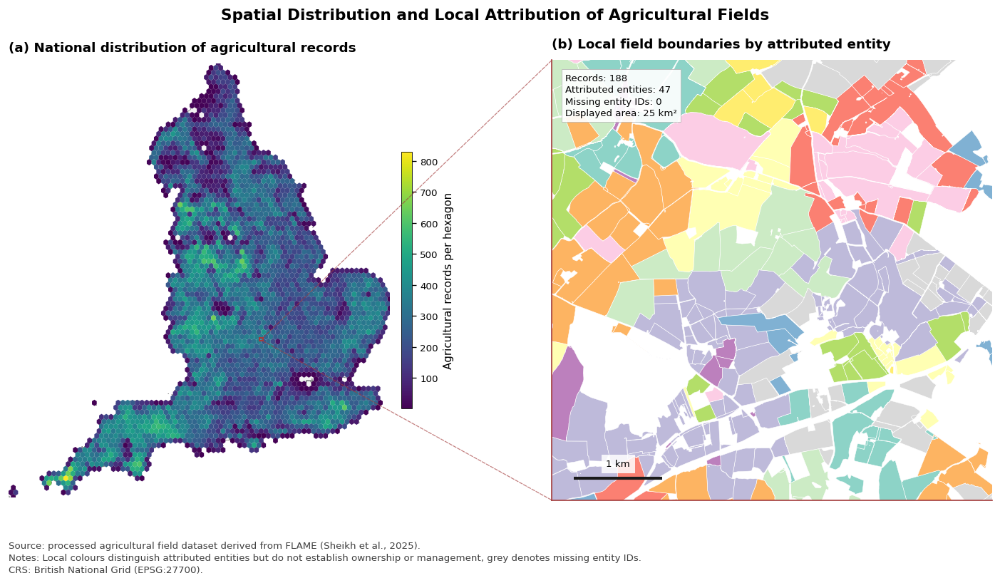

Saved figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/agricultural_field_coverage.png
Saved vector figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/agricultural_field_coverage.pdf


In [ ]:
# National coverage and local entity structure of the agricultural dataset

if agriculture.crs is None or england.crs is None:
    raise ValueError("The agricultural and England layers must have a known CRS.")

fields = agriculture.to_crs(27700)
boundary = england.to_crs(27700)
valid = (fields.geometry.notna() & ~fields.geometry.is_empty
         & fields.geom_type.isin(["Polygon", "MultiPolygon"]))
fields = fields.loc[valid].copy()

xmin, xmax, ymin, ymax = 460_000, 465_000, 240_000, 245_000
zoom = fields.cx[xmin:xmax, ymin:ymax].copy()
if zoom.empty:
    raise ValueError("No agricultural records intersect the selected zoom window.")

zoom["entity_id"] = zoom["entity_id"].astype("string").str.strip().replace("", pd.NA)
codes, entities = pd.factorize(zoom["entity_id"], sort=True)

style = {"font.family": "DejaVu Sans", "font.size": 9, "axes.titlesize": 11,
         "axes.titleweight": "semibold", "figure.titlesize": 14,
         "savefig.dpi": 300}

with plt.rc_context(style):
    fig, (ax1, ax2) = plt.subplots(
        1, 2, figsize=(12.5, 7.4),
        gridspec_kw={"width_ratios": [1.05, 1]}
    )
    fig.subplots_adjust(left=.045, right=.965, top=.87, bottom=.17, wspace=.18)

    # National distribution
    west, south, east, north = boundary.total_bounds
    points = fields.geometry.representative_point()
    boundary.plot(ax=ax1, color="#F2F2F2", edgecolor="#8C8C8C", linewidth=.45)
    hb = ax1.hexbin(
        points.x, points.y, gridsize=80,
        extent=(west, east, south, north),
        cmap="viridis", mincnt=1, linewidths=0, rasterized=True
    )
    cb = fig.colorbar(hb, ax=ax1, shrink=.58, pad=.025, aspect=25)
    cb.set_label("Agricultural records per hexagon", fontsize=9)
    cb.ax.tick_params(labelsize=8)
    cb.outline.set_linewidth(.5)

    ax1.add_patch(mpatches.Rectangle(
        (xmin, ymin), xmax - xmin, ymax - ymin,
        fill=False, edgecolor="#A33B3B", linewidth=1.2, zorder=5
    ))
    ax1.set(xlim=(west, east), ylim=(south, north), aspect="equal")
    ax1.set_title("(a) National distribution of agricultural records",
                  loc="left", pad=10)
    ax1.set_axis_off()

    # Local entity structure
    palette = plt.get_cmap("Set3")(
        np.linspace(.05, .95, max(len(entities), 1))
    )
    colours = [palette[c] if c >= 0 else "#CFCFCF" for c in codes]
    zoom.plot(ax=ax2, color=colours, edgecolor="white", linewidth=.35)
    ax2.set(xlim=(xmin, xmax), ylim=(ymin, ymax), aspect="equal",
            xticks=[], yticks=[])
    ax2.set_title("(b) Local field boundaries by attributed entity",
                  loc="left", pad=10)

    for spine in ax2.spines.values():
        spine.set(color="#A33B3B", linewidth=1)

    # Inset connections
    for source, target in [((xmax, ymax), (0, 1)),
                           ((xmax, ymin), (0, 0))]:
        fig.add_artist(ConnectionPatch(
            xyA=source, coordsA=ax1.transData,
            xyB=target, coordsB=ax2.transAxes,
            color="#A33B3B", linewidth=.75,
            linestyle="--", alpha=.65, clip_on=False
        ))

    # Annotation and scale bar
    window_km2 = (xmax - xmin) * (ymax - ymin) / 1e6
    missing = zoom["entity_id"].isna().sum()
    box = {"facecolor": "white", "edgecolor": "#B3B3B3",
           "linewidth": .5, "alpha": .92, "boxstyle": "square,pad=0.4"}

    ax2.text(
        .03, .97,
        f"Records: {len(zoom):,}\nAttributed entities: {len(entities):,}\n"
        f"Missing entity IDs: {missing:,}\nDisplayed area: {window_km2:g} km²",
        transform=ax2.transAxes, va="top", fontsize=8,
        linespacing=1.35, bbox=box
    )

    bar_x, bar_y = xmin + 250, ymin + 250
    ax2.plot([bar_x, bar_x + 1_000], [bar_y, bar_y],
             color="#1A1A1A", linewidth=2.5, solid_capstyle="butt")
    ax2.text(
        bar_x + 500, bar_y + 110, "1 km",
        ha="center", va="bottom", fontsize=8,
        bbox={"facecolor": "white", "edgecolor": "none", "alpha": .85}
    )

    fig.suptitle(
        "Spatial Distribution and Local Attribution of Agricultural Fields",
        y=.95, fontweight="semibold"
    )
    fig.text(
        .045, .055,
        "Source: processed agricultural field dataset derived from FLAME "
        "(Sheikh et al., 2025).\n"
        "Notes: Local colours distinguish attributed entities but do not establish "
        "ownership or management, grey denotes missing entity IDs.\n"
        "CRS: British National Grid (EPSG:27700).",
        fontsize=8, color="#3F3F3F", linespacing=1.4, va="bottom"
    )

    png_path = FIG / "agricultural_field_coverage.png"
    pdf_path = FIG / "agricultural_field_coverage.pdf"
    save_dissertation_figure(fig, png_path, dpi=300, bbox_inches="tight", facecolor="white")
    save_dissertation_figure(fig, pdf_path, bbox_inches="tight", facecolor="white")
    plt.show()
    plt.close(fig)

print(f"Saved figure: {png_path}")
print(f"Saved vector figure: {pdf_path}")


PERCENTAGE DIFFERENCE IN AREA ESTIMATES
count    6.826230e+05
mean     3.359260e+02
std      8.211669e+04
min     -4.370000e-01
1%      -4.500000e-02
5%      -1.800000e-02
25%      5.600000e-02
50%      8.700000e-02
75%      9.600000e-02
95%      9.800000e-02
99%      1.270000e-01
max      4.869017e+07
Name: area_diff_pct, dtype: float64

Records differing by more than 5%: 0.6%


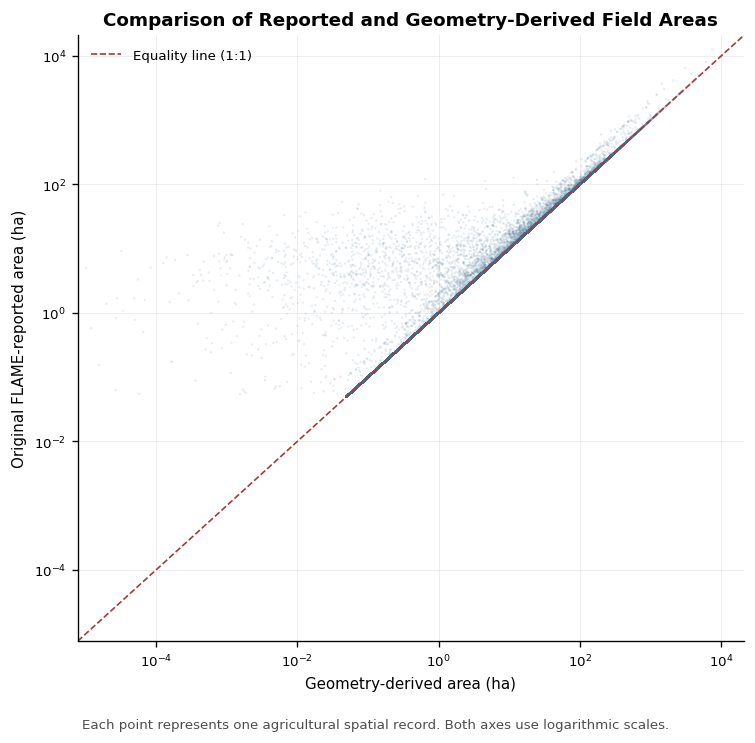

Saved figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/flame_area_comparison.png
Saved vector figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/flame_area_comparison.pdf


In [ ]:
# Compare reported and geometry-derived areas
area_geom = pd.to_numeric(agriculture["size_ha"], errors="coerce")
area_reported = pd.to_numeric(agriculture["area_flame"], errors="coerce")
comparable = area_geom.gt(0) & area_reported.gt(0)

# Positive values indicate that FLAME reports a larger area.
agriculture["area_diff_pct"] = np.nan
agriculture.loc[comparable, "area_diff_pct"] = (
    100 * (area_reported[comparable] - area_geom[comparable])
    / area_geom[comparable]
)

print("PERCENTAGE DIFFERENCE IN AREA ESTIMATES")
print(
    agriculture.loc[comparable, "area_diff_pct"]
    .describe(percentiles=[.01, .05, .25, .50, .75, .95, .99])
    .round(3)
)
print(
    "\nRecords differing by more than 5%: "
    f"{agriculture.loc[comparable, 'area_diff_pct'].abs().gt(5).mean():.1%}"
)

style = {
    "font.size": 9,
    "axes.titlesize": 11,
    "axes.titleweight": "semibold",
    "figure.titlesize": 13,
}

with plt.rc_context(style):
    fig, ax = plt.subplots(figsize=(6.4, 6.2))

    ax.scatter(
        area_geom[comparable],
        area_reported[comparable],
        s=2,
        alpha=.12,
        color="#3F6F8F",
        edgecolors="none",
        rasterized=True
    )

    lower = min(area_geom[comparable].min(), area_reported[comparable].min())
    upper = max(area_geom[comparable].max(), area_reported[comparable].max())

    ax.plot(
        [lower, upper], [lower, upper],
        color="#A33B3B",
        linestyle="--",
        linewidth=1,
        label="Equality line (1:1)"
    )
    ax.set(
        xscale="log",
        yscale="log",
        xlim=(lower, upper),
        ylim=(lower, upper),
        xlabel="Geometry-derived area (ha)",
        ylabel="Original FLAME-reported area (ha)",
        title="Comparison of Reported and Geometry-Derived Field Areas"
    )
    ax.grid(color="#D9D9D9", linewidth=.45, alpha=.6)
    ax.legend(frameon=False, loc="upper left")

    fig.text(
        .5, .015,
        "Each point represents one agricultural spatial record. "
        "Both axes use logarithmic scales.",
        ha="center",
        fontsize=8,
        color="#4D4D4D"
    )
    fig.tight_layout(rect=[0, .04, 1, 1])

    area_png = FIG / "flame_area_comparison.png"
    area_pdf = FIG / "flame_area_comparison.pdf"
    save_dissertation_figure(fig, area_png, dpi=300, bbox_inches="tight", facecolor="white")
    save_dissertation_figure(fig, area_pdf, bbox_inches="tight", facecolor="white")
    plt.show()
    plt.close(fig)

print(f"Saved figure: {area_png}")
print(f"Saved vector figure: {area_pdf}")

Farm: 0 entities excluded from area panel (missing, non-finite or non-positive area).
Owner: 0 entities excluded from area panel (missing, non-finite or non-positive area).


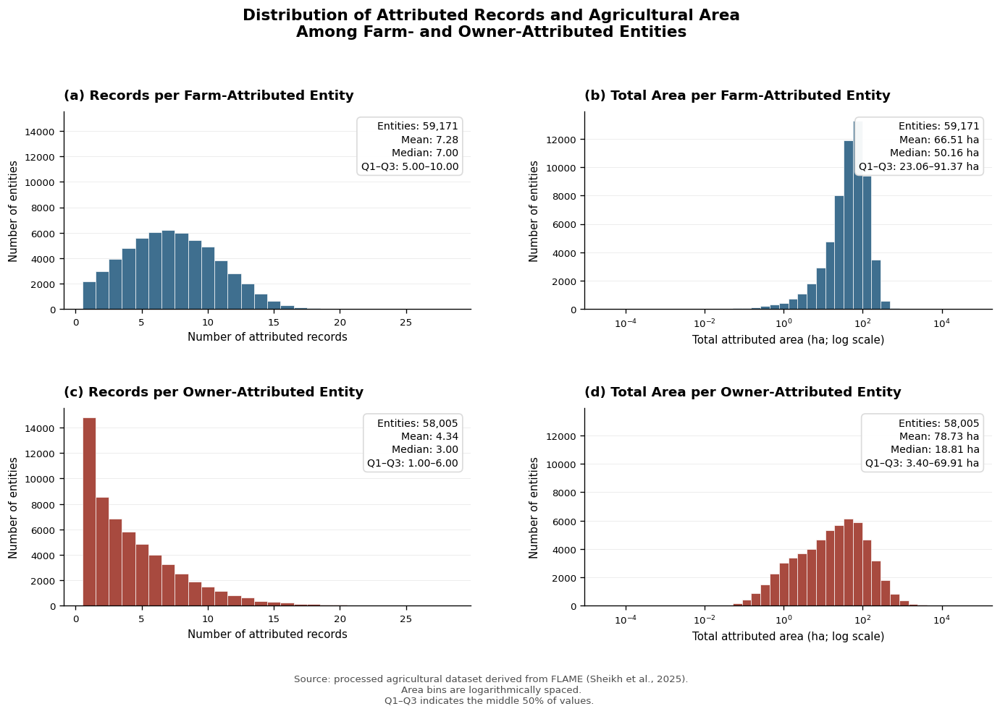

Saved figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/farm_owner_entity_distributions.png
Saved vector figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/farm_owner_entity_distributions.pdf


In [ ]:
# Summarise farm- and owner-attributed entities
entity_summaries = {}

for source in ["farm", "owner"]:
    records = agriculture.loc[
        agriculture["flame_source"].eq(source)
        & agriculture["entity_id"].notna()
    ]

    entity_summaries[source] = (
        records.groupby("entity_id")
        .agg(
            n_fields=("field_id", "nunique"),
            total_ha=("size_ha", lambda x: x.sum(min_count=1))
        )
    )


def annotate_stats(ax, values, unit=""):
    """Annotate statistics for the values displayed in a panel."""
    values = values.dropna()

    if values.empty:
        text = "No eligible observations"
    else:
        q1, q3 = values.quantile([.25, .75])
        text = (
            f"Entities: {len(values):,}\n"
            f"Mean: {values.mean():,.2f}{unit}\n"
            f"Median: {values.median():,.2f}{unit}\n"
            f"Q1–Q3: {q1:,.2f}–{q3:,.2f}{unit}"
        )

    ax.text(
        .97, .95,
        text,
        transform=ax.transAxes,
        ha="right",
        va="top",
        fontsize=8.5,
        linespacing=1.4,
        bbox=dict(
            boxstyle="round,pad=0.4",
            facecolor="white",
            edgecolor="#D9D9D9",
            alpha=.95
        )
    )


# Shared bins across farm and owner panels
all_counts = np.concatenate([
    data["n_fields"].to_numpy()
    for data in entity_summaries.values()
])
all_areas = np.concatenate([
    data["total_ha"].to_numpy()
    for data in entity_summaries.values()
])

positive_areas = all_areas[
    np.isfinite(all_areas) & (all_areas > 0)
]

if positive_areas.size == 0:
    raise ValueError("No positive, finite areas available for a log axis.")

# One bin per integer record count
count_bins = np.arange(
    all_counts.min() - .5,
    all_counts.max() + 1.5,
    1
)

area_min, area_max = positive_areas.min(), positive_areas.max()
if area_min == area_max:
    area_min, area_max = area_min / 2, area_max * 2

area_bins = np.geomspace(area_min, area_max, 41)
colors = {"farm": "#3F6F8F", "owner": "#A84A3F"}

with plt.rc_context(style):
    fig, axes = plt.subplots(
        2, 2,
        figsize=(12, 8.5),
        sharex="col",
        sharey="col"
    )
    fig.subplots_adjust(
        left=.09, right=.98, top=.83,
        bottom=.16, wspace=.28, hspace=.50
    )

    excluded_total = 0

    for row, source in enumerate(["farm", "owner"]):
        data = entity_summaries[source]
        label = source.capitalize()
        count_ax, area_ax = axes[row]

        valid_area = (
            np.isfinite(data["total_ha"])
            & data["total_ha"].gt(0)
        )
        area_values = data.loc[valid_area, "total_ha"]

        excluded = int((~valid_area).sum())
        excluded_total += excluded
        print(
            f"{label}: {excluded:,} entities excluded from area panel "
            "(missing, non-finite or non-positive area)."
        )

        hist_style = dict(
            color=colors[source],
            edgecolor="white",
            linewidth=.4
        )

        count_ax.hist(
            data["n_fields"],
            bins=count_bins,
            **hist_style
        )
        count_ax.set_title(
            f"({chr(97 + row * 2)}) Records per {label}-Attributed Entity",
            loc="left", pad=10
        )
        count_ax.set_xlabel("Number of attributed records")
        annotate_stats(count_ax, data["n_fields"])

        area_ax.hist(
            area_values,
            bins=area_bins,
            **hist_style
        )
        area_ax.set_xscale("log")
        area_ax.set_title(
            f"({chr(98 + row * 2)}) Total Area per {label}-Attributed Entity",
            loc="left", pad=10
        )
        area_ax.set_xlabel("Total attributed area (ha; log scale)")
        annotate_stats(area_ax, area_values, unit=" ha")

        for ax in axes[row]:
            ax.set_ylabel("Number of entities")
            ax.spines[["top", "right"]].set_visible(False)
            ax.grid(
                axis="y", color="#D9D9D9",
                linewidth=.45, alpha=.6
            )
            ax.set_axisbelow(True)
            ax.tick_params(axis="x", labelbottom=True)

    fig.suptitle(
        "Distribution of Attributed Records and Agricultural Area\n"
        "Among Farm- and Owner-Attributed Entities",
        y=.97,
        fontweight="semibold"
    )

    fig.text(
        .5, .025,
        "Source: processed agricultural dataset derived from FLAME "
        "(Sheikh et al., 2025).\n"
        "Area bins are logarithmically spaced.\n"
        "Q1–Q3 indicates the middle 50% of values. ",
        ha="center", va="bottom",
        fontsize=8, color="#4D4D4D"
    )

    entity_png = FIG / "farm_owner_entity_distributions.png"
    entity_pdf = FIG / "farm_owner_entity_distributions.pdf"

    save_dissertation_figure(fig, entity_png, dpi=300, bbox_inches="tight", facecolor="white")
    save_dissertation_figure(fig, entity_pdf, bbox_inches="tight", facecolor="white")
    plt.show()
    plt.close(fig)

print(f"Saved figure: {entity_png}")
print(f"Saved vector figure: {entity_pdf}")

In [ ]:
summary_rows = []
outlier_tables = []

for source, data in entity_summaries.items():
    for metric in ["n_fields", "total_ha"]:
        values = data[metric].dropna()

        if values.empty:
            continue

        q1 = values.quantile(.25)
        q3 = values.quantile(.75)
        iqr = q3 - q1

        iqr_limit = q3 + 1.5 * iqr
        extreme_limit = q3 + 3 * iqr
        p99 = values.quantile(.99)

        summary_rows.append({
            "attribution": source,
            "metric": metric,
            "entities": len(values),
            "median": values.median(),
            "99th_percentile": p99,
            "IQR_upper_limit": iqr_limit,
            "maximum": values.max(),
            "above_99th": int(values.gt(p99).sum()),
            "above_IQR_limit": int(values.gt(iqr_limit).sum()),
            "above_3IQR_limit": int(values.gt(extreme_limit).sum())
        })

        flagged = data.loc[
            data[metric].gt(p99) | data[metric].gt(iqr_limit)
        ].copy()

        flagged["attribution"] = source
        flagged["flagged_metric"] = metric
        flagged["above_99th"] = flagged[metric].gt(p99)
        flagged["above_IQR_limit"] = flagged[metric].gt(iqr_limit)
        flagged["above_3IQR_limit"] = flagged[metric].gt(extreme_limit)

        outlier_tables.append(flagged.reset_index())

outlier_summary = pd.DataFrame(summary_rows)
outlier_entities = (
    pd.concat(outlier_tables, ignore_index=True)
    if outlier_tables else pd.DataFrame()
)

print("OUTLIER THRESHOLDS AND COUNTS")
print(outlier_summary.round(2).to_string(index=False))

# Show the largest entities, with both metrics for context
for source, data in entity_summaries.items():
    for metric in ["n_fields", "total_ha"]:
        print(f"\n{source.upper()}: TOP 10 BY {metric}")
        print(
            data.nlargest(10, metric)
            .round(2)
            .to_string()
        )

OUTLIER THRESHOLDS AND COUNTS
attribution   metric  entities  median  99th_percentile  IQR_upper_limit  maximum  above_99th  above_IQR_limit  above_3IQR_limit
       farm n_fields     59171    7.00            15.00            17.50    20.00         521               59                 0
       farm total_ha     59171   50.16           285.68           193.85   957.69         592             2568               488
      owner n_fields     58005    3.00            16.00            13.50    28.00         468             1355                61
      owner total_ha     58005   18.81           832.16           169.69 61978.06         581             6226              3425

FARM: TOP 10 BY n_fields
                n_fields  total_ha
entity_id                         
FARM_FARM13574        20    170.85
FARM_FARM27823        20    257.84
FARM_FARM49727        20    357.06
FARM_FARM56388        20    227.21
FARM_FARM02207        19    350.79
FARM_FARM22948        19    295.31
FARM_FARM29927     

The Rural Payments Agency (RPA) has a spatial dataset representing the approximate centres of agricultural land parcels registered in England. A point-in-polygon comparison was used between the RPA register and FLAME to understand representativeness. The code checks whether the RPA centre-point falls inside a FLAME field.

**RPA Coverage by Region**

| Region | RPA parcels | Captured | Capture rate (%) |
|---|---:|---:|---:|
| East Midlands | 286,550 | 218,718 | 76.3 |
| Yorkshire and The Humber | 293,423 | 220,046 | 75.0 |
| West Midlands | 319,250 | 235,748 | 73.8 |
| South West | 711,914 | 523,864 | 73.6 |
| East of England | 284,515 | 207,881 | 73.1 |
| North West | 319,104 | 228,490 | 71.6 |
| North East | 127,913 | 89,335 | 69.8 |
| South East | 337,243 | 234,157 | 69.4 |
| London | 5,522 | 2,782 | 50.4 |
| Unassigned | 669 | 74 | 11.1 |

### CROME dataset: crop type <a class="anchor" id="CROME-dataset:-crop-type"></a>

Crop Map of England (CROME) codes were first changed into crop names and then aggregated into the broader land cover groups used in the analysis: cereal crops, leguminous crops, grassland, non-agricultural land, water and trees(Appendix 1).

The 2024 CROME layer was intersected with the agricultural field records. Where a field intersected more than one CROME crop class, the area associated with each class was calculated. CROME classification probability was multiplied by the intersected area to produce a confidence-weighted area. The crop class with the greatest confidence-weighted area was assigned as the field’s principal 2024 crop type. `crop_type_purity` measures the proportion of the field’s mapped CROME overlap occupied by the selected crop class, while `crop_prob` records the area-weighted mean CROME probability for that class.

The earlier FLAME crop labels are stored in `crop_2020`, with residual codes such as HEAT and WA00 standardised to Heather and Water. The assigned 2024 CROME crop labels are stored in `crop_type`. Both columns were regrouped using the same name-to-group mapping, producing `lu_flame` and `lu_crome`. The final analytical variable, `land_use`, copies `lu_crome`. Missing and unmapped labels remain without a group assignment.

Comparisons between `crop_2020` and `crop_type` should be interpreted cautiously. Differences may indicate crop rotation or land-use change between the reference years, but they may also come from changes in classification methods, spatial resolution, source coverage, field boundaries or classification uncertainty. Agreement at the broader land-use level is therefore likely to provide a more stable measure of change than exact agreement between individual crop types.

The combined checkpoint dataset has the following attributes added:

| Attribute | Description |
|---|---|
| `crop_2020` | Original FLAME crop label. |
| `crop_type` | Confidence-weighted dominant CROME 2024 crop. |
| `crop_type_purity` | Winning class’s area divided by total intersected area. |
| `crop_prob` | Area-weighted mean CROME confidence for the winning class. |
| `lu_flame`, `lu_crome` | Analytical groups for 2020 and 2024, respectively. |
| `land_use` | Copy of the 2024 analytical group for subsequent analysis. |

In [ ]:
# CROME classification analysis

BASELINE_LABEL = "Earlier FLAME (2020)"
CURRENT_LABEL = "CROME 2024"

required = {
    "field_id", "size_ha", "crop_2020", "crop_type",
    "lu_flame", "lu_crome", "land_use",
    "crop_type_purity", "crop_prob"
}
missing = required - set(agriculture.columns)
if missing:
    raise KeyError(f"Missing required columns: {', '.join(sorted(missing))}")

if agriculture.crs is None:
    raise ValueError("The agricultural dataset has no CRS.")

# Prepare a non-spatial comparison table.
comparison = agriculture[list(required)].copy()
comparison["size_ha"] = pd.to_numeric(comparison["size_ha"], errors="coerce")
comparison["crop_type_purity"] = pd.to_numeric(
    comparison["crop_type_purity"], errors="coerce"
)
comparison["crop_prob"] = pd.to_numeric(
    comparison["crop_prob"], errors="coerce"
)

for col in ["crop_2020", "crop_type", "lu_flame", "lu_crome", "land_use"]:
    comparison[col] = (
        comparison[col]
        .astype("string")
        .str.strip()
        .replace("", pd.NA)
    )

total_records = len(comparison)
valid_area = comparison["size_ha"].gt(0)
total_area = comparison.loc[valid_area, "size_ha"].sum()

print("CROME ANALYSIS SUMMARY")
print(f"Dataset records: {total_records:,}")
print(f"Total mapped area: {total_area:,.1f} ha")
print(f"CRS: {agriculture.crs}")

CROME ANALYSIS SUMMARY
Dataset records: 682,623
Total mapped area: 8,502,168.5 ha
CRS: EPSG:27700


In [ ]:
# Table 1: data-quality checks for the regrouped dataset
required = [
    "field_id", "size_ha", "crop_2020", "crop_type",
    "lu_flame", "lu_crome", "land_use",
    "crop_type_purity", "crop_prob"
]

missing = set(required) - set(agriculture.columns)
if missing:
    raise KeyError(f"Missing required columns: {', '.join(sorted(missing))}")

# Rebuild comparison from the current dataset.
comparison = pd.DataFrame(agriculture[required].copy())

for col in [
    "field_id", "crop_2020", "crop_type",
    "lu_flame", "lu_crome", "land_use"
]:
    comparison[col] = (
        comparison[col]
        .astype("string")
        .str.strip()
        .replace("", pd.NA)
    )

for col in ["size_ha", "crop_type_purity", "crop_prob"]:
    comparison[col] = pd.to_numeric(comparison[col], errors="coerce")

total_records = len(comparison)
if total_records == 0:
    raise ValueError("The agricultural dataset is empty.")

has_crop = comparison["crop_type"].notna()
has_baseline_crop = comparison["crop_2020"].notna()
has_current_group = comparison["lu_crome"].notna()
has_baseline_group = comparison["lu_flame"].notna()

purity = comparison["crop_type_purity"]
probability = comparison["crop_prob"]

has_purity = purity.notna()
has_probability = probability.notna()

valid_purity = np.isfinite(purity) & purity.between(0, 1)
valid_probability = (
    np.isfinite(probability) & probability.between(0, 1)
)

complete = has_crop & has_purity & has_probability
complete_valid = has_crop & valid_purity & valid_probability

valid_area = (
    np.isfinite(comparison["size_ha"])
    & comparison["size_ha"].gt(0)
)
comparison["analysis_area_ha"] = comparison["size_ha"].where(valid_area)
total_area = comparison["analysis_area_ha"].sum()

same_group = (
    comparison["land_use"].eq(comparison["lu_crome"]).fillna(False)
    | (
        comparison["land_use"].isna()
        & comparison["lu_crome"].isna()
    )
)

ids = comparison["field_id"]
duplicate_ids = ids.notna() & ids.duplicated(keep=False)

geometry = agriculture.geometry
missing_geometry = geometry.isna()
empty_geometry = geometry.is_empty
invalid_geometry = (
    ~missing_geometry
    & ~empty_geometry
    & ~geometry.is_valid
)

checks = {
    "Total agricultural records": total_records,
    "Records assigned a CROME crop": has_crop.sum(),
    "Records without a CROME crop": (~has_crop).sum(),
    "Records with a FLAME group": has_baseline_group.sum(),
    "Records with a CROME group": has_current_group.sum(),
    "FLAME crop present but group missing": (
        has_baseline_crop & ~has_baseline_group
    ).sum(),
    "CROME crop present but group missing": (
        has_crop & ~has_current_group
    ).sum(),
    "land_use differs from lu_crome": (~same_group).sum(),
    "Complete crop, purity and probability": complete.sum(),
    "Crop present with valid purity and probability": complete_valid.sum(),
    "Crop assigned but purity missing/non-numeric": (
        has_crop & ~has_purity
    ).sum(),
    "Crop assigned but probability missing/non-numeric": (
        has_crop & ~has_probability
    ).sum(),
    "Purity outside 0–1 or infinite": (
        has_purity & ~valid_purity
    ).sum(),
    "Probability outside 0–1 or infinite": (
        has_probability & ~valid_probability
    ).sum(),
    "Missing or blank field identifiers": ids.isna().sum(),
    "Records sharing a duplicated field identifier": duplicate_ids.sum(),
    "Missing, non-finite or non-positive areas": (~valid_area).sum(),
    "Missing geometries": missing_geometry.sum(),
    "Empty geometries": empty_geometry.sum(),
    "Invalid non-empty geometries": invalid_geometry.sum()
}

qa_table = pd.DataFrame({
    "Measure": list(checks),
    "Records": [int(value) for value in checks.values()]
})

qa_table["Share of records (%)"] = (
    100 * qa_table["Records"] / total_records
)

print("\nTable 1. CROME data-quality assessment")
display(
    qa_table.style
    .hide(axis="index")
    .format({
        "Records": "{:,.0f}",
        "Share of records (%)": "{:.2f}"
    })
)
save_table(qa_table, "crome_quality_assessment")

print(
    f"Median crop purity (assigned crops, valid values): "
    f"{purity.loc[has_crop & valid_purity].median():.3f}"
)
print(
    f"Median CROME probability (assigned crops, valid values): "
    f"{probability.loc[has_crop & valid_probability].median():.3f}"
)
print(f"CROME crop coverage: {has_crop.mean():.2%}")
print(f"CROME group coverage: {has_current_group.mean():.2%}")
print(f"FLAME group coverage: {has_baseline_group.mean():.2%}")


Table 1. CROME data-quality assessment


Measure,Records,Share of records (%)
Total agricultural records,"682,623",100.00
Records assigned a CROME crop,"682,623",100.00
Records without a CROME crop,0,0.00
Records with a FLAME group,"628,145",92.02
Records with a CROME group,"682,125",99.93
FLAME crop present but group missing,"54,478",7.98
CROME crop present but group missing,498,0.07
land_use differs from lu_crome,0,0.00
"Complete crop, purity and probability","682,125",99.93
Crop present with valid purity and probability,"682,125",99.93


saved table: crome_quality_assessment.csv
Median crop purity (assigned crops, valid values): 0.738
Median CROME probability (assigned crops, valid values): 0.452
CROME crop coverage: 100.00%
CROME group coverage: 99.93%
FLAME group coverage: 92.02%


In [ ]:
# Table 2: CROME 2024 crop distribution
crop_data = comparison.assign(
    crop_2024=comparison["crop_type"].fillna("Unclassified")
)

crop_distribution = (
    crop_data.groupby("crop_2024", as_index=False)
    .agg(
        records=("field_id", "nunique"),
        area_ha=("size_ha", "sum")
    )
    .rename(columns={"crop_2024": "CROME 2024 crop"})
)

crop_distribution["Record share (%)"] = (
    100 * crop_distribution["records"] / total_records
)
crop_distribution["Area share (%)"] = (
    100 * crop_distribution["area_ha"] / total_area
)
crop_distribution = (
    crop_distribution
    .rename(columns={"records": "Records", "area_ha": "Area (ha)"})
    .sort_values("Area (ha)", ascending=False)
    .reset_index(drop=True)
)

print("\nTable 2. CROME 2024 crop distribution")
display(
    crop_distribution.head(25).style
    .hide(axis="index")
    .format({
        "Records": "{:,.0f}",
        "Area (ha)": "{:,.1f}",
        "Record share (%)": "{:.2f}",
        "Area share (%)": "{:.2f}",
    })
)


Table 2. CROME 2024 crop distribution


CROME 2024 crop,Records,Area (ha),Record share (%),Area share (%)
Grass,"353,476","4,045,904.0",51.78,47.59
Winter Wheat,"57,051","1,752,900.0",8.36,20.62
"Trees and Scrubs, Short Woody Plants, Hedgerows","129,271","564,407.7",18.94,6.64
Maize,"34,621","484,380.9",5.07,5.70
Spring Barley,"22,735","455,842.6",3.33,5.36
Winter Barley,"17,058","377,246.4",2.50,4.44
Winter Oilseed,"9,788","287,331.8",1.43,3.38
Fallow Land,"9,072","132,549.5",1.33,1.56
Beet,"4,395","112,061.5",0.64,1.32
Potato,"3,685","60,393.8",0.54,0.71


In [ ]:
# Table 3: agreement between classifications
def agreement_summary(label, earlier, current):
    valid = comparison[earlier].notna() & comparison[current].notna()
    equal = (
        comparison.loc[valid, earlier].str.casefold()
        == comparison.loc[valid, current].str.casefold()
    )

    weights = comparison.loc[valid, "size_ha"]
    weighted = weights.notna() & weights.gt(0)
    weighted_agreement = (
        np.average(equal[weighted], weights=weights[weighted])
        if weighted.any() else np.nan
    )

    return {
        "Comparison": label,
        "Comparable records": valid.sum(),
        "Record agreement (%)": 100 * equal.mean(),
        "Area-weighted agreement (%)": 100 * weighted_agreement,
        "Non-matching records": (~equal).sum(),
    }

agreement = pd.DataFrame([
    agreement_summary(
        "Exact crop type", "crop_2020", "crop_type"
    ),
    agreement_summary(
        "Broad land-use group", "lu_flame", "lu_crome"
    ),
])

print("\nTable 4. Agreement between classifications")
display(
    agreement.style
    .hide(axis="index")
    .format({
        "Comparable records": "{:,.0f}",
        "Record agreement (%)": "{:.2f}",
        "Area-weighted agreement (%)": "{:.2f}",
        "Non-matching records": "{:,.0f}",
    })
)


Table 4. Agreement between classifications


Comparison,Comparable records,Record agreement (%),Area-weighted agreement (%),Non-matching records
Exact crop type,"682,623",22.17,47.36,"531,275"
Broad land-use group,"627,913",43.89,75.05,"352,335"


In [ ]:
# Tables 5–6: broad land-use transitions
land_valid = (
    comparison["lu_flame"].notna()
    & comparison["lu_crome"].notna()
)

# Record-count transition matrix.
transition_count = pd.crosstab(
    comparison.loc[land_valid, "lu_flame"],
    comparison.loc[land_valid, "lu_crome"]
)

# Row-normalised transition matrix.
transition_pct = pd.crosstab(
    comparison.loc[land_valid, "lu_flame"],
    comparison.loc[land_valid, "lu_crome"],
    normalize="index"
).mul(100)

transition_pct.index.name = f"{BASELINE_LABEL} land use"
transition_pct.columns.name = f"{CURRENT_LABEL} land use"

print("\nTable 5. Land-use transition matrix (% of earlier class)")
display(transition_pct.round(1))
save_table(
    transition_pct.round(2).reset_index(),
    "land_use_transition_matrix"
)

# Area associated with each apparent change.
changed = comparison.loc[
    land_valid
    & comparison["lu_flame"].ne(comparison["lu_crome"])
    & valid_area
].copy()

top_transitions = (
    changed.groupby(["lu_flame", "lu_crome"], as_index=False)
    .agg(
        records=("field_id", "nunique"),
        area_ha=("size_ha", "sum")
    )
    .rename(columns={
        "lu_flame": "Earlier land use",
        "lu_crome": "CROME 2024 land use",
        "records": "Records",
        "area_ha": "Area (ha)",
    })
)

changed_area = top_transitions["Area (ha)"].sum()
top_transitions["Share of changed area (%)"] = (
    100 * top_transitions["Area (ha)"] / changed_area
)
top_transitions = top_transitions.sort_values(
    "Area (ha)", ascending=False
).reset_index(drop=True)

print("\nTable 6. Largest apparent land-use transitions")
display(
    top_transitions.head(20).style
    .hide(axis="index")
    .format({
        "Records": "{:,.0f}",
        "Area (ha)": "{:,.1f}",
        "Share of changed area (%)": "{:.2f}",
    })
)


Table 5. Land-use transition matrix (% of earlier class)


CROME 2024 land use,Cereal Crops,Grassland,Leguminous Crops,Non-Agricultural Land,Trees,Water
Earlier FLAME (2020) land use,,,,,,
Cereal Crops,43.8,43.4,1.4,2.5,9.0,0.0
Grassland,4.7,83.6,0.2,1.1,10.4,0.0
Leguminous Crops,16.2,56.2,0.8,4.3,22.5,0.0
Non-Agricultural Land,4.0,31.6,0.2,37.4,26.8,0.0
Trees,1.7,22.4,0.0,2.0,73.9,0.0
Water,8.7,44.9,0.0,10.9,9.4,26.1


saved table: land_use_transition_matrix.csv

Table 6. Largest apparent land-use transitions


Earlier land use,CROME 2024 land use,Records,Area (ha),Share of changed area (%)
Cereal Crops,Grassland,"119,302","801,304.3",38.38
Leguminous Crops,Grassland,"82,955","435,023.2",20.84
Leguminous Crops,Cereal Crops,"23,983","335,025.1",16.05
Leguminous Crops,Trees,"33,260","86,347.4",4.14
Grassland,Cereal Crops,"6,068","83,946.3",4.02
Cereal Crops,Trees,"24,861","72,589.2",3.48
Cereal Crops,Leguminous Crops,"3,717","69,955.8",3.35
Non-Agricultural Land,Grassland,"8,534","69,827.0",3.34
Grassland,Trees,"13,395","43,253.1",2.07
Trees,Grassland,"11,071","36,647.3",1.76


In [ ]:
# Table 7: classification quality by agreement status
comparison["Land-use status"] = pd.NA
comparison.loc[land_valid, "Land-use status"] = np.where(
    comparison.loc[land_valid, "lu_flame"].eq(
        comparison.loc[land_valid, "lu_crome"]
    ),
    "Unchanged",
    "Changed"
)

quality_by_status = (
    comparison.dropna(subset=["Land-use status"])
    .groupby("Land-use status", as_index=False)
    .agg(
        Records=("field_id", "nunique"),
        median_purity=("crop_type_purity", "median"),
        median_probability=("crop_prob", "median"),
        area_ha=("size_ha", "sum")
    )
    .rename(columns={
        "median_purity": "Median crop purity",
        "median_probability": "Median probability",
        "area_ha": "Area (ha)",
    })
)

print("\nTable 7. CROME quality by apparent land-use status")
display(
    quality_by_status.style
    .hide(axis="index")
    .format({
        "Records": "{:,.0f}",
        "Median crop purity": "{:.3f}",
        "Median probability": "{:.3f}",
        "Area (ha)": "{:,.1f}",
    })
)


Table 7. CROME quality by apparent land-use status


Land-use status,Records,Median crop purity,Median probability,Area (ha)
Changed,"352,335",0.720,0.418,"2,087,833.6"
Unchanged,"275,578",0.759,0.501,"6,280,433.5"


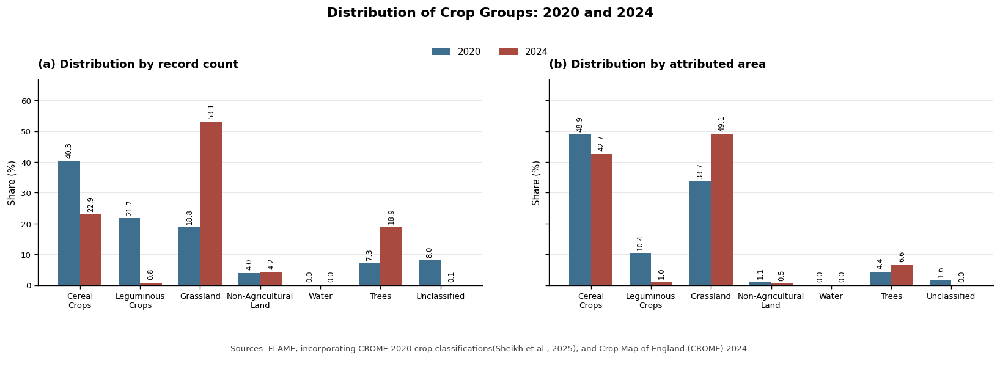

Saved figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/crop_groups_2020_vs_2024.png
Saved vector figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/crop_groups_2020_vs_2024.pdf


In [ ]:
# Use the updated groups in the regrouped dataset.
groups = [
    "Cereal Crops",
    "Leguminous Crops",
    "Grassland",
    "Non-Agricultural Land",
    "Water",
    "Trees",
    "Unclassified"
]

display_labels = [
    "Cereal\nCrops",
    "Leguminous\nCrops",
    "Grassland",
    "Non-Agricultural\nLand",
    "Water",
    "Trees",
    "Unclassified"
]

area = pd.to_numeric(agriculture["size_ha"], errors="coerce")
valid_area = np.isfinite(area) & area.gt(0)

if agriculture.empty or not valid_area.any():
    raise ValueError("The dataset must contain records and positive finite areas.")

record_pct = pd.DataFrame(index=groups)
area_pct = pd.DataFrame(index=groups)

for year, column in [("2020", "lu_flame"), ("2024", "lu_crome")]:
    labels = (
        agriculture[column]
        .astype("string")
        .str.strip()
        .replace("", pd.NA)
        .fillna("Unclassified")
    )

    # Catch old group labels instead of silently omitting them.
    unexpected = sorted(set(labels) - set(groups))
    if unexpected:
        raise ValueError(
            f"{column} contains unexpected groups: {unexpected}. "
            "Run the new grouping code first."
        )

    record_pct[year] = (
        labels.value_counts()
        .reindex(groups, fill_value=0)
        .div(len(agriculture))
        .mul(100)
    )

    area_pct[year] = (
        area.loc[valid_area]
        .groupby(labels.loc[valid_area])
        .sum()
        .reindex(groups, fill_value=0)
        .div(area.loc[valid_area].sum())
        .mul(100)
    )

academic_style = {
    "font.size": 9,
    "axes.titlesize": 11,
    "axes.titleweight": "semibold",
    "figure.titlesize": 13,
    "axes.spines.top": False,
    "axes.spines.right": False,
}

with plt.rc_context(academic_style):
    fig, axes = plt.subplots(
        1, 2, figsize=(14, 5.5), sharey=True
    )
    fig.subplots_adjust(
        left=.06, right=.99, top=.80,
        bottom=.29, wspace=.15
    )

    x = np.arange(len(groups))
    width = .36

    for ax, values, title in [
        (axes[0], record_pct, "(a) Distribution by record count"),
        (axes[1], area_pct, "(b) Distribution by attributed area")
    ]:
        ax.bar(
            x - width / 2,
            values["2020"],
            width,
            label="2020",
            color="#3F6F8F"
        )
        ax.bar(
            x + width / 2,
            values["2024"],
            width,
            label="2024",
            color="#A84A3F"
        )

        ax.set_title(title, loc="left", pad=12)
        ax.set_xticks(x)
        ax.set_xticklabels(display_labels, fontsize=8)
        ax.set_ylabel("Share (%)")
        ax.grid(axis="y", color="#D9D9D9", linewidth=.5, alpha=.7)
        ax.set_axisbelow(True)

        for container in ax.containers:
            ax.bar_label(
                container,
                fmt="%.1f",
                fontsize=7,
                padding=3,
                rotation=90
            )

    # Shared scale with space above the value labels.
    highest = max(record_pct.to_numpy().max(), area_pct.to_numpy().max())
    axes[0].set_ylim(0, highest * 1.22 + 2)

    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(
        handles, labels,
        loc="upper center",
        bbox_to_anchor=(.5, .9),
        ncol=2,
        frameon=False
    )

    fig.suptitle(
        "Distribution of Crop Groups: 2020 and 2024",
        y=.98,
        fontweight="semibold"
    )

    fig.text(
        .5, .1,
        "Sources: FLAME, incorporating CROME 2020 crop classifications"
        "(Sheikh et al., 2025), and Crop Map of England (CROME) 2024.\n",
        ha="center",
        va="bottom",
        fontsize=8,
        color="#444444"
    )

    FIG.mkdir(parents=True, exist_ok=True)
    summary_png = FIG / "crop_groups_2020_vs_2024.png"
    summary_pdf = FIG / "crop_groups_2020_vs_2024.pdf"

    save_dissertation_figure(fig,
        summary_png, dpi=300,
        bbox_inches="tight", facecolor="white"
    )
    save_dissertation_figure(fig,
        summary_pdf,
        bbox_inches="tight", facecolor="white"
    )
    plt.show()
    plt.close(fig)

print(f"Saved figure: {summary_png}")
print(f"Saved vector figure: {summary_pdf}")

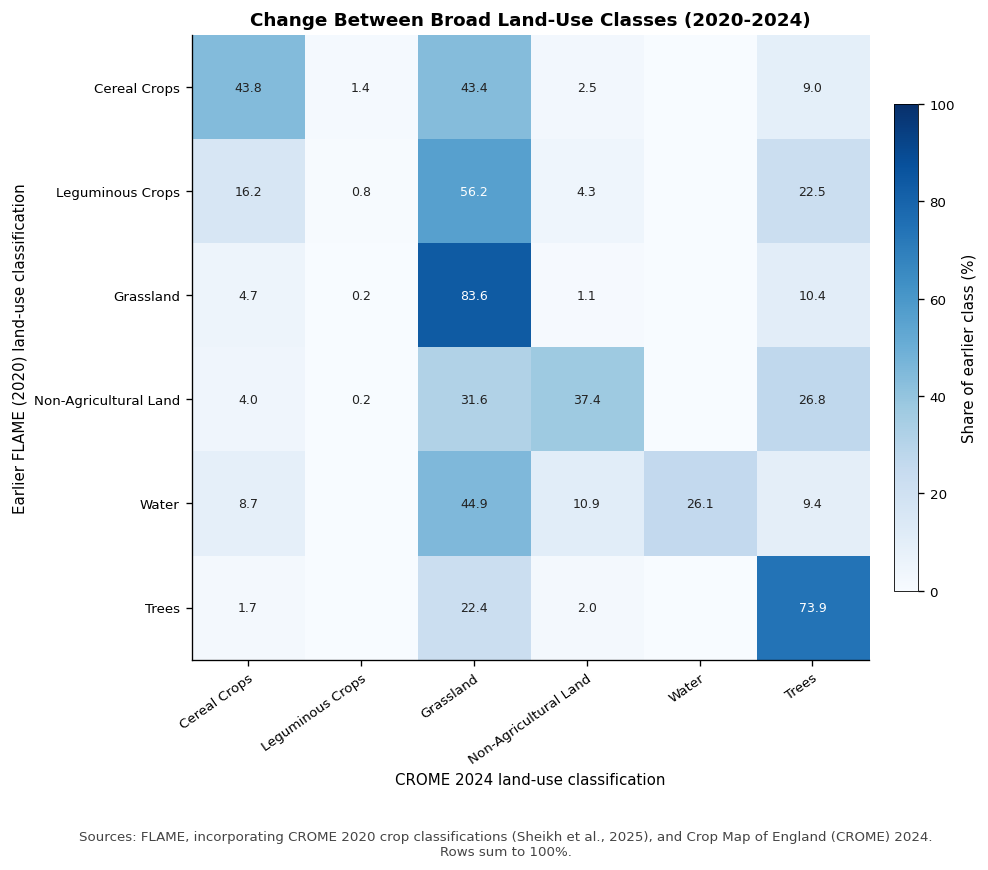

Saved figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/land_use_transition_matrix.png
Saved vector figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/land_use_transition_matrix.pdf


In [ ]:
# Figure 2: land-use transition heatmap

land_order = [
    "Cereal Crops",
    "Leguminous Crops",
    "Grassland",
    "Non-Agricultural Land",
    "Water",
    "Trees",
    "Unrecognised",
]

rows = [x for x in land_order if x in transition_pct.index]
columns = [x for x in land_order if x in transition_pct.columns]
matrix = transition_pct.reindex(
    index=rows, columns=columns, fill_value=0
)

with plt.rc_context(academic_style):
    fig, ax = plt.subplots(figsize=(8.8, 7.2))
    image = ax.imshow(
        matrix,
        cmap="Blues",
        vmin=0,
        vmax=100,
        aspect="auto"
    )

    ax.set(
        xticks=np.arange(len(columns)),
        yticks=np.arange(len(rows)),
        xticklabels=columns,
        yticklabels=rows,
        xlabel=f"{CURRENT_LABEL} land-use classification",
        ylabel=f"{BASELINE_LABEL} land-use classification",
        title="Change Between Broad Land-Use Classes (2020-2024)"
    )
    plt.setp(
        ax.get_xticklabels(),
        rotation=35,
        ha="right",
        rotation_mode="anchor"
    )

    for row in range(len(rows)):
        for column in range(len(columns)):
            value = matrix.iloc[row, column]
            if value >= .05:
                ax.text(
                    column, row, f"{value:.1f}",
                    ha="center", va="center", fontsize=7.5,
                    color="white" if value >= 50 else "#222222"
                )

    colourbar = fig.colorbar(image, ax=ax, shrink=.78, pad=.03)
    colourbar.set_label("Share of earlier class (%)")
    colourbar.outline.set_linewidth(.5)

    fig.text(
        .5, .001,
        "Sources: FLAME, incorporating CROME 2020 crop classifications"
        " (Sheikh et al., 2025), and Crop Map of England (CROME) 2024.\n"
        "Rows sum to 100%.",
        ha="center",
        va="bottom",
        fontsize=8,
        color="#444444"
    )

    fig.tight_layout(rect=[0, .05, 1, 1])

    heatmap_png = FIG / "land_use_transition_matrix.png"
    heatmap_pdf = FIG / "land_use_transition_matrix.pdf"
    save_dissertation_figure(fig,
        heatmap_png, dpi=300,
        bbox_inches="tight", facecolor="white"
    )
    save_dissertation_figure(fig,
        heatmap_pdf,
        bbox_inches="tight", facecolor="white"
    )
    plt.show()
    plt.close(fig)

print(f"Saved figure: {heatmap_png}")
print(f"Saved vector figure: {heatmap_pdf}")

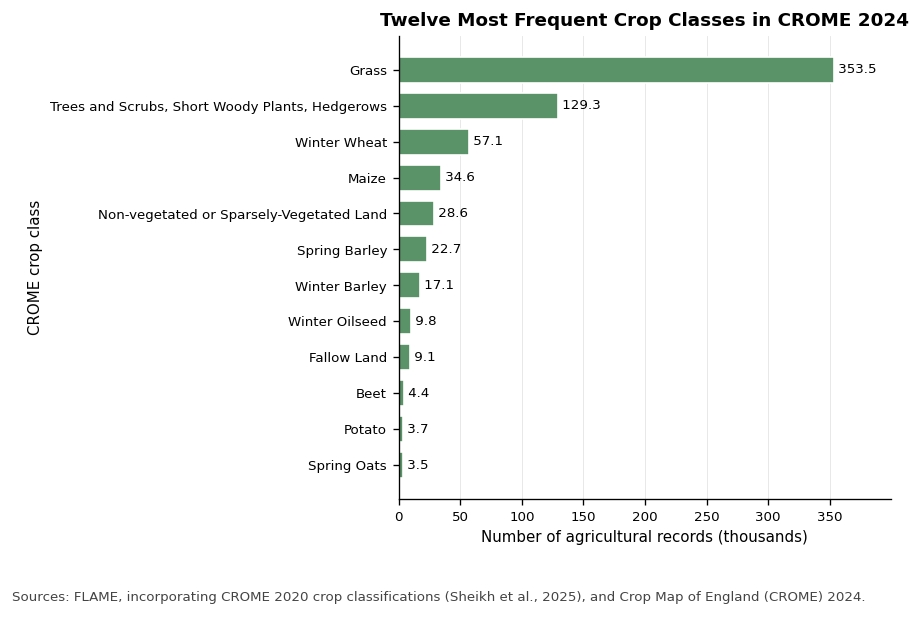

In [ ]:
# Twelve most frequent CROME 2024 crop classes
top_crops = (
    FIGBASE["crop_type"]
    .dropna()
    .value_counts()
    .head(12)
    .sort_values()
    .div(1_000)
)

fig, ax = plt.subplots(figsize=(7.8, 5.2))

bars = ax.barh(
    top_crops.index,
    top_crops,
    color="#5A9367",
    edgecolor="white",
    height=.72
)

for bar, value in zip(bars, top_crops):
    ax.text(
        value,
        bar.get_y() + bar.get_height() / 2,
        f" {value:,.1f}",
        va="center",
        fontsize=8
    )

ax.set(
    xlabel="Number of agricultural records (thousands)",
    ylabel="CROME crop class",
    title="Twelve Most Frequent Crop Classes in CROME 2024"
)
ax.margins(x=.13)
ax.spines[["top", "right"]].set_visible(False)
ax.grid(axis="x", color="#D9D9D9", linewidth=.5, alpha=.7)
ax.set_axisbelow(True)


fig.text(
        .5, .001,
        "Sources: FLAME, incorporating CROME 2020 crop classifications"
        " (Sheikh et al., 2025), and Crop Map of England (CROME) 2024.\n",
        ha="center",
        va="bottom",
        fontsize=8,
        color="#444444"
    )

fig.tight_layout(rect=[0, .09, 1, 1])

# Save directly, without finish() adding another source.
FIG.mkdir(parents=True, exist_ok=True)
for extension in ["png", "pdf"]:
    save_dissertation_figure(fig,
        FIG / f"P3_dominant_crop.{extension}",
        dpi=300,
        bbox_inches="tight",
        facecolor="white"
    )

plt.show()
plt.close(fig)

Saved figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/P6_regional_variation.png
Saved figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/P6_regional_variation.pdf


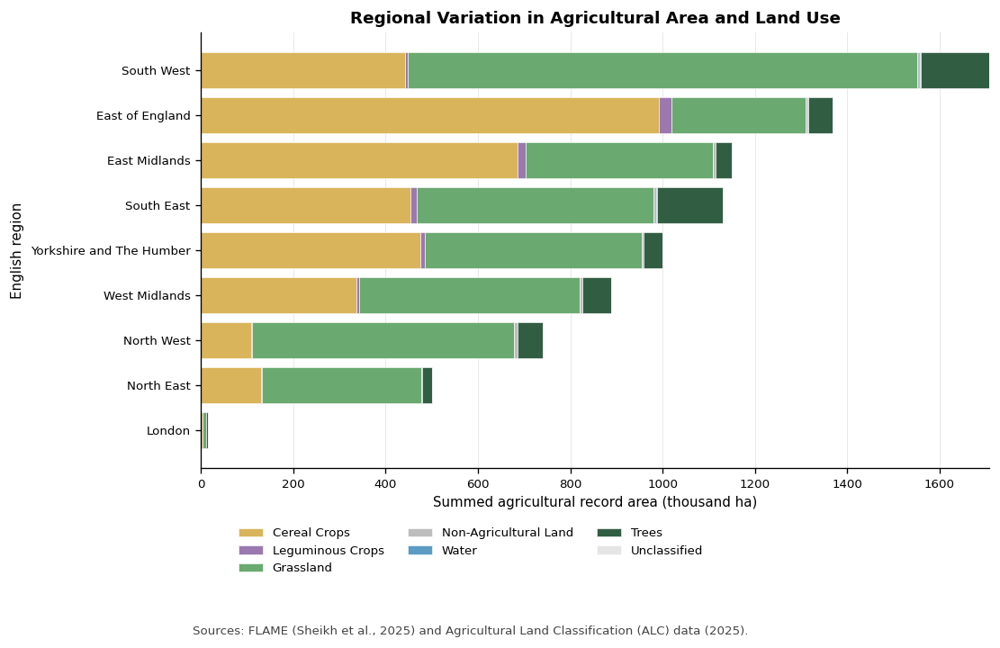

In [ ]:
# Regional variation in land use

if "region" not in FIGBASE.columns:
    print("P6 skipped: the 'region' column is unavailable.")

else:
    regional_land_use = (
        FIGBASE.assign(
            region=FIGBASE["region"].fillna("Unassigned")
        )
        .groupby(["region", "land_use_plot"])["size_ha"]
        .sum()
        .div(1_000)
        .unstack(fill_value=0)
        .reindex(columns=LU_ORDER, fill_value=0)
    )

    regional_land_use = regional_land_use.loc[
        regional_land_use.sum(axis=1).sort_values().index
    ]

    fig, ax = plt.subplots(figsize=(10, 6.4))
    fig.subplots_adjust(
        left=.25, right=.98, top=.90, bottom=.27
    )

    left = np.zeros(len(regional_land_use))

    for category in LU_ORDER:
        values = regional_land_use[category].to_numpy()

        ax.barh(
            regional_land_use.index,
            values,
            left=left,
            color=LU_COLOURS[category],
            edgecolor="white",
            linewidth=.35,
            label=category
        )
        left += values

    ax.set(
        xlabel="Summed agricultural record area (thousand ha)",
        ylabel="English region",
        title="Regional Variation in Agricultural Area and Land Use"
    )
    ax.spines[["top", "right"]].set_visible(False)
    ax.grid(axis="x", color="#D9D9D9", linewidth=.5, alpha=.7)
    ax.set_axisbelow(True)
    ax.margins(x=.02)

    handles, labels = ax.get_legend_handles_labels()
    fig.legend(
        handles, labels,
        frameon=False,
        fontsize=8,
        ncol=3,
        loc="lower center",
        bbox_to_anchor=(.5, .10)
    )

    fig.text(
        .5, .025,
        "Sources: FLAME (Sheikh et al., 2025) and "
        "Agricultural Land Classification (ALC) data (2025).",
        ha="center",
        va="bottom",
        fontsize=8,
        color="#444444"
    )

    # Save directly: finish() would add the old source.
    FIG.mkdir(parents=True, exist_ok=True)

    for extension in ["png", "pdf"]:
        output_path = FIG / f"P6_regional_variation.{extension}"
        save_dissertation_figure(fig,
            output_path,
            dpi=300,
            bbox_inches="tight",
            facecolor="white"
        )
        print(f"Saved figure: {output_path}")

    plt.show()
    plt.close(fig)

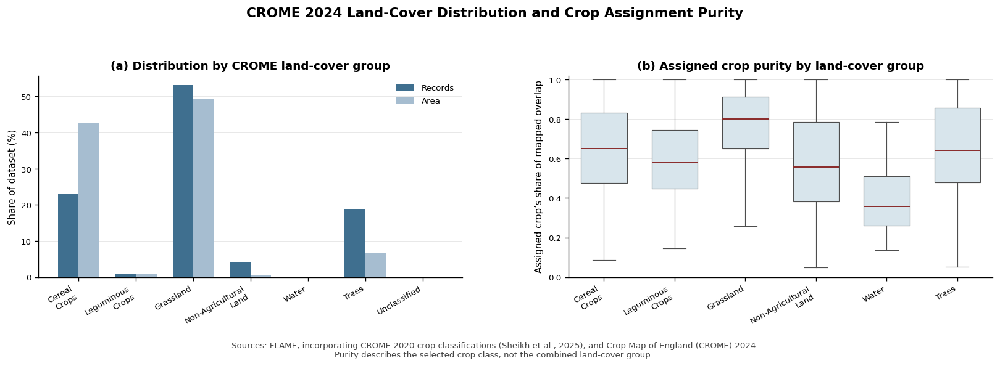

Saved figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/crome_group_distribution_and_purity.png
Saved vector figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/crome_group_distribution_and_purity.pdf


In [ ]:
# CROME 2024 distribution and assignment-quality figure

crome_analysis = agriculture[
    ["lu_crome", "size_ha", "crop_type_purity"]
].copy()

crome_analysis["group"] = (
    crome_analysis["lu_crome"]
    .astype("string")
    .str.strip()
    .replace("", pd.NA)
    .fillna("Unclassified")
)

for col in ["size_ha", "crop_type_purity"]:
    crome_analysis[col] = pd.to_numeric(
        crome_analysis[col], errors="coerce"
    )

group_order = [
    "Cereal Crops",
    "Leguminous Crops",
    "Grassland",
    "Non-Agricultural Land",
    "Water",
    "Trees",
    "Unclassified"
]

group_labels = [
    "Cereal\nCrops",
    "Leguminous\nCrops",
    "Grassland",
    "Non-Agricultural\nLand",
    "Water",
    "Trees",
    "Unclassified"
]

unexpected = sorted(
    set(crome_analysis["group"]) - set(group_order)
)
if unexpected:
    raise ValueError(f"Unexpected groups: {unexpected}")

valid_area = (
    np.isfinite(crome_analysis["size_ha"])
    & crome_analysis["size_ha"].gt(0)
)
total_area = crome_analysis.loc[valid_area, "size_ha"].sum()

if crome_analysis.empty or total_area <= 0:
    raise ValueError("No records or no positive finite areas available.")

record_share = (
    crome_analysis["group"]
    .value_counts()
    .reindex(group_order, fill_value=0)
    .div(len(crome_analysis))
    .mul(100)
)

area_share = (
    crome_analysis.loc[valid_area]
    .groupby("group")["size_ha"]
    .sum()
    .reindex(group_order, fill_value=0)
    .div(total_area)
    .mul(100)
)

academic_style = {
    "font.size": 9,
    "axes.titlesize": 11,
    "axes.titleweight": "semibold",
    "figure.titlesize": 13,
    "axes.spines.top": False,
    "axes.spines.right": False,
}

with plt.rc_context(academic_style):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5.8))
    fig.subplots_adjust(
        left=.06, right=.98, top=.81,
        bottom=.34, wspace=.25
    )

    # Panel A: record and area shares.
    x = np.arange(len(group_order))
    width = .36

    axes[0].bar(
        x - width / 2,
        record_share,
        width,
        label="Records",
        color="#3F6F8F"
    )
    axes[0].bar(
        x + width / 2,
        area_share,
        width,
        label="Area",
        color="#A6BDD0"
    )
    axes[0].set(
        title="(a) Distribution by CROME land-cover group",
        ylabel="Share of dataset (%)",
        xticks=x,
        xticklabels=group_labels
    )
    axes[0].legend(frameon=False)

    # Panel B: crop-level purity within each assigned group.
    # Exclude Unclassified and groups with no valid purity values.
    purity_values = []
    purity_positions = []

    for position, group in enumerate(group_order[:-1], start=1):
        values = crome_analysis.loc[
            crome_analysis["group"].eq(group)
            & crome_analysis["crop_type_purity"].between(0, 1),
            "crop_type_purity"
        ].dropna()

        if not values.empty:
            purity_values.append(values.to_numpy())
            purity_positions.append(position)

    if purity_values:
        box = axes[1].boxplot(
            purity_values,
            positions=purity_positions,
            manage_ticks=False,
            patch_artist=True,
            showfliers=False,
            widths=.65,
            medianprops={"color": "#8B2E2E", "linewidth": 1.2},
            boxprops={"edgecolor": "#4D4D4D", "linewidth": .7},
            whiskerprops={"color": "#4D4D4D", "linewidth": .7},
            capprops={"color": "#4D4D4D", "linewidth": .7}
        )
        for patch in box["boxes"]:
            patch.set_facecolor("#D8E5EC")

    for position in range(1, len(group_order)):
        if position not in purity_positions:
            axes[1].text(
                position, .5, "No data",
                ha="center", va="center",
                fontsize=8, rotation=90
            )

    axes[1].set(
        title="(b) Assigned crop purity by land-cover group",
        ylabel="Assigned crop’s share of mapped overlap",
        xticks=np.arange(1, len(group_order)),
        xticklabels=group_labels[:-1],
        xlim=(.5, len(group_order) - .5),
        ylim=(0, 1.02)
    )

    for ax in axes:
        ax.grid(axis="y", color="#D9D9D9", linewidth=.5, alpha=.7)
        ax.set_axisbelow(True)
        plt.setp(ax.get_xticklabels(), rotation=30, ha="right")

    fig.suptitle(
        "CROME 2024 Land-Cover Distribution and Crop Assignment Purity",
        y=.97,
        fontweight="semibold"
    )

    fig.text(
        .5, .15,
        "Sources: FLAME, incorporating CROME 2020 crop classifications"
        " (Sheikh et al., 2025), and Crop Map of England (CROME) 2024.\n"
        "Purity describes the selected crop class, not the combined land-cover group. ",
        ha="center",
        va="bottom",
        fontsize=8,
        color="#444444"
    )

    FIG.mkdir(parents=True, exist_ok=True)
    crome_png = FIG / "crome_group_distribution_and_purity.png"
    crome_pdf = FIG / "crome_group_distribution_and_purity.pdf"

    save_dissertation_figure(fig,
        crome_png, dpi=300,
        bbox_inches="tight", facecolor="white"
    )
    save_dissertation_figure(fig,
        crome_pdf,
        bbox_inches="tight", facecolor="white"
    )
    plt.show()
    plt.close(fig)

print(f"Saved figure: {crome_png}")
print(f"Saved vector figure: {crome_pdf}")

### ALC dataset: land quality

The Agricultural Land Classification (ALC) divides agricultural land into five grades according to its quality and suitability for agricultural production. Grade 3 is subdivided into Grade 3a and Grade 3b. Polygons classified as urban or non-agricultural were excluded because they do not represent agricultural land quality classes relevant to the analysis.

The source grade column was identified automatically from a set of possible column names and renamed `alc_code`. Geometries were checked and repaired before the overlay. Numeric ALC codes were converted to descriptive labels.

ALC grades were assigned to agricultural records through spatial intersection. Where a record intersected more than one ALC grade, the grade occupying the largest intersected area was assigned as its dominant classification. The resulting grade was stored in `alc_grade`, while `alc_grade_purity` records the proportion of the classified overlap represented by the selected grade. A low purity value indicates that a record crosses multiple ALC zones; consequently, its assigned grade should be interpreted as a dominant spatial classification rather than a uniform condition across the entire record.

ALC classification table:

| Source code | ALC grade        | General agricultural quality | Treatment |
| ----------: | ---------------- | ---------------------------- | --------- |
|           1 | Grade 1          | Excellent                    | Retained  |
|           2 | Grade 2          | Very good                    | Retained  |
|           3 | Grade 3a         | Good                         | Retained  |
|           4 | Grade 3b         | Moderate                     | Retained  |
|           5 | Grade 4          | Poor                         | Retained  |
|           6 | Grade 5          | Very poor                    | Retained  |
|           7 | Non-agricultural | Not agricultural land        | Excluded  |
|           8 | Urban            | Urban or developed land      | Excluded  |

The combined checkpoint dataset has the following attributes added:
| Variable           | Description                                                     | Analytical use                                                                                                |
| ------------------ | --------------------------------------------------------------- | ------------------------------------------------------------------------------------------------------------- |
| `alc_grade`        | Dominant ALC grade assigned by intersected area.                | Represents the principal agricultural land-quality class associated with each record.                         |
| `alc_grade_purity` | Share of the classified overlap occupied by the assigned grade. | Indicates whether the assigned grade is spatially dominant or whether the record crosses several ALC classes. |



In [ ]:
# Agricultural Land Classification analysis
required = {"field_id", "size_ha", "alc_grade", "alc_grade_purity"}
missing = required - set(agriculture.columns)
if missing:
    raise KeyError(f"Missing required ALC columns: {', '.join(sorted(missing))}")

alc_analysis = agriculture[list(required)].copy()
alc_analysis["size_ha"] = pd.to_numeric(
    alc_analysis["size_ha"], errors="coerce"
)
alc_analysis["alc_grade_purity"] = pd.to_numeric(
    alc_analysis["alc_grade_purity"], errors="coerce"
)
alc_analysis["alc_grade"] = (
    alc_analysis["alc_grade"]
    .astype("string")
    .str.strip()
    .replace("", pd.NA)
)

grade_order = [
    "Grade 1", "Grade 2", "Grade 3a",
    "Grade 3b", "Grade 4", "Grade 5"
]

total_records = len(alc_analysis)
total_area = alc_analysis.loc[
    alc_analysis["size_ha"].gt(0), "size_ha"
].sum()

has_grade = alc_analysis["alc_grade"].notna()
has_purity = alc_analysis["alc_grade_purity"].notna()
excluded = alc_analysis["alc_grade"].isin(
    ["Urban", "Non-agricultural"]
)
invalid_purity = (
    has_purity
    & ~alc_analysis["alc_grade_purity"].between(0, 1)
)

print("ALC ANALYSIS SUMMARY")
print(f"Total agricultural records: {total_records:,}")
print(f"Records assigned an ALC grade: {has_grade.sum():,}")
print(f"ALC classification rate: {has_grade.mean():.2%}")
print(f"Records without an ALC grade: {(~has_grade).sum():,}")
print(f"Median ALC purity: {alc_analysis['alc_grade_purity'].median():.3f}")
print(f"Purity values outside 0–1: {invalid_purity.sum():,}")
print(f"Excluded labels remaining: {excluded.sum():,}")

ALC ANALYSIS SUMMARY
Total agricultural records: 682,623
Records assigned an ALC grade: 678,853
ALC classification rate: 99.45%
Records without an ALC grade: 3,770
Median ALC purity: 0.994
Purity values outside 0–1: 0
Excluded labels remaining: 0


In [ ]:
# Table 1: ALC quality checks
alc_qa = pd.DataFrame({
    "Measure": [
        "Total agricultural records",
        "Records assigned an ALC grade",
        "Records without an ALC grade",
        "Grade assigned but purity missing",
        "Purity outside 0–1",
        "Urban classifications remaining",
        "Non-agricultural classifications remaining",
        "Duplicated field identifiers",
    ],
    "Records": [
        total_records,
        has_grade.sum(),
        (~has_grade).sum(),
        (has_grade & ~has_purity).sum(),
        invalid_purity.sum(),
        alc_analysis["alc_grade"].eq("Urban").sum(),
        alc_analysis["alc_grade"].eq("Non-agricultural").sum(),
        alc_analysis["field_id"].duplicated().sum(),
    ]
})
alc_qa["Share of records (%)"] = (
    100 * alc_qa["Records"] / total_records
).round(2)

print("\nTable 1. ALC quality checks")
display(alc_qa)


Table 1. ALC quality checks


,Measure,Records,Share of records (%)
0,Total agricultural records,682623,100.00
1,Records assigned an ALC grade,678853,99.45
2,Records without an ALC grade,3770,0.55
3,Grade assigned but purity missing,1,0.00
4,Purity outside 0–1,0,0.00
5,Urban classifications remaining,0,0.00
6,Non-agricultural classifications remaining,0,0.00
7,Duplicated field identifiers,0,0.00


In [ ]:
# Table 2: ALC distribution by record count and area
grade_distribution = (
    alc_analysis.dropna(subset=["alc_grade"])
    .groupby("alc_grade", as_index=False)
    .agg(
        Records=("field_id", "nunique"),
        area_ha=("size_ha", "sum"),
        median_purity=("alc_grade_purity", "median")
    )
    .rename(columns={
        "alc_grade": "ALC grade",
        "area_ha": "Area (ha)",
        "median_purity": "Median purity",
    })
)

grade_distribution["ALC grade"] = pd.Categorical(
    grade_distribution["ALC grade"],
    categories=grade_order,
    ordered=True
)
grade_distribution = grade_distribution.sort_values(
    "ALC grade"
).reset_index(drop=True)

grade_distribution["Record share (%)"] = (
    100 * grade_distribution["Records"] / total_records
)
grade_distribution["Area share (%)"] = (
    100 * grade_distribution["Area (ha)"] / total_area
)

print("\nTable 2. Distribution of agricultural records by ALC grade")
display(
    grade_distribution.style
    .hide(axis="index")
    .format({
        "Records": "{:,.0f}",
        "Area (ha)": "{:,.1f}",
        "Median purity": "{:.3f}",
        "Record share (%)": "{:.2f}",
        "Area share (%)": "{:.2f}",
    })
)


Table 2. Distribution of agricultural records by ALC grade


ALC grade,Records,Area (ha),Median purity,Record share (%),Area share (%)
Grade 1,"29,656","359,350.4",0.940,4.34,4.23
Grade 2,"135,384","1,630,559.9",0.991,19.83,19.18
Grade 3a,"185,945","2,623,039.5",0.994,27.24,30.85
Grade 3b,"243,117","2,816,878.3",1.000,35.62,33.13
Grade 4,"67,352","691,488.6",0.960,9.87,8.13
Grade 5,"17,399","378,169.0",0.951,2.55,4.45


In [ ]:
# Table 3: ALC coverage by region, if a regional variable is available
if "region" in agriculture.columns:
    region_alc = (
        agriculture.assign(
            alc_classified=agriculture["alc_grade"].notna()
        )
        .groupby("region", dropna=False, as_index=False)
        .agg(
            Records=("field_id", "size"),
            classified_records=("alc_classified", "sum"),
            area_ha=("size_ha", "sum")
        )
        .rename(columns={
            "classified_records": "Classified records",
            "area_ha": "Area (ha)",
        })
    )
    region_alc["Classification rate (%)"] = (
        100 * region_alc["Classified records"] / region_alc["Records"]
    )
    region_alc = region_alc.sort_values(
        "Classification rate (%)"
    )

    print("\nTable 3. ALC classification coverage by region")
    display(
        region_alc.style
        .hide(axis="index")
        .format({
            "Records": "{:,.0f}",
            "Classified records": "{:,.0f}",
            "Area (ha)": "{:,.1f}",
            "Classification rate (%)": "{:.2f}",
        })
    )
    save_table(region_alc, "alc_coverage_by_region")


Table 3. ALC classification coverage by region


region,Records,Classified records,Area (ha),Classification rate (%)
London,"1,416","1,372","14,226.0",96.89
Yorkshire and The Humber,"72,818","72,307","998,974.4",99.30
South East,"94,878","94,213","1,131,294.9",99.30
North East,"25,858","25,682","500,490.7",99.32
North West,"71,901","71,415","741,210.2",99.32
East of England,"93,016","92,512","1,368,532.0",99.46
East Midlands,"79,560","79,143","1,150,444.7",99.48
West Midlands,"86,515","86,077","889,002.4",99.49
South West,"156,661","156,132","1,707,993.1",99.66


saved table: alc_coverage_by_region.csv


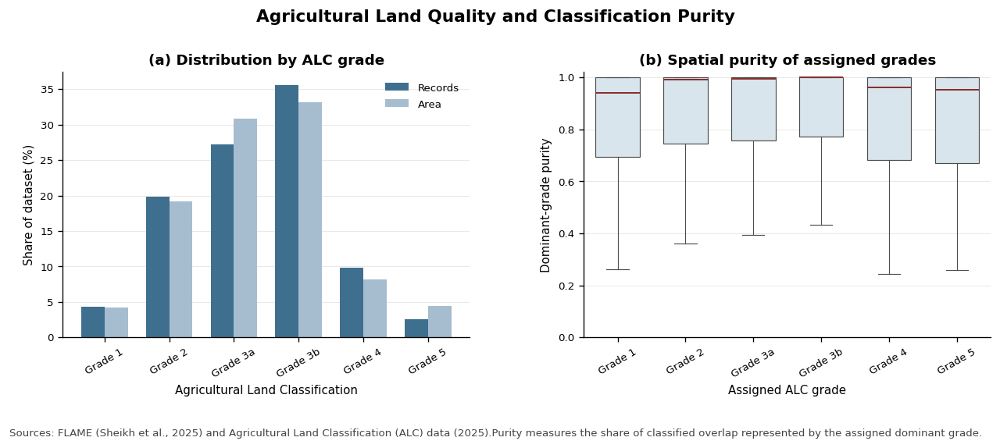

Saved figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/alc_grade_distribution_and_purity.png
Saved vector figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/alc_grade_distribution_and_purity.pdf


In [ ]:
# ALC distribution and assignment-quality figure
plot_data = (
    grade_distribution
    .set_index("ALC grade")
    .reindex(grade_order)
)

academic_style = {
    "font.size": 9,
    "axes.titlesize": 11,
    "axes.titleweight": "semibold",
    "figure.titlesize": 13,
    "axes.spines.top": False,
    "axes.spines.right": False,
}

with plt.rc_context(academic_style):
    fig, axes = plt.subplots(1, 2, figsize=(11, 4.8))
    fig.subplots_adjust(
        left=.08, right=.98, top=.82,
        bottom=.23, wspace=.28
    )

    # Panel A: record- and area-based grade distributions.
    x = np.arange(len(grade_order))
    width = .36

    axes[0].bar(
        x - width / 2,
        plot_data["Record share (%)"],
        width,
        label="Records",
        color="#3F6F8F"
    )
    axes[0].bar(
        x + width / 2,
        plot_data["Area share (%)"],
        width,
        label="Area",
        color="#A6BDD0"
    )
    axes[0].set(
        title="(a) Distribution by ALC grade",
        xlabel="Agricultural Land Classification",
        ylabel="Share of dataset (%)",
        xticks=x,
        xticklabels=grade_order
    )
    axes[0].legend(frameon=False)

    # Panel B: purity distributions by assigned grade.
    purity_values = [
        alc_analysis.loc[
            alc_analysis["alc_grade"].eq(grade)
            & alc_analysis["alc_grade_purity"].between(0, 1),
            "alc_grade_purity"
        ].dropna()
        for grade in grade_order
    ]

    box = axes[1].boxplot(
        purity_values,
        tick_labels=grade_order,
        patch_artist=True,
        showfliers=False,
        widths=.65,
        medianprops={"color": "#8B2E2E", "linewidth": 1.2},
        boxprops={"edgecolor": "#4D4D4D", "linewidth": .7},
        whiskerprops={"color": "#4D4D4D", "linewidth": .7},
        capprops={"color": "#4D4D4D", "linewidth": .7},
    )
    for patch in box["boxes"]:
        patch.set_facecolor("#D8E5EC")

    axes[1].set(
        title="(b) Spatial purity of assigned grades",
        xlabel="Assigned ALC grade",
        ylabel="Dominant-grade purity",
        ylim=(0, 1.02)
    )

    for ax in axes:
        ax.grid(axis="y", color="#D9D9D9", linewidth=.5, alpha=.7)
        ax.set_axisbelow(True)
        ax.tick_params(axis="x", rotation=30)

    fig.suptitle(
        "Agricultural Land Quality and Classification Purity",
        y=.96, fontweight="semibold"
    )
    fig.text(
        .5, .01,
        "Sources: FLAME (Sheikh et al., 2025) and "
        "Agricultural Land Classification (ALC) data (2025)."
        "Purity measures the share of classified overlap represented by "
        "the assigned dominant grade.",
        ha="center", fontsize=8, color="#444444", wrap=True
    )

    alc_png = FIG / "alc_grade_distribution_and_purity.png"
    alc_pdf = FIG / "alc_grade_distribution_and_purity.pdf"
    save_dissertation_figure(fig,
        alc_png, dpi=300,
        bbox_inches="tight", facecolor="white"
    )
    save_dissertation_figure(fig,
        alc_pdf,
        bbox_inches="tight", facecolor="white"
    )
    plt.show()
    plt.close(fig)

print(f"Saved figure: {alc_png}")
print(f"Saved vector figure: {alc_pdf}")

In [ ]:
# Agricultural Land Classification composition
alc_source = agriculture.copy()  # Change to agriculture.copy() for the full dataset.
grade_order = [
    "Grade 1", "Grade 2", "Grade 3a",
    "Grade 3b", "Grade 4", "Grade 5",
    "Unclassified"
]

alc_source["alc_grade"] = (
    alc_source["alc_grade"]
    .astype("string")
    .str.strip()
    .replace("", pd.NA)
    .fillna("Unclassified")
)
alc_source["size_ha"] = pd.to_numeric(
    alc_source["size_ha"], errors="coerce"
)

alc = (
    alc_source.groupby("alc_grade", as_index=False)
    .agg(
        n_fields=("field_id", "nunique"),
        area_ha=("size_ha", "sum")
    )
)

alc["pct_fields"] = (
    100 * alc["n_fields"] / alc_source["field_id"].nunique()
)
alc["pct_area"] = (
    100 * alc["area_ha"] / alc_source["size_ha"].sum()
)

alc["_order"] = alc["alc_grade"].map(
    {grade: i for i, grade in enumerate(grade_order)}
)
alc = (
    alc.sort_values("_order")
    .drop(columns="_order")
    .reset_index(drop=True)
)

# Round only the displayed/saved table.
alc_output = alc.copy()
alc_output["area_ha"] = alc_output["area_ha"].round(0)
alc_output["pct_fields"] = alc_output["pct_fields"].round(2)
alc_output["pct_area"] = alc_output["pct_area"].round(2)

save_table(alc_output, "R4_alc_composition")

print("R4. Agricultural Land Classification composition")
display(
    alc_output.style
    .hide(axis="index")
    .format({
        "n_fields": "{:,.0f}",
        "area_ha": "{:,.0f}",
        "pct_fields": "{:.2f}",
        "pct_area": "{:.2f}",
    })
)

saved table: R4_alc_composition.csv
R4. Agricultural Land Classification composition


alc_grade,n_fields,area_ha,pct_fields,pct_area
Grade 1,"29,656","359,350",4.34,4.23
Grade 2,"135,384","1,630,560",19.83,19.18
Grade 3a,"185,945","2,623,039",27.24,30.85
Grade 3b,"243,117","2,816,878",35.62,33.13
Grade 4,"67,352","691,489",9.87,8.13
Grade 5,"17,399","378,169",2.55,4.45
Unclassified,"3,770","2,683",0.55,0.03


### AgCensus dataset: livestock-units<a class="anchor" id="AgCensus-dataset:-livestock-units"></a>

Agricultural Census variables were assembled on the common 5 km grid to determine livestock content. Dairy cattle, beef cattle and sheep numbers were converted to livestock units (LSU) using age- and livestock-specific coefficients. Although the reference table includes coefficients for additional livestock categories, the implemented calculation of `total_lsu` uses only dairy cattle, beef cattle and sheep.

Livestock-unit totals were calculated only where all required animal-count components were available. Dairy, beef and sheep LSU estimates were summed to obtain `total_lsu`, and the category contributing the largest LSU total was used to identify the dominant `livestock_system`. Cells with complete data and no recorded livestock were classified separately as `No livestock` and incomplete cells were not assumed to contain no animals.

Grass area was calculated from temporary grass under five years old, grass over five years old and, where `INCLUDE_ROUGH_GRAZING = True`, rough grazing. Stocking density was calculated as `total_lsu` divided by grass area in hectares. Cells with incomplete livestock or grass-area inputs, a grass-area denominator below `MIN_GRASS_AREA_HA = 20`, or an unavailable stocking density had lower-confidence information.

Reliable cells with positive livestock numbers and at least 20 ha of grassland were divided into three relative grazing-intensity groups. The 33rd and 66th percentiles of stocking density defined the boundaries between `Extensive`, `Moderate` and `Intensive` grazing. These classes describe relative intensity within the Agricultural Census. Sensitivity tests examined minimum grass-area thresholds of 10, 20 and 30 ha and compared stocking densities calculated with and without rough grazing.

The 5 km livestock context was assigned to each agricultural field using the representative point of its geometry. Livestock attributes were kept only for fields classified as permanent grass or temporary grass and forage. Non-grassland fields were assigned `Not grassland`, and their livestock attributes were set to missing. Because the livestock information originates from a 5 km grid, the assigned values represent the wider livestock context surrounding a field and should not be interpreted as livestock numbers belonging to an individual field, farm or landowner.

The combined checkpoint dataset has the following attributes added:

| Variable                    | Description                                                                        |
| --------------------------- | ---------------------------------------------------------------------------------- |
| `stocking_lsu_per_grass_ha` | Total dairy, beef and sheep LSU divided by grass area in the associated 5 km cell. |
| `grazing_intensity`         | Relative grazing-intensity category assigned using stocking-density percentiles.   |
| `livestock_system`          | Livestock category contributing the largest LSU total: dairy, beef or sheep.       |
| `livestock_data_quality`    | Reason the grid-cell livestock context was considered complete or less reliable.   |
| `grass_area_ha`             | Grass area within the associated Agricultural Census grid cell.                    |
| `total_lsu`                 | Combined dairy, beef and sheep livestock units in the grid cell.                   |


In [ ]:
agriculture.head()

,field_id,entity_id,ID,OWNER_ID,flame_source,source_row_id,farm_type,land_use,lu_flame,lu_crome,...,size_ha,available_ha,excluded_frac,excluded,region,local_authority,catchment,area_diff_pct,crop_old_group,geometry
0,FLAME_FARM_0,FARM_FARM00008,FARM00008,None,farm,0,Non-agricultural,Trees,Leguminous Crops,Trees,...,1.629147,1.579793,0.030295,False,West Midlands,Malvern Hills,Severn River Worcestershire,0.096995,Leguminous Crops,"MULTIPOLYGON (((376163.1 267428.19, 376163.5 2..."
1,FLAME_FARM_1,FARM_FARM00008,FARM00008,None,farm,1,Beef,Grassland,Grassland,Grassland,...,50.509488,49.970621,0.010669,False,West Midlands,Malvern Hills,Severn River Worcestershire,0.096999,Grassland,"MULTIPOLYGON (((376094.6 267181.59, 376093.93 ..."
2,FLAME_FARM_2,FARM_FARM00008,FARM00008,None,farm,2,Beef,Grassland,Leguminous Crops,Grassland,...,2.840454,2.828286,0.004284,False,West Midlands,Malvern Hills,Severn River Worcestershire,0.097009,Leguminous Crops,"MULTIPOLYGON (((376172.6 267520.89, 376172.4 2..."
3,FLAME_FARM_3,FARM_FARM00008,FARM00008,None,farm,3,Beef,Grassland,Cereal Crops,Grassland,...,5.631608,5.622810,0.001562,False,West Midlands,Malvern Hills,Severn River Worcestershire,0.097043,Cereal Crops,"MULTIPOLYGON (((376784.55 267046.49, 376782 26..."
4,FLAME_FARM_4,FARM_FARM00008,FARM00008,None,farm,4,Beef,Grassland,Cereal Crops,Grassland,...,8.167311,8.083993,0.010201,False,West Midlands,Malvern Hills,Severn River Worcestershire,0.097034,Cereal Crops,"MULTIPOLYGON (((376599.8 267730.19, 376595.9 2..."


In [ ]:
# Agricultural Census livestock-context analysis

import numpy as np
import pandas as pd

required = {
    "field_id", "size_ha", "crop_type", "land_use",
    "grazing_intensity", "livestock_system",
    "livestock_data_quality", "stocking_lsu_per_grass_ha",
    "grass_area_ha", "total_lsu", "farm_type"
}

missing = required - set(agriculture.columns)
if missing:
    raise KeyError(
        "The loaded agriculture dataset is missing livestock-analysis "
        f"columns: {', '.join(sorted(missing))}. "
        "Check that you loaded the checkpoint containing livestock enrichment."
    )

livestock = agriculture[
    sorted(required) + ["geometry"]
].copy()

for column in [
    "size_ha", "stocking_lsu_per_grass_ha",
    "grass_area_ha", "total_lsu"
]:
    livestock[column] = pd.to_numeric(
        livestock[column], errors="coerce"
    )

crop_names = (
    livestock["crop_type"]
    .astype("string")
    .str.strip()
    .str.replace(r"\s+", " ", regex=True)
    .str.casefold()
)

# Preserve the former grass/forage selection, adding Temporary Grassland.
# Cover Crop was included in your original temporary-grass/forage mapping.
grass_forage_crops = {
    "grass",
    "temporary grassland",
    "italian ryegrass",
    "lucerne",
    "sainfoin",
    "clover",
    "cover crop"
}

is_grassland = crop_names.isin(grass_forage_crops)
grassland = livestock.loc[is_grassland].copy()

stocking = grassland["stocking_lsu_per_grass_ha"]
valid_stocking = np.isfinite(stocking) & stocking.ge(0)
positive_stocking = valid_stocking & stocking.gt(0)

print("LIVESTOCK-CONTEXT SUMMARY")
print(f"Total agricultural records: {len(livestock):,}")
print(f"Selected grass/forage records: {len(grassland):,}")

if grassland.empty:
    print("No matching crop labels found. Check crop_type values:")
    print(livestock["crop_type"].value_counts(dropna=False).to_string())
else:
    print(
        "Selected records with valid stocking density: "
        f"{valid_stocking.sum():,} "
        f"({valid_stocking.mean():.2%})"
    )
    print(
        "Median positive stocking density: "
        f"{stocking.loc[positive_stocking].median():.3f} "
        "LSU per grass ha"
    )

LIVESTOCK-CONTEXT SUMMARY
Total agricultural records: 682,623
Selected grass/forage records: 353,526
Selected records with valid stocking density: 351,475 (99.42%)
Median positive stocking density: 1.035 LSU per grass ha


In [ ]:
# Table 1: livestock quality checks
livestock_qa = pd.DataFrame({
    "Measure": [
        "Total agricultural records",
        "Grassland records",
        "Grassland records with stocking density",
        "Grassland records without stocking density",
        "Non-grassland records with numeric density",
        "Negative stocking densities",
        "Missing grazing-intensity classifications",
        "Duplicated field identifiers",
    ],
    "Records": [
        len(livestock),
        is_grassland.sum(),
        (
            is_grassland
            & livestock["stocking_lsu_per_grass_ha"].notna()
        ).sum(),
        (
            is_grassland
            & livestock["stocking_lsu_per_grass_ha"].isna()
        ).sum(),
        (
            ~is_grassland
            & livestock["stocking_lsu_per_grass_ha"].notna()
        ).sum(),
        livestock["stocking_lsu_per_grass_ha"].dropna().lt(0).sum(),
        grassland["grazing_intensity"].isna().sum(),
        livestock["field_id"].duplicated().sum(),
    ]
})

print("\nTable 1. Livestock-context quality checks")
display(livestock_qa)
save_table(livestock_qa, "livestock_context_quality")


Table 1. Livestock-context quality checks


,Measure,Records
0,Total agricultural records,682623
1,Grassland records,353526
2,Grassland records with stocking density,351475
3,Grassland records without stocking density,2051
4,Non-grassland records with numeric density,0
5,Negative stocking densities,0
6,Missing grazing-intensity classifications,0
7,Duplicated field identifiers,0


saved table: livestock_context_quality.csv


,Measure,Records
0,Total agricultural records,682623
1,Grassland records,353526
2,Grassland records with stocking density,351475
3,Grassland records without stocking density,2051
4,Non-grassland records with numeric density,0
5,Negative stocking densities,0
6,Missing grazing-intensity classifications,0
7,Duplicated field identifiers,0


In [ ]:
# Table 2: dominant livestock system among grassland records
system_composition = (
    grassland.assign(
        livestock_system=grassland["livestock_system"]
        .astype("string")
        .fillna("Unknown")
    )
    .groupby("livestock_system", as_index=False)
    .agg(
        fields=("field_id", "nunique"),
        area_ha=("size_ha", "sum"),
        median_lsu_per_grass_ha=(
            "stocking_lsu_per_grass_ha", "median"
        )
    )
    .sort_values("area_ha", ascending=False)
)

system_composition["pct_fields"] = (
    100 * system_composition["fields"]
    / grassland["field_id"].nunique()
)
system_composition["pct_area"] = (
    100 * system_composition["area_ha"]
    / grassland["size_ha"].sum()
)

print("\nTable 3. Dominant livestock system among grassland records")
display(
    system_composition.style
    .hide(axis="index")
    .format({
        "fields": "{:,.0f}",
        "area_ha": "{:,.1f}",
        "median_lsu_per_grass_ha": "{:.3f}",
        "pct_fields": "{:.2f}",
        "pct_area": "{:.2f}",
    })
)
save_table(system_composition, "livestock_system_composition")


Table 3. Dominant livestock system among grassland records


livestock_system,fields,area_ha,median_lsu_per_grass_ha,pct_fields,pct_area
Beef,"185,001","2,029,446.9",0.865,52.33,50.15
Dairy,"85,738","984,057.6",1.339,24.25,24.32
Sheep,"80,736","976,381.6",1.471,22.84,24.13
Unknown,"2,051","56,819.8",nan,0.58,1.40


saved table: livestock_system_composition.csv


,livestock_system,fields,area_ha,median_lsu_per_grass_ha,pct_fields,pct_area
0,Beef,185001,2.029447e+06,0.865118,52.330239,50.150590
1,Dairy,85738,9.840576e+05,1.339050,24.252247,24.317497
2,Sheep,80736,9.763816e+05,1.471228,22.837358,24.127812
3,Unknown,2051,5.681983e+04,NaN,0.580155,1.404101


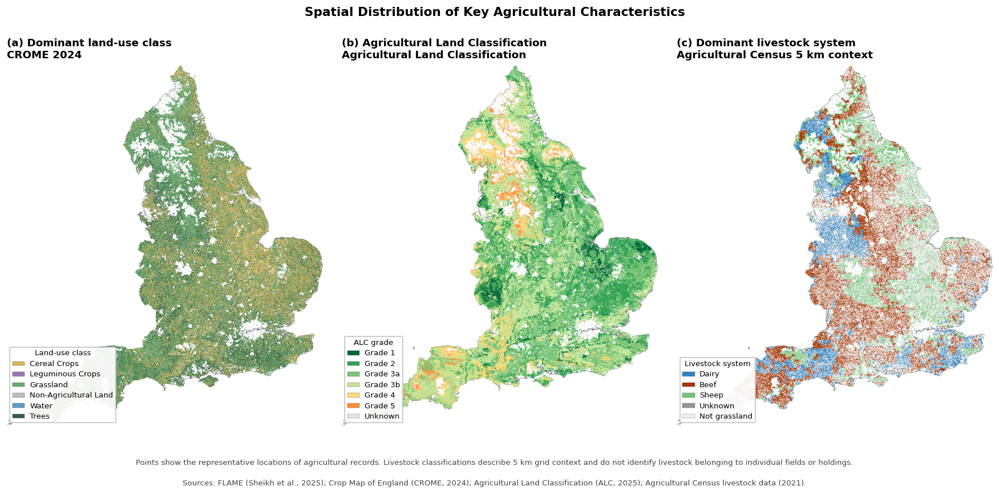

Saved figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/R3_dataset_3panel.png
Saved vector figure: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/figures/R3_dataset_3panel.pdf


In [ ]:
# spatial distribution of key agricultural characteristics
points = FIGBASE.geometry.representative_point()
x_points = points.x.to_numpy()
y_points = points.y.to_numpy()

alc_colours = {
    "Grade 1": "#006837",
    "Grade 2": "#31A354",
    "Grade 3a": "#78C679",
    "Grade 3b": "#C2E699",
    "Grade 4": "#FED976",
    "Grade 5": "#FD8D3C",
    "Unknown": "#E5E5E5",
}

livestock_colours = {
    "Dairy": "#3182BD",
    "Beef": "#A63603",
    "Sheep": "#74C476",
    "No livestock": "#D9D9D9",
    "Unknown": "#969696",
    "Not grassland": "#F2F2F2",
}

panels = [
    (
        "land_use_plot",
        "(a) Dominant land-use class",
        LU_COLOURS,
        "Land-use class",
        CROME_LABEL
    ),
    (
        "alc_grade",
        "(b) Agricultural Land Classification",
        alc_colours,
        "ALC grade",
        ALC_LABEL
    ),
    (
        "livestock_system",
        "(c) Dominant livestock system",
        livestock_colours,
        "Livestock system",
        LIVESTOCK_LABEL
    ),
]

west, south, east, north = BOUNDARY.total_bounds
fig, axes = plt.subplots(
    1, 3, figsize=(15, 7.5),
    sharex=True, sharey=True
)
fig.subplots_adjust(
    left=.025, right=.985,
    top=.87, bottom=.12, wspace=.06
)

for ax, (column, title, colours, legend_title, source) in zip(
    axes, panels
):
    BOUNDARY.plot(
        ax=ax,
        color="#FAFAFA",
        edgecolor="#888888",
        linewidth=.35,
        zorder=0
    )

    values = (
        FIGBASE[column]
        .astype("string")
        .str.strip()
        .replace("", pd.NA)
        .fillna("Unknown")
    )
    point_colours = values.map(colours).fillna("#E5E5E5")

    ax.scatter(
        x_points,
        y_points,
        s=.35,
        c=point_colours,
        linewidths=0,
        rasterized=True,
        zorder=1
    )
    ax.set(
        xlim=(west, east),
        ylim=(south, north),
        aspect="equal"
    )
    ax.set_title(
        f"{title}\n{source}",
        loc="left",
        fontsize=10.5,
        pad=8
    )
    ax.set_axis_off()

    present = [
        category for category in colours
        if values.eq(category).any()
    ]
    handles = [
        mpatches.Patch(
            facecolor=colours[category],
            edgecolor="#666666",
            linewidth=.25,
            label=category
        )
        for category in present
    ]
    ax.legend(
        handles=handles,
        title=legend_title,
        loc="lower left",
        fontsize=6.5,
        title_fontsize=7.5,
        frameon=True,
        framealpha=.92,
        edgecolor="#BDBDBD"
    )

fig.suptitle(
    "Spatial Distribution of Key Agricultural Characteristics",
    fontsize=13,
    fontweight="semibold",
    y=.96
)
fig.text(
    .5, .065,
    "Points show the representative locations of agricultural records. "
    "Livestock classifications describe 5 km grid context and do not identify "
    "livestock belonging to individual fields or holdings.",
    ha="center",
    va="bottom",
    fontsize=8,
    color="#444444"
)

fig.text(
    .5, .025,
    "Sources: FLAME (Sheikh et al., 2025); "
    "Crop Map of England (CROME, 2024); Agricultural Land Classification (ALC, 2025); "
    "Agricultural Census livestock data (2021).",
    ha="center",
    va="bottom",
    fontsize=8,
    color="#444444"
)

r3_png = FIG / "R3_dataset_3panel.png"
r3_pdf = FIG / "R3_dataset_3panel.pdf"
save_dissertation_figure(fig, r3_png, dpi=300, bbox_inches="tight", facecolor="white")
save_dissertation_figure(fig, r3_pdf, bbox_inches="tight", facecolor="white")
plt.show()
plt.close(fig)

print(f"Saved figure: {r3_png}")
print(f"Saved vector figure: {r3_pdf}")

### Physical availability and constraint screening

This screening distinguishes between hard physical exclusions and environmental or policy constraints. Built-up land, transport infrastructure and water features were treated as hard exclusions because the land they occupy was assumed to be physically unavailable for the measures considered in the analysis. Protected areas and deep peat were retained as constraint flags rather than removed. Their presence may require additional assessment, but does not necessarily make an entire agricultural record physically unavailable.

Built-up polygons were used directly. Roads, railways and watercourses were supplied as linear features and converted to polygons using buffers of 5 m, 10 m and 2 m, respectively. The buffer distances apply on each side of the source line. Lakes were kept using their original polygon boundaries. Deep peat was identified from raster cells with a recorded depth of at least 30 cm and converted to polygon features. The protected-area layer combined Areas of Outstanding Natural Beauty, Sites of Special Scientific Interest, Special Areas of Conservation, Special Protection Areas, Ramsar sites, National Nature Reserves, Local Nature Reserves and National Parks.

Physical availability for each field was calculated using the three hard-exclusion groups: `Built-up`, `Water` and `Transport`. For each agricultural record, candidate exclusion geometries were identified using a spatial index, clipped to the field geometry and combined before their area was calculated. Combining overlapping exclusion pieces ensured that locations affected by more than one exclusion were counted only once.

The resulting `excluded_frac` represents the proportion of each agricultural record occupied by hard exclusions. Available area was calculated as field area multiplied by one minus this fraction. Records with at least 90% of their area covered by hard exclusions were flagged as `excluded`. Records below this threshold were retained with a proportionally reduced `available_ha`; the threshold therefore controls the record-level exclusion flag but does not affect the continuous available-area calculation.

Exclusion and constraint rules:

| Component       | Source form | Spatial treatment                             | Role in availability calculation |
| --------------- | ----------- | --------------------------------------------- | -------------------------------- |
| Built-up land   | Polygon     | Original boundary retained                    | Hard exclusion                   |
| Roads           | Line        | Buffered by 5 m on each side                  | Hard exclusion                   |
| Railways        | Line        | Buffered by 10 m on each side                 | Hard exclusion                   |
| Lakes           | Polygon     | Original boundary retained                    | Hard exclusion                   |
| Watercourses    | Line        | Buffered by 2 m on each side                  | Hard exclusion                   |
| Protected areas | Polygon     | Designations combined and retained separately | Constraint flag only             |
| Deep peat       | Raster      | Cells ≥30 cm converted to polygons            | Constraint flag only             |

The combined checkpoint dataset has the following attributes added:

| Variable        | Description                                                                                 |
| --------------- | ------------------------------------------------------------------------------------------- |
| `excluded_frac` | Proportion of record area covered by the union of built-up, transport and water exclusions. |
| `available_ha`  | Area remaining after hard exclusions, calculated as `size_ha × (1 − excluded_frac)`.        |
| `excluded`      | Boolean flag identifying records with `excluded_frac ≥ 0.90`.                               |


In [ ]:
# Physical-availability and exclusion analysis
required = {
    "field_id", "size_ha",
    "excluded_frac", "available_ha", "excluded"
}
missing = required - set(agriculture.columns)
if missing:
    raise KeyError(f"Missing exclusion columns: {', '.join(sorted(missing))}")

exclusions = agriculture[
    list(required) + ["geometry"]
].copy()

for column in ["size_ha", "excluded_frac", "available_ha"]:
    exclusions[column] = pd.to_numeric(
        exclusions[column], errors="coerce"
    )

total_records = len(exclusions)
total_area = exclusions["size_ha"].sum()
available_area = exclusions["available_ha"].sum()
removed_area = total_area - available_area

expected_available = (
    exclusions["size_ha"]
    * (1 - exclusions["excluded_frac"])
).clip(lower=0)

available_consistent = np.isclose(
    exclusions["available_ha"],
    expected_available,
    rtol=1e-7,
    atol=1e-6,
    equal_nan=True
)

flag_consistent = (
    exclusions["excluded"].fillna(False).astype(bool)
    == exclusions["excluded_frac"].ge(.90)
)

print("PHYSICAL-AVAILABILITY SUMMARY")
print(f"Agricultural records: {total_records:,}")
print(f"Original area: {total_area:,.1f} ha")
print(f"Hard-excluded area: {removed_area:,.1f} ha")
print(f"Available area: {available_area:,.1f} ha")
print(f"Available share: {100 * available_area / total_area:.2f}%")
print(
    f"Records at least 90% excluded: "
    f"{exclusions['excluded_frac'].ge(.90).sum():,}"
)

PHYSICAL-AVAILABILITY SUMMARY
Agricultural records: 682,623
Original area: 8,502,168.5 ha
Hard-excluded area: 89,029.1 ha
Available area: 8,413,139.4 ha
Available share: 98.95%
Records at least 90% excluded: 1,330


In [ ]:
# Table 1: exclusion quality checks
exclusion_qa = pd.DataFrame({
    "Measure": [
        "Total agricultural records",
        "Missing exclusion fractions",
        "Exclusion fractions outside 0–1",
        "Missing available-area values",
        "Negative available-area values",
        "Available area greater than original area",
        "Available-area calculation mismatches",
        "Exclusion-flag mismatches",
        "Duplicated field identifiers",
    ],
    "Records": [
        total_records,
        exclusions["excluded_frac"].isna().sum(),
        (
            exclusions["excluded_frac"].notna()
            & ~exclusions["excluded_frac"].between(0, 1)
        ).sum(),
        exclusions["available_ha"].isna().sum(),
        exclusions["available_ha"].lt(0).sum(),
        (
            exclusions["available_ha"]
            > exclusions["size_ha"]
        ).sum(),
        (~available_consistent).sum(),
        (~flag_consistent).sum(),
        exclusions["field_id"].duplicated().sum(),
    ]
})

print("\nTable 1. Physical-availability quality checks")
display(exclusion_qa)


Table 1. Physical-availability quality checks


,Measure,Records
0,Total agricultural records,682623
1,Missing exclusion fractions,0
2,Exclusion fractions outside 0–1,0
3,Missing available-area values,0
4,Negative available-area values,0
5,Available area greater than original area,0
6,Available-area calculation mismatches,0
7,Exclusion-flag mismatches,0
8,Duplicated field identifiers,0


In [ ]:
# Table 2: composition by excluded-area fraction
fraction = exclusions["excluded_frac"]

exclusions["exclusion_band"] = np.select(
    [
        fraction.eq(0),
        fraction.gt(0) & fraction.le(.10),
        fraction.gt(.10) & fraction.le(.50),
        fraction.gt(.50) & fraction.lt(.90),
        fraction.ge(.90),
    ],
    [
        "No hard-exclusion overlap",
        ">0–10% excluded",
        ">10–50% excluded",
        ">50–<90% excluded",
        "≥90% excluded",
    ],
    default="Unknown"
)

band_order = [
    "No hard-exclusion overlap",
    ">0–10% excluded",
    ">10–50% excluded",
    ">50–<90% excluded",
    "≥90% excluded",
    "Unknown",
]

exclusions["excluded_area_ha"] = (
    exclusions["size_ha"] - exclusions["available_ha"]
).clip(lower=0)

exclusion_composition = (
    exclusions.groupby("exclusion_band", as_index=False)
    .agg(
        fields=("field_id", "nunique"),
        original_area_ha=("size_ha", "sum"),
        excluded_area_ha=("excluded_area_ha", "sum"),
        available_area_ha=("available_ha", "sum"),
    )
)

exclusion_composition["pct_fields"] = (
    100 * exclusion_composition["fields"]
    / exclusions["field_id"].nunique()
)
exclusion_composition["pct_original_area"] = (
    100 * exclusion_composition["original_area_ha"]
    / total_area
)
exclusion_composition["_order"] = (
    exclusion_composition["exclusion_band"]
    .map({name: i for i, name in enumerate(band_order)})
    .fillna(99)
)
exclusion_composition = (
    exclusion_composition
    .sort_values("_order")
    .drop(columns="_order")
    .reset_index(drop=True)
)

print("\nTable 2. Agricultural records by hard-exclusion coverage")
display(
    exclusion_composition.style
    .hide(axis="index")
    .format({
        "fields": "{:,.0f}",
        "original_area_ha": "{:,.1f}",
        "excluded_area_ha": "{:,.1f}",
        "available_area_ha": "{:,.1f}",
        "pct_fields": "{:.2f}",
        "pct_original_area": "{:.2f}",
    })
)



Table 2. Agricultural records by hard-exclusion coverage


exclusion_band,fields,original_area_ha,excluded_area_ha,available_area_ha,pct_fields,pct_original_area
No hard-exclusion overlap,"180,997","655,455.1",0.0,"655,455.1",26.51,7.71
>0–10% excluded,"446,174","7,748,038.8","68,212.5","7,679,826.2",65.36,91.13
>10–50% excluded,"49,698","93,108.0","16,613.8","76,494.2",7.28,1.10
>50–<90% excluded,"4,424","3,615.8","2,272.3","1,343.4",0.65,0.04
≥90% excluded,"1,330","1,950.8","1,930.4",20.4,0.19,0.02


In [ ]:
# Table 3: sensitivity to the record-level exclusion threshold
threshold_rows = []

for threshold in [.50, .75, .90, .95, 1.00]:
    selected = exclusions["excluded_frac"].ge(threshold)

    threshold_rows.append({
        "Exclusion threshold (%)": threshold * 100,
        "Excluded records": selected.sum(),
        "Share of records (%)": 100 * selected.mean(),
        "Area of flagged records (ha)": exclusions.loc[
            selected, "size_ha"
        ].sum(),
        "Available area within flagged records (ha)": exclusions.loc[
            selected, "available_ha"
        ].sum(),
    })

threshold_sensitivity = pd.DataFrame(threshold_rows)

print("\nTable 3. Sensitivity to the record-level exclusion threshold")
display(
    threshold_sensitivity.style
    .hide(axis="index")
    .format({
        "Exclusion threshold (%)": "{:.0f}",
        "Excluded records": "{:,.0f}",
        "Share of records (%)": "{:.2f}",
        "Area of flagged records (ha)": "{:,.1f}",
        "Available area within flagged records (ha)": "{:,.1f}",
    })
)



Table 3. Sensitivity to the record-level exclusion threshold


Exclusion threshold (%),Excluded records,Share of records (%),Area of flagged records (ha),Available area within flagged records (ha)
50,"5,754",0.84,"5,566.6","1,363.8"
75,"2,155",0.32,"2,585.0",134.9
90,"1,330",0.19,"1,950.8",20.4
95,"1,116",0.16,"1,770.1",6.8
100,484,0.07,345.7,0.0


### Final Field Dataset<a class="anchor" id="final-field-dataset"></a>

In [ ]:
data = agriculture
geom_col = data.geometry.name
attrs = data.drop(columns=[geom_col])

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", 100)
pd.set_option("display.max_colwidth", 100)

print(f"RECORDS: {len(data):,}")
print(f"COLUMNS: {len(data.columns)}")
print(f"CRS: {data.crs}")
print(f"GEOMETRY COLUMN: {geom_col}")
print(f"MEMORY: {data.memory_usage(deep=True).sum() / 1024**2:,.1f} MB")

# 1. Complete data structure
structure = []
for col in data.columns:
    s = data[col]
    is_geometry = col == geom_col
    values = s.geom_type if is_geometry else s
    examples = values.dropna().astype(str).drop_duplicates().head(5)

    structure.append({
        "column": col,
        "dtype": str(s.dtype),
        "non_null": int(s.notna().sum()),
        "null": int(s.isna().sum()),
        "null_%": round(s.isna().mean() * 100, 2),
        "distinct_non_null": (
            pd.NA if is_geometry else s.nunique(dropna=True)
        ),
        "examples": " | ".join(examples),
    })

print("\nCOMPLETE COLUMN STRUCTURE")
display(pd.DataFrame(structure))

# 2. Numeric distributions
numeric = attrs.select_dtypes(include="number")
print("\nNUMERIC STATISTICS")
if not numeric.empty:
    display(numeric.describe(
        percentiles=[0.01, 0.05, 0.5, 0.95, 0.99]
    ).T)

# 3. Common values: text/category columns and low-cardinality numbers
print("\nCOMMON VALUES — TOP 10 PER COLUMN")
for col in attrs.columns:
    s = attrs[col]
    if not pd.api.types.is_numeric_dtype(s) or s.nunique() <= 20:
        counts = s.value_counts(dropna=False).head(10)
        print(f"\n{col} ({s.nunique():,} distinct non-null values)")
        display(pd.DataFrame({
            "count": counts,
            "% of rows": (counts / len(data) * 100).round(2)
        }))

# 4. Basic validation
checks = []

def check(label, mask):
    checks.append({
        "check": label,
        "flagged_rows": int(mask.fillna(False).sum())
    })

if "field_id" in data:
    check("Missing field_id", data["field_id"].isna())
    check("Rows sharing a non-null field_id",
          data["field_id"].notna()
          & data["field_id"].duplicated(keep=False))

for col in ["size_ha", "area_flame", "grass_area_ha",
            "total_lsu", "stocking_lsu_per_grass_ha"]:
    if col in numeric:
        check(f"{col}: negative values", data[col] < 0)
        check(f"{col}: infinite values", np.isinf(data[col]))

if "size_ha" in numeric:
    check("size_ha: zero area", data["size_ha"] == 0)

if "alc_grade_purity" in numeric:
    s = data["alc_grade_purity"]
    check("alc_grade_purity: outside 0–1",
          s.notna() & ~s.between(0, 1))

geometry_present = data.geometry.notna()
check("Missing geometry", ~geometry_present)
check("Empty geometry", geometry_present & data.geometry.is_empty)
check("Invalid geometry", geometry_present & ~data.geometry.is_valid)

required = {"total_lsu", "grass_area_ha", "stocking_lsu_per_grass_ha"}
if required.issubset(numeric.columns):
    usable = data[list(required)].notna().all(axis=1)
    usable &= data["grass_area_ha"] > 0
    expected = data["total_lsu"] / data["grass_area_ha"].where(
        data["grass_area_ha"] > 0
    )
    mismatch = ~np.isclose(
        data["stocking_lsu_per_grass_ha"], expected,
        rtol=0.001, atol=0.000001, equal_nan=True
    )
    check("Stocking rate differs from LSU / grass area",
          usable & mismatch)
    print(f"\nStocking-rate rows tested: {usable.sum():,}")

print("\nVALIDATION FLAGS — investigate; not all flags imply errors")
display(pd.DataFrame(checks))

print("\nGEOMETRY TYPES")
display(data.geometry.geom_type.value_counts(dropna=False))

# 5. Compare recorded area with boundary area in this dataset's metre CRS
if data.crs is not None and data.crs.to_epsg() == 27700:
    if "size_ha" in numeric:
        geometry_ha = data.geometry.area / 10_000
        usable = data["size_ha"] > 0
        difference_pct = (
            (geometry_ha - data["size_ha"])
            / data["size_ha"].where(usable) * 100
        )
        print("\nGEOMETRY AREA DIFFERENCE FROM size_ha (%)")
        display(difference_pct.describe(
            percentiles=[0.01, 0.5, 0.99]
        ))
        print("Rows differing by more than 1%:",
              int((difference_pct.abs() > 1).sum()))

# 6. Classification and farm-level consistency
if {"crop_old", "land_use"}.issubset(data.columns):
    print("\nORIGINAL CROP × CURRENT LAND USE — ROW COUNTS")
    display(pd.crosstab(
        data["crop_old"].fillna("<missing>"),
        data["land_use"].fillna("<missing>")
    ))

if "entity_id" in data:
    print(f"\nUNIQUE ENTITIES: {data['entity_id'].nunique():,}")
    for col in ["grass_area_ha", "total_lsu", "farm_type"]:
        if col in data:
            distinct = data.groupby("entity_id")[col].nunique()
            print(
                f"Entities with multiple non-null {col} values: "
                f"{(distinct > 1).sum():,}"
            )

RECORDS: 682,623
COLUMNS: 35
CRS: EPSG:27700
GEOMETRY COLUMN: geometry
MEMORY: 864.7 MB

COMPLETE COLUMN STRUCTURE


,column,dtype,non_null,null,null_%,distinct_non_null,examples
0,field_id,object,682623,0,0.00,682623,FLAME_FARM_0 | FLAME_FARM_1 | FLAME_FARM_2 | FLAME_FARM_3 | FLAME_FARM_4
1,entity_id,object,682623,0,0.00,117176,FARM_FARM00008 | FARM_FARM00009 | FARM_FARM00004 | FARM_FARM00013 | FARM_FARM00014
2,ID,object,430907,251716,36.87,59171,FARM00008 | FARM00009 | FARM00004 | FARM00013 | FARM00014
3,OWNER_ID,object,251716,430907,63.13,58005,OWNER00001 | OWNER00002 | OWNER00003 | OWNER00004 | OWNER00005
4,flame_source,object,682623,0,0.00,2,farm | owner
5,source_row_id,int64,682623,0,0.00,430907,0 | 1 | 2 | 3 | 4
6,farm_type,object,682623,0,0.00,9,Non-agricultural | Beef | Arable | Dairy | Horticulture
7,land_use,object,682125,498,0.07,6,Trees | Grassland | Cereal Crops | Non-Agricultural Land | Leguminous Crops
8,lu_flame,object,628145,54478,7.98,6,Leguminous Crops | Grassland | Cereal Crops | Trees | Non-Agricultural Land
9,lu_crome,object,682125,498,0.07,6,Trees | Grassland | Cereal Crops | Non-Agricultural Land | Leguminous Crops



NUMERIC STATISTICS


,count,mean,std,min,1%,5%,50%,95%,99%,max
source_row_id,682623.0,182414.820979,116547.004259,0.000000,3413.000000,17065.100000,170655.000000,396774.900000,424079.780000,4.309060e+05
crop_type_purity,682125.0,0.709588,0.208060,0.050327,0.227059,0.337334,0.738303,1.000000,1.000000,1.000000e+00
crop_prob,682125.0,0.459734,0.151824,0.082000,0.165000,0.224328,0.452312,0.722271,0.849443,1.000000e+00
alc_grade_purity,678852.0,0.869044,0.178078,0.233104,0.402650,0.510473,0.994395,1.000000,1.000000,1.000000e+00
stocking_lsu_per_grass_ha,351475.0,1.314155,11.362175,0.166698,0.346368,0.458398,1.034648,2.474525,4.407678,3.169783e+03
grass_area_ha,353300.0,1062.637279,742.321438,0.250443,128.924220,229.218130,909.361353,2462.103043,3485.701721,5.633077e+03
total_lsu,351475.0,1130.171344,768.341064,4.473368,138.800140,234.216204,941.108669,2581.723867,3411.412166,4.337738e+03
area_flame,682623.0,12.592101,62.510536,0.050000,0.069131,0.180308,3.326742,50.460307,123.772161,2.081386e+04
size_ha,682623.0,12.455145,59.249280,0.000008,0.067694,0.177290,3.303507,50.263972,123.184334,2.078306e+04
available_ha,682623.0,12.324723,58.770143,0.000000,0.056961,0.156031,3.226663,49.924552,122.336044,2.057571e+04



COMMON VALUES — TOP 10 PER COLUMN

field_id (682,623 distinct non-null values)


,count,% of rows
field_id,,
FLAME_OWNER_251715,1,0.0
FLAME_FARM_0,1,0.0
FLAME_FARM_1,1,0.0
FLAME_FARM_2,1,0.0
FLAME_FARM_3,1,0.0
FLAME_FARM_4,1,0.0
FLAME_FARM_5,1,0.0
FLAME_FARM_6,1,0.0
FLAME_FARM_7,1,0.0



entity_id (117,176 distinct non-null values)


,count,% of rows
entity_id,,
OWNER_OWNER09042,28,0.0
OWNER_OWNER51946,26,0.0
OWNER_OWNER51913,26,0.0
OWNER_OWNER51533,26,0.0
OWNER_OWNER20370,26,0.0
OWNER_OWNER51280,25,0.0
OWNER_OWNER14655,25,0.0
OWNER_OWNER57918,25,0.0
OWNER_OWNER49864,24,0.0



ID (59,171 distinct non-null values)


,count,% of rows
ID,,
None,251716,36.87
FARM56388,20,0.00
FARM49727,20,0.00
FARM27823,20,0.00
FARM13574,20,0.00
FARM54821,19,0.00
FARM61468,19,0.00
FARM22948,19,0.00
FARM46103,19,0.00



OWNER_ID (58,005 distinct non-null values)


,count,% of rows
OWNER_ID,,
None,430907,63.13
OWNER09042,28,0.00
OWNER20370,26,0.00
OWNER51946,26,0.00
OWNER51913,26,0.00
OWNER51533,26,0.00
OWNER51280,25,0.00
OWNER57918,25,0.00
OWNER14655,25,0.00



flame_source (2 distinct non-null values)


,count,% of rows
flame_source,,
farm,430907,63.13
owner,251716,36.87



farm_type (9 distinct non-null values)


,count,% of rows
farm_type,,
Beef,185001,27.10
Non-agricultural,158001,23.15
Arable,157523,23.08
Dairy,85738,12.56
Sheep,80736,11.83
Fallow,9072,1.33
Horticulture,4003,0.59
Grazing (mixed/unknown),2051,0.30
Mixed/unknown,498,0.07



land_use (6 distinct non-null values)


,count,% of rows
land_use,,
Grassland,362548,53.11
Cereal Crops,156243,22.89
Trees,129278,18.94
Non-Agricultural Land,28637,4.20
Leguminous Crops,5326,0.78
None,498,0.07
Water,93,0.01



lu_flame (6 distinct non-null values)


,count,% of rows
lu_flame,,
Cereal Crops,275145,40.31
Leguminous Crops,147806,21.65
Grassland,128503,18.82
None,54478,7.98
Trees,49536,7.26
Non-Agricultural Land,27017,3.96
Water,138,0.02



lu_crome (6 distinct non-null values)


,count,% of rows
lu_crome,,
Grassland,362548,53.11
Cereal Crops,156243,22.89
Trees,129278,18.94
Non-Agricultural Land,28637,4.20
Leguminous Crops,5326,0.78
None,498,0.07
Water,93,0.01



crop_type (55 distinct non-null values)


,count,% of rows
crop_type,,
Grass,353476,51.78
"Trees and Scrubs, Short Woody Plants, Hedgerows",129271,18.94
Winter Wheat,57051,8.36
Maize,34621,5.07
Non-vegetated or Sparsely-Vegetated Land,28637,4.20
Spring Barley,22735,3.33
Winter Barley,17058,2.50
Winter Oilseed,9788,1.43
Fallow Land,9072,1.33



crop_source (1 distinct non-null values)


,count,% of rows
crop_source,,
CROME 2024,682623,100.0



crop_old (28 distinct non-null values)


,count,% of rows
crop_old,,
Grass,88190,12.92
Lucerne,55640,8.15
<NA>,54478,7.98
Winter Field beans,50071,7.34
"Trees and Scrubs, short Woody plants, hedgerows",49536,7.26
Maize,48689,7.13
Winter Wheat,46273,6.78
Spring Barley,44661,6.54
Fallow Land,40313,5.91



crop_2020 (28 distinct non-null values)


,count,% of rows
crop_2020,,
Grass,88190,12.92
Lucerne,55640,8.15
<NA>,54478,7.98
Winter Field beans,50071,7.34
"Trees and Scrubs, short Woody plants, hedgerows",49536,7.26
Maize,48689,7.13
Winter Wheat,46273,6.78
Spring Barley,44661,6.54
Fallow Land,40313,5.91



alc_grade (6 distinct non-null values)


,count,% of rows
alc_grade,,
Grade 3b,243117,35.62
Grade 3a,185945,27.24
Grade 2,135384,19.83
Grade 4,67352,9.87
Grade 1,29656,4.34
Grade 5,17399,2.55
None,3770,0.55



grazing_intensity (6 distinct non-null values)


,count,% of rows
grazing_intensity,,
Not grassland,329097,48.21
Moderate,132227,19.37
Extensive,121870,17.85
Intensive,97197,14.24
Low-confidence,2006,0.29
Unknown,226,0.03



livestock_system (5 distinct non-null values)


,count,% of rows
livestock_system,,
Not grassland,329097,48.21
Beef,185001,27.10
Dairy,85738,12.56
Sheep,80736,11.83
Unknown,2051,0.30



livestock_data_quality (5 distinct non-null values)


,count,% of rows
livestock_data_quality,,
complete,351294,51.46
Not grassland,329097,48.21
suppressed livestock input,1825,0.27
Unknown,226,0.03
small grass-area denominator,181,0.03



excluded (2 distinct non-null values)


,count,% of rows
excluded,,
False,681293,99.81
True,1330,0.19



region (9 distinct non-null values)


,count,% of rows
region,,
South West,156661,22.95
South East,94878,13.90
East of England,93016,13.63
West Midlands,86515,12.67
East Midlands,79560,11.66
Yorkshire and The Humber,72818,10.67
North West,71901,10.53
North East,25858,3.79
London,1416,0.21



local_authority (288 distinct non-null values)


,count,% of rows
local_authority,,
North Yorkshire,36044,5.28
Cornwall,29773,4.36
Somerset,23041,3.38
Shropshire,22234,3.26
"Herefordshire, County of",16696,2.45
Wiltshire,15091,2.21
Westmorland and Furness,14114,2.07
Northumberland,13114,1.92
Cumberland,12675,1.86



catchment (341 distinct non-null values)


,count,% of rows
catchment,,
Avon Bristol Rural,12316,1.80
Taw and North Devon Streams,11143,1.63
Avon Rural Rivers and Lakes,9068,1.33
Parrett,8558,1.25
Perry Roden and Tern North Shropshire,6956,1.02
Arrow Lugg and Frome,6888,1.01
Stour OC,6358,0.93
Torridge,6321,0.93
Waveney,6321,0.93



crop_old_group (6 distinct non-null values)


,count,% of rows
crop_old_group,,
Cereal Crops,275145,40.31
Leguminous Crops,147806,21.65
Grassland,128503,18.82
None,54478,7.98
Trees,49536,7.26
Non-Agricultural Land,27017,3.96
Water,138,0.02



Stocking-rate rows tested: 351,475

VALIDATION FLAGS — investigate; not all flags imply errors


,check,flagged_rows
0,Missing field_id,0
1,Rows sharing a non-null field_id,0
2,size_ha: negative values,0
3,size_ha: infinite values,0
4,area_flame: negative values,0
5,area_flame: infinite values,0
6,grass_area_ha: negative values,0
7,grass_area_ha: infinite values,0
8,total_lsu: negative values,0
9,total_lsu: infinite values,0



GEOMETRY TYPES


,count
MultiPolygon,682623



GEOMETRY AREA DIFFERENCE FROM size_ha (%)


,0
count,682623.0
mean,0.0
std,0.0
min,0.0
1%,0.0
50%,0.0
99%,0.0
max,0.0


Rows differing by more than 1%: 0

ORIGINAL CROP × CURRENT LAND USE — ROW COUNTS


land_use,<missing>,Cereal Crops,Grassland,Leguminous Crops,Non-Agricultural Land,Trees,Water
crop_old,,,,,,,
<NA>,266,3891,33276,190,2950,13904,1
Beet,0,4486,858,112,48,185,1
Clover,1,221,4694,4,33,846,0
Fallow Land,28,2867,24871,127,1014,11404,2
Grass,5,3201,82477,71,440,1991,5
Heather,0,49,1519,1,23,1394,1
Heathland and Bracken,0,6,261,1,13,213,0
Lettuce,0,1043,1140,30,96,61,5
Lucerne,18,3044,43745,86,749,7998,0



UNIQUE ENTITIES: 117,176
Entities with multiple non-null grass_area_ha values: 23,608
Entities with multiple non-null total_lsu values: 23,487
Entities with multiple non-null farm_type values: 83,323


## RQ1 — Where is farm-scale NFM spatially possible?

This section combines agricultural availability with mapped Flood Zones 2 and 3. The weighted flood-overlap score is a screening proxy, not a measure of downstream flood reduction. Areas outside mapped flood zones remain in the dataset with a score of zero.


The Environment Agency Flood Map for Planning is used as a nationally consistent indicator of floodplain overlap. Flood Zone 3 represents land with at least a 1% annual probability of river flooding; Flood Zone 2 represents the lower-probability band between 0.1% and 1%. Zone 3 is given twice the weight of Zone 2 while retaining a score between zero and one.


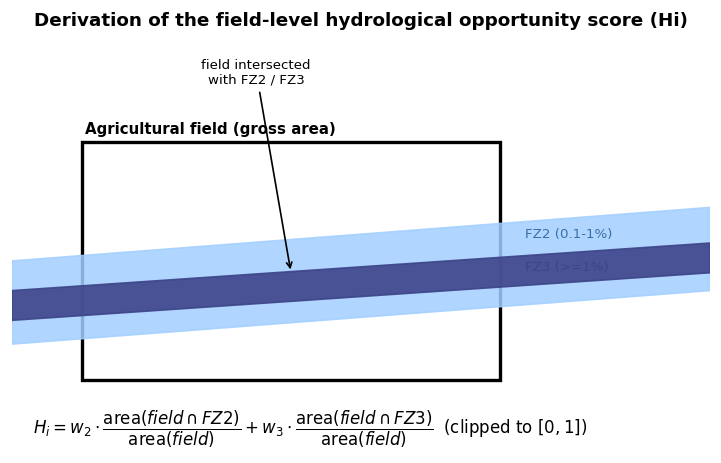

saved figure -> H_derivation_schematic.png


In [ ]:
# Methodology figure: derivation of Hi from Flood Zones 2 & 3 (illustrative schematic)
from matplotlib.patches import Rectangle, Polygon as MPolygon
fig, ax = plt.subplots(figsize=(7.5, 4.5)); ax.set_xlim(0, 10); ax.set_ylim(0, 7); ax.axis("off")
ax.set_title("Derivation of the field-level hydrological opportunity score (Hi)", fontweight="bold", fontsize=11)
ax.add_patch(Rectangle((1, 1.2), 6, 4, fill=False, edgecolor="black", lw=2))
ax.text(1.05, 5.35, "Agricultural field (gross area)", fontweight="bold", fontsize=9)
ax.add_patch(MPolygon([(0, 1.8), (10, 2.7), (10, 4.1), (0, 3.2)], closed=True, color="#a2cfff", alpha=0.85))
ax.add_patch(MPolygon([(0, 2.2), (10, 3.0), (10, 3.5), (0, 2.7)], closed=True, color="#3d4489", alpha=0.9))
ax.text(7.35, 3.6, "FZ2 (0.1-1%)", fontsize=8, color="#3a6ea5")
ax.text(7.35, 3.05, "FZ3 (>=1%)", fontsize=8, color="#3d4489")
ax.annotate("field intersected\nwith FZ2 / FZ3", xy=(4, 3.0), xytext=(3.5, 6.2),
            ha="center", fontsize=8, arrowprops=dict(arrowstyle="->"))
ax.text(0.3, 0.3, r"$H_i = w_2\cdot\dfrac{\mathrm{area}(field \cap FZ2)}{\mathrm{area}(field)}"
                  r" + w_3\cdot\dfrac{\mathrm{area}(field \cap FZ3)}{\mathrm{area}(field)}$"
                  r"$\;$ (clipped to $[0,1]$)", fontsize=10)
save_dissertation_figure(fig, FIG / "H_derivation_schematic.png", bbox_inches="tight", dpi=300, facecolor="white")
plt.show(); plt.close(fig); print("saved figure -> H_derivation_schematic.png")

Fields with 0 are kept as having no mapped flood-zone overlap. Positive scores are divided into ten classes from lowest to highest opportunity.

The score is used for spatial comparison and to identify places where low compensation coincides with mapped floodplain overlap. It is not  included in the compensation equation and should not be interpreted as intervention effectiveness.

In [ ]:
# Load the regrouped dataset.
# Change the filename if your corrected file has a different name.
parcels = load_vector(
    OUT / "agriculture_regrouped.gpkg",
    layer="agriculture"
)

if "field_id" not in parcels.columns:
    parcels["field_id"] = parcels.index.astype(str)

before_n = len(parcels)

land_use = (
    parcels["land_use"]
    .astype("string")
    .str.strip()
    .str.casefold()
    .replace("", pd.NA)
)

# Exclude non-agricultural, water and unresolved classifications.
exclude_groups = {
    "water",
    "non-agricultural land",
    "non-agricultural",       # Legacy label
    "unclassified",
    "unrecognised",
    "unrecognized",
    "unknown",
    "<na>",
    "nan"
}

drop_group = land_use.isna() | land_use.isin(exclude_groups)

# Retain the existing exclusion flag, handling Boolean/0/1/text values.
drop_flag = pd.Series(False, index=parcels.index)

if "excluded" in parcels.columns:
    flag = (
        parcels["excluded"]
        .astype("string")
        .str.strip()
        .str.casefold()
        .replace("", pd.NA)
    )

    true_values = {"true", "1", "1.0", "yes"}
    false_values = {"false", "0", "0.0", "no"}

    unexpected = set(flag.dropna()) - true_values - false_values
    if unexpected:
        raise ValueError(f"Unrecognised excluded flag values: {unexpected}")

    drop_flag = flag.isin(true_values)

drop = drop_group | drop_flag

print("\nExcluded records by land-use group:")
print(
    parcels.loc[drop, "land_use"]
    .fillna("Missing group")
    .value_counts()
    .to_string()
)

print(f"\nExcluded by land-use group: {drop_group.sum():,}")
print(
    "Additional records excluded by existing flag: "
    f"{(drop_flag & ~drop_group).sum():,}"
)

parcels = parcels.loc[~drop].copy()
REGION_LIST = sorted(parcels["region"].dropna().unique())

print(
    f"\nKept {len(parcels):,} parcels across {len(REGION_LIST)} regions "
    f"(dropped {before_n - len(parcels):,})."
)


Excluded records by land-use group:
land_use
Non-Agricultural Land    28637
Missing group              498
Trees                      388
Grassland                  373
Cereal Crops               127
Water                       93
Leguminous Crops             6

Excluded by land-use group: 29,228
Additional records excluded by existing flag: 894

Kept 652,501 parcels across 9 regions (dropped 30,122).


In [ ]:
# Build ONE Rivers & Sea flood layer (FZ2 + FZ3) from the planning.data.gov.uk parquet.
FLOOD_SRC     = PATHS["flood_risk_zone"]
FLOOD_OUT     = OUT / "flood_zones_2_3.gpkg"
FLOOD_SRC_CRS = "EPSG:4326"

def cached_layer_is_valid(path):
    """True only if `path` exists, is non-empty, AND actually opens."""
    if not path.exists() or path.stat().st_size == 0:
        return False
    try:
        gpd.read_file(path, rows=1)
        return True
    except Exception:
        return False

if cached_layer_is_valid(FLOOD_OUT) and not FORCE_REBUILD:
    print(f"Combined flood layer already exists and is readable: {FLOOD_OUT.name}")

elif FLOOD_SRC.exists():
    fr = pd.read_parquet(FLOOD_SRC, columns=["flood-risk-level", "geometry"])
    print(f"Read {len(fr):,} rows; {fr['geometry'].isna().sum():,} have no geometry (dropped).")
    fr = fr.dropna(subset=["geometry"])
    fr = fr[fr["flood-risk-level"].astype(str).isin(["2", "3"])].copy()
    fz = gpd.GeoDataFrame(fr, geometry=gpd.GeoSeries.from_wkt(fr["geometry"]), crs=FLOOD_SRC_CRS)
    fz = fz.to_crs(ANALYSIS_CRS)
    fz = fz.rename(columns={"flood-risk-level": "flood_zone"})[["flood_zone", "geometry"]]
    fz = repair(fz)
    fz.to_file(FLOOD_OUT, driver="GPKG")
    print(f"Saved {len(fz):,} polygons (FZ2+FZ3, {fz.geometry.area.sum()/1e6:,.0f} km2) -> {FLOOD_OUT.name}")
else:
    print(f"Flood source not found: {FLOOD_SRC}")
    print("Pipeline will run COST-ONLY. Put flood-risk-zone.parquet in raw/ to enable Hi.")

PATHS["fz2"] = FLOOD_OUT
PATHS["fz3"] = OUT / "__unused_fz3__.gpkg"

Combined flood layer already exists and is readable: flood_zones_2_3.gpkg


``` json
FZ_WEIGHTS = {"2": 0.5, "3": 1.0}
CACHE_DIR = Path("processed/flood_zone_cache")
FORCE_RECOMPUTE = False  # True ignores the saved result for this run.
CACHE_VERSION = 1  # Increase if you change loading, repair or overlay behaviour.

_started = time.monotonic()


def check_in(message):
    print(f"[Flood | {time.monotonic() - _started:,.1f}s] {message}", flush=True)


def overlap_fraction_by_zone(fields, layer, region_list, zcol="flood_zone"):
    """One bounded overlay per region, using GROSS geometry area."""
    out = []
    for i, reg in enumerate(region_list, 1):
        f_r = fields[fields["region"] == reg]
        if f_r.empty:
            check_in(f"Region {i}/{len(region_list)}: {reg} — no fields; skipped.")
            continue
        check_in(f"Region {i}/{len(region_list)}: {reg} — {len(f_r):,} fields; selecting flood polygons.")
        minx, miny, maxx, maxy = f_r.total_bounds
        l_r = layer.cx[minx:maxx, miny:maxy]
        fa = f_r.set_index("field_id").geometry.area
        base = pd.DataFrame(index=f_r["field_id"].values)
        check_in(f"{reg}: overlay starting with {len(l_r):,} flood polygons. Large overlays may take time.")
        if not l_r.empty:
            ov = gpd.overlay(
                f_r[["field_id", "geometry"]], l_r[[zcol, "geometry"]],
                how="intersection", keep_geom_type=False,
            )
            if not ov.empty:
                ov["_a"] = ov.geometry.area
                g = ov.groupby(["field_id", zcol])["_a"].sum().unstack(fill_value=0)
                base = base.join(g.div(fa.reindex(g.index), axis=0))
        out.append(base)
        check_in(f"{reg}: complete.")
    res = pd.concat(out) if out else pd.DataFrame()
    res = res.reindex(columns=["2", "3"], fill_value=0).fillna(0).clip(0, 1)
    res.columns = ["frac_fz2", "frac_fz3"]
    return res.rename_axis("field_id").reset_index()


_regions = list(dict.fromkeys(REGION_LIST))
if parcels["field_id"].isna().any() or parcels["field_id"].duplicated().any():
    raise ValueError("field_id must be non-null and unique before computing flood fractions.")

fz_paths = [Path(PATHS[k]) for k in ("fz2", "fz3") if Path(PATHS[k]).exists()]
HAS_FLOOD = bool(fz_paths)
parcels = parcels.drop(columns=["frac_fz2", "frac_fz3"], errors="ignore")

if HAS_FLOOD:
    check_in("Checking saved output against field geometries and flood file metadata...")
    # Hash field inputs without reading the flood files. File size/mtime detect
    # ordinary source changes; use FORCE_RECOMPUTE if source metadata is preserved.
    _digest = hashlib.sha256()
    _digest.update(pd.util.hash_pandas_object(
        parcels[["field_id", "region"]], index=False,
    ).values.tobytes())
    _digest.update(pd.util.hash_pandas_object(
        parcels.geometry.to_wkb(), index=False,
    ).values.tobytes())
    _metadata = {
        "version": CACHE_VERSION,
        "field_hash": _digest.hexdigest(),
        "field_crs": str(parcels.crs),
        "analysis_crs": str(ANALYSIS_CRS),
        "regions": [str(r) for r in _regions],
        "sources": [
            {"path": str(p.resolve()), "size": p.stat().st_size,
             "mtime_ns": p.stat().st_mtime_ns}
            for p in fz_paths
        ],
    }
    _key = hashlib.sha256(json.dumps(_metadata, sort_keys=True).encode()).hexdigest()[:24]
    CACHE_DIR.mkdir(parents=True, exist_ok=True)
    _cache = CACHE_DIR / f"flood_fractions_{_key}.parquet"
    zf = None
    if _cache.exists() and not FORCE_RECOMPUTE:
        try:
            zf = pd.read_parquet(_cache)
            if not {"field_id", "frac_fz2", "frac_fz3"}.issubset(zf.columns):
                raise ValueError("Missing cache columns")
            if zf["field_id"].duplicated().any():
                raise ValueError("Duplicate cached field IDs")
            check_in(f"Saved fractions loaded: {_cache} — flood loading and overlays skipped.")
        except Exception as exc:
            check_in(f"Could not use saved fractions ({exc}); recomputing.")
            zf = None
    if zf is None:
        layers = []
        for i, p in enumerate(fz_paths, 1):
            check_in(f"Loading flood file {i}/{len(fz_paths)}: {p.name}")
            layers.append(load_vector(p))
        check_in("Flood files loaded; repairing geometries...")
        fz = repair(gpd.GeoDataFrame(pd.concat(layers, ignore_index=True), crs=ANALYSIS_CRS))
        if fz.crs != parcels.crs:
            raise ValueError("Flood data and parcels must use the same projected CRS.")
        if parcels.crs is None or parcels.crs.is_geographic:
            raise ValueError("Use a projected analysis CRS for area fractions.")
        # Preserve your original handling of unlabelled union data.
        if "flood_zone" not in fz.columns:
            fz["flood_zone"] = "3"
        fz["flood_zone"] = fz["flood_zone"].astype(str).str.extract(r"(2|3)")[0].fillna("3")
        check_in(f"Ready: {len(fz):,} flood polygons across {len(_regions)} regions.")
        zf = overlap_fraction_by_zone(parcels, fz, _regions)
        # Replace only after a successful write, so interrupted writes aren't reused.
        _temp = _cache.with_suffix(".tmp.parquet")
        zf.to_parquet(_temp, index=False)
        _temp.replace(_cache)
        _cache.with_suffix(".json").write_text(json.dumps(_metadata, indent=2))
        check_in(f"Saved reusable fractions: {_cache}")
    parcels = parcels.merge(zf, on="field_id", how="left", validate="one_to_one")
    parcels[["frac_fz2", "frac_fz3"]] = parcels[["frac_fz2", "frac_fz3"]].fillna(0.0)
    # Weights are deliberately excluded from the cache key: changing them is cheap.
    # As in the original, overlapping zones/polygons can double-count area.
    # Equal weights represent a union fraction only for non-overlapping inputs.
    parcels["H_score"] = (
        FZ_WEIGHTS["2"] * parcels["frac_fz2"] + FZ_WEIGHTS["3"] * parcels["frac_fz3"]
    ).clip(0, 1)
    check_in(
        f"Hi mean {parcels['H_score'].mean():.3f}; "
        f"{(parcels['H_score'] > 0).mean() * 100:.1f}% of fields touch FZ2/FZ3 "
        f"(weights FZ2={FZ_WEIGHTS['2']}, FZ3={FZ_WEIGHTS['3']})."
    )
else:
    parcels["frac_fz2"] = 0.0
    parcels["frac_fz3"] = 0.0
    parcels["H_score"] = 0.0
    check_in("No Flood Zone 2/3 data found -> Hi unavailable; pipeline runs COST-ONLY.")
    print("Stage 6 will report affordability tiers instead of the Hi x Pi* typology.")
    print("To enable it, put flood-risk-zone.parquet in raw/ and run cell 3.0 above.")

if parcels["H_score"].nunique() > 1:
    parcels["H_decile"] = pd.qcut(parcels["H_score"].rank(method="first"), 10, labels=False) + 1
else:
    parcels["H_decile"] = 1

# Small standalone output for reporting, without duplicating all parcel geometry.
CACHE_DIR.mkdir(parents=True, exist_ok=True)
_scores = CACHE_DIR / "field_flood_scores.parquet"
_scores_temp = _scores.with_suffix(".tmp.parquet")
parcels[["field_id", "frac_fz2", "frac_fz3", "H_score", "H_decile"]].to_parquet(_scores_temp, index=False)
_scores_temp.replace(_scores)
check_in(f"Finished. Field scores saved to {_scores}")
print(parcels["H_score"].describe().round(3))

```

In [ ]:
"""Replacement notebook cell: progress messages and reusable flood fractions.

Uses your existing parcels, PATHS, ANALYSIS_CRS, REGION_LIST, repair and
load_vector objects. Cache paths are relative to the notebook working directory.
"""

import hashlib
import json
import time
from pathlib import Path
import os
import geopandas as gpd
import pandas as pd

FZ_WEIGHTS = {"2": 0.5, "3": 1.0}
CACHE_DIR = OUT / "flood_zone_cache"
FORCE_RECOMPUTE = False  # True ignores the saved result for this run.
CACHE_VERSION = 1  # Increase if you change loading, repair or overlay behaviour.

_started = time.monotonic()


def check_in(message):
    print(f"[Flood | {time.monotonic() - _started:,.1f}s] {message}", flush=True)


def overlap_fraction_by_zone(fields, layer, region_list, zcol="flood_zone"):
    """One bounded overlay per region, using GROSS geometry area."""
    out = []
    for i, reg in enumerate(region_list, 1):
        f_r = fields[fields["region"] == reg]
        if f_r.empty:
            check_in(f"Region {i}/{len(region_list)}: {reg} — no fields; skipped.")
            continue
        check_in(f"Region {i}/{len(region_list)}: {reg} — {len(f_r):,} fields; selecting flood polygons.")
        minx, miny, maxx, maxy = f_r.total_bounds
        l_r = layer.cx[minx:maxx, miny:maxy]
        fa = f_r.set_index("field_id").geometry.area
        base = pd.DataFrame(index=f_r["field_id"].values)
        check_in(f"{reg}: overlay starting with {len(l_r):,} flood polygons. Large overlays may take time.")
        if not l_r.empty:
            ov = gpd.overlay(
                f_r[["field_id", "geometry"]], l_r[[zcol, "geometry"]],
                how="intersection", keep_geom_type=False,
            )
            if not ov.empty:
                ov["_a"] = ov.geometry.area
                g = ov.groupby(["field_id", zcol])["_a"].sum().unstack(fill_value=0)
                base = base.join(g.div(fa.reindex(g.index), axis=0))
        out.append(base)
        check_in(f"{reg}: complete.")
    res = pd.concat(out) if out else pd.DataFrame()
    res = res.reindex(columns=["2", "3"], fill_value=0).fillna(0).clip(0, 1)
    res.columns = ["frac_fz2", "frac_fz3"]
    return res.rename_axis("field_id").reset_index()


_regions = list(dict.fromkeys(REGION_LIST))
if parcels["field_id"].isna().any() or parcels["field_id"].duplicated().any():
    raise ValueError("field_id must be non-null and unique before computing flood fractions.")

# A completed score file is sufficient for later parcel-level H analyses.
# Set NFM_FLOOD_SCORES to its exact absolute path if it is outside data/processed.
_score_override = os.environ.get("NFM_FLOOD_SCORES")
_score_candidates = (
    [Path(_score_override).expanduser()] if _score_override else [
        CACHE_DIR / "field_flood_scores.parquet",
        OUT / "field_flood_scores.parquet",
    ]
)
scores_path = next((p for p in _score_candidates if p.is_file()), None)
if _score_override and scores_path is None:
    raise FileNotFoundError(f"NFM_FLOOD_SCORES does not exist: {Path(_score_override).expanduser()}")

if scores_path is not None:
    score_columns = ["field_id", "frac_fz2", "frac_fz3", "H_score", "H_decile"]
    scores = pd.read_parquet(scores_path, columns=score_columns)
    if scores["field_id"].isna().any() or scores["field_id"].duplicated().any():
        raise ValueError("Saved flood scores have missing or duplicate field IDs.")
    if parcels["field_id"].isna().any() or parcels["field_id"].duplicated().any():
        raise ValueError("Analytical parcels have missing or duplicate field IDs.")
    if len(scores) != len(parcels) or set(scores["field_id"]) != set(parcels["field_id"]):
        raise ValueError("Saved scores do not match this exact parcel dataset.")
    for column in ("frac_fz2", "frac_fz3", "H_score"):
        scores[column] = pd.to_numeric(scores[column], errors="raise")
        if scores[column].isna().any() or not scores[column].between(0, 1).all():
            raise ValueError(f"Saved {column} must be complete and within [0, 1].")
    scores["H_decile"] = pd.to_numeric(scores["H_decile"], errors="raise")
    if scores["H_decile"].isna().any() or not scores["H_decile"].between(1, 10).all():
        raise ValueError("Saved H_decile must be complete and within 1–10.")
    parcels = parcels.drop(columns=score_columns[1:], errors="ignore").merge(
        scores, on="field_id", how="left", validate="one_to_one"
    )
    HAS_FLOOD = True
    fz_paths = []  # No geometry file is required to reuse field-level scores.
    check_in(f"Loaded {len(parcels):,} matched flood scores from {scores_path.resolve()}.")
    check_in("Flood polygon loading and overlays skipped.")
    print(parcels["H_score"].describe().round(3))
else:
    fz_paths = [Path(PATHS[k]) for k in ("fz2", "fz3") if Path(PATHS[k]).exists()]
    HAS_FLOOD = bool(fz_paths)
    parcels = parcels.drop(columns=["frac_fz2", "frac_fz3"], errors="ignore")

    if HAS_FLOOD:
        check_in("Checking saved output against field geometries and flood file metadata...")
        # Hash field inputs without reading the flood files. File size/mtime detect
        # ordinary source changes; use FORCE_RECOMPUTE if source metadata is preserved.
        _digest = hashlib.sha256()
        _digest.update(pd.util.hash_pandas_object(
            parcels[["field_id", "region"]], index=False,
        ).values.tobytes())
        _digest.update(pd.util.hash_pandas_object(
            parcels.geometry.to_wkb(), index=False,
        ).values.tobytes())
        _metadata = {
            "version": CACHE_VERSION,
            "field_hash": _digest.hexdigest(),
            "field_crs": str(parcels.crs),
            "analysis_crs": str(ANALYSIS_CRS),
            "regions": [str(r) for r in _regions],
            "sources": [
                {"path": str(p.resolve()), "size": p.stat().st_size,
                 "mtime_ns": p.stat().st_mtime_ns}
                for p in fz_paths
            ],
        }
        _key = hashlib.sha256(json.dumps(_metadata, sort_keys=True).encode()).hexdigest()[:24]
        CACHE_DIR.mkdir(parents=True, exist_ok=True)
        _cache = CACHE_DIR / f"flood_fractions_{_key}.parquet"
        zf = None
        if _cache.exists() and not FORCE_RECOMPUTE:
            try:
                zf = pd.read_parquet(_cache)
                if not {"field_id", "frac_fz2", "frac_fz3"}.issubset(zf.columns):
                    raise ValueError("Missing cache columns")
                if zf["field_id"].duplicated().any():
                    raise ValueError("Duplicate cached field IDs")
                check_in(f"Saved fractions loaded: {_cache} — flood loading and overlays skipped.")
            except Exception as exc:
                check_in(f"Could not use saved fractions ({exc}); recomputing.")
                zf = None
        if zf is None:
            layers = []
            for i, p in enumerate(fz_paths, 1):
                check_in(f"Loading flood file {i}/{len(fz_paths)}: {p.name}")
                layers.append(load_vector(p))
            check_in("Flood files loaded; repairing geometries...")
            fz = repair(gpd.GeoDataFrame(pd.concat(layers, ignore_index=True), crs=ANALYSIS_CRS))
            if fz.crs != parcels.crs:
                raise ValueError("Flood data and parcels must use the same projected CRS.")
            if parcels.crs is None or parcels.crs.is_geographic:
                raise ValueError("Use a projected analysis CRS for area fractions.")
            # Preserve your original handling of unlabelled union data.
            if "flood_zone" not in fz.columns:
                fz["flood_zone"] = "3"
            fz["flood_zone"] = fz["flood_zone"].astype(str).str.extract(r"(2|3)")[0].fillna("3")
            check_in(f"Ready: {len(fz):,} flood polygons across {len(_regions)} regions.")
            zf = overlap_fraction_by_zone(parcels, fz, _regions)
            # Replace only after a successful write, so interrupted writes aren't reused.
            _temp = _cache.with_suffix(".tmp.parquet")
            zf.to_parquet(_temp, index=False)
            _temp.replace(_cache)
            _cache.with_suffix(".json").write_text(json.dumps(_metadata, indent=2))
            check_in(f"Saved reusable fractions: {_cache}")
        parcels = parcels.merge(zf, on="field_id", how="left", validate="one_to_one")
        parcels[["frac_fz2", "frac_fz3"]] = parcels[["frac_fz2", "frac_fz3"]].fillna(0.0)
        # Weights are deliberately excluded from the cache key: changing them is cheap.
        # As in the original, overlapping zones/polygons can double-count area.
        # Equal weights represent a union fraction only for non-overlapping inputs.
        parcels["H_score"] = (
            FZ_WEIGHTS["2"] * parcels["frac_fz2"] + FZ_WEIGHTS["3"] * parcels["frac_fz3"]
        ).clip(0, 1)
        check_in(
            f"Hi mean {parcels['H_score'].mean():.3f}; "
            f"{(parcels['H_score'] > 0).mean() * 100:.1f}% of fields touch FZ2/FZ3 "
            f"(weights FZ2={FZ_WEIGHTS['2']}, FZ3={FZ_WEIGHTS['3']})."
        )
    else:
        parcels["frac_fz2"] = 0.0
        parcels["frac_fz3"] = 0.0
        parcels["H_score"] = 0.0
        check_in("No Flood Zone 2/3 data found -> Hi unavailable; pipeline runs COST-ONLY.")
        print("Stage 6 will report affordability tiers instead of the Hi x Pi* typology.")
        print("To enable it, put flood-risk-zone.parquet in raw/ and run cell 3.0 above.")

    if parcels["H_score"].nunique() > 1:
        parcels["H_decile"] = pd.qcut(parcels["H_score"].rank(method="first"), 10, labels=False) + 1
    else:
        parcels["H_decile"] = 1

    # Small standalone output for reporting, without duplicating all parcel geometry.
    CACHE_DIR.mkdir(parents=True, exist_ok=True)
    _scores = CACHE_DIR / "field_flood_scores.parquet"
    _scores_temp = _scores.with_suffix(".tmp.parquet")
    parcels[["field_id", "frac_fz2", "frac_fz3", "H_score", "H_decile"]].to_parquet(_scores_temp, index=False)
    _scores_temp.replace(_scores)
    check_in(f"Finished. Field scores saved to {_scores}")
    print(parcels["H_score"].describe().round(3))


[Flood | 14.0s] Loaded 652,501 matched flood scores from /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/field_flood_scores.parquet.
[Flood | 14.0s] Flood polygon loading and overlays skipped.
count    652501.000
mean          0.132
std           0.296
min           0.000
25%           0.000
50%           0.000
75%           0.036
max           1.000
Name: H_score, dtype: float64


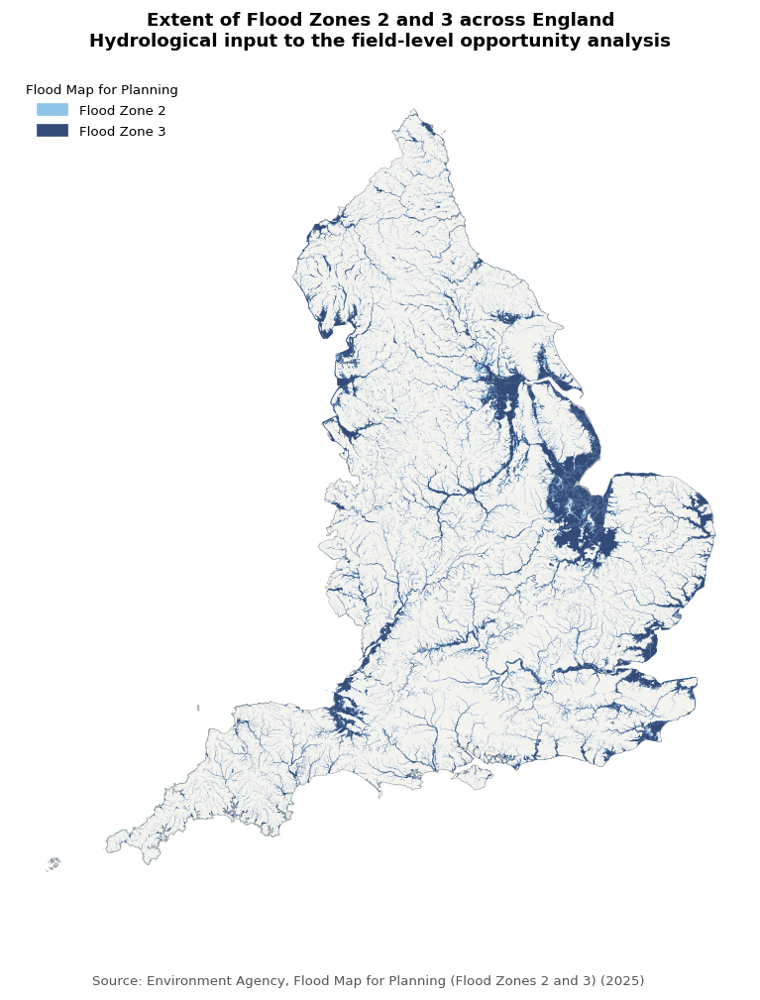

In [ ]:
# Flood Zones 2 and 3 across England: hydrological input to the analysis
try:
    flood_path = Path(PATHS["fz2"])

    if flood_path.exists():
        fzmap = load_vector(flood_path).copy()

        # Simplification is for display only; it does not change the
        # flood-overlap calculations used elsewhere in the notebook.
        fzmap["geometry"] = fzmap.geometry.simplify(50)

        if "flood_zone" not in fzmap.columns:
            fzmap["flood_zone"] = "3"

        fig, ax = plt.subplots(figsize=(8, 9))
        ax.axis("off")

        england.plot(
            ax=ax,
            color="#F3F3F0",
            edgecolor="#B8B8B8",
            linewidth=0.4,
        )

        zone_colours = {
            "2": "#8EC5E8",
            "3": "#344B78",
        }

        for zone, colour in zone_colours.items():
            subset = fzmap.loc[
                fzmap["flood_zone"].astype(str).str.contains(
                    zone, regex=False, na=False
                )
            ]
            if not subset.empty:
                subset.plot(ax=ax, color=colour, linewidth=0)

        ax.set_title(
            "Extent of Flood Zones 2 and 3 across England\n"
            "Hydrological input to the field-level opportunity analysis",
            fontsize=13,
            fontweight="bold",
            pad=15,
        )

        ax.legend(
            handles=[
                mpatches.Patch(
                    color=zone_colours["2"], label="Flood Zone 2"
                ),
                mpatches.Patch(
                    color=zone_colours["3"], label="Flood Zone 3"
                ),
            ],
            loc="upper left",
            fontsize=9,
            frameon=False,
            title="Flood Map for Planning",
        )

        fig.text(
            0.5,
            0.02,
            "Source: Environment Agency, Flood Map for Planning "
            "(Flood Zones 2 and 3) (2025)",
            ha="center",
            va="bottom",
            fontsize=8,
            color="#555555",
            wrap=True,
        )

        fig.subplots_adjust(bottom=0.09)
        export_figure(fig, "RQ1_flood_zones")
        plt.show()
        plt.close(fig)

    else:
        print("Flood-zone layer not found; England flood-zone map skipped.")

except Exception as exc:
    print(
        "England flood-zone map could not be displayed:",
        type(exc).__name__,
        exc,
    )

In [ ]:
# H results: distribution stats, decile table, and by-region/catchment table
if HAS_FLOOD and parcels["H_score"].nunique() > 1:
    s = parcels["H_score"]; q1, q3 = s.quantile([0.25, 0.75])
    print(f"H_score: median {s.median():.3f}, IQR {q1:.3f}-{q3:.3f}; "
          f"{(s<=0).mean()*100:.1f}% of fields have NO FZ2/FZ3 overlap.")

    # RH1 - fields and area by hydrological-opportunity decile
    dec = (parcels.groupby("H_decile").agg(n_fields=("field_id","count"),
            area_ha=("size_ha","sum"), mean_H=("H_score","mean")).reset_index())
    dec["pct_area"] = (dec["area_ha"]/dec["area_ha"].sum()*100).round(1)
    dec["area_ha"] = dec["area_ha"].round(0); dec["mean_H"] = dec["mean_H"].round(3)
    save_table(dec, "RH1_H_by_decile"); print("\n", dec.to_string(index=False))

    # RH2/RH3 - H_score distribution by region and (if present) catchment
    def h_by(col):
        return (parcels.groupby(col)["H_score"].agg(
                    n="count", median="median",
                    q1=lambda x: x.quantile(0.25), q3=lambda x: x.quantile(0.75),
                    pct_overlap=lambda x: (x>0).mean()*100).round(3).reset_index()
                .sort_values("median", ascending=False))
    save_table(h_by("region"), "RH2_H_by_region"); print("\n", h_by("region").to_string(index=False))
    if "catchment" in parcels.columns:
        hc = h_by("catchment"); save_table(hc, "RH3_H_by_catchment")
        print("\nTop 10 catchments by median H_score:\n", hc.head(10).to_string(index=False))
else:
    print("No H variation -> H results skipped (no flood data).")

H_score: median 0.000, IQR 0.000-0.036; 67.3% of fields have NO FZ2/FZ3 overlap.
saved table: RH1_H_by_decile.csv

  H_decile  n_fields   area_ha  mean_H  pct_area
        1     65251  500022.0   0.000       5.9
        2     65250  518149.0   0.000       6.1
        3     65250  504823.0   0.000       6.0
        4     65250  506621.0   0.000       6.0
        5     65250  510769.0   0.000       6.0
        6     65250  725406.0   0.000       8.6
        7     65250 1002122.0   0.000      11.9
        8     65250 2082837.0   0.043      24.6
        9     65250 1238084.0   0.318      14.6
       10     65250  864213.0   0.957      10.2
saved table: RH2_H_by_region.csv

                   region      n  median  q1    q3  pct_overlap
           East Midlands  75781     0.0 0.0 0.215       40.056
         East of England  89783     0.0 0.0 0.112       37.683
                  London   1307     0.0 0.0 0.000       22.265
              North East  24757     0.0 0.0 0.011       30.189
      

### Flood-zone overlap distribution

The first panel distinguishes records with no mapped Flood Zone 2/3 overlap from those with a positive hydrological score. The second panel shows the score distribution **only among positive-overlap records**, so its y-axis has a different denominator. Percentages and the median are calculated from the current analytical `parcels` table rather than copied from a previous figure.


In [ ]:
land_use = parcels["land_use"].astype("string").str.strip().str.casefold()
parcels["is_agricultural"] = land_use.isin({
    "grassland", "cereal crops", "leguminous crops"
})

excluded = (
    parcels["excluded"].astype("string").str.strip().str.casefold()
    .map({
        "false": False, "0": False, "0.0": False,
        "true": True, "1": True, "1.0": True,
    })
)
if excluded.isna().any():
    raise ValueError("Missing or unrecognised excluded flags.")

available_area = pd.to_numeric(parcels["available_ha"], errors="coerce")
h = pd.to_numeric(parcels["H_score"], errors="coerce")
decile = pd.to_numeric(parcels["H_decile"], errors="coerce")
if available_area.isna().any() or h.isna().any() or decile.isna().any():
    raise ValueError("Available area or flood scores are missing.")

parcels["is_available"] = ~excluded & available_area.gt(0)
parcels["flood_risk_any"] = h.gt(0)
parcels["flood_risk_elevated"] = h.gt(0) & decile.ge(8)
parcels["nfm_opportunity"] = (
    parcels["is_agricultural"]
    & parcels["is_available"]
    & parcels["flood_risk_elevated"]
)

agricultural = parcels["is_agricultural"]
available_agricultural = agricultural & parcels["is_available"]

stages = [
    ("All analytical parcels", pd.Series(True, index=parcels.index)),
    ("Agricultural production land use", agricultural),
    ("...and physically available", available_agricultural),
    ("...and elevated mapped flood overlap (H decile ≥8)",
     parcels["nfm_opportunity"]),
]
funnel = pd.DataFrame([
    {
        "stage": label,
        "n_parcels": int(mask.sum()),
        "area_ha": round(parcels.loc[mask, "size_ha"].sum()),
    }
    for label, mask in stages
])
funnel["pct_of_sample_parcels"] = (
    100 * funnel["n_parcels"] / len(parcels)
).round(1)
save_table(funnel, "RQ1a_screening_funnel")
display(funnel)

saved table: RQ1a_screening_funnel.csv


,stage,n_parcels,area_ha,pct_of_sample_parcels
0,All analytical parcels,652501,8453046,100.0
1,Agricultural production land use,523611,7888873,80.2
2,...and physically available,523611,7888873,80.2
3,...and elevated mapped flood overlap (H decile ≥8),155737,3867766,23.9


In [ ]:
# RQ1b - opportunity extent by reporting geography (Tables)
parcels["_opportunity_area_ha"] = np.where(parcels["nfm_opportunity"], parcels["size_ha"], 0.0)

def rq1_by(by):
    g = (parcels.groupby(by)
         .agg(n_parcels=("field_id", "count"), area_ha=("size_ha", "sum"),
              n_opportunity=("nfm_opportunity", "sum"),
              opportunity_area_ha=("_opportunity_area_ha", "sum"))
         .reset_index())
    g["pct_parcels_opportunity"] = (g["n_opportunity"] / g["n_parcels"] * 100).round(1)
    g["pct_area_opportunity"] = (g["opportunity_area_ha"] / g["area_ha"] * 100).round(1)
    return g.sort_values("pct_area_opportunity", ascending=False)

for by, name in [("catchment", "RQ1b_by_catchment"),
                 ("local_authority", "RQ1c_by_local_authority"),
                 ("region", "RQ1d_by_region")]:
    tab = rq1_by(by); save_table(tab, name)
    print(f"\nTop 10 {by} by % area meeting the RQ1 opportunity screen:")
    print(tab.head(10).to_string(index=False))

saved table: RQ1b_by_catchment.csv

Top 10 catchment by % area meeting the RQ1 opportunity screen:
          catchment  n_parcels      area_ha  n_opportunity  opportunity_area_ha  pct_parcels_opportunity  pct_area_opportunity
Humber Estuary TraC          1   156.417893              1           156.417893                    100.0                 100.0
      Morecambe Bay          1   442.512152              1           442.512152                    100.0                 100.0
         Nene Lower       2901 53165.892116           2608         52288.089526                     89.9                  98.3
 Romney Marsh South        191  5006.109595            174          4747.626995                     91.1                  94.8
      Welland Lower       1873 34721.493006           1558         32354.497472                     83.2                  93.2
 Fens East and West       2092 41815.720949           1677         38390.186729                     80.2                  91.8
   North Tyn

In [ ]:
# RQ1e - composition of the opportunity area by land use / farm type / ALC grade
for col, name in [("land_use", "RQ1e_opportunity_by_landuse"),
                   ("farm_type", "RQ1f_opportunity_by_farmtype"),
                   ("alc_grade", "RQ1g_opportunity_by_alc")]:
    if col in parcels.columns:
        t = (parcels[parcels["nfm_opportunity"]].groupby(col)
             .agg(n_parcels=("field_id", "count"), area_ha=("size_ha", "sum")).reset_index()
             .sort_values("area_ha", ascending=False))
        t["pct_of_opportunity_area"] = (t["area_ha"] / t["area_ha"].sum() * 100).round(1)
        save_table(t, name)
        print(f"\nComposition of the RQ1 opportunity area by {col}:\n", t.to_string(index=False))

saved table: RQ1e_opportunity_by_landuse.csv

Composition of the RQ1 opportunity area by land_use:
         land_use  n_parcels      area_ha  pct_of_opportunity_area
       Grassland     103310 2.118528e+06                     54.8
    Cereal Crops      50817 1.716026e+06                     44.4
Leguminous Crops       1610 3.321256e+04                      0.9
saved table: RQ1f_opportunity_by_farmtype.csv

Composition of the RQ1 opportunity area by farm_type:
               farm_type  n_parcels      area_ha  pct_of_opportunity_area
                 Arable      50685 1.714311e+06                     44.3
                   Beef      50059 9.847318e+05                     25.5
                  Sheep      26239 5.500488e+05                     14.2
                  Dairy      23289 4.744090e+05                     12.3
                 Fallow       3513 7.297524e+04                      1.9
Grazing (mixed/unknown)        228 3.673969e+04                      0.9
           Horticulture

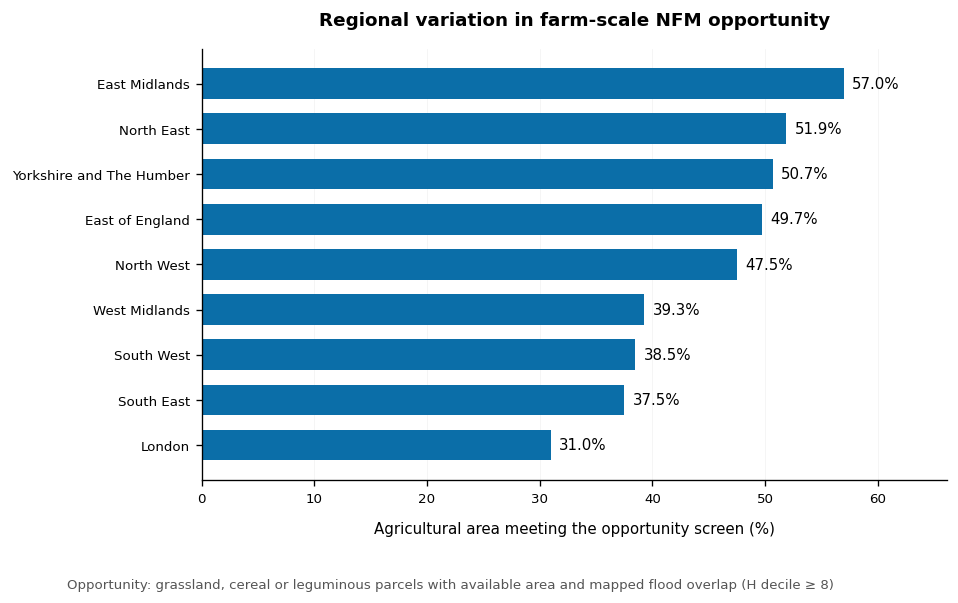

In [ ]:
# RQ1: regional variation in agricultural area meeting the opportunity screen.

reg_tab = (
    rq1_by("region")
    .sort_values("pct_area_opportunity")
    .copy()
)

values = pd.to_numeric(
    reg_tab["pct_area_opportunity"],
    errors="coerce",
)
if values.isna().any() or not values.between(0, 100).all():
    raise ValueError(
        "Regional opportunity percentages must be within 0–100."
    )

fig, ax = plt.subplots(figsize=(9, 5.8))

bars = ax.barh(
    reg_tab["region"],
    values,
    color="#0B6EA8",
    height=0.68,
)

# Leave room to the right of the longest bar for its value label.
ax.set_xlim(0, min(100, max(values.max() * 1.16, values.max() + 2)))

for bar, value in zip(bars, values):
    ax.annotate(
        f"{value:.1f}%",
        (bar.get_width(), bar.get_y() + bar.get_height() / 2),
        xytext=(5, 0),
        textcoords="offset points",
        ha="left",
        va="center",
        fontsize=9,
    )

ax.set_xlabel(
    "Agricultural area meeting the opportunity screen (%)",
    labelpad=10,
)
ax.set_title(
    "Regional variation in farm-scale NFM opportunity",
    fontweight="bold",
    pad=14,
)
ax.grid(axis="x", alpha=0.3)
ax.set_axisbelow(True)

# Reserve space for region names, axis label, and figure note.
fig.subplots_adjust(
    left=0.27,
    right=0.96,
    top=0.87,
    bottom=0.25,
)

fig.text(
    0.5, 0.1,
    "Opportunity: grassland, cereal or leguminous parcels with available area "
    "and mapped flood overlap (H decile ≥ 8)",
    ha="center",
    va="center",
    fontsize=9,
    color="#555555",
)

save_dissertation_figure(
    fig,
    FIG / "RQ1_regional_variation.png",
    dpi=300,
    facecolor="white",
)
plt.show()
plt.close(fig)

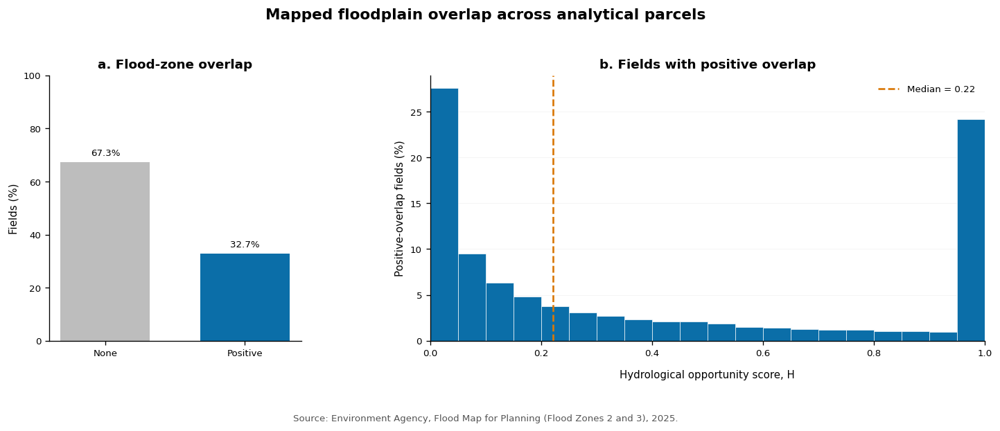

In [ ]:
# RQ1 figure: flood-zone overlap across analytical parcels.
# H_score is an area-weighted FZ2/FZ3 overlap proxy in [0, 1];
# it does not measure the flood-reduction benefit of NFM.

if HAS_FLOOD:
    h = pd.to_numeric(parcels["H_score"], errors="coerce")

    if h.isna().any() or not h.between(0, 1).all():
        raise ValueError(
            "H_score must be present and within [0, 1] "
            "for every analytical parcel."
        )

    positive = h[h > 0]
    if positive.empty:
        raise ValueError("No positive flood-zone overlap is available to plot.")

    share_none = 100 * (h == 0).mean()
    share_positive = 100 * (h > 0).mean()
    median_positive = positive.median()

    fig, (ax_overlap, ax_distribution) = plt.subplots(
        1, 2,
        figsize=(12.5, 5.8),
        gridspec_kw={"width_ratios": [1, 2.2]},
    )

    # Panel a: percentage of fields with no or positive overlap.
    values = [share_none, share_positive]
    bars = ax_overlap.bar(
        ["None", "Positive"],
        values,
        color=["#BDBDBD", "#0B6EA8"],
        width=0.64,
    )
    ax_overlap.set(
        title="a. Flood-zone overlap",
        ylabel="Fields (%)",
        ylim=(0, 100),
    )
    ax_overlap.grid(False)

    for bar, value in zip(bars, values):
        ax_overlap.annotate(
            f"{value:.1f}%",
            (bar.get_x() + bar.get_width() / 2, value),
            xytext=(0, 4),
            textcoords="offset points",
            ha="center",
            va="bottom",
            fontsize=8,
        )

    # Panel b: distribution conditional on positive overlap.
    ax_distribution.hist(
        positive,
        bins=np.linspace(0, 1, 21),
        weights=np.full(len(positive), 100 / len(positive)),
        color="#0B6EA8",
        edgecolor="white",
        linewidth=0.4,
    )
    ax_distribution.axvline(
        median_positive,
        color="#D97706",
        linestyle="--",
        linewidth=1.6,
        label=f"Median = {median_positive:.2f}",
    )
    ax_distribution.set(
        title="b. Fields with positive overlap",
        ylabel="Positive-overlap fields (%)",
        xlim=(0, 1),
    )
    ax_distribution.set_xlabel(
        "Hydrological opportunity score, H",
        labelpad=10,
    )
    ax_distribution.grid(axis="y", alpha=0.3)
    ax_distribution.set_axisbelow(True)
    ax_distribution.legend(frameon=False, loc="upper right")

    fig.suptitle(
        "Mapped floodplain overlap across analytical parcels",
        fontsize=14,
        fontweight="bold",
        y=0.96,
    )

    # Reserve separate space for axis labels and the source note.
    fig.subplots_adjust(
        left=0.08,
        right=0.98,
        top=0.82,
        bottom=0.27,
        wspace=0.32,
    )
    fig.text(
        0.5,
        0.1,
        "Source: Environment Agency, Flood Map for Planning "
        "(Flood Zones 2 and 3), 2025.",
        ha="center",
        va="bottom",
        fontsize=8,
        color="#555555",
    )

    save_dissertation_figure(
        fig,
        FIG / "RQ1_floodplain_overlap_distribution.png",
        dpi=300,
        facecolor="white",
    )
    plt.show()
    plt.close(fig)

else:
    print("Flood-zone input unavailable; overlap distribution not plotted.")

In [ ]:
from pathlib import Path
import geopandas as gpd
import pyogrio

GPKG_PATH = OUT / "parcels_with_nfm_opportunity.gpkg"
LAYER = "parcels"

if not isinstance(parcels, gpd.GeoDataFrame):
    raise TypeError("parcels must be a GeoDataFrame.")

if parcels.crs is None:
    raise ValueError("parcels has no CRS.")

GPKG_PATH.parent.mkdir(parents=True, exist_ok=True)

# This writes every column in parcels, plus its geometry.
parcels.to_file(GPKG_PATH, layer=LAYER, driver="GPKG", index=False)

# Check the saved layer's columns without loading all 652,501 fields again.
saved_info = pyogrio.read_info(GPKG_PATH, layer=LAYER)

print(f"Saved {saved_info['features']:,} fields")
print(f"Saved {len(saved_info['fields'])} attribute columns plus geometry")
print(f"File: {GPKG_PATH}")
print("Columns:", list(saved_info["fields"]))

Saved 652,501 fields
Saved 44 attribute columns plus geometry
File: /content/google_drive/MyDrive/Colab Notebooks/Scaling NFM on Agricultural Land in England/Data/processed/parcels_with_nfm_opportunity.gpkg
Columns: ['field_id', 'entity_id', 'ID', 'OWNER_ID', 'flame_source', 'source_row_id', 'farm_type', 'land_use', 'lu_flame', 'lu_crome', 'crop_type', 'crop_type_purity', 'crop_prob', 'crop_source', 'crop_old', 'crop_2020', 'alc_grade', 'alc_grade_purity', 'stocking_lsu_per_grass_ha', 'grazing_intensity', 'livestock_system', 'livestock_data_quality', 'grass_area_ha', 'total_lsu', 'area_flame', 'size_ha', 'available_ha', 'excluded_frac', 'excluded', 'region', 'local_authority', 'catchment', 'area_diff_pct', 'crop_old_group', 'frac_fz2', 'frac_fz3', 'H_score', 'H_decile', 'is_agricultural', 'is_available', 'flood_risk_any', 'flood_risk_elevated', 'nfm_opportunity', '_opportunity_area_ha']


## RQ2 — What drives participation costs, and how far do payments cover them?

The model compares agricultural opportunity cost, intervention delivery cost and assumed support for six standard designs. Farm- and owner-attributed records are kept distinct where the attribution affects interpretation. All payment results are modelled scenarios, not observed offers or willingness to accept.


The figure below summarises the methodological framework used to estimate the compensation required for farmers to implement NFM measures (RQ2). Drawing on the literature, the break-even compensation requirement is defined as the annualised payment needed to ensure that a participating farmer is no worse off financially than under the counterfactual land use, which is assumed to be agriculture.

The compensation requirement is calculated as:

$$
C_{\min}=OC+K_{\text{ij}}+P_{\text{ij}}+M_{\text{ij}}+T_{\text{ij}}
$$

| Component            | Meaning               | Costs included                                                                                                                                                            | Typical timing              |
| -------------------- | --------------------- | ------------------------------------------------------------------------------------------------------------------------------------------------------------------------- | --------------------------- |
| OC               | Opportunity cost      | Agricultural income forgone because land is used or managed for NFM rather than its counterfactual agricultural use                                                   | Recurring annually          |
| K<sub>ij</sub>   | Construction cost     | Materials, labour, machinery, earthworks, installation and site preparation directly associated with building the NFM measure                                             | Usually one-off; annualised |
| P<sub>ij</sub>      | Pre-construction cost | Feasibility studies, surveys, engineering or landscape design, hydrological assessments, planning applications, permits and preparatory consultations                     | Usually one-off; annualised |
| M<sub>ij</sub>    | Maintenance cost      | Inspections, vegetation management, sediment or debris removal, repairs and replacement of minor components                                                               | Recurring or periodic       |
| T<sub>ij</sub>    | Transaction cost      | Finding and enrolling participants, negotiating agreements, obtaining legal advice, contract administration, coordinating parties, monitoring, verification and reporting | Upfront and/or recurring    |

This does not represent a farmers’ willingness to accept (WTA). WTA may be higher than the calculated break-even amount because of perceived risk, uncertainty, inconvenience, loss of flexibility, or preferences about land management. Conversely, it may be lower if NFM generates benefits that are not captured in the cost calculation, such as improved soil condition or productivity elsewhere.

> Note: One-off costs are converted into equivalent annual costs over the expected lifetime of the NFM measures assessed using a discount rate. This enables for comparison. However, there could be a need for upfront payments to finance construction and other initial costs. It therefore represents the annual economic cost of the intervention, rather than its cash-flow requirement.

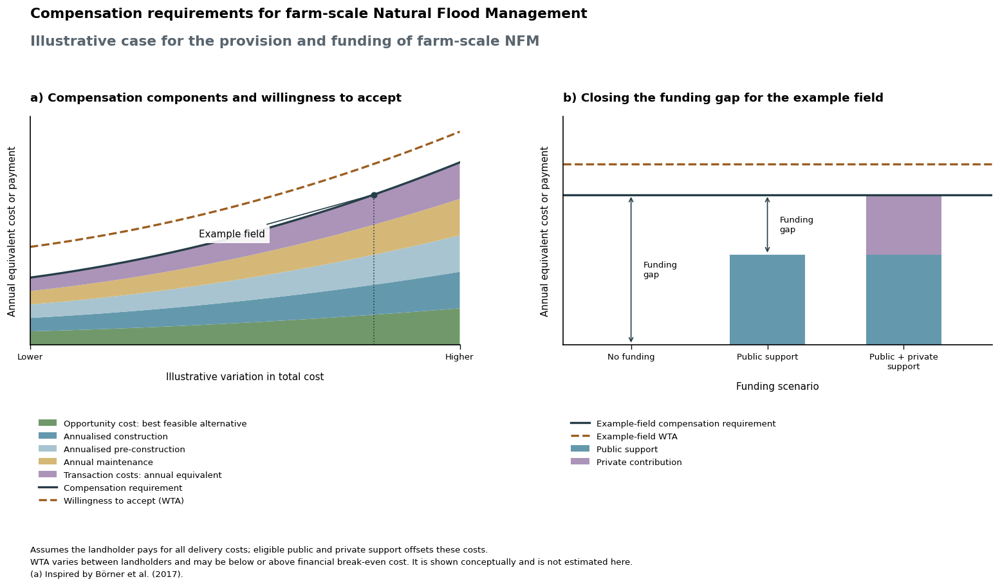

In [ ]:
# Illustrate compensation costs, WTA and how public/private funding closes the gap.
# Equal bands are schematic.
x = np.linspace(0, 1, 300)
components = np.tile(0.35 + 0.30*x + 0.30*x**2, (5, 1))
cost = components.sum(axis=0)
wta = cost + 0.80
ref_x = 0.80
ref_cost, ref_wta = np.interp(ref_x, x, cost), np.interp(ref_x, x, wta)

labels = [
    "Opportunity cost: best feasible alternative",
    "Annualised construction",
    "Annualised pre-construction",
    "Annual maintenance",
    "Transaction costs: annual equivalent",
]
colors = ["#71986B", "#6499AD", "#A8C4D0", "#D5B877", "#AB94B8"]
cost_color, wta_color = "#263E48", "#9C5E20"

fig, (a, b) = plt.subplots(1, 2, figsize=(14, 8), sharey=True)
fig.subplots_adjust(left=.08, right=.97, top=.79, bottom=.42, wspace=.24)

# Panel A: show the components, financial break-even and illustrative WTA.
a.stackplot(x, *components, colors=colors, labels=labels)
a.plot(x, cost, color=cost_color, lw=2, label="Compensation requirement")
a.plot(x, wta, color=wta_color, lw=2, ls="--",
       label="Willingness to accept (WTA)")
a.vlines(ref_x, 0, ref_cost, color=cost_color, lw=1, ls=":")
a.scatter(ref_x, ref_cost, color=cost_color, s=25, zorder=5)
a.annotate(
    "Example field", xy=(ref_x, ref_cost), xytext=(.47, ref_cost - 1.1),
    fontsize=9, ha="center",
    arrowprops={"arrowstyle": "-", "color": cost_color},
    bbox={"facecolor": "white", "edgecolor": "none", "alpha": .9},
)
a.set_title("a) Compensation components and willingness to accept",
            loc="left", fontsize=11, fontweight="bold", pad=14)
a.set(xlim=(0, 1), xlabel="Illustrative variation in total cost")
a.set_xticks([0, 1], ["Lower", "Higher"])

# Panel B: public support reduces the gap; private support covers the rest.
positions, bottom = np.arange(3), np.zeros(3)
public_support = .60 * ref_cost
private_support = ref_cost - public_support

for values, label, color in [
    ([0, public_support, public_support], "Public support", "#6499AD"),
    ([0, 0, private_support], "Private contribution", "#AB94B8"),
]:
    b.bar(positions, values, bottom=bottom, width=.55, color=color, label=label)
    bottom += np.asarray(values)

b.axhline(ref_cost, color=cost_color, lw=2,
          label="Example-field compensation requirement")
b.axhline(ref_wta, color=wta_color, lw=2, ls="--",
          label="Example-field WTA")

# Arrows to show the shortfall against financial break-even, not WTA.
for p, total in zip(positions, bottom):
    gap = ref_cost - total
    if gap > 1e-9:
        b.annotate("", xy=(p, ref_cost), xytext=(p, total),
                   arrowprops={"arrowstyle": "<->", "color": cost_color})
        b.text(p + .09, total + gap/2, "Funding\ngap",
               fontsize=8, va="center")

b.set_title("b) Closing the funding gap for the example field",
            loc="left", fontsize=11, fontweight="bold", pad=14)
b.set(xlim=(-.5, 2.65), xlabel="Funding scenario")
b.set_xticks(positions, ["No funding", "Public support",
                        "Public + private\nsupport"])

# Axes.
for axis in (a, b):
    axis.set_ylim(0, wta.max() + .4)
    axis.set_yticks([])
    axis.set_ylabel("Annual equivalent cost or payment", fontsize=10, labelpad=12)
    axis.xaxis.labelpad = 10
    axis.spines[["top", "right"]].set_visible(False)
    for side in ("left", "bottom"):
        axis.spines[side].set_color("black")
        axis.spines[side].set_linewidth(1)
    axis.tick_params(axis="x", direction="out", length=4, labelsize=9)
    axis.legend(loc="upper left", bbox_to_anchor=(0, -.29),
                frameon=False, fontsize=8.5)

# Heading, subtitle and assumptions.
fig.text(.08, .95, "Compensation requirements for farm-scale Natural Flood Management",
         fontsize=13, fontweight="semibold")
fig.text(.08, .905, "Illustrative case for the provision and funding of farm-scale NFM",
         fontsize=11, color="#59656E")

fig.text(
    .08, .045,
    "Assumes the landholder pays for all delivery costs; eligible public and private support offsets these costs.\n"
    "WTA varies between landholders and may be below or above financial break-even cost. "
    "It is shown conceptually and is not estimated here.\n"
    "(a) Inspired by Börner et al. (2017).",
    fontsize=8.5, linespacing=1.6,
)

export_figure(fig, "RQ2_compensation_framework")
plt.show()
plt.close(fig)

In [ ]:
GPKG_PATH = OUT / "parcels_with_nfm_opportunity.gpkg"
LAYER = 'parcels'
REGION = None
SOURCE = None  # None, 'farm' or 'owner'; never combine source budgets
CROP_RULE = '2024_only'  # alternative: 'mean_2020_2024', same 2026 scenario values
INTERVENTIONS_TO_RUN = ['pond','bund','barrier','swale','buffer','woodland']
IMPUTE_BLANK_CROP_MARGINS = True
MIN_AVAILABLE_SHARE = 0.10  # retained original physical-screen assumption
UNKNOWN_GRASS_GM = np.nan  # unknown/no livestock is not automatically zero
# WO12: zero agricultural gross margin only; NOT zero forestry/ecosystem value.
TREE_MARGINS = {'WO12': 0.0, 'SR01': 386.0, 'NU01': 386.0, 'TC01': 386.0}
plt.rcParams.update({'font.family':'DejaVu Sans','font.size':9,
                     'axes.spines.top':False,'axes.spines.right':False})

In [ ]:
import shutil
from pathlib import Path

GPKG_PATH = OUT / "parcels_with_nfm_opportunity.gpkg"
if not GPKG_PATH.exists():
    raise FileNotFoundError(f"GeoPackage not found: {GPKG_PATH}")

local_gpkg = Path("/tmp/parcels_with_nfm_opportunity.gpkg")
shutil.copy2(GPKG_PATH, local_gpkg)

with sqlite3.connect(local_gpkg) as con:
    layers = pd.read_sql_query(
        "SELECT table_name FROM gpkg_contents WHERE data_type='features'",
        con,
    )
    if LAYER not in layers.table_name.tolist():
        raise ValueError(f"Choose LAYER from {layers.table_name.tolist()}")

In [ ]:
required = ['field_id','flame_source','crop_type','crop_2020','size_ha','available_ha','excluded',
            'stocking_lsu_per_grass_ha','grass_area_ha','total_lsu','livestock_system','livestock_data_quality']
optional = ['grazing_intensity','alc_grade','farm_type','region','catchment','land_use','lu_flame','lu_crome']
if not GPKG_PATH.exists():
    raise FileNotFoundError(f'Set GPKG_PATH to the regrouped, livestock-enriched checkpoint: {GPKG_PATH}')
with sqlite3.connect(GPKG_PATH.resolve().as_uri()+'?mode=ro', uri=True) as con:
    layers = pd.read_sql_query("SELECT table_name FROM gpkg_contents WHERE data_type='features'", con)
    if LAYER not in layers.table_name.tolist():
        raise ValueError(f'Choose LAYER from {layers.table_name.tolist()}')
    quoted = '"'+LAYER.replace('"','""')+'"'
    actual = pd.read_sql_query('PRAGMA table_info('+quoted+')', con).name.tolist()
    missing = set(required)-set(actual)
    if missing: raise KeyError(f'Missing required attributes: {sorted(missing)}')
    selected = required + [c for c in optional if c in actual]
    query = 'SELECT '+', '.join('"'+c+'"' for c in selected)+' FROM '+quoted
    fields = pd.concat(pd.read_sql_query(query, con, chunksize=25000), ignore_index=True)
for c in optional:
    if c not in fields: fields[c] = pd.NA
if REGION is not None: fields = fields.loc[fields.region.eq(REGION)].copy()
if SOURCE is not None:
    if SOURCE not in ['farm','owner']: raise ValueError('SOURCE must be farm, owner or None')
    fields = fields.loc[fields.flame_source.eq(SOURCE)].copy()
fields = fields.reset_index(drop=True)
if fields.empty: raise ValueError('No records match the input filters')
print(f'Loaded {len(fields):,} records from {GPKG_PATH.name}; attributes only.')
display(fields.head())


Loaded 652,501 records from parcels_with_nfm_opportunity.gpkg; attributes only.


,field_id,flame_source,crop_type,crop_2020,size_ha,available_ha,excluded,stocking_lsu_per_grass_ha,grass_area_ha,total_lsu,livestock_system,livestock_data_quality,grazing_intensity,alc_grade,farm_type,region,catchment,land_use,lu_flame,lu_crome
0,FLAME_FARM_0,farm,"Trees and Scrubs, Short Woody Plants, Hedgerows",Clover,1.629147,1.579793,0,NaN,NaN,NaN,Not grassland,Not grassland,Not grassland,Grade 4,Non-agricultural,West Midlands,Severn River Worcestershire,Trees,Leguminous Crops,Trees
1,FLAME_FARM_1,farm,Grass,Grass,50.509488,49.970621,0,0.723013,660.188954,477.325115,Beef,complete,Extensive,Grade 1,Beef,West Midlands,Severn River Worcestershire,Grassland,Grassland,Grassland
2,FLAME_FARM_2,farm,Grass,Lucerne,2.840454,2.828286,0,0.723013,660.188954,477.325115,Beef,complete,Extensive,Grade 1,Beef,West Midlands,Severn River Worcestershire,Grassland,Leguminous Crops,Grassland
3,FLAME_FARM_3,farm,Grass,Maize,5.631608,5.622810,0,0.723013,660.188954,477.325115,Beef,complete,Extensive,Grade 3b,Beef,West Midlands,Severn River Worcestershire,Grassland,Cereal Crops,Grassland
4,FLAME_FARM_4,farm,Grass,Spring Barley,8.167311,8.083993,0,0.723013,660.188954,477.325115,Beef,complete,Extensive,Grade 3b,Beef,West Midlands,Severn River Worcestershire,Grassland,Cereal Crops,Grassland


In [ ]:
assert fields.field_id.notna().all() and fields.field_id.is_unique, "Check missing/duplicate record IDs."
fields["field_id"] = fields.field_id.astype(str)
assert fields.field_id.str.strip().ne("").all()
for column in ["size_ha", "available_ha", "stocking_lsu_per_grass_ha", "grass_area_ha", "total_lsu"]:
    fields[column] = pd.to_numeric(fields[column], errors="raise")
assert np.isfinite(fields.size_ha).all() and fields.size_ha.gt(0).all()
assert np.isfinite(fields.available_ha).all()
assert fields.available_ha.ge(0).all() and fields.available_ha.le(fields.size_ha + 1e-8).all()
# SQLite commonly stores Boolean columns as 0/1; support True/False representations too.
flag = fields.excluded.astype("string").str.strip().str.lower()
fields["excluded"] = flag.map({"0":0, "1":1, "0.0":0, "1.0":1, "false":0, "true":1})
assert fields.excluded.notna().all(), "Missing/unrecognised exclusion flag: investigate before running."
fields["physically_retained"] = fields.excluded.eq(0) & (fields.available_ha / fields.size_ha).ge(MIN_AVAILABLE_SHARE)
display(fields.groupby("flame_source", observed=True).agg(records=("field_id","size"),
    record_area_ha=("size_ha","sum"), retained_records=("physically_retained","sum")))


,records,record_area_ha,retained_records
flame_source,,,
farm,412931,3.916212e+06,412931
owner,239570,4.536834e+06,239570


### Agricultural opportunity cost
Agricultural opportunity cost represents the gross margin forgone where an NFM intervention displaces production. The central calculation is:

$$
OC_{ij}
=
GM_i \times A_{ij} \times q_{ij} \times (1-d)
$$

where $(GM_i)$ is the assigned agricultural gross margin for field $(i)$ in £/ha/year, $(A_{ij})$ is the treated area in hectares, $(q_{ij})$ is the proportion of production lost within that area, and $(d)$ is the marginal-land discount. The central model assumes full production loss on the treated area $((q_{ij}=1))$ and a 30% marginal-land discount $((d=0.30))$. The discount is an assumption that NFM measures may be placed on less productive parts of a field.

The central gross margin is assigned from the field’s CROME 2024 crop label. Where an adopted crop-specific gross margin is available, the code uses that value. For arable and leguminous classes without an adopted value, it uses the unweighted mean of adopted margins within the relevant analytical group.

Grass, temporary grassland and Italian ryegrass receive a benchmark of £700, £1,250 or £3,600 per forage hectare per year where the associated 5 km Agricultural Census cell identifies beef, sheep or dairy as the dominant livestock system. The central benchmark is not adjusted by local stocking density. Fields without a required margin are excluded from monetary valuation. Fallow land and existing woody vegetation have zero *foregone agricultural* margin; this does not imply that they have no other economic or environmental value.


In [ ]:
## Builds the crop-code/gross-margin lookup. It fills selected missing cereal and
# legume margins from broad-group donor means and stores the basis of each assignment.

crop_text = """
group|lucode|crop|evidence|supplied_gm
Cereal Crops|AC01|Spring Barley|835 (R); 823 (S)|829
Cereal Crops|AC03|Beet|1,228 (R)|1228
Cereal Crops|AC04|Borage|1,139 (R)|1139
Cereal Crops|AC05|Buckwheat||
Cereal Crops|AC06|Canary Seed||
Cereal Crops|AC14|Hemp|704 (R)|704
Cereal Crops|AC16|Spring Linseed|535 (R)|535
Cereal Crops|AC17|Maize|646 (R)|646
Cereal Crops|AC18|Millet|669 (R)|669
Cereal Crops|AC19|Spring Oats|675 (R); 784 (S)|730
Cereal Crops|AC24|Spring Rye|User final table|805
Cereal Crops|AC30|Spring Triticale|593 (R)|593
Cereal Crops|AC32|Spring Wheat|768 (R)|768
Cereal Crops|AC36|Spring Oilseed|592 (R)|592
Cereal Crops|AC37|Brown Mustard||
Cereal Crops|AC38|Mustard||
Cereal Crops|AC58|Mixed Crop-Group 1||
Cereal Crops|AC59|Mixed Crop-Group 2||
Cereal Crops|AC60|Mixed Crop-Group 3||
Cereal Crops|AC61|Mixed Crop-Group 4||
Cereal Crops|AC62|Mixed Crop-Group 5||
Cereal Crops|AC63|Winter Barley|808 feed (R); 851 milling (R); 1,158 (S)|939
Cereal Crops|AC64|Winter Linseed|579 (R)|579
Cereal Crops|AC65|Winter Oats|712 (R); 1,212 (S)|962
Cereal Crops|AC66|Winter Wheat|988 feed (R); 907 milling (R); 1,016 first feed (R); 830 second feed (R); 1,355 (S)|1019
Cereal Crops|AC67|Winter Oilseed|825 (R); 997 (S)|911
Cereal Crops|AC68|Winter Rye|User final table|805
Cereal Crops|AC69|Winter Triticale|593 (R)|593
Cereal Crops|AC72|Corn Gromwell||
Cereal Crops|AC81|Poppy|1,200 (R)|1200
Cereal Crops|AC88|Sunflower|549 (R)|549
Cereal Crops|AC92|Sorghum||
Leguminous Crops|LG01|Chickpea||
Leguminous Crops|LG02|Fenugreek||
Leguminous Crops|LG03|Spring Field Beans|538 (R); 635 (S)|587
Leguminous Crops|LG04|Green Beans||
Leguminous Crops|LG06|Lupins|556 (R)|556
Leguminous Crops|LG07|Spring Peas|750 blue (R); 782 Marofat (R); 878 vining (R); 667 (S)|769
Leguminous Crops|LG08|Soya|581 (R)|581
Leguminous Crops|LG09|Cowpea||
Leguminous Crops|LG15|Mixed Crops-Group 1 Leguminous||
Leguminous Crops|LG16|Mixed Crops-Group 2 Leguminous||
Leguminous Crops|LG18|Mixed Crops-Group 3 Leguminous||
Leguminous Crops|LG20|Winter Field Beans|604 (R)|604
Leguminous Crops|LG21|Winter Peas|Same supplied pea-budget combination as LG07|769
Cereal Crops|AC07|Carrot||
Cereal Crops|AC08|Celery||
Cereal Crops|AC09|Chicory||
Cereal Crops|AC10|Daffodil||
Cereal Crops|AC11|Dill||
Cereal Crops|AC15|Lettuce||
Cereal Crops|AC20|Onions||
Cereal Crops|AC22|Parsley||
Cereal Crops|AC23|Parsnips||
Cereal Crops|AC26|Spinach||
Cereal Crops|AC27|Strawberry|3,346 raised-bed (R); 11,166 everbearer (R)|7256
Cereal Crops|AC34|Spring Cabbage||
Cereal Crops|AC35|Turnip||
Cereal Crops|AC41|Radish||
Cereal Crops|AC44|Potato|7,137 maincrop (R); 5,105 early (R); 8,600 (S)|6947
Cereal Crops|AC45|Tomato||
Cereal Crops|AC50|Squash||
Cereal Crops|AC52|Siam Pumpkin||
Cereal Crops|AC54|Cheese Pumpkin||
Cereal Crops|AC70|Winter Cabbage||
Cereal Crops|AC71|Coriander||
Cereal Crops|AC74|Phacelia||
Cereal Crops|AC76|German chamomile-type arable crops||
Cereal Crops|AC77|Corn Chamomile||
Cereal Crops|AC90|Gladioli||
Cereal Crops|AC94|Sweet William||
Trees|TC01|Perennial Crops and Isolated Trees||
Trees|NU01|Nursery Crops||
Cereal Crops|AC100|Italian Ryegrass||
Leguminous Crops|LG11|Lucerne||
Leguminous Crops|LG13|Sainfoin||
Leguminous Crops|LG14|Clover||
Grassland|TG01|Temporary Grassland||
Grassland|PG01|Grass||
Cereal Crops|CA02|Cover Crop||
Grassland|FA01|Fallow Land||0
Non-Agricultural Land|HE02|Heathland and Bracken||
Non-Agricultural Land|NA01|Non-vegetated or Sparsely-Vegetated Land||
Water|WA00|Water||
Trees|WO12|Trees and Scrubs, Short Woody Plants, Hedgerows||
Trees|SR01|Short Rotation Coppice|368 (R)|386
Cereal Crops|AC85|Hedge Bedstraw||
Unclassified|AC00|Unknown or Mixed Vegetation||
Non-Agricultural Land|HEAT|Heather|User-confirmed label|
Non-Agricultural Land|FLAME_NONAG|Non agriculture land|Legacy FLAME label; no asserted NA01 equivalence|
"""
crops = pd.read_csv(StringIO(crop_text), sep='|')
crops['final_gm'] = crops.supplied_gm
crops['margin_basis'] = np.where(crops.supplied_gm.notna(), 'Supplied final value', 'Unresolved')
mean_groups = ['Cereal Crops','Leguminous Crops']
group_means = crops.loc[crops.group.isin(mean_groups)].groupby('group').supplied_gm.mean()
x_codes = {'AC20','AC34','LG11','LG14'}
fill = crops.final_gm.isna() & crops.group.isin(mean_groups)
if not IMPUTE_BLANK_CROP_MARGINS: fill &= crops.lucode.isin(x_codes)
crops.loc[fill,'final_gm'] = crops.loc[fill,'group'].map(group_means)
crops.loc[fill,'margin_basis'] = 'Broad-group mean (imputed)'
for lc,value in TREE_MARGINS.items():
    crops.loc[crops.lucode.eq(lc),'final_gm'] = value
    crops.loc[crops.lucode.eq(lc),'margin_basis'] = (
        'Zero agricultural GM; forestry value omitted' if lc=='WO12' else
        'Supplied final coppice value; evidence says 368' if lc=='SR01' else
        'Provisional coppice proxy; not a nursery/perennial budget')
# These codes receive field-specific livestock benchmarks below, not crop means.
grass_codes = {'PG01','TG01','AC100'}
crops.loc[crops.lucode.isin(grass_codes),'final_gm'] = np.nan
crops.loc[crops.lucode.isin(grass_codes),'margin_basis'] = 'Livestock benchmark per forage ha'
assert crops.lucode.is_unique
print('Unweighted donor means (£/ha/year):'); display(group_means.to_frame('mean'))
display(crops[['group','lucode','crop','supplied_gm','final_gm','margin_basis','evidence']])

Unweighted donor means (£/ha/year):


,mean
group,
Cereal Crops,1347.739130
Leguminous Crops,644.333333


,group,lucode,crop,supplied_gm,final_gm,margin_basis,evidence
0,Cereal Crops,AC01,Spring Barley,829.0,829.000000,Supplied final value,835 (R); 823 (S)
1,Cereal Crops,AC03,Beet,1228.0,1228.000000,Supplied final value,"1,228 (R)"
2,Cereal Crops,AC04,Borage,1139.0,1139.000000,Supplied final value,"1,139 (R)"
3,Cereal Crops,AC05,Buckwheat,NaN,1347.739130,Broad-group mean (imputed),NaN
4,Cereal Crops,AC06,Canary Seed,NaN,1347.739130,Broad-group mean (imputed),NaN
5,Cereal Crops,AC14,Hemp,704.0,704.000000,Supplied final value,704 (R)
6,Cereal Crops,AC16,Spring Linseed,535.0,535.000000,Supplied final value,535 (R)
7,Cereal Crops,AC17,Maize,646.0,646.000000,Supplied final value,646 (R)
8,Cereal Crops,AC18,Millet,669.0,669.000000,Supplied final value,669 (R)
9,Cereal Crops,AC19,Spring Oats,730.0,730.000000,Supplied final value,675 (R); 784 (S)


In [ ]:
# Normalises crop names and maps the 2020 and 2024 crop labels to lookup codes. Reports names that cannot be mapped.
def normalise(s):
    return (s.astype('string').str.normalize('NFKC').str.strip().str.casefold()
            .str.replace(r'\s*[–—-]\s*', '-', regex=True)
            .str.replace(r'\s+', ' ', regex=True)
            .replace({'':pd.NA,'<na>':pd.NA,'nan':pd.NA,'none':pd.NA}))
name_to_code = dict(zip(normalise(crops.crop), crops.lucode))
name_to_code.update({'non-agricultural land':'FLAME_NONAG','chamomile':'AC76'})
valid_codes = set(crops.lucode)
def crop_code(series):
    text = series.astype('string').str.strip()
    mapped = normalise(series).map(name_to_code)
    return mapped.where(~text.str.upper().isin(valid_codes), text.str.upper())
for year,col in [(2020,'crop_2020'),(2024,'crop_type')]:
    fields[f'lucode_{year}'] = crop_code(fields[col])
    unknown = fields[f'lucode_{year}'].isna()
    print(f'{year}: {unknown.sum():,} missing/unmapped crop names')
    display(fields.loc[unknown,col].value_counts(dropna=False).head(20))


2020: 51,135 missing/unmapped crop names


,count
crop_2020,
<NA>,51135


2024: 0 missing/unmapped crop names


,count
crop_type,


In [ ]:
# Audits donor means, crops without fixed margins, and records still lacking a finite margin.
print("\nUNWEIGHTED DONOR MEANS (£/ha/year)")

donors = crops.copy()
donors["group"] = donors["group"].astype("string").str.strip()
donors["supplied_gm"] = pd.to_numeric(
    donors["supplied_gm"], errors="coerce"
)

donor_summary = (
    donors.loc[
        donors["group"].isin(["Cereal Crops", "Leguminous Crops"])
    ]
    .groupby("group")
    .agg(
        Directly_valued_crops=("supplied_gm", "count"),
        Mean_GM=("supplied_gm", "mean")
    )
)

if donor_summary.empty:
    print("No matching donor groups found. Available group labels:")
    print(donors["group"].value_counts(dropna=False).to_string())
else:
    print(donor_summary.round(2).to_string())


print("\nLOOKUP CROPS WITHOUT A FIXED MARGIN")
print(
    crops.loc[
        crops["final_gm"].isna(),
        ["group", "lucode", "crop", "margin_basis"]
    ].to_string(index=False)
)

# Grass codes may legitimately have no fixed lookup margin:
# their margins are assigned using each record's livestock system.

for year, crop_column in [(2020, "crop_2020"), (2024, "crop_type")]:
    margin_column = f"gm_{year}"

    if margin_column not in fields.columns:
        print(
            f"\n{year}: {margin_column} is unavailable. "
            "Run the field-level margin-assignment cell first."
        )
        continue

    margin = pd.to_numeric(fields[margin_column], errors="coerce")
    unvalued = ~np.isfinite(margin)

    print(f"\n{year}: RECORDS WITHOUT A FINITE MARGIN")
    print(f"Total: {unvalued.sum():,} of {len(fields):,}")

    detail = fields.loc[
        unvalued,
        [crop_column, f"group_{year}", "livestock_system"]
    ].copy()

    detail.columns = ["Crop name", "Broad group", "Livestock system"]

    for column in detail.columns:
        detail[column] = (
            detail[column]
            .astype("string")
            .fillna("<missing>")
        )

    summary_missing = (
        detail.groupby(
            ["Crop name", "Broad group", "Livestock system"],
            dropna=False
        )
        .size()
        .rename("Records")
        .reset_index()
        .sort_values("Records", ascending=False)
    )

    print(
        summary_missing.to_string(index=False)
        if not summary_missing.empty
        else "All records have finite margins."
    )


if "status" in fields.columns:
    print("\nECONOMIC INCLUSION STATUS")
    print(fields["status"].value_counts(dropna=False).to_string())



UNWEIGHTED DONOR MEANS (£/ha/year)
                  Directly_valued_crops  Mean_GM
group                                           
Cereal Crops                         23  1347.74
Leguminous Crops                      6   644.33

LOOKUP CROPS WITHOUT A FIXED MARGIN
                group      lucode                                     crop                      margin_basis
         Cereal Crops       AC100                         Italian Ryegrass Livestock benchmark per forage ha
            Grassland        TG01                      Temporary Grassland Livestock benchmark per forage ha
            Grassland        PG01                                    Grass Livestock benchmark per forage ha
Non-Agricultural Land        HE02                    Heathland and Bracken                        Unresolved
Non-Agricultural Land        NA01 Non-vegetated or Sparsely-Vegetated Land                        Unresolved
                Water        WA00                                    Water   

In [ ]:
#Assigns livestock-system benchmarks to grassland and derives stocking-density adjustments for records that meet its quality checks. The bounded density version is a sensitivity assumption.
grass_assumptions = pd.DataFrame({'livestock_system':['Beef','Sheep','Dairy'],
    'gm_per_ha_year':[700.0,1250.0,3600.0], 'budget_year':[2026]*3})
benchmark = dict(zip(grass_assumptions.livestock_system.str.casefold(),grass_assumptions.gm_per_ha_year))
fields['system_key'] = normalise(fields.livestock_system)
fields['grass_gm'] = fields.system_key.map(benchmark).fillna(UNKNOWN_GRASS_GM)
fields['grass_margin_basis'] = np.where(fields.system_key.isin(benchmark),
    '2026 system benchmark per forage ha', 'Unknown system: unresolved or explicit fallback')
stock = fields.stocking_lsu_per_grass_ha
ratio = fields.total_lsu / fields.grass_area_ha.replace(0,np.nan)
fields['livestock_quality_ok'] = (
    normalise(fields.livestock_data_quality).eq('complete').fillna(False)
    & np.isfinite(stock) & stock.gt(0)
    & np.isfinite(ratio) & ratio.gt(0)
    & np.isclose(stock,ratio,rtol=1e-5,atol=1e-6,equal_nan=False))
reliable_grass = fields.livestock_quality_ok & fields.lucode_2024.isin(grass_codes) & fields.system_key.isin(benchmark)
references = fields.loc[reliable_grass].groupby(['flame_source','system_key']).stocking_lsu_per_grass_ha.median()
ref_index = pd.MultiIndex.from_frame(fields[['flame_source','system_key']])
fields['reference_density'] = references.reindex(ref_index).to_numpy()
fields['density_ratio'] = 1.0
adjustable = reliable_grass & fields.reference_density.gt(0)

fields.loc[adjustable,'density_ratio'] = stock.loc[adjustable]/fields.loc[adjustable,'reference_density']
# A bounded alternative is an analyst stress test, not an empirical confidence bound.
fields['density_ratio_bounded'] = fields.density_ratio.clip(.5,1.5)
display(grass_assumptions)
display(references.rename('reference_LSU_per_grass_ha').reset_index())
print(f'Density adjustment eligible: {adjustable.sum():,} records; other records retain factor 1.')


,livestock_system,gm_per_ha_year,budget_year
0,Beef,700.0,2026
1,Sheep,1250.0,2026
2,Dairy,3600.0,2026


,flame_source,system_key,reference_LSU_per_grass_ha
0,farm,beef,0.870571
1,farm,dairy,1.341283
2,farm,sheep,1.486658
3,owner,beef,0.853001
4,owner,dairy,1.332278
5,owner,sheep,1.445663


Density adjustment eligible: 350,910 records; other records retain factor 1.


In [ ]:
# Assigns each field its 2020 and 2024 gross margins. Applies CROP_RULE to obtain the central gm,
# Separates the grass component for sensitivity tests, and marks records as valued or missing a required margin.
lookup = crops.set_index("lucode")
grass_groups = ["Grassland"]
for year in [2020,2024]:
    fields[f"group_{year}"] = fields[f"lucode_{year}"].map(lookup.group).fillna("Unmapped")
    fields[f"gm_{year}"] = fields[f"lucode_{year}"].map(lookup.final_gm)
    grass = fields[f"lucode_{year}"].isin(grass_codes)
    fields.loc[grass, f"gm_{year}"] = fields.loc[grass, "grass_gm"]
    fields.loc[fields[f"group_{year}"].isin(["Unclassified","Non-Agricultural Land","Water","Unmapped"]), f"gm_{year}"] = np.nan
if CROP_RULE == "mean_2020_2024":
    fields["gm"] = (fields.gm_2020 + fields.gm_2024) / 2
    fields["grass_component"] = (
        fields.gm_2020.where(fields.lucode_2020.isin(grass_codes), 0)
        + fields.gm_2024.where(fields.lucode_2024.isin(grass_codes), 0)
    ) / 2
elif CROP_RULE == "2024_only":
    fields["gm"] = fields.gm_2024
    fields["grass_component"] = fields.gm_2024.where(fields.lucode_2024.isin(grass_codes), 0)
else:
    raise ValueError("Choose mean_2020_2024 or 2024_only.")
fields["group"] = fields.group_2024
fields["status"] = np.where(np.isfinite(fields.gm), "Valued", "Missing required margin")
fields.loc[fields.group.isin(["Unclassified","Non-Agricultural Land","Water","Unmapped"]), "status"] = "Outside scope or unmapped"
fields.loc[~fields.physically_retained, "status"] = "Physical exclusion / below 10% available"
for column in ["group_2020","group_2024","group","status","grass_margin_basis","lucode_2020","lucode_2024"]:
    fields[column] = fields[column].astype("category")
coverage = fields.groupby(["flame_source","group","status"], observed=True).agg(
    records=("field_id","size"), record_area_ha=("size_ha","sum")
).reset_index()
display(coverage)
print("All record-level assignment/quality columns are retained in fields.")


,flame_source,group,status,records,record_area_ha
0,farm,Cereal Crops,Valued,95127,1.518004e+06
1,farm,Grassland,Missing required margin,1181,7.216851e+03
2,farm,Grassland,Valued,233191,2.178080e+06
3,farm,Leguminous Crops,Valued,3227,4.198929e+04
4,farm,Trees,Valued,80205,1.709219e+05
5,owner,Cereal Crops,Valued,60989,2.108170e+06
6,owner,Grassland,Missing required margin,869,4.958180e+04
7,owner,Grassland,Valued,126934,1.942713e+06
8,owner,Leguminous Crops,Valued,2093,4.311792e+04
9,owner,Trees,Valued,48685,3.932516e+05


All record-level assignment/quality columns are retained in fields.


In [ ]:
# Records land-use provenance and sets the initial cost parameters, including a 30% marginal-land discount.
for year in [2020,2024]:
    fields[f'basis_{year}'] = fields[f'lucode_{year}'].map(lookup.margin_basis)
fields['land_use'] = fields.group_2024
fields['lu_flame'] = fields.group_2020
fields['lu_crome'] = fields.group_2024
# Factors are applied later to treated area, never to a whole-field area by default.
parameters = {'marginal_discount':0.30, 'gm_factor':1.0, 'grass_factor':1.0}
print('Central counterfactual:',CROP_RULE)
print('Display groups reflect current name mapping; opportunity cost uses crop-specific margins.')


Central counterfactual: 2024_only
Display groups reflect current name mapping; opportunity cost uses crop-specific margins.


In [ ]:
# marises opportunity cost for valued records nationally and by grouping.
print("Region filter:", REGION, "| Source filter:", SOURCE)
print("\nCoverage — missing margins are NOT counted as zero:")
print(pd.crosstab(fields["flame_source"], fields["status"]).to_string())

# Keep only valued records and the attributes needed for these summaries.
columns = [
    "flame_source", "region", "group", "farm_type", "alc_grade",
    "size_ha", "gm", "grass_component"
]
oc = fields.loc[fields["status"].eq("Valued"), columns].copy()

oc["margin_ha"] = (
    oc["gm"]
    + oc["grass_component"] * (parameters["grass_factor"] - 1)
) * parameters["gm_factor"]

oc["OC_ha"] = (
    oc["margin_ha"] * (1 - parameters["marginal_discount"])
)

assert np.isfinite(oc["OC_ha"]).all(), "Resolve invalid margins first."
assert oc["size_ha"].gt(0).all(), "Field areas must be positive."

# Used for a descriptive area-weighted mean, NOT a programme budget.
oc["weighted_OC"] = oc["OC_ha"] * oc["size_ha"]


def oc_summary(extra_groups):
    table = oc.groupby(
        ["flame_source"] + extra_groups,
        observed=True,
        dropna=False
    ).agg(
        records=("OC_ha", "size"),
        mean_margin_ha=("margin_ha", "mean"),
        mean_OC_ha=("OC_ha", "mean"),
        median_OC_ha=("OC_ha", "median"),
        p25_OC_ha=("OC_ha", lambda s: s.quantile(0.25)),
        p75_OC_ha=("OC_ha", lambda s: s.quantile(0.75)),
        record_area_ha=("size_ha", "sum"),
        weighted_sum=("weighted_OC", "sum")
    )

    table["area_weighted_OC_ha"] = (
        table["weighted_sum"] / table["record_area_ha"]
    )
    return table.drop(columns="weighted_sum").reset_index()


national_OC = oc_summary([])
regional_OC = oc_summary(["region"])

print("\nOVERALL OPPORTUNITY COST — valued records only")
print("Monetary columns: £/ha/year")
print(national_OC.round(2).to_string(index=False))

for column in ["region", "group", "farm_type"]:
    print(f"\nOpportunity cost by {column}:")
    print(oc_summary([column]).round(2).to_string(index=False))


Region filter: None | Source filter: None

Coverage — missing margins are NOT counted as zero:
status        Missing required margin  Valued
flame_source                                 
farm                             1181  411750
owner                             869  238701

OVERALL OPPORTUNITY COST — valued records only
Monetary columns: £/ha/year
flame_source  records  mean_margin_ha  mean_OC_ha  median_OC_ha  p25_OC_ha  p75_OC_ha  record_area_ha  area_weighted_OC_ha
        farm   411750         1096.81      767.77         490.0      452.2      875.0      3908995.51               898.12
       owner   238701         1052.09      736.46         490.0      452.2      859.6      4487252.29               772.31

Opportunity cost by region:
flame_source                   region  records  mean_margin_ha  mean_OC_ha  median_OC_ha  p25_OC_ha  p75_OC_ha  record_area_ha  area_weighted_OC_ha
        farm            East Midlands    49712          899.68      629.78         490.0      490.0

ALC grade and opportunity cost — Spearman rank correlation


,flame_source,paired_records,excluded_ALC_records,spearman_rho
0,farm,410433,1317,-0.012
1,owner,237795,906,-0.015


Opportunity cost by ALC grade — full records


,flame_source,ALC,records,mean_margin_ha,mean_OC_ha,median_OC_ha,p25_OC_ha,p75_OC_ha,record_area_ha,area_weighted_OC_ha
0,farm,1,18690,1045.62,731.93,490.0,452.2,713.3,173581.68,908.55
1,farm,2,83212,1051.16,735.81,490.0,452.2,859.6,743431.48,844.46
2,farm,3a,113274,1051.00,735.70,490.0,452.2,875.0,1134356.70,823.21
3,farm,3b,145445,1138.70,797.09,490.0,452.2,875.0,1386233.49,933.01
4,farm,4,39889,1170.84,819.59,490.0,452.2,875.0,382889.03,1040.89
5,farm,5,9923,1276.94,893.86,490.0,490.0,875.0,87759.92,1129.12
6,farm,<NA>,1317,422.01,295.41,0.0,0.0,490.0,743.22,534.50
7,owner,1,9616,1030.45,721.32,490.0,452.2,713.3,182733.17,785.51
8,owner,2,45465,1002.61,701.83,490.0,452.2,713.3,872605.14,738.18
9,owner,3a,64060,1012.11,708.48,511.0,452.2,713.3,1466913.88,731.15


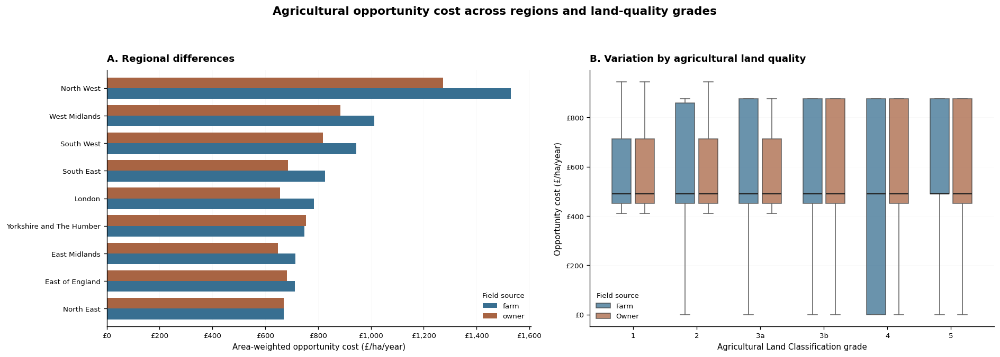

In [ ]:
# Compares opportunity cost by region and Agricultural Land Classification (ALC).
#Calculates source-specific rank correlations and draws the regional/ALC figure. The correlation is descriptive, not a causal estimate.

alc_order = ["1", "2", "3a", "3b", "4", "5"]
sources = ("farm", "owner")
colours = {
    "farm": "#386F91",
    "owner": "#A86443",
}

# Standardise Agricultural Land Classification (ALC) labels.
alc_text = (
    oc["alc_grade"]
    .astype("string")
    .str.strip()
    .str.lower()
    .str.replace(r"^grade\s*", "", regex=True)
)
oc["ALC"] = alc_text.where(alc_text.isin(alc_order))
oc["ALC_rank"] = pd.to_numeric(
    oc["ALC"].map(dict(zip(alc_order, range(1, 7)))),
    errors="coerce",
)

# Correlations use all valid records, separately for farm and owner sources.
correlation_rows = []

for source in sources:
    group = oc.loc[oc["flame_source"].eq(source)]
    paired = group[["ALC_rank", "OC_ha"]].dropna()

    rho = np.nan
    if len(paired) >= 3 and paired.nunique().min() > 1:
        rho = paired["ALC_rank"].rank().corr(
            paired["OC_ha"].rank()
        )

    correlation_rows.append({
        "flame_source": source,
        "paired_records": len(paired),
        "excluded_ALC_records": len(group) - len(paired),
        "spearman_rho": rho,
    })

alc_correlation = pd.DataFrame(correlation_rows)

print("ALC grade and opportunity cost — Spearman rank correlation")
display(alc_correlation.round(3))

print("Opportunity cost by ALC grade — full records")
display(oc_summary(["ALC"]).round(2))

fig, (ax_region, ax_alc) = plt.subplots(
    1, 2,
    figsize=(16, 6.5),
    gridspec_kw={"width_ratios": [1.05, 1]},
)

# A. Area-weighted opportunity cost by region.
regional_plot = regional_OC.pivot_table(
    index="region",
    columns="flame_source",
    values="area_weighted_OC_ha",
    aggfunc="first",
)

regional_plot = regional_plot.reindex(
    columns=[s for s in sources if s in regional_plot.columns]
)
regional_plot = regional_plot.sort_values(
    by=list(regional_plot.columns)
)

regional_plot.plot.barh(
    ax=ax_region,
    color=[colours[s] for s in regional_plot.columns],
    width=0.78,
)

ax_region.set_title(
    "A. Regional differences",
    loc="left",
    fontsize=11,
    fontweight="semibold",
    pad=10,
)
ax_region.set_xlabel(
    "Area-weighted opportunity cost (£/ha/year)"
)
ax_region.set_ylabel("")
ax_region.xaxis.set_major_formatter(
    mticker.StrMethodFormatter("£{x:,.0f}")
)
ax_region.grid(axis="x", alpha=0.18)
ax_region.set_axisbelow(True)
ax_region.legend(
    title="Field source",
    frameon=False,
    fontsize=8,
    title_fontsize=8,
)

# B. Opportunity-cost distributions by ALC grade.
grades = [
    grade for grade in alc_order
    if oc["ALC"].eq(grade).any()
]

for position, grade in enumerate(grades, start=1):
    for source, offset in (("farm", -0.18), ("owner", 0.18)):
        values = oc.loc[
            oc["ALC"].eq(grade)
            & oc["flame_source"].eq(source),
            "OC_ha",
        ].dropna()

        if values.empty:
            continue

        # Only the displayed boxes are sampled; tables and correlations
        # above use all valid records.
        values = values.sample(
            n=min(1500, len(values)),
            random_state=42,
        )

        ax_alc.boxplot(
            [values],
            positions=[position + offset],
            widths=0.3,
            showfliers=False,
            patch_artist=True,
            boxprops={
                "facecolor": colours[source],
                "alpha": 0.75,
                "edgecolor": "#444444",
            },
            medianprops={
                "color": "#222222",
                "linewidth": 1.3,
            },
            whiskerprops={"color": "#666666"},
            capprops={"color": "#666666"},
        )

ax_alc.set_xticks(range(1, len(grades) + 1))
ax_alc.set_xticklabels(grades)
ax_alc.set_title(
    "B. Variation by agricultural land quality",
    loc="left",
    fontsize=11,
    fontweight="semibold",
    pad=10,
)
ax_alc.set_xlabel(
    "Agricultural Land Classification grade"
)
ax_alc.set_ylabel(
    "Opportunity cost (£/ha/year)"
)
ax_alc.yaxis.set_major_formatter(
    mticker.StrMethodFormatter("£{x:,.0f}")
)
ax_alc.grid(axis="y", alpha=0.18)
ax_alc.set_axisbelow(True)
ax_alc.legend(
    handles=[
        Patch(
            facecolor=colours[source],
            edgecolor="#444444",
            alpha=0.75,
            label=source.title(),
        )
        for source in sources
    ],
    title="Field source",
    frameon=False,
    fontsize=8,
    title_fontsize=8,
)

fig.suptitle(
    "Agricultural opportunity cost across regions and land-quality grades",
    fontsize=13,
    fontweight="semibold",
    y=0.97,
)

fig.tight_layout(rect=(0, 0.11, 1, 0.92))
export_figure(fig, "RQ2_opportunity_cost")
plt.show()
plt.close(fig)

### Intervention representation

The model evaluates interventions separately because their physical footprints, construction units and expected lives differ. It does not select the most suitable intervention for a field. Doing so would require site-specific information on terrain, soils, drainage, flow paths, access, ecological constraints and engineering feasibility.

Six interventions are assessed using standardised example designs. A field–intervention combination is omitted when the design footprint exceeds the field’s available area. Existing tree-covered fields are not assigned new woodland establishment.

| Intervention | Construction quantity | Treated footprint | Central construction unit cost | Appraisal period |
|---|---:|---:|---:|---:|
| Storage pond | 160 m³ excavation | 0.020 ha (200 m²) | £30/m³ | 10 years |
| Earth bund | 40 m length | 0.008 ha (40 m × 2 m) | £100/m | 30 years |
| Leaky woody barriers | Ten barriers, each 3 m long; 30 m total | 0.0015 ha (30 m × 0.5 m) | £100/m | 10 years |
| Swale | 100 m length | 0.020 ha (100 m × 2 m) | £45/m | 10 years |
| Vegetated buffer | 0.080 ha established | 0.080 ha (100 m × 8 m) | £145/ha | 10 years |
| Woodland establishment | 1 ha established | 1 ha | £21,600/ha | 50 years |

These dimensions and unit prices are model inputs based on the intervention assumptions in Highways England (2021).

In [ ]:
# No rows from the GeoPackage are assumed to contain these designs.
interventions = pd.DataFrame([
    ["pond",    "m3", 160.0, 0.0200, 0.0,  1, 30.0,    0.0, 10],
    ["bund",    "m",   40.0, 0.0080, 2.0,  0, 100.0,   0.0, 30],
    ["barrier", "m",   30.0, 0.0015, 0.5, 10, 100.0,   0.0, 10],
    ["swale",   "m",  100.0, 0.0200, 2.0,  0, 45.0,    0.0, 10],
    ["buffer",  "ha",   0.08,0.0800, 8.0,  0, 145.0,   0.0, 10],
    ["woodland","ha",   1.0,1.0000, 0.0,  0, 21600.0, 0.0, 50]
], columns=["intervention","unit","quantity","treated_ha","width_m","features","unit_cost","extra_capital","life"])
# Blank overrides use the main rates in the next cell. Enter documented specific rates here if adopted.
interventions["preconstruction_override"] = np.nan
interventions["maintenance_override"] = np.nan
# Example syntax only: interventions.loc[interventions.intervention.eq("woodland"), "maintenance_override"] = YOUR_RATE
assert set(INTERVENTIONS_TO_RUN).issubset(set(interventions.intervention))
assert INTERVENTIONS_TO_RUN and len(INTERVENTIONS_TO_RUN) == len(set(INTERVENTIONS_TO_RUN))
display(interventions)

interventions['production_loss'] = 1.0  # fraction of agricultural production lost on treated ha


,intervention,unit,quantity,treated_ha,width_m,features,unit_cost,extra_capital,life,preconstruction_override,maintenance_override
0,pond,m3,160.00,0.0200,0.0,1,30.0,0.0,10,NaN,NaN
1,bund,m,40.00,0.0080,2.0,0,100.0,0.0,30,NaN,NaN
2,barrier,m,30.00,0.0015,0.5,10,100.0,0.0,10,NaN,NaN
3,swale,m,100.00,0.0200,2.0,0,45.0,0.0,10,NaN,NaN
4,buffer,ha,0.08,0.0800,8.0,0,145.0,0.0,10,NaN,NaN
5,woodland,ha,1.00,1.0000,0.0,0,21600.0,0.0,50,NaN,NaN


In [ ]:
# Defines the capital-recovery calculation used to convert upfront costs into annual equivalents.
def capital_recovery_factor(rate, years):
    if rate == 0:
        return 1 / years
    return rate / (1 - (1 + rate) ** (-years))


In [ ]:
#Adds central assumptions for discounting, pre-construction, maintenance, construction scaling, appraisal life and production loss.
parameters.update({'discount':0.035,'preconstruction':0.60,'maintenance':0.10,
    'construction_factor':1.0,'life_factor':1.0,'production_loss_factor':1.0})
annualisation_register = interventions[['intervention','quantity','unit','unit_cost','treated_ha','life']].copy()
annualisation_register['upfront_construction'] = interventions.quantity*interventions.unit_cost+interventions.extra_capital
annualisation_register['annualised_construction'] = annualisation_register.upfront_construction*capital_recovery_factor(parameters['discount'],interventions.life)
display(annualisation_register)

,intervention,quantity,unit,unit_cost,treated_ha,life,upfront_construction,annualised_construction
0,pond,160.00,m3,30.0,0.0200,10,4800.0,577.158566
1,bund,40.00,m,100.0,0.0080,30,4000.0,217.485326
2,barrier,30.00,m,100.0,0.0015,10,3000.0,360.724104
3,swale,100.00,m,45.0,0.0200,10,4500.0,541.086155
4,buffer,0.08,ha,145.0,0.0800,10,11.6,1.394800
5,woodland,1.00,ha,21600.0,1.0000,50,21600.0,920.888127


In [ ]:
# Sets transaction cost, premium and support factors for the central model. The central premium is zero.
parameters.update({'transaction':0.10, 'premium':0.0,
                   'support_factor':1.0,'private_share':0.0})
display(pd.Series(parameters,name='central_value').to_frame())


,central_value
marginal_discount,0.300
gm_factor,1.000
grass_factor,1.000
discount,0.035
preconstruction,0.600
maintenance,0.100
construction_factor,1.000
life_factor,1.000
production_loss_factor,1.000
transaction,0.100


### Existing public support and residual funding requirement

Three funding scenarios are reported:

1. **No support:** the full gross annual compensation requirement;
2. **Public support:** eligible grants and recurring agri-environment payments are applied; and
3. **Public and private support:** the remaining requirement indicates the potential contribution required from other sources.

The gross compensation requirement is calculated before public support. The model then estimates the annual requirement remaining after any assumed eligible capital grant and time-limited recurring payment.

In [ ]:
# Defines the capital and annual scheme-rate lookup and payment durations. It also creates an empty eligibility table for documented field-specific assignments.
capital_rates = {"NONE":0.0, "WN12":1879.46, "RP9":1.9561, "RP32":461.39,
                 "RP33":764.42, "RP11":7.52, "EWCO_STANDARD":10200.0}
annual_rates = {"NONE":0.0, "WBD1":257.0, "CAHL4":515.0, "CIGL3":235.0,
                "BFS6":742.0, "EWCO_MAINTENANCE":400.0}
annual_years = {"NONE":0, "WBD1":3, "CAHL4":3, "CIGL3":3, "BFS6":3, "EWCO_MAINTENANCE":15}
eligibility = pd.DataFrame([], columns=["field_id","intervention","capital_action","cap_units",
                                      "annual_action","annual_units","eligibility_basis"])
# To add a DOCUMENTED award/scenario, enter a real field_id and eligible quantities here, for example:
# eligibility.loc[len(eligibility)] = ["YOUR_ID", "woodland", "EWCO_STANDARD", 1.0,
#     "EWCO_MAINTENANCE", 1.0, "Your source, agreement date, project eligibility and eligible-cost basis"]
# Zero rows deliberately means no funding assumed; these are not inferred from farm_type or crop names.
display(eligibility)


,field_id,intervention,capital_action,cap_units,annual_action,annual_units,eligibility_basis


In [ ]:
# Validate any rows in that table and check that action codes, units and interventions are compatible. This does not establish actual scheme eligibility.
assert not eligibility.duplicated(["field_id","intervention"]).any()
assert eligibility.field_id.isin(fields.field_id).all(), "Unknown field_id in eligibility."
assert eligibility.intervention.isin(interventions.intervention).all()
assert eligibility.capital_action.isin(capital_rates).all()
assert eligibility.annual_action.isin(annual_rates).all()
assert eligibility.eligibility_basis.fillna("").str.strip().ne("").all()
for column in ["cap_units","annual_units"]:
    eligibility[column] = pd.to_numeric(eligibility[column], errors="raise").astype(float)
    assert np.isfinite(eligibility[column]).all() and eligibility[column].ge(0).all()
print(f"{len(eligibility):,} documented support rows. Empty table: full cost remains the funding requirement.")


0 documented support rows. Empty table: full cost remains the funding requirement.


In [ ]:
# Check action/unit compatibility. These checks cannot replace site/project eligibility evidence.
action_intervention = {"WN12":"pond","WBD1":"pond","RP9":"bund","RP32":"barrier","RP33":"barrier",
    "RP11":"swale","CAHL4":"buffer","CIGL3":"buffer","BFS6":"buffer",
    "EWCO_STANDARD":"woodland","EWCO_MAINTENANCE":"woodland"}

def check_support(x):
    for action_column, quantity_column in [("capital_action","cap_units"),("annual_action","annual_units")]:
        for action in x[action_column].unique():
            rows = x.loc[x[action_column].eq(action)]
            if action == "NONE":
                assert rows[quantity_column].eq(0).all()
                continue
            assert rows.intervention.eq(action_intervention[action]).all(), "Action/intervention mismatch."
            if action in ["WN12","RP32","RP33","WBD1"]:
                limit = rows.features
                assert rows[quantity_column].mod(1).eq(0).all()
            elif action == "RP9":
                limit = rows.quantity
            elif action == "RP11":
                limit = rows.treated_ha * 10000
            else:
                limit = rows.treated_ha
                if action in ["CAHL4","CIGL3","BFS6"]:
                    assert rows.width_m.between(6 if action=="BFS6" else 4,12).all()
            assert rows[quantity_column].le(limit + 1e-9).all(), "Eligible quantity exceeds design."


In [ ]:
# One row per cost or payment item preserves the different payment bases.
# Optional evidence inputs: replace missing values only with documented sources.
construction_evidence = pd.DataFrame({
    'intervention':interventions.intervention,
    'construction_low':np.nan, 'construction_high':np.nan,
    'citation_and_price_year':'Citation / price year to complete'
})
construction_register = interventions[['intervention','unit','unit_cost','quantity','treated_ha','life']].merge(
    construction_evidence,on='intervention',validate='one_to_one')
construction_register = construction_register.rename(columns={'unit':'construction_cost_basis',
                                                              'unit_cost':'central_construction_unit_cost'})

action_units = {'WN12':'feature','RP9':'m','RP32':'feature','RP33':'feature',
                'RP11':'m2','EWCO_STANDARD':'ha','WBD1':'feature',
                'CAHL4':'ha','CIGL3':'ha','BFS6':'ha','EWCO_MAINTENANCE':'ha'}
register_rows=[]
for payment_type,rates in [('Capital',capital_rates),('Annual',annual_rates)]:
    for action,rate in rates.items():
        if action=='NONE':continue
        register_rows.append({'intervention':action_intervention[action],'action':action,
            'payment_type':payment_type,'rate':rate,'basis':action_units[action],
            'duration_years':annual_years[action] if payment_type=='Annual' else np.nan,
            'interpretation':'Comparator only; award requires evidence',
            'evidence':'Existing notebook input; confirm citation, date and eligibility'})
payment_register=pd.DataFrame(register_rows)
capital_grant_comparison=construction_register.merge(payment_register,on='intervention',how='left',validate='one_to_many')
display(capital_grant_comparison)


,intervention,construction_cost_basis,central_construction_unit_cost,quantity,treated_ha,life,construction_low,construction_high,citation_and_price_year,action,payment_type,rate,basis,duration_years,interpretation,evidence
0,pond,m3,30.0,160.00,0.0200,10,NaN,NaN,Citation / price year to complete,WN12,Capital,1879.4600,feature,NaN,Comparator only; award requires evidence,"Existing notebook input; confirm citation, date and eligibility"
1,pond,m3,30.0,160.00,0.0200,10,NaN,NaN,Citation / price year to complete,WBD1,Annual,257.0000,feature,3.0,Comparator only; award requires evidence,"Existing notebook input; confirm citation, date and eligibility"
2,bund,m,100.0,40.00,0.0080,30,NaN,NaN,Citation / price year to complete,RP9,Capital,1.9561,m,NaN,Comparator only; award requires evidence,"Existing notebook input; confirm citation, date and eligibility"
3,barrier,m,100.0,30.00,0.0015,10,NaN,NaN,Citation / price year to complete,RP32,Capital,461.3900,feature,NaN,Comparator only; award requires evidence,"Existing notebook input; confirm citation, date and eligibility"
4,barrier,m,100.0,30.00,0.0015,10,NaN,NaN,Citation / price year to complete,RP33,Capital,764.4200,feature,NaN,Comparator only; award requires evidence,"Existing notebook input; confirm citation, date and eligibility"
5,swale,m,45.0,100.00,0.0200,10,NaN,NaN,Citation / price year to complete,RP11,Capital,7.5200,m2,NaN,Comparator only; award requires evidence,"Existing notebook input; confirm citation, date and eligibility"
6,buffer,ha,145.0,0.08,0.0800,10,NaN,NaN,Citation / price year to complete,CAHL4,Annual,515.0000,ha,3.0,Comparator only; award requires evidence,"Existing notebook input; confirm citation, date and eligibility"
7,buffer,ha,145.0,0.08,0.0800,10,NaN,NaN,Citation / price year to complete,CIGL3,Annual,235.0000,ha,3.0,Comparator only; award requires evidence,"Existing notebook input; confirm citation, date and eligibility"
8,buffer,ha,145.0,0.08,0.0800,10,NaN,NaN,Citation / price year to complete,BFS6,Annual,742.0000,ha,3.0,Comparator only; award requires evidence,"Existing notebook input; confirm citation, date and eligibility"
9,woodland,ha,21600.0,1.00,1.0000,50,NaN,NaN,Citation / price year to complete,EWCO_STANDARD,Capital,10200.0000,ha,NaN,Comparator only; award requires evidence,"Existing notebook input; confirm citation, date and eligibility"


In [ ]:
# The compact core retains only the attributes needed repeatedly during calculations.
core_columns = ["field_id","flame_source","group","region","catchment","alc_grade","farm_type",
                "gm","grass_component","available_ha"]
core = fields.loc[fields.status.eq("Valued"), core_columns].copy().sort_values("field_id")
assert not core.empty, "No valued records: inspect coverage and grass/crop assumptions."
expected_units = {"pond":"m3","bund":"m","barrier":"m","swale":"m","buffer":"ha","woodland":"ha"}
assert interventions.unit.eq(interventions.intervention.map(expected_units)).all()
assert interventions[["quantity","treated_ha","life"]].gt(0).all().all()
assert interventions[["unit_cost","extra_capital","features","width_m"]].ge(0).all().all()
for column in ["quantity","treated_ha","life","unit_cost","extra_capital","features","width_m"]:
    assert np.isfinite(interventions[column]).all()
for column in ["preconstruction_override","maintenance_override"]:
    assert np.isfinite(interventions[column].dropna()).all() and interventions[column].dropna().ge(0).all()
area_based = interventions.intervention.isin(["buffer","woodland"])
assert np.allclose(interventions.loc[area_based,"quantity"], interventions.loc[area_based,"treated_ha"])
swale = interventions.loc[interventions.intervention.eq("swale")]
assert np.allclose(swale.quantity * swale.width_m / 10000, swale.treated_ha)


In [ ]:
# Hypothetical support scenarios—not observed awards.
# These use the existing capital_rates, annual_rates and annual_years.
# Selects fields with enough available area for each design and attaches its dimensions and hypothetical support actions. It calculates potential capital offers and annual payments from the rate lookup.
def make_input(name):
    design = interventions.set_index("intervention").loc[name]

    x = core.loc[
        core["available_ha"].ge(design["treated_ha"])
    ].copy()

    # Do not model new woodland creation on existing Trees records.
    if name == "woodland":
        x = x.loc[~x["group"].eq("Trees")].copy()

    x["intervention"] = name
    for column, value in design.items():
        x[column] = value

    x["capital_action"] = "NONE"
    x["cap_units"] = 0.0
    x["annual_action"] = "NONE"
    x["annual_units"] = 0.0
    x["eligibility_basis"] = "Hypothetical eligible-support scenario"

    if name == "pond":
        x["capital_action"] = "WN12"
        x["cap_units"] = x["features"]
        x["annual_action"] = "WBD1"
        x["annual_units"] = x["features"]

    elif name == "bund":
        x["capital_action"] = "RP9"
        x["cap_units"] = x["quantity"]  # metres

    elif name == "barrier":
        # Assume small eligible woody dams for this comparison.
        x["capital_action"] = "RP32"
        x["cap_units"] = x["features"]

    elif name == "swale":
        x["capital_action"] = "RP11"
        x["cap_units"] = x["treated_ha"] * 10_000  # m²

    elif name == "buffer":
        # Alternative buffer actions; do not stack them.
        cropped = x["group"].isin(
            ["Cereal Crops", "Leguminous Crops"]
        )
        grass = x["group"].eq("Grassland")

        x.loc[cropped, "annual_action"] = "CAHL4"
        x.loc[grass, "annual_action"] = "CIGL3"
        x.loc[cropped | grass, "annual_units"] = (
            x.loc[cropped | grass, "treated_ha"]
        )

        x.loc[
            ~(cropped | grass), "eligibility_basis"
        ] = "No buffer support assumed for this group"

    elif name == "woodland":
        x["capital_action"] = "EWCO_STANDARD"
        x["cap_units"] = x["treated_ha"]
        x["annual_action"] = "EWCO_MAINTENANCE"
        x["annual_units"] = x["treated_ha"]

    x["capital_offer"] = (
        x["cap_units"] * x["capital_action"].map(capital_rates)
    )
    x["annual_payment"] = (
        x["annual_units"] * x["annual_action"].map(annual_rates)
    )
    x["payment_years"] = x["annual_action"].map(annual_years)

    return x

In [ ]:
# calculate_compensation() calculates opportunity cost (OC), annualised construction (AK), annualised pre-construction (AP), maintenance (M) and transaction costs (TC).
# It then calculates gross compensation, applies assumed grants/payments and returns the residual per design and per treated hectare.
def calculate_compensation(data, settings):
    p = settings
    assert all(np.isfinite(value) and value >= 0 for value in p.values())
    assert p["marginal_discount"] <= 1 and p["private_share"] <= 1 and p["life_factor"] > 0
    x = data.copy()
    years = x.life * p["life_factor"]
    assert np.allclose(years, years.round()), "Use a whole number of appraisal years."
    factor = capital_recovery_factor(p["discount"], years)
    margin = (x.gm + x.grass_component * (p["grass_factor"] - 1)) * p["gm_factor"]

    x["K"] = (x.quantity * x.unit_cost + x.extra_capital) * p["construction_factor"]
    pre_rate = x.preconstruction_override.fillna(p["preconstruction"])
    maintenance_rate = x.maintenance_override.fillna(p["maintenance"])
    x["P"] = x.K * pre_rate
    loss = (x.get('production_loss', pd.Series(1.0,index=x.index)) * p.get('production_loss_factor',1.0)).clip(0,1)
    x["OC"] = margin * x.treated_ha * loss * (1 - p["marginal_discount"])
    x["AK"] = x.K * factor
    x["AP"] = x.P * factor
    x["M"] = x.K * maintenance_rate
    x["TC"] = p["transaction"] * (x.AK + x.AP + x.M)
    x["raw_cost"] = x[["OC", "AK", "AP", "M", "TC"]].sum(axis=1)
    x["floor_adjustment"] = -x.raw_cost.clip(upper=0)
    x["premium_cost"] = x.raw_cost.clip(lower=0) * p["premium"]
    x["gross"] = x.raw_cost.clip(lower=0) + x.premium_cost

    x["grant_used"] = np.minimum(x.capital_offer * p["support_factor"], x.K)
    x["unused_grant_offer"] = x.capital_offer * p["support_factor"] - x.grant_used
    x["grant_annual"] = x.grant_used * factor
    duration = np.minimum(x.payment_years, years)
    if p["discount"] == 0:
        payment_pv_factor = duration
    else:
        payment_pv_factor = (1 - (1 + p["discount"]) ** (-duration)) / p["discount"]
    x["support_annual"] = x.annual_payment * p["support_factor"] * payment_pv_factor * factor
    x["residual"] = (x.gross - x.grant_annual - x.support_annual).clip(lower=0)
    x["private"] = p["private_share"] * x.residual
    x["unfunded"] = x.residual - x.private
    x["gross_per_ha"] = x.gross / x.treated_ha
    x["residual_per_ha"] = x.residual / x.treated_ha
    x["upfront_total"] = x.K + x.P
    x["upfront_after_grant"] = x.K + x.P - x.grant_used
    return x


In [ ]:
# Checks the arithmetic on small hand-specified examples, including annualisation, grant caps and woodland support.
# The 257 × 3 ÷ 10 expression spreads a £257 annual payment over a 10-year appraisal period; it is not £10/ha support.
hand = pd.DataFrame([{
    "life":10.0,"gm":1000.0,"grass_component":0.0,"quantity":100.0,"unit_cost":30.0,
    "extra_capital":0.0,"treated_ha":0.02,"preconstruction_override":np.nan,"maintenance_override":np.nan,
    "capital_offer":1879.46,"annual_payment":257.0,"payment_years":3
}])
check_parameters = {**parameters,"discount":0,"marginal_discount":0.30,"preconstruction":0.60,
    "maintenance":0.10,"transaction":0.10, "premium":0.0,
    "gm_factor":1.0,"grass_factor":1.0,"construction_factor":1.0,"life_factor":1.0,
    "support_factor":1.0,"private_share":0.0}
h = calculate_compensation(hand, check_parameters).iloc[0]
assert np.isclose(capital_recovery_factor(0,10),0.1)
assert np.isclose(h.gross,872.0)
assert np.isclose(h.support_annual,257*3/10)
assert np.isclose(h.residual,872.0-187.946-77.1)
assert np.isclose(calculate_compensation(hand,{**check_parameters,"support_factor":0}).iloc[0].residual,h.gross)
assert calculate_compensation(hand.assign(capital_offer=999999),check_parameters).iloc[0].grant_used == 3000
assert np.isclose(calculate_compensation(hand,{**check_parameters,"private_share":0.5}).iloc[0].unfunded, h.residual/2)
wood = hand.assign(life=50.0, gm=1000.0, quantity=1.0, unit_cost=21600.0, treated_ha=1.0,
                   capital_offer=10200.0, annual_payment=400.0, payment_years=15)
w = calculate_compensation(wood,check_parameters).iloc[0]
assert np.isclose(w.support_annual,400*15/50)
assert np.isclose(w.grant_annual,10200/50)
wood_check = pd.DataFrame([{"intervention":"woodland","capital_action":"EWCO_STANDARD","cap_units":1.0,
    "annual_action":"EWCO_MAINTENANCE","annual_units":1.0,"treated_ha":1.0,"width_m":0.0}])
check_support(wood_check)  # no accidental grass-buffer width rule
print("All ten arithmetic/action checks passed.")


All ten arithmetic/action checks passed.


In [ ]:
# Runs every selected design on fitting valued fields.
PLOT_LIMIT = 1_000  # Maximum sampled rows per group for plotting
field_payments = fields[["field_id","flame_source"]].copy().set_index("field_id")
payment_columns = ["gross","residual","gross_per_ha","residual_per_ha","rank_gross","rank_residual"]
component_columns = ["OC","AK","AP","M","TC","floor_adjustment","premium_cost"]
summary_rows, fit_rows, component_tables, samples = [], [], [], []
group_tables = {column: [] for column in ["group","farm_type","alc_grade","region","catchment"]}

for name in INTERVENTIONS_TO_RUN:
    design = interventions.set_index("intervention").loc[name]
    for source, records in core.groupby("flame_source", observed=True):
        fit_rows.append({"intervention":name,"flame_source":source,"valued_retained_records":len(records),
                         "design_fits":int((records.available_ha.ge(design.treated_ha) & (~records.group.eq("Trees") if name=="woodland" else True)).sum())})
    current_input = make_input(name)
    check_support(current_input)
    if current_input.empty:
        print(name, ": no valued record has enough available area; skipped.")
        for metric in payment_columns:
            field_payments[name + "_" + metric] = np.nan
        del current_input
        continue
    current = calculate_compensation(current_input, parameters)
    assert np.isfinite(current.gross).all() and np.isfinite(current.residual).all()
    assert current.residual.ge(0).all() and current.grant_used.le(current.K).all()
    current["rank_gross"] = current.groupby("flame_source", observed=True).gross.rank(method="first")
    current["rank_residual"] = current.groupby("flame_source", observed=True).residual.rank(method="first")
    indexed = current.set_index("field_id")
    for metric in payment_columns:
        field_payments[name + "_" + metric] = indexed[metric].reindex(field_payments.index)
    for source, group in current.groupby("flame_source", observed=True):
        summary_rows.append({"intervention":name,"flame_source":source,"design_records":len(group),
            "treated_record_ha":group.treated_ha.sum(),"mean_gross":group.gross.mean(),
            "median_gross":group.gross.median(),"median_residual":group.residual.median(),
            "median_residual_per_ha":group.residual_per_ha.median(),"total_residual":group.residual.sum(),
            "area_weighted_residual_per_ha":group.residual.sum()/group.treated_ha.sum(),
            "fully_covered_pct":100*group.residual.le(1e-9).mean(),
            "mean_upfront_after_grant":group.upfront_after_grant.mean()})
        samples.append(group.sample(n=min(len(group),PLOT_LIMIT),random_state=42).copy())
    components = current.groupby("flame_source", observed=True)[component_columns].mean().reset_index()
    components["intervention"] = name
    component_tables.append(components)
    for column in group_tables:
        table = current.groupby(["flame_source",column], observed=True, dropna=False).agg(
            records=("field_id","size"),mean_gross=("gross","mean"),
            median_residual_per_ha=("residual_per_ha","median")
        ).reset_index()
        table["intervention"] = name
        group_tables[column].append(table)
    print(f"{name}: {len(current):,} designs calculated; wide working table {current.memory_usage(deep=True).sum()/2**20:.1f} MiB.")
    del current_input, current, indexed, group, components

assert summary_rows, "No design fits the retained records; inspect the design areas."
summary = pd.DataFrame(summary_rows)
design_fit = pd.DataFrame(fit_rows)
component_summary = pd.concat(component_tables,ignore_index=True)
plot_data = pd.concat(samples,ignore_index=True)
del samples, component_tables
for column in group_tables:
    group_tables[column] = pd.concat(group_tables[column],ignore_index=True)
print(f"Complete payment/rank table: {field_payments.memory_usage(deep=True).sum()/2**20:.1f} MiB.")
print(f"Bounded plots/sensitivity sample: {len(plot_data):,} design records.")
display(design_fit)
display(summary.round(2))


pond: 649,910 designs calculated; wide working table 619.5 MiB.
bund: 650,273 designs calculated; wide working table 618.6 MiB.
barrier: 650,391 designs calculated; wide working table 621.2 MiB.
swale: 649,910 designs calculated; wide working table 619.5 MiB.
buffer: 639,322 designs calculated; wide working table 611.4 MiB.
woodland: 425,529 designs calculated; wide working table 415.0 MiB.
Complete payment/rank table: 253.5 MiB.
Bounded plots/sensitivity sample: 12,000 design records.


,intervention,flame_source,valued_retained_records,design_fits
0,pond,farm,411750,411429
1,pond,owner,238701,238481
2,bund,farm,411750,411649
3,bund,owner,238701,238624
4,barrier,farm,411750,411715
5,barrier,owner,238701,238676
6,swale,farm,411750,411429
7,swale,owner,238701,238481
8,buffer,farm,411750,405037
9,buffer,owner,238701,234285


,intervention,flame_source,design_records,treated_record_ha,mean_gross,median_gross,median_residual,median_residual_per_ha,total_residual,area_weighted_residual_per_ha,fully_covered_pct,mean_upfront_after_grant
0,pond,farm,411429,8228.58,1559.16,1553.60,1241.03,62051.70,5.128846e+08,62329.66,0.00,5800.54
1,pond,owner,238481,4769.62,1558.53,1553.60,1241.03,62051.70,2.971398e+08,62298.42,0.00,5800.54
2,bund,farm,411649,3293.19,828.92,826.69,822.44,102804.99,3.394715e+08,103082.81,0.00,6321.76
3,bund,owner,238624,1908.99,828.67,826.69,822.44,102804.99,1.967246e+08,103051.55,0.00,6321.76
4,barrier,farm,411715,617.57,966.03,965.61,604.89,403256.88,2.492119e+08,403534.67,0.00,1800.00
5,barrier,owner,238676,358.01,965.98,965.61,604.89,403256.88,1.444599e+08,403503.37,0.00,1800.00
6,swale,farm,411429,8228.58,1462.67,1457.11,1276.27,63813.43,5.273812e+08,64091.39,0.00,5696.00
7,swale,owner,238481,4769.62,1462.05,1457.11,1276.27,63813.43,3.055426e+08,64060.15,0.00,5696.00
8,buffer,farm,405037,32402.96,65.46,42.93,36.60,457.47,2.372146e+07,732.08,1.33,18.56
9,buffer,owner,234285,18742.80,62.91,42.93,36.60,457.47,1.309356e+07,698.59,1.48,18.56


In [ ]:
# Print support-assignment diagnostics and a small preview of one intervention’s payment results and grouping tables.
print(f"Support assignments: {len(eligibility):,}")
print(plot_data[['capital_offer','annual_payment','grant_annual','support_annual']].describe().round(2))


Support assignments: 0
       capital_offer  annual_payment  grant_annual  support_annual
count       12000.00        12000.00      12000.00        12000.00
mean         3045.93          112.98        201.11           48.34
std          3546.56          158.17        163.48           73.18
min             0.00            0.00          0.00            0.00
25%            78.24            0.00          4.25            0.00
50%          1691.73            0.00        203.42            0.00
75%          4613.90          257.00        360.72           86.58
max         10200.00          400.00        434.86          196.41


In [ ]:
# Decomposes modelled gross cost into components and compares gross with residual compensation across interventions. Component means and payment medians are different summaries.
SHOW_INTERVENTION = "woodland"
if SHOW_INTERVENTION not in INTERVENTIONS_TO_RUN:
    SHOW_INTERVENTION = INTERVENTIONS_TO_RUN[0]
show_columns = ["flame_source"] + [SHOW_INTERVENTION + "_" + metric for metric in payment_columns]
display(field_payments.loc[field_payments[SHOW_INTERVENTION+"_gross"].notna(),show_columns].head(20).round(2))
# For ALL components of a chosen intervention, run this optional line:
# results = calculate_compensation(make_input(SHOW_INTERVENTION), parameters)
# display(results.head())
for column in group_tables:
    print("Comparison by",column,"— complete table is group_tables["+repr(column)+"]")
    display(group_tables[column].head(20).round(2))


,flame_source,woodland_gross,woodland_residual,woodland_gross_per_ha,woodland_residual_per_ha,woodland_rank_gross,woodland_rank_residual
field_id,,,,,,,
FLAME_FARM_1,farm,4486.76,3855.49,4486.76,3855.49,24175.0,24175.0
FLAME_FARM_2,farm,4486.76,3855.49,4486.76,3855.49,47493.0,47493.0
FLAME_FARM_3,farm,4486.76,3855.49,4486.76,3855.49,71274.0,71274.0
FLAME_FARM_4,farm,4486.76,3855.49,4486.76,3855.49,95279.0,95279.0
FLAME_FARM_8,farm,4486.76,3855.49,4486.76,3855.49,110096.0,110096.0
FLAME_FARM_9,farm,4448.96,3817.69,4448.96,3817.69,23700.0,23700.0
FLAME_FARM_10,farm,4448.96,3817.69,4448.96,3817.69,6784.0,6784.0
FLAME_FARM_11,farm,4710.06,4078.79,4710.06,4078.79,147246.0,147246.0
FLAME_FARM_12,farm,4710.06,4078.79,4710.06,4078.79,148122.0,148122.0


Comparison by group — complete table is group_tables['group']


,flame_source,group,records,mean_gross,median_residual_per_ha,intervention
0,farm,Cereal Crops,95064,1558.35,62219.00,pond
1,farm,Grassland,233063,1564.86,62051.70,pond
2,farm,Leguminous Crops,3223,1552.37,61984.50,pond
3,farm,Trees,80079,1543.80,61561.70,pond
4,owner,Cereal Crops,60953,1558.05,62219.00,pond
5,owner,Grassland,126857,1564.51,62051.70,pond
6,owner,Leguminous Crops,2086,1552.39,61984.50,pond
7,owner,Trees,48585,1543.80,61561.70,pond
8,farm,Cereal Crops,95103,828.60,102972.29,bund
9,farm,Grassland,233152,831.20,102804.99,bund


Comparison by farm_type — complete table is group_tables['farm_type']


,flame_source,farm_type,records,mean_gross,median_residual_per_ha,intervention
0,farm,Arable,95665,1556.06,62219.00,pond
1,farm,Beef,119501,1553.60,62051.70,pond
2,farm,Dairy,56122,1594.20,64081.70,pond
3,farm,Fallow,5524,1543.80,61561.70,pond
4,farm,Horticulture,2606,1635.04,66424.60,pond
5,farm,Non-agricultural,80072,1543.80,61561.70,pond
6,farm,Sheep,51939,1561.30,62436.70,pond
7,owner,Arable,61616,1556.10,62219.00,pond
8,owner,Beef,65236,1553.60,62051.70,pond
9,owner,Dairy,29514,1594.19,64081.70,pond


Comparison by alc_grade — complete table is group_tables['alc_grade']


,flame_source,alc_grade,records,mean_gross,median_residual_per_ha,intervention
0,farm,Grade 1,18681,1558.44,62051.70,pond
1,farm,Grade 2,83148,1558.52,62051.70,pond
2,farm,Grade 3a,113198,1558.52,62051.70,pond
3,farm,Grade 3b,145345,1559.75,62051.70,pond
4,farm,Grade 4,39864,1560.19,62051.70,pond
5,farm,Grade 5,9913,1561.68,62051.70,pond
6,farm,NaN,1280,1549.74,61561.70,pond
7,owner,Grade 1,9610,1558.23,62051.70,pond
8,owner,Grade 2,45422,1557.84,62051.70,pond
9,owner,Grade 3a,64012,1557.97,62072.70,pond


Comparison by region — complete table is group_tables['region']


,flame_source,region,records,mean_gross,median_residual_per_ha,intervention
0,farm,East Midlands,49667,1556.40,62051.70,pond
1,farm,East of England,55756,1556.21,62142.00,pond
2,farm,London,563,1558.25,62275.00,pond
3,farm,North East,15029,1555.64,62199.40,pond
4,farm,North West,43501,1568.40,62275.00,pond
5,farm,South East,55723,1558.54,62051.70,pond
6,farm,South West,89677,1559.45,62051.70,pond
7,farm,West Midlands,55104,1560.64,62051.70,pond
8,farm,Yorkshire and The Humber,46409,1556.56,62051.70,pond
9,owner,East Midlands,26041,1555.72,62051.70,pond


Comparison by catchment — complete table is group_tables['catchment']


,flame_source,catchment,records,mean_gross,median_residual_per_ha,intervention
0,farm,Adur Upper,1633,1552.90,62051.7,pond
1,farm,Aire Lower,1058,1553.76,62051.7,pond
2,farm,Aire Middle,980,1551.54,62051.7,pond
3,farm,Aire Upper,1204,1574.57,64081.7,pond
4,farm,Allen,265,1558.08,62436.7,pond
5,farm,Aln,425,1555.23,62051.7,pond
6,farm,Alt,626,1556.35,62051.7,pond
7,farm,Ancholme,2045,1555.29,62142.0,pond
8,farm,Arrow Lugg and Frome,4168,1555.32,62051.7,pond
9,farm,Arun Lower,464,1559.39,62051.7,pond


### RQ2 results and sensitivity


In [ ]:
print(type(interventions))
print(interventions[:2])

<class 'pandas.core.frame.DataFrame'>
  intervention unit  quantity  treated_ha  width_m  features  unit_cost  extra_capital  life  \
0         pond   m3     160.0       0.020      0.0         1       30.0            0.0    10   
1         bund    m      40.0       0.008      2.0         0      100.0            0.0    30   

   preconstruction_override  maintenance_override  production_loss  
0                       NaN                   NaN              1.0  
1                       NaN                   NaN              1.0  


Using treated areas from: plot_data
POOLED ANNUAL GROSS COST COMPONENTS — £/treated ha/year


,OC,AK,AP,M,TC,floor_adjustment,premium_cost,mean_gross_per_ha,design_records
intervention,,,,,,,,,
pond,756.50,28857.93,17314.76,24000.0,7017.27,0.0,0.0,77946.45,649910
bund,756.35,27185.67,16311.40,50000.0,9349.71,0.0,0.0,103603.12,650273
barrier,756.31,240482.74,144289.64,200000.0,58477.24,0.0,0.0,644005.92,650391
swale,756.50,27054.31,16232.58,22500.0,6578.69,0.0,0.0,73122.08,649910
buffer,759.94,17.43,10.46,14.5,4.24,0.0,0.0,806.58,639322
woodland,942.49,920.89,552.53,2160.0,363.34,0.0,0.0,4939.25,425529


POOLED GROSS AND RESIDUAL REQUIREMENTS — £/treated ha/year


,design_records,median_gross_per_ha,median_residual_per_ha,fully_covered_pct
intervention,,,,
pond,649910,77679.95,62051.70,0.00
bund,650273,103336.77,102804.99,0.00
barrier,650391,643739.61,403256.88,0.00
swale,649910,72855.58,63813.43,0.00
buffer,639322,536.64,457.47,1.39
woodland,425529,4634.46,4003.19,0.00


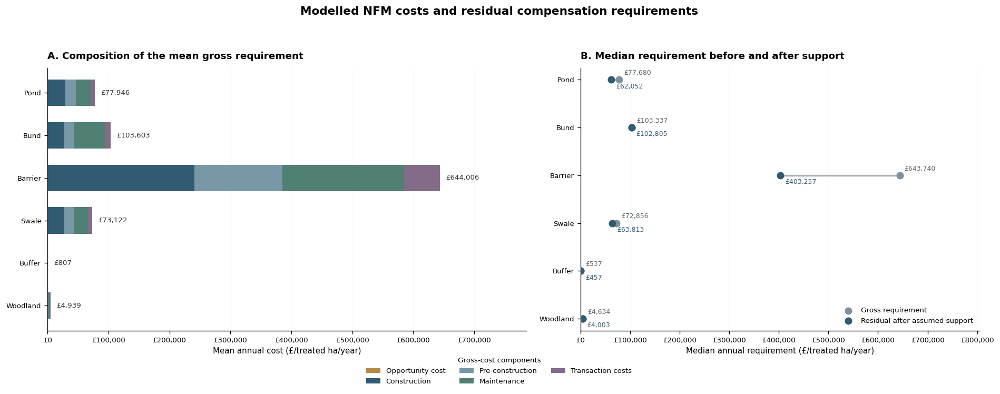

In [ ]:
# Modelled NFM costs and residual compensation requirements
# Farm and owner records pooled; figure displayed inline

parts = [
    "OC", "AK", "AP", "M", "TC",
    "floor_adjustment", "premium_cost",
]

part_names = {
    "OC": "Opportunity cost",
    "AK": "Construction",
    "AP": "Pre-construction",
    "M": "Maintenance",
    "TC": "Transaction costs",
    "floor_adjustment": "Zero-floor adjustment",
    "premium_cost": "Participation premium",
}

part_colours = {
    "OC": "#B58B49",
    "AK": "#315A73",
    "AP": "#7898A8",
    "M": "#4F8073",
    "TC": "#826C88",
    "floor_adjustment": "#A0A5A3",
    "premium_cost": "#A66F63",
}


# Find the existing results table containing intervention and treated_ha.
area_tables = [
    (name, value)
    for name, value in list(globals().items())
    if isinstance(value, pd.DataFrame)
    and {"intervention", "treated_ha"}.issubset(value.columns)
]

if not area_tables:
    raise ValueError(
        "No DataFrame with 'intervention' and 'treated_ha' is loaded. "
        "Run the earlier cell that calculates treated area first."
    )

print("Using treated areas from:", area_tables[0][0])
area_table = area_tables[0][1]

# Check that each intervention has one treated-area value.
area_counts = area_table.groupby("intervention")["treated_ha"].nunique()
if area_counts.gt(1).any():
    raise ValueError(
        "The treated-area table has conflicting values for: "
        + ", ".join(area_counts[area_counts.gt(1)].index.astype(str))
    )

areas = area_table.groupby("intervention")["treated_ha"].first()
order = [
    name for name in INTERVENTIONS_TO_RUN
    if name in areas.index
]

if not order:
    raise ValueError(
        "None of INTERVENTIONS_TO_RUN appear in the treated-area table."
    )
if not order:
    raise ValueError("No interventions match the treated-area table.")

# Pool component means using the number of modelled designs in each source.
weighted = component_summary.merge(
    summary[["flame_source", "intervention", "design_records"]],
    on=["flame_source", "intervention"],
    validate="one_to_one",
)

for part in parts:
    weighted[part] = weighted[part] * weighted["design_records"]

combined_components = (
    weighted.groupby("intervention")[parts + ["design_records"]]
    .sum()
    .reindex(order)
)

for part in parts:
    combined_components[part] = (
        combined_components[part]
        / combined_components["design_records"]
        / areas.reindex(order)
    )

combined_components["mean_gross_per_ha"] = (
    combined_components[parts].sum(axis=1)
)

# Calculate pooled medians directly from the full field-level results.
payment_rows = []

for name in order:
    gross = pd.to_numeric(
        field_payments[f"{name}_gross_per_ha"],
        errors="coerce",
    )
    residual = pd.to_numeric(
        field_payments[f"{name}_residual_per_ha"],
        errors="coerce",
    )
    valid = gross.notna() & residual.notna()

    if valid.any():
        payment_rows.append({
            "intervention": name,
            "design_records": int(valid.sum()),
            "median_gross_per_ha": gross.loc[valid].median(),
            "median_residual_per_ha": residual.loc[valid].median(),
            "fully_covered_pct": (
                100 * residual.loc[valid].le(1e-9).mean()
            ),
        })

payment_comparison = (
    pd.DataFrame(payment_rows)
    .set_index("intervention")
    .reindex(order)
)

print("POOLED ANNUAL GROSS COST COMPONENTS — £/treated ha/year")
display(
    combined_components[
        parts + ["mean_gross_per_ha", "design_records"]
    ].round(2)
)

print("POOLED GROSS AND RESIDUAL REQUIREMENTS — £/treated ha/year")
display(payment_comparison.round(2))

# Two coordinated panels.
fig, (ax_cost, ax_payment) = plt.subplots(
    1, 2,
    figsize=(16, 7),
    gridspec_kw={"width_ratios": [1.2, 1]},
)

y = np.arange(len(order))
names = [name.title() for name in order]

# A. Additive mean cost components.
left = np.zeros(len(order))

for part in parts:
    values = (
        combined_components[part]
        .fillna(0)
        .to_numpy(dtype=float)
    )

    if np.any(values):
        ax_cost.barh(
            y,
            values,
            left=left,
            height=0.62,
            color=part_colours[part],
            label=part_names[part],
        )
        left += values

ax_cost.set_yticks(y, names)
ax_cost.invert_yaxis()
ax_cost.set_title(
    "A. Composition of the mean gross requirement",
    loc="left",
    fontsize=11,
    fontweight="semibold",
    pad=10,
)
ax_cost.set_xlabel("Mean annual cost (£/treated ha/year)")
ax_cost.xaxis.set_major_formatter(
    mticker.StrMethodFormatter("£{x:,.0f}")
)
ax_cost.grid(axis="x", alpha=0.18)
ax_cost.set_axisbelow(True)

cost_max = np.nanmax(left)
ax_cost.set_xlim(0, cost_max * 1.22 if cost_max > 0 else 1)

for i, value in enumerate(left):
    ax_cost.text(
        value + cost_max * 0.015,
        i,
        f"£{value:,.0f}",
        va="center",
        fontsize=8,
        color="#333333",
    )

# B. Full-record medians before and after assumed public support.
gross_median = payment_comparison[
    "median_gross_per_ha"
].to_numpy(dtype=float)
residual_median = payment_comparison[
    "median_residual_per_ha"
].to_numpy(dtype=float)

for i, (gross, residual) in enumerate(
    zip(gross_median, residual_median)
):
    if np.isfinite(gross) and np.isfinite(residual):
        ax_payment.plot(
            [residual, gross],
            [i, i],
            color="#AAB1B5",
            linewidth=2,
            zorder=1,
        )

ax_payment.scatter(
    gross_median,
    y,
    color="#82919B",
    s=55,
    label="Gross requirement",
    zorder=2,
)
ax_payment.scatter(
    residual_median,
    y,
    color="#315A73",
    s=55,
    label="Residual after assumed support",
    zorder=3,
)

ax_payment.set_yticks(y, names)
ax_payment.invert_yaxis()
ax_payment.set_title(
    "B. Median requirement before and after support",
    loc="left",
    fontsize=11,
    fontweight="semibold",
    pad=10,
)
ax_payment.set_xlabel(
    "Median annual requirement (£/treated ha/year)"
)
ax_payment.xaxis.set_major_formatter(
    mticker.StrMethodFormatter("£{x:,.0f}")
)
ax_payment.grid(axis="x", alpha=0.18)
ax_payment.set_axisbelow(True)

payment_max = np.nanmax(gross_median)
ax_payment.set_xlim(
    0,
    payment_max * 1.25 if payment_max > 0 else 1,
)

for i, (gross, residual) in enumerate(
    zip(gross_median, residual_median)
):
    if np.isfinite(gross):
        ax_payment.text(
            gross + payment_max * 0.015,
            i - 0.14,
            f"£{gross:,.0f}",
            va="center",
            fontsize=7.5,
            color="#59656C",
        )
    if np.isfinite(residual):
        ax_payment.text(
            residual + payment_max * 0.015,
            i + 0.14,
            f"£{residual:,.0f}",
            va="center",
            fontsize=7.5,
            color="#315A73",
        )

ax_payment.legend(
    loc="lower right",
    frameon=False,
    fontsize=8,
)

component_handles = [
    Patch(
        facecolor=part_colours[part],
        label=part_names[part],
    )
    for part in parts
    if combined_components[part].fillna(0).ne(0).any()
]

fig.legend(
        handles=component_handles,
        title="Gross-cost components",
        loc="lower center",
        bbox_to_anchor=(0.5, 0.11),
        ncol=3,
        frameon=False,
        fontsize=8,
        title_fontsize=8,
)
fig.suptitle(
    "Modelled NFM costs and residual compensation requirements",
    fontsize=13,
    fontweight="semibold",
    y=0.98,
)

fig.text(
    0.5,
    0.055,
    "",
    ha="center",
    fontsize=8,
    color="#444444",
)

fig.text(
    0.5,
    0.025,
    "",
    ha="center",
    fontsize=8,
    color="#444444",
)

fig.tight_layout(rect=(0, 0.17, 1, 0.94))
export_figure(fig, "RQ2_cost_components")
plt.show()
plt.close(fig)

MEDIAN ANNUAL REQUIREMENT UNDER ASSUMED SUPPORT — £/treated ha/year
Farm and owner records pooled; bounded matched sample.


,intervention,scheme_mode,sample_records,farm_records,owner_records,median_requirement_gbp_ha_year,discount_rate,premium,scope
0,barrier,Gross requirement,2000,1000,1000,643739.61,0.04,0.0,bounded matched sample
1,barrier,After assumed scheme support,2000,1000,1000,403256.88,0.04,0.0,bounded matched sample
2,buffer,Gross requirement,2000,1000,1000,536.64,0.04,0.0,bounded matched sample
3,buffer,After assumed scheme support,2000,1000,1000,457.47,0.04,0.0,bounded matched sample
4,bund,Gross requirement,2000,1000,1000,103336.77,0.04,0.0,bounded matched sample
5,bund,After assumed scheme support,2000,1000,1000,102804.99,0.04,0.0,bounded matched sample
6,pond,Gross requirement,2000,1000,1000,77679.95,0.04,0.0,bounded matched sample
7,pond,After assumed scheme support,2000,1000,1000,62051.70,0.04,0.0,bounded matched sample
8,swale,Gross requirement,2000,1000,1000,72855.58,0.04,0.0,bounded matched sample
9,swale,After assumed scheme support,2000,1000,1000,63813.43,0.04,0.0,bounded matched sample


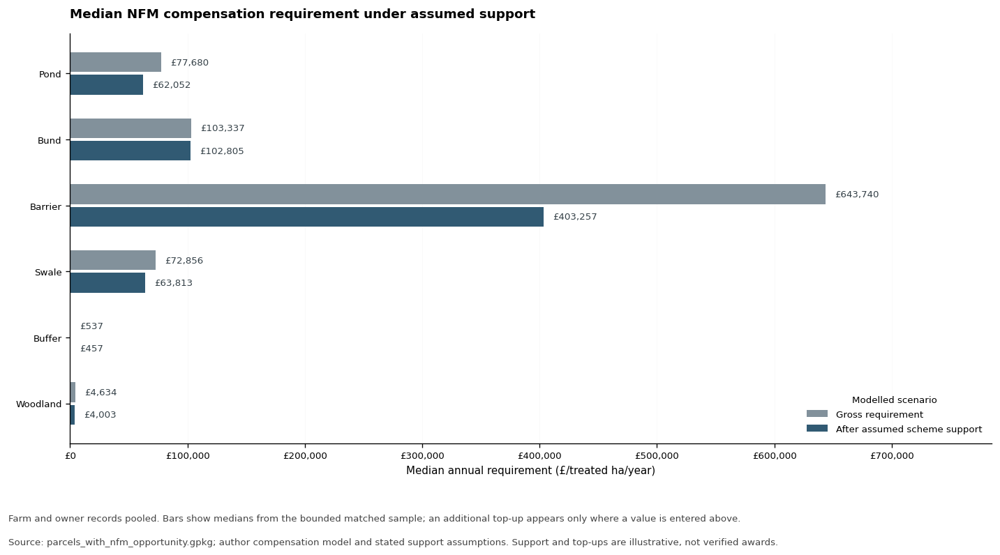

In [ ]:
# Gross and residual NFM requirements under assumed support
# Farm and owner records pooled; bounded matched sample

# Optional illustrative additional payment (£/treated ha/year).
# Leave NaN where no top-up scenario should be shown.
EXTRA_PROXY_TOPUP = {
    name: np.nan for name in INTERVENTIONS_TO_RUN
}

matched_costs = calculate_compensation(
    plot_data,
    {**parameters, "premium": 0.0},
)

scheme_rows = []

for name, group in matched_costs.groupby(
    "intervention", observed=True
):
    modes = {
        "Gross requirement": group["gross_per_ha"],
        "After assumed scheme support": group["residual_per_ha"],
    }

    proxy = EXTRA_PROXY_TOPUP[name]
    if pd.notna(proxy):
        if not np.isfinite(proxy) or proxy < 0:
            raise ValueError(
                f"Top-up for {name} must be finite and non-negative."
            )

        modes["After support and illustrative top-up"] = (
            group["residual_per_ha"] - proxy
        ).clip(lower=0)

    for mode, values in modes.items():
        scheme_rows.append({
            "intervention": name,
            "scheme_mode": mode,
            "sample_records": len(group),
            "farm_records": int(
                group["flame_source"].eq("farm").sum()
            ),
            "owner_records": int(
                group["flame_source"].eq("owner").sum()
            ),
            "median_requirement_gbp_ha_year": values.median(),
            "discount_rate": parameters["discount"],
            "premium": 0.0,
            "scope": "bounded matched sample",
        })

scheme_gap_summary = pd.DataFrame(scheme_rows)

if scheme_gap_summary.empty:
    print("No matched records are available for this figure.")

else:
    print(
        "MEDIAN ANNUAL REQUIREMENT UNDER ASSUMED SUPPORT "
        "— £/treated ha/year"
    )
    print(
        "Farm and owner records pooled; bounded matched sample."
    )
    display(scheme_gap_summary.round(2))

    mode_order = [
        "Gross requirement",
        "After assumed scheme support",
        "After support and illustrative top-up",
    ]
    mode_order = [
        mode for mode in mode_order
        if mode in scheme_gap_summary["scheme_mode"].unique()
    ]

    intervention_order = [
        name for name in INTERVENTIONS_TO_RUN
        if name in scheme_gap_summary["intervention"].unique()
    ]

    plot_table = (
        scheme_gap_summary.pivot(
            index="intervention",
            columns="scheme_mode",
            values="median_requirement_gbp_ha_year",
        )
        .reindex(
            index=intervention_order,
            columns=mode_order,
        )
    )

    mode_colours = {
        "Gross requirement": "#82919B",
        "After assumed scheme support": "#315A73",
        "After support and illustrative top-up": "#B58B49",
    }

    fig, ax = plt.subplots(
        figsize=(
            12,
            max(5.5, 0.85 * len(intervention_order) + 2),
        )
    )

    y = np.arange(len(intervention_order))
    bar_height = 0.68 / len(mode_order)

    all_values = plot_table.to_numpy(dtype=float)
    finite_values = all_values[np.isfinite(all_values)]
    x_max = finite_values.max() if finite_values.size else 1

    for j, mode in enumerate(mode_order):
        values = plot_table[mode].to_numpy(dtype=float)
        positions = (
            y + (j - (len(mode_order) - 1) / 2) * bar_height
        )
        valid = np.isfinite(values)

        bars = ax.barh(
            positions[valid],
            values[valid],
            height=bar_height * 0.88,
            color=mode_colours[mode],
            label=mode,
            zorder=2,
        )

        for bar, value in zip(bars, values[valid]):
            ax.text(
                value + x_max * 0.012,
                bar.get_y() + bar.get_height() / 2,
                f"£{value:,.0f}",
                va="center",
                fontsize=8,
                color="#344047",
            )

    ax.set_yticks(
        y,
        [
            name.replace("_", " ").title()
            for name in intervention_order
        ],
    )
    ax.invert_yaxis()

    ax.set_xlabel(
        "Median annual requirement (£/treated ha/year)"
    )
    ax.set_ylabel("")
    ax.set_xlim(0, x_max * 1.22)
    ax.xaxis.set_major_formatter(
        mticker.StrMethodFormatter("£{x:,.0f}")
    )

    ax.set_title(
        "Median NFM compensation requirement under assumed support",
        loc="left",
        fontsize=13,
        fontweight="semibold",
        pad=14,
    )

    ax.grid(axis="x", alpha=0.18)
    ax.set_axisbelow(True)
    ax.legend(
        title="Modelled scenario",
        loc="lower right",
        frameon=False,
        fontsize=9,
        title_fontsize=9,
    )


    fig.text(
        0.01,
        0.075,
        "Farm and owner records pooled. Bars show medians from the "
        "bounded matched sample; an additional top-up appears only "
        "where a value is entered above.",
        fontsize=8,
        color="#444444",
    )

    fig.text(
        0.01,
        0.035,
        f"Source: {GPKG_PATH.name}; author compensation model and "
        "stated support assumptions. Support and top-ups are "
        "illustrative, not verified awards.",
        fontsize=8,
        color="#444444",
    )

    fig.tight_layout(rect=(0, 0.13, 1, 0.96))
    export_figure(fig, "RQ2_support_scenarios")
    plt.show()
    plt.close(fig)

del matched_costs

In [ ]:
# To add a scenario, add one entry here. Each entry changes only the listed setting.
scenarios = {
    "Central": {},
    "50% production lost on treated area": {"production_loss_factor":0.5},
    "No marginal-land discount": {"marginal_discount": 0.0},
    "50% marginal-land discount": {"marginal_discount": 0.50},
    "Discount rate 2%": {"discount": 0.02},
    "Discount rate 5%": {"discount": 0.05},
    "Pre-construction 30%": {"preconstruction": 0.30},
    "Pre-construction 90%": {"preconstruction": 0.90},
    "Maintenance 5%": {"maintenance": 0.05},
    "Maintenance 15%": {"maintenance": 0.15},
    "Transactions 5%": {"transaction": 0.05},
    "Transactions 25%": {"transaction": 0.25},
    "Premium 10%": {"premium": 0.10},
    "Premium 20%": {"premium": 0.20},
    "All margins -25%": {"gm_factor": 0.75},
    "All margins +25%": {"gm_factor": 1.25},
    "Grass margins -50%": {"grass_factor": 0.50},
    "Grass margins +50%": {"grass_factor": 1.50},
    "Construction -25%": {"construction_factor": 0.75},
    "Construction +25%": {"construction_factor": 1.25},
    "Half appraisal life": {"life_factor": 0.50},
    "No public support": {"support_factor": 0.0},
    "Private contribution closes 50% of residual": {"private_share": 0.50}
}


In [ ]:
sensitivity_rows = []
for scenario, changes in scenarios.items():
    alternative = calculate_compensation(plot_data,{**parameters,**changes})
    for (source,name), group in alternative.groupby(["flame_source","intervention"],observed=True):
        central = plot_data.loc[plot_data.flame_source.eq(source) & plot_data.intervention.eq(name)]
        number = max(1,int(np.ceil(len(group)*0.10)))
        for metric in ["gross","residual_per_ha"]:
            old_ids = set(central.sort_values([metric,"field_id"]).head(number).field_id)
            new_ids = set(group.sort_values([metric,"field_id"]).head(number).field_id)
            old_ranks = central.set_index("field_id")[metric].rank()
            new_ranks = group.set_index("field_id")[metric].rank()
            correlation = old_ranks.corr(new_ranks) if old_ranks.nunique()>1 and new_ranks.nunique()>1 else np.nan
            cutoff = group.sort_values([metric,"field_id"]).iloc[number-1][metric]
            sensitivity_rows.append({"scenario":scenario,"flame_source":source,"intervention":name,"metric":metric,
                "median":group[metric].median(),"change_from_central":group[metric].median()-central[metric].median(),
                "cheapest_decile_retained":len(old_ids & new_ids)/number,"rank_correlation":correlation,
                "cutoff_tied_share":group[metric].eq(cutoff).mean(),"median_unfunded":group.unfunded.median(),
                "sample_designs":len(group)})
    del alternative
sensitivity = pd.DataFrame(sensitivity_rows)
display(sensitivity.head(20).round(3))
print("All bounded-sample scenario comparisons remain in sensitivity.")


,scenario,flame_source,intervention,metric,median,change_from_central,cheapest_decile_retained,rank_correlation,cutoff_tied_share,median_unfunded,sample_designs
0,Central,farm,barrier,gross,965.609,0.0,1.0,1.0,0.204,604.885,1000
1,Central,farm,barrier,residual_per_ha,403256.879,0.0,1.0,1.0,0.204,604.885,1000
2,Central,farm,buffer,gross,42.931,0.0,1.0,1.0,0.192,36.598,1000
3,Central,farm,buffer,residual_per_ha,457.471,0.0,1.0,1.0,0.181,36.598,1000
4,Central,farm,bund,gross,826.694,0.0,1.0,1.0,0.189,822.440,1000
5,Central,farm,bund,residual_per_ha,102804.993,0.0,1.0,1.0,0.189,822.440,1000
6,Central,farm,pond,gross,1553.599,0.0,1.0,1.0,0.201,1241.034,1000
7,Central,farm,pond,residual_per_ha,62051.698,0.0,1.0,1.0,0.201,1241.034,1000
8,Central,farm,swale,gross,1457.112,0.0,1.0,1.0,0.201,1276.269,1000
9,Central,farm,swale,residual_per_ha,63813.431,0.0,1.0,1.0,0.201,1276.269,1000


All bounded-sample scenario comparisons remain in sensitivity.


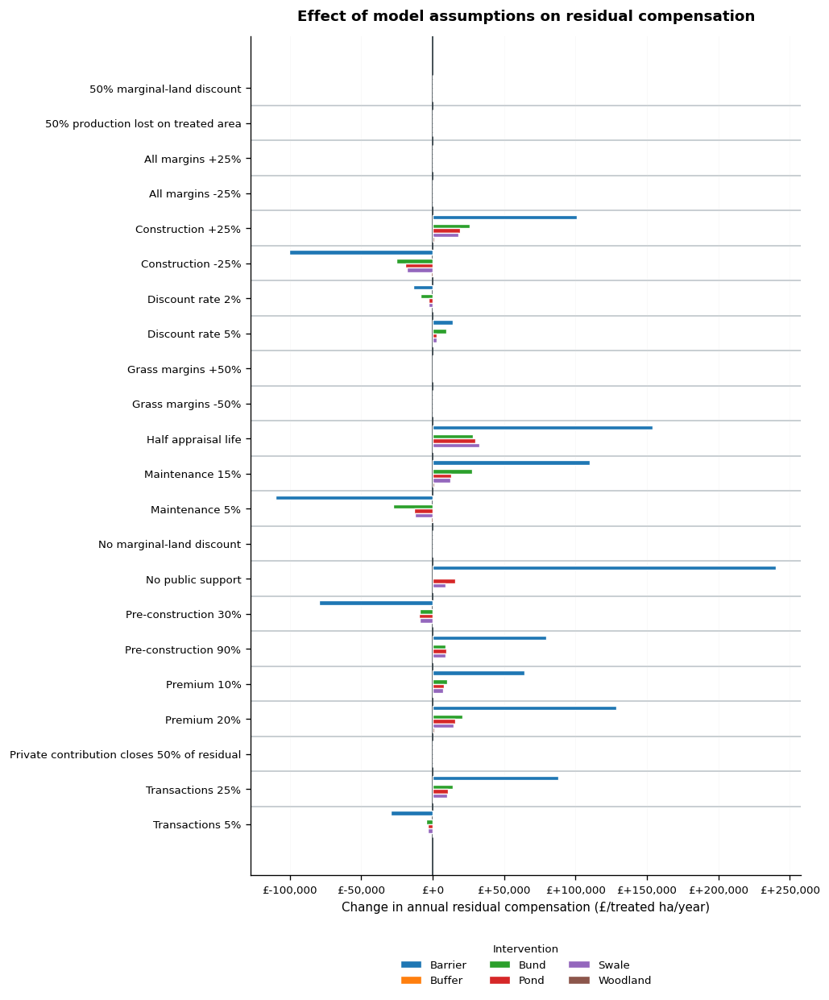

In [ ]:
# Select one-at-a-time residual-compensation results.
view = sensitivity.loc[
    sensitivity["flame_source"].isin(["farm", "owner"])
    & sensitivity["metric"].eq("residual_per_ha")
    & sensitivity["scenario"].ne("Central")
].copy()

comparison = view.pivot_table(
    index=["scenario", "intervention"],
    columns="flame_source",
    values="change_from_central",
    aggfunc="first",
).reindex(columns=["farm", "owner"])

# One bar per intervention and scenario: equal-weight mean of the
# farm and owner changes from their respective central medians.
combined = comparison.dropna(subset=["farm", "owner"]).mean(axis=1)
chart = combined.unstack("intervention")

if chart.empty:
    print("No matching farm-and-owner sensitivity results.")

else:
    interventions = chart.columns.tolist()
    scenarios = chart.index.astype(str)
    y = np.arange(len(chart))

    n_interventions = len(interventions)
    bar_height = 0.76 / n_interventions
    colours = plt.get_cmap("tab10").colors

    fig, ax = plt.subplots(
        figsize=(8.5, max(4.5, 0.58 * len(chart) + 2.2))
    )

    # Draw grouped bars: one colour per intervention.
    for i, intervention in enumerate(interventions):
        offset = (i - (n_interventions - 1) / 2) * bar_height

        ax.barh(
            y + offset,
            chart[intervention].to_numpy(dtype=float),
            height=bar_height,
            label=str(intervention).title(),
            color=colours[i % len(colours)],
            edgecolor="white",
            linewidth=0.8,
            zorder=2,
        )

    # Lines between scenario groups.
    for boundary in np.arange(len(chart) - 1) + 0.5:
        ax.axhline(
            boundary,
            color="#B8C0C5",
            linewidth=0.9,
            zorder=0,
        )

    # Zero marks no change from the central result.
    ax.axvline(
        0,
        color="#39444A",
        linewidth=1.1,
        zorder=1,
    )

    ax.set_yticks(y, scenarios, fontsize=8)
    ax.invert_yaxis()
    ax.set_ylabel("")

    ax.set_title(
        "Effect of model assumptions on residual compensation",
        fontsize=12,
        fontweight="semibold",
        pad=12,
    )
    ax.set_xlabel(
        "Change in annual residual compensation (£/treated ha/year)",
        fontsize=9,
    )

    ax.xaxis.set_major_formatter(
        mticker.FuncFormatter(lambda value, _: f"£{value:+,.0f}")
    )
    ax.tick_params(axis="x", labelsize=8)
    ax.grid(axis="x", alpha=0.18, zorder=0)
    ax.set_axisbelow(True)

    # Legend below the chart, in three columns.
    ax.legend(
        title="Intervention",
        loc="upper center",
        bbox_to_anchor=(0.5, -0.07),
        ncol=3,
        frameon=False,
        fontsize=8,
        title_fontsize=9,
    )

    fig.subplots_adjust(
        left=0.30,
        right=0.97,
        top=0.90,
        bottom=0.32,
    )

    export_figure(fig, "RQ2_compensation_change_by_scenario")
    plt.show()
    plt.close(fig)

In [ ]:
# Robustness: crop-year specification on identical, physically retained records.
# A common sample prevents missing 2020 margins from masquerading as a cost effect.
common = fields.loc[fields.physically_retained & fields.gm_2020.notna() & fields.gm_2024.notna(),
                   ['flame_source','gm_2020','gm_2024']].copy()
common['change_2024_minus_two_year'] = (common.gm_2024-common.gm_2020)/2
crop_robustness = common.groupby('flame_source',observed=True).agg(
    common_records=('gm_2024','size'), mean_2024=('gm_2024','mean'),
    mean_2020=('gm_2020','mean'), mean_change=('change_2024_minus_two_year','mean'),
    median_change=('change_2024_minus_two_year','median'))
display(crop_robustness.round(2))
print('These are assigned gross margins (£/ha/year), before marginal discount; not historical price-adjusted profits.')
# ALC robustness within land-use groups: controls part of the crop-composition association.
alc_rows=[]
for (source,group_name),g in oc.groupby(['flame_source','group'],observed=True):
    paired=g[['ALC_rank','OC_ha']].dropna()
    rho=np.nan
    if len(paired)>=3 and paired.nunique().min()>1:
        rho=paired.ALC_rank.rank().corr(paired.OC_ha.rank())
    alc_rows.append({'source':source,'land_use':group_name,'paired_records':len(paired),'spearman_rho':rho})
alc_within_landuse=pd.DataFrame(alc_rows)
display(alc_within_landuse.round(3))
print('No naive pixel/field independence p-values: spatial dependence and repeated assigned margins remain.')


,common_records,mean_2024,mean_2020,mean_change,median_change
flame_source,,,,,
farm,364113,1108.38,915.32,96.53,0.0
owner,213066,1066.11,913.93,76.09,0.0


These are assigned gross margins (£/ha/year), before marginal discount; not historical price-adjusted profits.


,source,land_use,paired_records,spearman_rho
0,farm,Cereal Crops,95044,-0.133
1,farm,Grassland,232871,0.046
2,farm,Leguminous Crops,3220,0.036
3,farm,Trees,79298,-0.002
4,owner,Cereal Crops,60943,-0.145
5,owner,Grassland,126698,0.059
6,owner,Leguminous Crops,2087,0.031
7,owner,Trees,48067,NaN


No naive pixel/field independence p-values: spatial dependence and repeated assigned margins remain.


In [ ]:
# Valuation-only alternatives on the same design sample.
# Reassign each year's margin first, then combine under the chosen CROP_RULE.
sample_fields = fields.set_index('field_id').reindex(plot_data.field_id).reset_index(drop=True)
def valuation_alternative(kind):
    per_year = []
    grass_year = []
    for year in [2020,2024]:
        lc = sample_fields[f'lucode_{year}']
        gm = sample_fields[f'gm_{year}'].astype(float).copy()
        grass = lc.isin(grass_codes)
        imputed = sample_fields[f'basis_{year}'].eq('Broad-group mean (imputed)') & ~grass
        if kind=='Imputed crop margins -50%': gm.loc[imputed] *= .5
        if kind=='Imputed crop margins +50%': gm.loc[imputed] *= 1.5
        if kind=='Median rather than mean crop imputation':
            medians = crops.groupby('group').supplied_gm.median()
            gm.loc[imputed] = sample_fields.loc[imputed,f'group_{year}'].map(medians).astype(float)
        if kind=='WO12 forgone-return proxy 193': gm.loc[lc.eq('WO12')] = 193.0
        if kind=='WO12 forgone-return proxy 386': gm.loc[lc.eq('WO12')] = 386.0
        if kind=='Nursery/perennial high proxy 7101.50': gm.loc[lc.isin(['NU01','TC01'])] = 7101.5
        if kind=='Coppice evidence value 368': gm.loc[lc.eq('SR01')] = 368.0
        if kind=='Density-scaled grass (unbounded)': gm.loc[grass] *= sample_fields.loc[grass,'density_ratio']
        if kind=='Density-scaled grass (0.5–1.5 bounded)': gm.loc[grass] *= sample_fields.loc[grass,'density_ratio_bounded']
        if kind=='Forage legumes use livestock benchmarks':
            forage = lc.isin(['LG11','LG13','LG14']) & sample_fields.grass_gm.notna()
            gm.loc[forage] = sample_fields.loc[forage,'grass_gm']
            grass = grass | forage
        per_year.append(gm); grass_year.append(gm.where(grass,0))
    x = plot_data.copy()
    x['gm'] = ((per_year[0]+per_year[1])/2 if CROP_RULE=='mean_2020_2024' else per_year[1]).to_numpy()
    x['grass_component'] = ((grass_year[0]+grass_year[1])/2 if CROP_RULE=='mean_2020_2024' else grass_year[1]).to_numpy()
    return calculate_compensation(x,parameters)
valuation_rows=[]
valuation_cases=['Imputed crop margins -50%','Imputed crop margins +50%',
 'Median rather than mean crop imputation','WO12 forgone-return proxy 193',
 'WO12 forgone-return proxy 386','Nursery/perennial high proxy 7101.50',
 'Coppice evidence value 368','Density-scaled grass (unbounded)',
 'Density-scaled grass (0.5–1.5 bounded)','Forage legumes use livestock benchmarks']
for case in valuation_cases:
    alternative = valuation_alternative(case)
    for (source,name),g in alternative.groupby(['flame_source','intervention'],observed=True):
        central = plot_data.loc[plot_data.flame_source.eq(source)&plot_data.intervention.eq(name)]
        valuation_rows.append({'scenario':case,'source':source,'intervention':name,'sample_records':len(g),
            'median_residual_ha':g.residual_per_ha.median(),
            'change_from_central':g.residual_per_ha.median()-central.residual_per_ha.median()})
valuation_sensitivity=pd.DataFrame(valuation_rows)
display(valuation_sensitivity.round(2))


,scenario,source,intervention,sample_records,median_residual_ha,change_from_central
0,Imputed crop margins -50%,farm,barrier,1000,403256.88,0.0
1,Imputed crop margins -50%,farm,buffer,1000,457.47,0.0
2,Imputed crop margins -50%,farm,bund,1000,102804.99,0.0
3,Imputed crop margins -50%,farm,pond,1000,62051.70,0.0
4,Imputed crop margins -50%,farm,swale,1000,63813.43,0.0
...,...,...,...,...,...,...
115,Forage legumes use livestock benchmarks,owner,buffer,1000,457.47,0.0
116,Forage legumes use livestock benchmarks,owner,bund,1000,102804.99,0.0
117,Forage legumes use livestock benchmarks,owner,pond,1000,62051.70,0.0
118,Forage legumes use livestock benchmarks,owner,swale,1000,63813.43,0.0


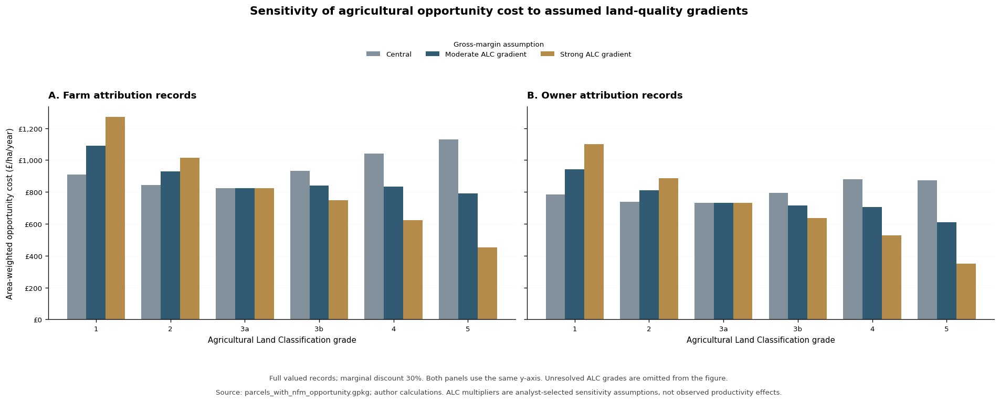

In [ ]:
# ALC opportunity-cost sensitivity — complete calculation and figure

grade_order = ["1", "2", "3a", "3b", "4", "5"]
agricultural_groups = {
    "Cereal Crops", "Leguminous Crops", "Grassland"
}

multipliers = {
    "Central": {
        "1": 1.0, "2": 1.0, "3a": 1.0,
        "3b": 1.0, "4": 1.0, "5": 1.0,
    },
    "Moderate ALC gradient": {
        "1": 1.2, "2": 1.1, "3a": 1.0,
        "3b": 0.9, "4": 0.8, "5": 0.7,
    },
    "Strong ALC gradient": {
        "1": 1.4, "2": 1.2, "3a": 1.0,
        "3b": 0.8, "4": 0.6, "5": 0.4,
    },
}

scenario_colours = {
    "Central": "#82919B",
    "Moderate ALC gradient": "#315A73",
    "Strong ALC gradient": "#B58B49",
}

alc_grade = (
    fields["alc_grade"]
    .astype("string")
    .str.strip()
    .str.casefold()
    .str.replace(
        r"^(alc\s*)?(subgrade|grade)\s*",
        "",
        regex=True,
    )
    .str.replace(r"\s+", "", regex=True)
    .replace({
        "1.0": "1", "2.0": "2", "3.0": "3",
        "4.0": "4", "5.0": "5",
    })
)
alc_grade = alc_grade.where(alc_grade.isin(grade_order))

discount = parameters["marginal_discount"]
valid = fields["status"].eq("Valued")
rows = []

for scenario_name, factors in multipliers.items():
    factor = alc_grade.map(factors).fillna(1.0).astype(float)

    adjusted_margins = []
    for year in (2020, 2024):
        applicable = fields[f"group_{year}"].isin(
            agricultural_groups
        )
        adjusted_margins.append(
            pd.to_numeric(
                fields[f"gm_{year}"],
                errors="coerce",
            ) * factor.where(applicable, 1.0)
        )

    if CROP_RULE == "mean_2020_2024":
        gm = (
            adjusted_margins[0] + adjusted_margins[1]
        ) / 2
    else:
        gm = adjusted_margins[1]

    table = fields.loc[
        valid,
        ["flame_source", "size_ha"],
    ].copy()
    table["ALC"] = alc_grade.loc[valid]
    table["opportunity_cost_ha"] = (
        gm.loc[valid] * (1 - discount)
    )
    table = table.loc[
        table["ALC"].isin(grade_order)
    ].copy()
    table["weighted_cost"] = (
        table["opportunity_cost_ha"]
        * table["size_ha"]
    )

    grouped = (
        table.groupby(["flame_source", "ALC"])
        .agg(
            weighted_cost=("weighted_cost", "sum"),
            area_ha=("size_ha", "sum"),
        )
        .reset_index()
    )
    grouped["area_weighted_oc_ha"] = (
        grouped["weighted_cost"]
        / grouped["area_ha"]
    )
    grouped["scenario"] = scenario_name
    rows.append(grouped)

alc_plot_summary = pd.concat(rows, ignore_index=True)

fig, axes = plt.subplots(
    1, 2,
    figsize=(16, 6.5),
    sharey=True,
)

for ax, source, panel in zip(
    axes,
    ("farm", "owner"),
    ("A", "B"),
):
    view = alc_plot_summary.loc[
        alc_plot_summary["flame_source"].eq(source)
    ]

    chart = (
        view.pivot(
            index="ALC",
            columns="scenario",
            values="area_weighted_oc_ha",
        )
        .reindex(
            index=grade_order,
            columns=list(multipliers),
        )
    )

    chart.plot.bar(
        ax=ax,
        color=[
            scenario_colours[name]
            for name in multipliers
        ],
        width=0.78,
        legend=False,
    )

    ax.set_title(
        f"{panel}. {source.title()} attribution records",
        loc="left",
        fontsize=11,
        fontweight="semibold",
        pad=10,
    )
    ax.set_xlabel(
        "Agricultural Land Classification grade"
    )
    ax.set_ylabel(
        "Area-weighted opportunity cost (£/ha/year)"
        if source == "farm" else ""
    )
    ax.tick_params(axis="x", rotation=0)
    ax.yaxis.set_major_formatter(
        mticker.StrMethodFormatter("£{x:,.0f}")
    )
    ax.grid(axis="y", alpha=0.18)
    ax.set_axisbelow(True)

fig.suptitle(
    "Sensitivity of agricultural opportunity cost "
    "to assumed land-quality gradients",
    fontsize=13,
    fontweight="semibold",
    y=0.98,
)

fig.legend(
    handles=[
        Patch(
            facecolor=scenario_colours[name],
            label=name,
        )
        for name in multipliers
    ],
    title="Gross-margin assumption",
    loc="upper center",
    bbox_to_anchor=(0.5, 0.91),
    ncol=3,
    frameon=False,
    fontsize=8,
    title_fontsize=8,
)

fig.text(
    0.5,
    0.065,
    f"Full valued records; marginal discount {discount:.0%}. "
    "Both panels use the same y-axis. Unresolved ALC grades "
    "are omitted from the figure.",
    ha="center",
    fontsize=8,
    color="#444444",
)

fig.text(
    0.5,
    0.030,
    f"Source: {GPKG_PATH.name}; author calculations. "
    "ALC multipliers are analyst-selected sensitivity "
    "assumptions, not observed productivity effects.",
    ha="center",
    fontsize=8,
    color="#444444",
)

fig.tight_layout(rect=(0, 0.13, 1, 0.84))
export_figure(fig, "RQ2_ALC_sensitivity")
plt.show()
plt.close(fig)

In [ ]:
result_names = [
    "valuation_sensitivity",
    "alc_opportunity_summary",
    "alc_plot_summary",
    "alc_compensation_sensitivity",
]

for name in result_names:
    if name in globals():
        print(f"\n{name}")
        display(globals()[name])
    else:
        print(f"\n{name}: not calculated in this session")

if "field_payments" in globals():
    print(
        "\nfield_payments: first 20 rows and shape",
        field_payments.shape,
    )
    display(field_payments.head(20))


valuation_sensitivity


,scenario,source,intervention,sample_records,median_residual_ha,change_from_central
0,Imputed crop margins -50%,farm,barrier,1000,403256.879158,0.0
1,Imputed crop margins -50%,farm,buffer,1000,457.470521,0.0
2,Imputed crop margins -50%,farm,bund,1000,102804.993006,0.0
3,Imputed crop margins -50%,farm,pond,1000,62051.698007,0.0
4,Imputed crop margins -50%,farm,swale,1000,63813.430812,0.0
...,...,...,...,...,...,...
115,Forage legumes use livestock benchmarks,owner,buffer,1000,457.470521,0.0
116,Forage legumes use livestock benchmarks,owner,bund,1000,102804.993006,0.0
117,Forage legumes use livestock benchmarks,owner,pond,1000,62051.698007,0.0
118,Forage legumes use livestock benchmarks,owner,swale,1000,63813.430812,0.0



alc_opportunity_summary: not calculated in this session

alc_plot_summary


,flame_source,ALC,weighted_cost,area_ha,area_weighted_oc_ha,scenario
0,farm,1,1.577083e+08,1.735817e+05,908.553865,Central
1,farm,2,6.277960e+08,7.434315e+05,844.457113,Central
2,farm,3a,9.338146e+08,1.134357e+06,823.210721,Central
3,farm,3b,1.293376e+09,1.386233e+06,933.014775,Central
4,farm,4,3.985436e+08,3.828890e+05,1040.885486,Central
5,farm,5,9.909148e+07,8.775992e+04,1129.120064,Central
6,owner,1,1.435379e+08,1.827332e+05,785.505480,Central
7,owner,2,6.441385e+08,8.726051e+05,738.178666,Central
8,owner,3a,1.072536e+09,1.466914e+06,731.151019,Central
9,owner,3b,1.121555e+09,1.412622e+06,793.952827,Central



alc_compensation_sensitivity: not calculated in this session

field_payments: first 20 rows and shape (652501, 37)


,flame_source,pond_gross,pond_residual,pond_gross_per_ha,pond_residual_per_ha,pond_rank_gross,pond_rank_residual,bund_gross,bund_residual,bund_gross_per_ha,bund_residual_per_ha,bund_rank_gross,bund_rank_residual,barrier_gross,barrier_residual,barrier_gross_per_ha,barrier_residual_per_ha,barrier_rank_gross,barrier_rank_residual,swale_gross,swale_residual,swale_gross_per_ha,swale_residual_per_ha,swale_rank_gross,swale_rank_residual,buffer_gross,buffer_residual,buffer_gross_per_ha,buffer_residual_per_ha,buffer_rank_gross,buffer_rank_residual,woodland_gross,woodland_residual,woodland_gross_per_ha,woodland_residual_per_ha,woodland_rank_gross,woodland_rank_residual
field_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
FLAME_FARM_0,farm,1543.799076,1231.23396,77189.953787,61561.698007,1.0,1.0,822.774175,818.519944,102846.771815,102314.993006,1.0,1.0,964.874422,604.150319,643249.614893,402766.879158,1.0,1.0,1447.311634,1266.468616,72365.581675,63323.430812,1.0,1.0,3.730848,3.730848,46.635597,46.635597,1.0,5398.0,NaN,NaN,NaN,NaN,NaN,NaN
FLAME_FARM_1,farm,1553.599076,1241.03396,77679.953787,62051.698007,109598.0,109598.0,826.694175,822.439944,103336.771815,102804.993006,109710.0,109710.0,965.609422,604.885319,643739.614893,403256.879158,109741.0,109741.0,1457.111634,1276.268616,72855.581675,63813.430812,109598.0,109598.0,42.930848,36.597642,536.635597,457.470521,106445.0,123766.0,4486.763103,3855.487285,4486.763103,3855.487285,24175.0,24175.0
FLAME_FARM_2,farm,1553.599076,1241.03396,77679.953787,62051.698007,139824.0,139824.0,826.694175,822.439944,103336.771815,102804.993006,139944.0,139944.0,965.609422,604.885319,643739.614893,403256.879158,139977.0,139977.0,1457.111634,1276.268616,72855.581675,63813.430812,139824.0,139824.0,42.930848,36.597642,536.635597,457.470521,136410.0,153730.0,4486.763103,3855.487285,4486.763103,3855.487285,47493.0,47493.0
FLAME_FARM_3,farm,1553.599076,1241.03396,77679.953787,62051.698007,170480.0,170480.0,826.694175,822.439944,103336.771815,102804.993006,170613.0,170613.0,965.609422,604.885319,643739.614893,403256.879158,170648.0,170648.0,1457.111634,1276.268616,72855.581675,63813.430812,170480.0,170480.0,42.930848,36.597642,536.635597,457.470521,166818.0,184137.0,4486.763103,3855.487285,4486.763103,3855.487285,71274.0,71274.0
FLAME_FARM_4,farm,1553.599076,1241.03396,77679.953787,62051.698007,201685.0,201685.0,826.694175,822.439944,103336.771815,102804.993006,201827.0,201827.0,965.609422,604.885319,643739.614893,403256.879158,201863.0,201863.0,1457.111634,1276.268616,72855.581675,63813.430812,201685.0,201685.0,42.930848,36.597642,536.635597,457.470521,197729.0,215047.0,4486.763103,3855.487285,4486.763103,3855.487285,95279.0,95279.0
FLAME_FARM_5,farm,1553.599076,1241.03396,77679.953787,62051.698007,214261.0,214261.0,826.694175,822.439944,103336.771815,102804.993006,214414.0,214414.0,965.609422,604.885319,643739.614893,403256.879158,214453.0,214453.0,1457.111634,1276.268616,72855.581675,63813.430812,214261.0,214261.0,42.930848,36.597642,536.635597,457.470521,209967.0,227285.0,NaN,NaN,NaN,NaN,NaN,NaN
FLAME_FARM_6,farm,1556.553076,1243.98796,77827.653787,62199.398007,251786.0,251786.0,827.875775,823.621544,103484.471815,102952.693006,251952.0,251952.0,965.830972,605.106869,643887.314893,403404.579158,251997.0,251997.0,1460.065634,1279.222616,73003.281675,63961.130812,251786.0,251786.0,54.746848,40.867694,684.335597,510.846176,247084.0,247084.0,NaN,NaN,NaN,NaN,NaN,NaN
FLAME_FARM_7,farm,1543.799076,1231.23396,77189.953787,61561.698007,79192.0,79192.0,822.774175,818.519944,102846.771815,102314.993006,79277.0,79277.0,964.874422,604.150319,643249.614893,402766.879158,79303.0,79303.0,1447.311634,1266.468616,72365.581675,63323.430812,79192.0,79192.0,3.730848,3.730848,46.635597,46.635597,76695.0,77118.0,NaN,NaN,NaN,NaN,NaN,NaN
FLAME_FARM_8,farm,1553.599076,1241.03396,77679.953787,62051.698007,223077.0,223077.0,826.694175,822.439944,103336.771815,102804.993006,223232.0,223232.0,965.609422,604.885319,643739.614893,403256.879158,2232

POOLED FARM AND OWNER RESULTS


,design_records,mean_gross,mean_residual
intervention,,,
pond,649910,1558.93,1246.36
bund,650273,828.82,824.57
barrier,650391,966.01,605.28
swale,649910,1462.44,1281.60
buffer,639322,64.53,57.58
woodland,425529,4939.25,4307.97


,field_records,median_residual_per_ha
intervention,,
pond,649910,62051.70
bund,650273,102804.99
barrier,650391,403256.88
swale,649910,63813.43
buffer,639322,457.47
woodland,425529,4003.19


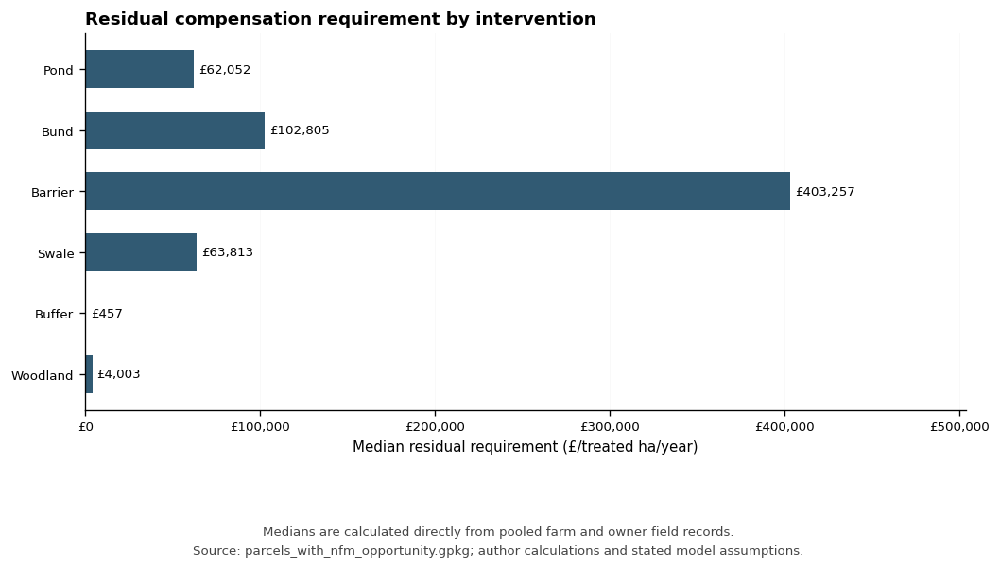

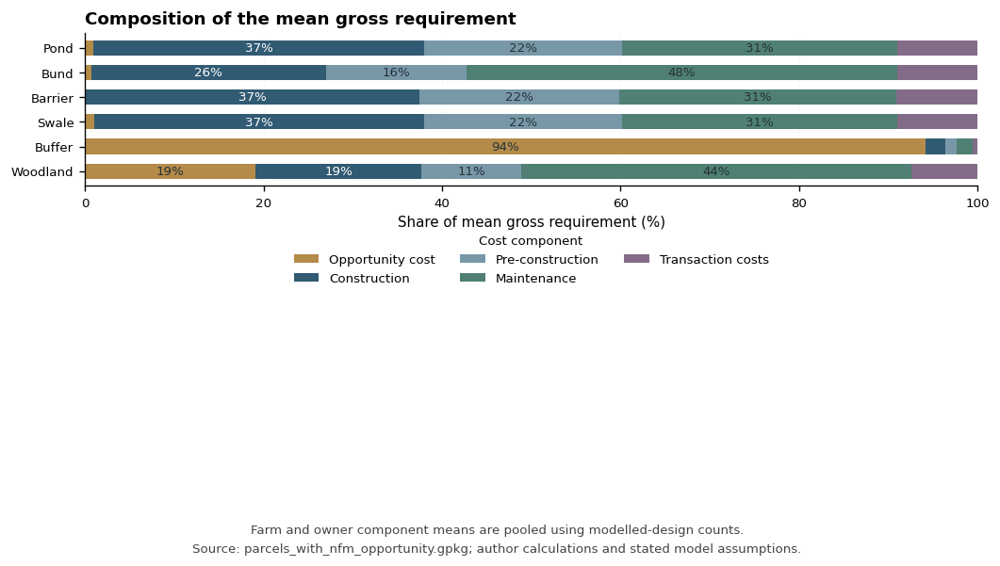

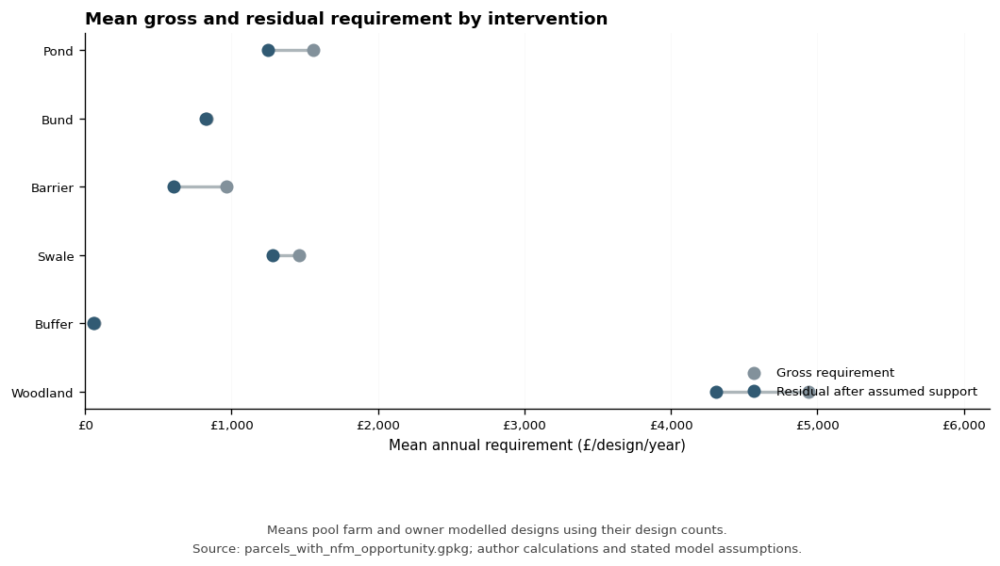

Three combined figures displayed inline.


In [ ]:
apply_dissertation_style()

component_columns = [
    "OC", "AK", "AP", "M", "TC",
    "floor_adjustment", "premium_cost",
]
component_labels = {
    "OC": "Opportunity cost",
    "AK": "Construction",
    "AP": "Pre-construction",
    "M": "Maintenance",
    "TC": "Transaction costs",
    "floor_adjustment": "Zero-floor adjustment",
    "premium_cost": "Participation premium",
}
component_colours = {
    "OC": "#B58B49",
    "AK": "#315A73",
    "AP": "#7898A8",
    "M": "#4F8073",
    "TC": "#826C88",
    "floor_adjustment": "#A0A5A3",
    "premium_cost": "#A66F63",
}

order = [
    name for name in INTERVENTIONS_TO_RUN
    if name in summary["intervention"].unique()
]
if not order:
    raise ValueError("No intervention results are available.")

labels = [name.replace("_", " ").title() for name in order]
y = np.arange(len(order))
bar_colour = "#315A73"
gross_colour = "#82919B"
residual_colour = "#315A73"

# Keep only farm and owner attribution records.
source_summary = summary.loc[
    summary["flame_source"].isin(["farm", "owner"])
].copy()

source_components = component_summary.loc[
    component_summary["flame_source"].isin(["farm", "owner"])
].copy()

pooled_fields = field_payments.loc[
    field_payments["flame_source"].isin(["farm", "owner"])
].copy()

# ------------------------------------------------------------
# Pool source-level means using the number of modelled designs.
# ------------------------------------------------------------

weights = source_summary[
    ["flame_source", "intervention", "design_records"]
].copy()

weighted_components = source_components.merge(
    weights,
    on=["flame_source", "intervention"],
    validate="one_to_one",
)

for column in component_columns:
    weighted_components[column] = (
        weighted_components[column]
        * weighted_components["design_records"]
    )

pooled_components = (
    weighted_components
    .groupby("intervention")[
        component_columns + ["design_records"]
    ]
    .sum()
    .reindex(order)
)

for column in component_columns:
    pooled_components[column] = (
        pooled_components[column]
        / pooled_components["design_records"]
    )

pooled_components["mean_gross"] = (
    pooled_components[component_columns].sum(axis=1)
)

pooled_summary = (
    source_summary.groupby("intervention")
    .agg(
        design_records=("design_records", "sum"),
        total_residual=("total_residual", "sum"),
    )
    .reindex(order)
)
pooled_summary["mean_gross"] = pooled_components["mean_gross"]
pooled_summary["mean_residual"] = (
    pooled_summary["total_residual"]
    / pooled_summary["design_records"]
)

# ------------------------------------------------------------
# Calculate pooled medians from individual field records.
# ------------------------------------------------------------

median_rows = []

for name in order:
    residual_column = f"{name}_residual_per_ha"
    if residual_column not in pooled_fields.columns:
        raise KeyError(f"Missing column: {residual_column}")

    residual = pd.to_numeric(
        pooled_fields[residual_column],
        errors="coerce",
    ).dropna()

    median_rows.append({
        "intervention": name,
        "field_records": len(residual),
        "median_residual_per_ha": residual.median(),
    })

pooled_medians = (
    pd.DataFrame(median_rows)
    .set_index("intervention")
    .reindex(order)
)

print("POOLED FARM AND OWNER RESULTS")
display(
    pooled_summary[
        ["design_records", "mean_gross", "mean_residual"]
    ].round(2)
)
display(pooled_medians.round(2))

def finish_figure(fig, filename, note, bottom=0.16):
    fig.text(
        0.5, 0.055, note,
        ha="center", fontsize=8, color="#444444",
    )
    fig.text(
        0.5, 0.025,
        f"Source: {GPKG_PATH.name}; author calculations "
        "and stated model assumptions.",
        ha="center", fontsize=8, color="#444444",
    )
    fig.tight_layout(rect=(0, bottom, 1, 0.94))
    export_figure(fig, filename)
    display(fig)
    plt.close(fig)

# ------------------------------------------------------------
# Figure 1. Pooled median residual requirement
# ------------------------------------------------------------

values = pooled_medians[
    "median_residual_per_ha"
].to_numpy(dtype=float)

fig, ax = plt.subplots(figsize=(9, max(4.5, 0.65 * len(order) + 1.5)))
bars = ax.barh(y, values, height=0.62, color=bar_colour)
ax.bar_label(
    bars,
    labels=[f"£{v:,.0f}" if np.isfinite(v) else "" for v in values],
    padding=3,
    fontsize=8,
)
ax.set_yticks(y, labels)
ax.invert_yaxis()
ax.set_xlim(0, max(np.nanmax(values) * 1.25, 1))
ax.xaxis.set_major_formatter(mticker.StrMethodFormatter("£{x:,.0f}"))
ax.set_xlabel("Median residual requirement (£/treated ha/year)")
ax.set_title(
    "Residual compensation requirement by intervention",
    loc="left", fontsize=13, fontweight="semibold",
)
ax.grid(axis="x", alpha=0.18)
ax.set_axisbelow(True)

finish_figure(
    fig,
    "RQ2_pooled_median_residual",
    "Medians are calculated directly from pooled farm and owner field records.",
)

# ------------------------------------------------------------
# Figure 2. Composition of pooled mean gross requirement
# ------------------------------------------------------------

composition = pooled_components.copy()

for column in component_columns:
    composition[f"{column}_pct"] = (
        100 * composition[column]
        / composition["mean_gross"].where(
            composition["mean_gross"] > 0
        )
    )

fig, ax = plt.subplots(figsize=(9, max(4.5, 0.65 * len(order) + 1.5)))
left = np.zeros(len(order))

for column in component_columns:
    values = (
        composition[f"{column}_pct"]
        .fillna(0)
        .to_numpy(dtype=float)
    )
    if not np.any(values):
        continue

    bars = ax.barh(
        y, values, left=left, height=0.62,
        color=component_colours[column],
        label=component_labels[column],
    )
    ax.bar_label(
        bars,
        labels=[f"{v:.0f}%" if v >= 10 else "" for v in values],
        label_type="center",
        fontsize=8,
        color="white" if column in {"AK", "TC"} else "#263238",
    )
    left += values

ax.set_yticks(y, labels)
ax.invert_yaxis()
ax.set_xlim(0, 100)
ax.set_xlabel("Share of mean gross requirement (%)")
ax.set_title(
    "Composition of the mean gross requirement",
    loc="left", fontsize=13, fontweight="semibold",
)
ax.grid(axis="x", alpha=0.18)
ax.set_axisbelow(True)
ax.legend(
    title="Cost component",
    loc="upper center",
    bbox_to_anchor=(0.5, -0.25),
    ncol=3,
    frameon=False,
    fontsize=8,
    title_fontsize=8,
)

finish_figure(
    fig,
    "RQ2_pooled_cost_composition",
    "Farm and owner component means are pooled using modelled-design counts.",
    bottom=0.30,
)

# ------------------------------------------------------------
# Figure 3. Pooled mean gross and residual requirement
# ------------------------------------------------------------

gross = pooled_summary["mean_gross"].to_numpy(dtype=float)
residual = pooled_summary["mean_residual"].to_numpy(dtype=float)

fig, ax = plt.subplots(figsize=(9, max(4.5, 0.65 * len(order) + 1.5)))

for i, (gross_value, residual_value) in enumerate(zip(gross, residual)):
    if np.isfinite(gross_value) and np.isfinite(residual_value):
        ax.plot(
            [residual_value, gross_value],
            [i, i],
            color="#ADB6BA",
            linewidth=2,
            zorder=1,
        )

ax.scatter(
    gross, y, color=gross_colour, s=55,
    label="Gross requirement", zorder=2,
)
ax.scatter(
    residual, y, color=residual_colour, s=55,
    label="Residual after assumed support", zorder=3,
)

ax.set_yticks(y, labels)
ax.invert_yaxis()
ax.set_xlim(0, max(np.nanmax(gross) * 1.25, 1))
ax.xaxis.set_major_formatter(mticker.StrMethodFormatter("£{x:,.0f}"))
ax.set_xlabel("Mean annual requirement (£/design/year)")
ax.set_title(
    "Mean gross and residual requirement by intervention",
    loc="left", fontsize=13, fontweight="semibold",
)
ax.grid(axis="x", alpha=0.18)
ax.set_axisbelow(True)
ax.legend(
    loc="lower right",
    frameon=False,
    fontsize=8,
)

finish_figure(
    fig,
    "RQ2_pooled_gross_and_residual",
    "Means pool farm and owner modelled designs using their design counts.",
)

print("Three combined figures displayed inline.")

Mapping all 2,901 parcels in Nene Lower.
2,608 meet the NFM opportunity screen.


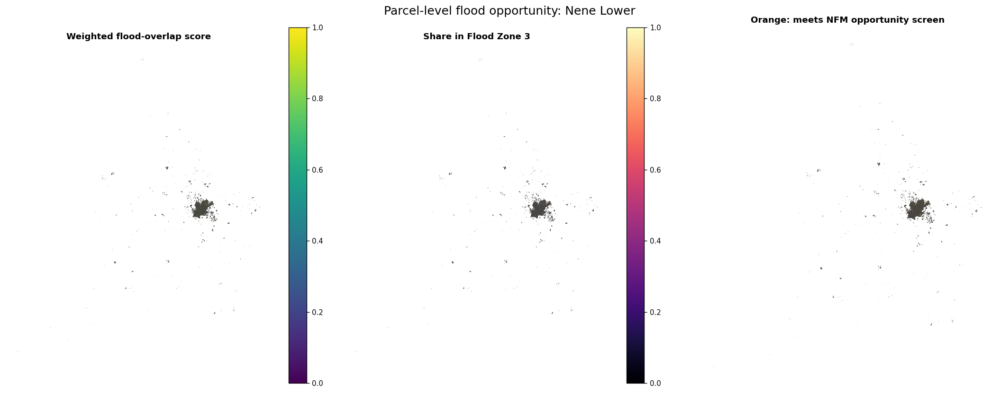

In [ ]:
FOCUS_CATCHMENT = "Nene Lower"

mapped = parcels.loc[
    parcels["catchment"].eq(FOCUS_CATCHMENT)
].copy()

if mapped.empty:
    raise ValueError(
        f"No parcels found for {FOCUS_CATCHMENT!r}. "
        "Check parcels['catchment'].unique()."
    )
if mapped.crs is None:
    raise ValueError("The parcel data has no CRS.")

mapped = mapped.to_crs("EPSG:27700")
mapped["H_score"] = pd.to_numeric(
    mapped["H_score"], errors="coerce"
)
mapped["frac_fz3"] = pd.to_numeric(
    mapped["frac_fz3"], errors="coerce"
)
mapped["opportunity"] = (
    mapped["nfm_opportunity"].fillna(False).astype(bool)
)

print(
    f"Mapping all {len(mapped):,} parcels in "
    f"{FOCUS_CATCHMENT}."
)
print(
    f"{mapped['opportunity'].sum():,} meet the "
    "NFM opportunity screen."
)

fig, axes = plt.subplots(1, 3, figsize=(18, 7))

# Light parcel outlines make individual fields visible.
for ax in axes:
    mapped.plot(
        ax=ax,
        facecolor="#EEEEEE",
        edgecolor="#666666",
        linewidth=0.25,
    )

mapped.loc[mapped["H_score"].gt(0)].plot(
    column="H_score",
    ax=axes[0],
    cmap="viridis",
    vmin=0,
    vmax=1,
    legend=True,
    edgecolor="#444444",
    linewidth=0.25,
)
axes[0].set_title("Weighted flood-overlap score")

mapped.loc[mapped["frac_fz3"].gt(0)].plot(
    column="frac_fz3",
    ax=axes[1],
    cmap="magma",
    vmin=0,
    vmax=1,
    legend=True,
    edgecolor="#444444",
    linewidth=0.25,
)
axes[1].set_title("Share in Flood Zone 3")

mapped.loc[mapped["opportunity"]].plot(
    ax=axes[2],
    facecolor="#E69F00",
    edgecolor="#444444",
    linewidth=0.25,
)
axes[2].set_title("Orange: meets NFM opportunity screen")

for ax in axes:
    ax.set_axis_off()
    ax.set_aspect("equal")

fig.suptitle(
    f"Parcel-level flood opportunity: {FOCUS_CATCHMENT}",
    fontsize=15,
)
fig.tight_layout()
plt.show()

## RQ3 — How do spatial opportunity and financing inform targeting?

The following comparisons join the RQ1 flood-overlap screen to the RQ2 compensation estimates and assess private threshold payments. They describe potential targeting trade-offs; they do not rank site-level effectiveness or prescribe a funding mechanism. The flood-dependent displays run only when the flood-zone geometry input is present.


### Joint flood-overlap and cost results

The H score and cost estimates are joined by field ID and attribution source. Flood-dependent summaries are skipped if the Flood Zones 2/3 source geometry is unavailable.


In [ ]:
# Copy the existing RQ1 flood results from the loaded parcel GeoPackage.
# No Flood Zone polygons or spatial overlays are needed.

required_columns = [
    "field_id",
    "flame_source",
    "region",
    "catchment",
    "size_ha",
    "frac_fz2",
    "frac_fz3",
    "H_score",
    "H_decile",
]

missing = [col for col in required_columns if col not in parcels.columns]
if missing:
    raise ValueError(
        f"These columns are missing from parcels: {missing}"
    )

h_scores = parcels[required_columns].copy()

for col in ["size_ha", "frac_fz2", "frac_fz3", "H_score"]:
    h_scores[col] = pd.to_numeric(
        h_scores[col], errors="coerce"
    )

h_scores["H_decile"] = pd.to_numeric(
    h_scores["H_decile"], errors="coerce"
).astype("Int64")

# Check the join key used by later cost comparisons.
if h_scores[["field_id", "flame_source"]].isna().any().any():
    raise ValueError("Some field IDs or attribution sources are missing.")

if h_scores.duplicated(["field_id", "flame_source"]).any():
    raise ValueError(
        "Duplicate field_id/flame_source pairs in h_scores."
    )

HAS_FLOOD = h_scores["H_score"].notna().any()

print(
    f"Copied H scores for "
    f"{h_scores['H_score'].notna().sum():,} fields "
    f"from the loaded parcel data."
)

Copied H scores for 652,501 fields from the loaded parcel data.


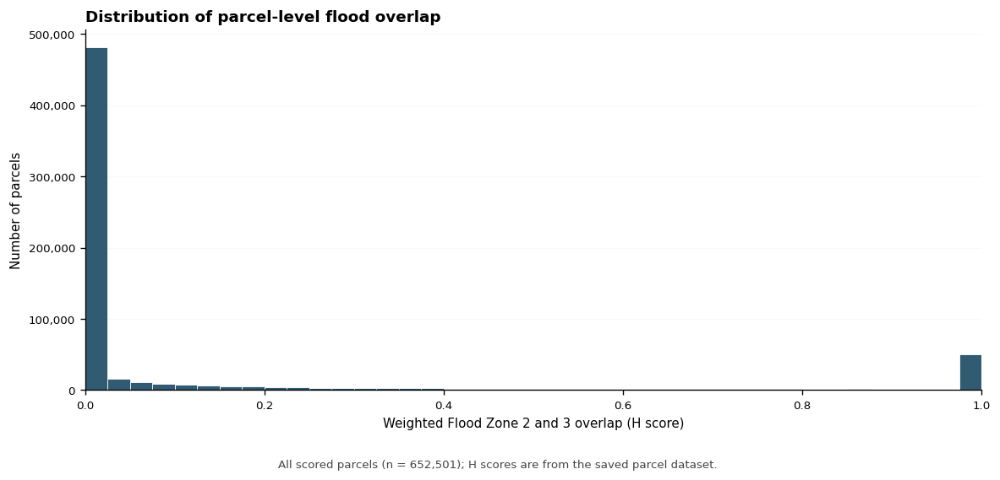

Regional flood-overlap summary


,n_parcels,median_H,q3_H,pct_overlap
region,,,,
London,1307,0.0,0.000,22.265
West Midlands,82126,0.0,0.005,28.000
South East,90555,0.0,0.011,29.019
South West,151594,0.0,0.007,29.201
North East,24757,0.0,0.011,30.189
North West,66979,0.0,0.027,31.791
East of England,89783,0.0,0.112,37.683
Yorkshire and The Humber,69619,0.0,0.132,38.527
East Midlands,75781,0.0,0.215,40.056


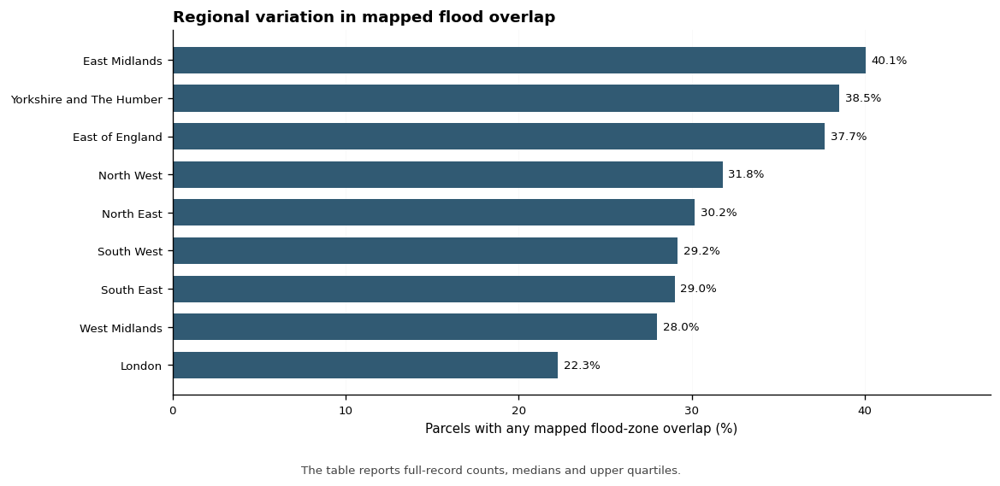

KeyboardInterrupt: 

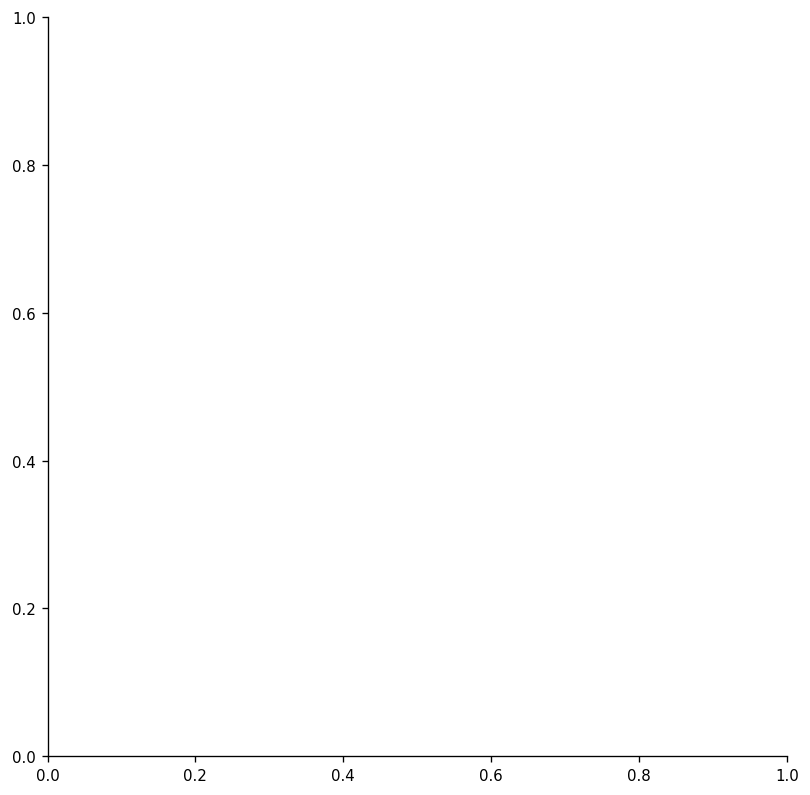

In [ ]:
# Requires the previously created h_scores and the loaded GeoDataFrame parcels.
if "h_scores" not in globals():
    raise ValueError("Run the updated h_scores cell first.")
if "parcels" not in globals():
    raise ValueError("Load parcels_with_nfm_opportunity.gpkg first.")

MAP_MAX_FIELDS = 600000
ANALYSIS_CRS = "EPSG:27700"

def display_h_figure(fig, filename, note):
    fig.text(
        0.5, 0.025,
        note,
        ha="center",
        fontsize=8,
        color="#444444",
    )
    fig.tight_layout(rect=(0, 0.07, 1, 0.96))
    export_figure(fig, filename)
    display(fig)
    plt.close(fig)

scores = pd.to_numeric(
    h_scores["H_score"], errors="coerce"
).dropna()

if scores.empty:
    print("No valid H scores are available.")

else:
    # A. Distribution across all scored parcels.
    fig, ax = plt.subplots(figsize=(10, 5))
    ax.hist(
        scores,
        bins=np.linspace(0, 1, 41),
        color="#315A73",
        edgecolor="white",
        linewidth=0.5,
    )
    ax.set_xlim(0, 1)
    ax.set_xlabel("Weighted Flood Zone 2 and 3 overlap (H score)")
    ax.set_ylabel("Number of parcels")
    ax.yaxis.set_major_formatter(
        mticker.StrMethodFormatter("{x:,.0f}")
    )
    ax.set_title(
        "Distribution of parcel-level flood overlap",
        loc="left",
        fontsize=13,
        fontweight="semibold",
    )
    ax.grid(axis="y", alpha=0.18)
    ax.set_axisbelow(True)

    display_h_figure(
        fig,
        "RQ3_H_distribution",
        f"All scored parcels (n = {len(scores):,}); "
        "H scores are from the saved parcel dataset.",
    )

    # B. Regional overlap. Regional medians are all zero, so the
    # percentage with any overlap is more informative to plot.
    regional = (
        h_scores.groupby("region")
        .agg(
            n_parcels=("field_id", "count"),
            median_H=("H_score", "median"),
            q3_H=("H_score", lambda x: x.quantile(0.75)),
            pct_overlap=(
                "H_score",
                lambda x: 100 * pd.to_numeric(
                    x, errors="coerce"
                ).gt(0).mean(),
            ),
        )
        .sort_values("pct_overlap")
    )

    print("Regional flood-overlap summary")
    display(regional.round(3))

    fig, ax = plt.subplots(figsize=(10, 5))
    bars = ax.barh(
        regional.index.astype(str),
        regional["pct_overlap"],
        color="#315A73",
        height=0.7,
    )
    ax.bar_label(
        bars,
        labels=[
            f"{value:.1f}%"
            for value in regional["pct_overlap"]
        ],
        padding=4,
        fontsize=8,
    )
    ax.set_xlim(0, regional["pct_overlap"].max() * 1.18)
    ax.set_xlabel("Parcels with any mapped flood-zone overlap (%)")
    ax.set_title(
        "Regional variation in mapped flood overlap",
        loc="left",
        fontsize=13,
        fontweight="semibold",
    )
    ax.grid(axis="x", alpha=0.18)
    ax.set_axisbelow(True)

    display_h_figure(
        fig,
        "RQ3_H_regional_overlap",
        "The table reports full-record counts, medians and upper quartiles.",
    )

    # C. One combined farm-and-owner display sample for each map.
    if parcels.crs is None:
        raise ValueError("The loaded parcel GeoPackage has no CRS.")

    mapped = (
        parcels.dropna(subset=["geometry"])
        .sample(
            n=min(MAP_MAX_FIELDS, len(parcels)),
            random_state=42,
        )
        .to_crs(ANALYSIS_CRS)
        .copy()
    )

    for column, title, cmap, colourbar, filename in [
        (
            "H_score",
            "Spatial pattern of weighted flood overlap",
            "viridis",
            "H score (0–1)",
            "RQ3_map_H_score",
        ),
        (
            "frac_fz3",
            "Spatial pattern of Flood Zone 3 overlap",
            "magma",
            "Share of parcel in Flood Zone 3",
            "RQ3_map_FZ3",
        ),
    ]:
        mapped[column] = pd.to_numeric(
            mapped[column], errors="coerce"
        )

        fig, ax = plt.subplots(figsize=(9, 8))
        mapped.plot(
            column=column,
            ax=ax,
            cmap=cmap,
            vmin=0,
            vmax=1,
            linewidth=0,
            rasterized=True,
            missing_kwds={"color": "#D9DDE0"},
        )
        fig.colorbar(
            ScalarMappable(
                norm=Normalize(0, 1),
                cmap=cmap,
            ),
            ax=ax,
            shrink=0.7,
            label=colourbar,
        )
        ax.set_title(
            title,
            loc="left",
            fontsize=13,
            fontweight="semibold",
        )
        ax.set_xlabel("Easting (m; British National Grid)")
        ax.set_ylabel("Northing (m; British National Grid)")
        ax.set_aspect("equal")

        display_h_figure(
            fig,
            filename,
            f"Farm and owner records combined; random display sample "
            f"(n = {len(mapped):,}). Tables use all records.",
        )

In [ ]:
cost = (
    field_payments.reset_index()
    if "field_id" not in field_payments.columns
    else field_payments.copy()
)

required_cost = {
    "field_id", "flame_source", "woodland_residual_per_ha"
}
missing = required_cost - set(cost.columns)
if missing:
    raise ValueError(
        f"Missing woodland cost columns: {sorted(missing)}"
    )

# Match IDs consistently in the two tables.
scores_for_join = h_scores.copy()
cost_for_join = cost[
    ["field_id", "flame_source", "woodland_residual_per_ha"]
].copy()

for frame in (scores_for_join, cost_for_join):
    frame["field_id"] = frame["field_id"].astype(str)
    frame["flame_source"] = frame["flame_source"].astype(str)

if cost_for_join.duplicated(["field_id", "flame_source"]).any():
    raise ValueError(
        "Cost results contain duplicate field_id/source pairs."
    )

joint = scores_for_join.merge(
    cost_for_join,
    on=["field_id", "flame_source"],
    how="left",
    validate="one_to_one",
)

joint["H_score"] = pd.to_numeric(
    joint["H_score"], errors="coerce"
)
joint["woodland_residual_per_ha"] = pd.to_numeric(
    joint["woodland_residual_per_ha"], errors="coerce"
)
joint["on_floodplain"] = joint["H_score"].gt(0)

# One pooled row per H decile.
joint_table = (
    joint.groupby("H_decile", dropna=False, observed=True)
    .agg(
        n_fields=("field_id", "count"),
        n_with_cost=("woodland_residual_per_ha", "count"),
        mean_H=("H_score", "mean"),
        median_woodland_gap_gbp_ha_year=(
            "woodland_residual_per_ha", "median"
        ),
        pct_floodplain_overlap=(
            "on_floodplain",
            lambda x: 100 * x.mean(),
        ),
    )
    .reset_index()
)

print("Table H5. Woodland compensation by flood-overlap decile")
display(joint_table.round(2))


Table H5. Woodland compensation by flood-overlap decile


,H_decile,n_fields,n_with_cost,mean_H,median_woodland_gap_gbp_ha_year,pct_floodplain_overlap
0,1,65251,40993,0.00,4003.19,0.00
1,2,65250,41267,0.00,4003.19,0.00
2,3,65250,41111,0.00,4003.19,0.00
3,4,65250,41197,0.00,3945.79,0.00
4,5,65250,35966,0.00,3945.79,0.00
5,6,65250,44197,0.00,3945.79,0.00
6,7,65250,41240,0.00,4003.19,27.37
7,8,65250,52526,0.04,4022.79,100.00
8,9,65250,44918,0.32,4003.19,100.00
9,10,65250,42114,0.96,4022.79,100.00


Table H6. Modelled woodland gap by mapped floodplain overlap


,group,n_fields,n_with_cost,area_ha,median_woodland_gap_gbp_ha_year
0,No mapped overlap,438893,271342,3682309.02,3945.79
1,Positive mapped overlap,213608,154187,4770737.44,4022.79


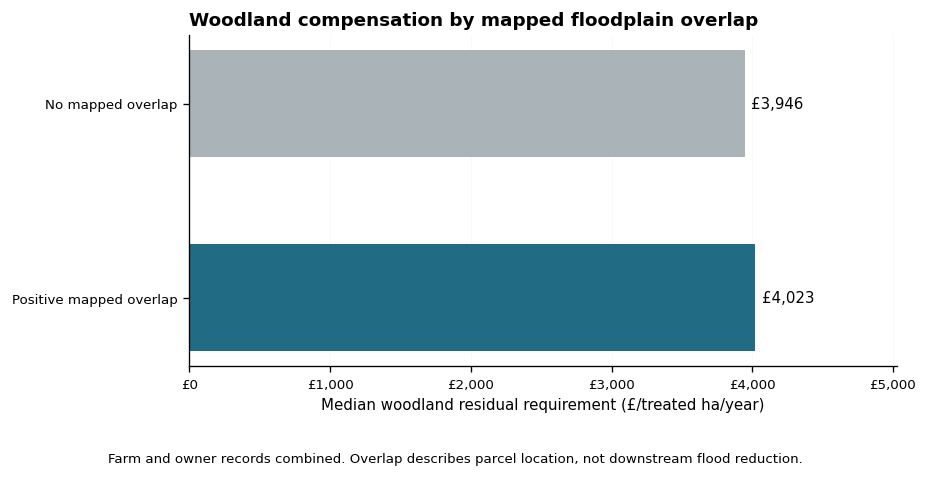

In [ ]:
if "joint" not in globals():
    raise ValueError("Run the updated H-score/woodland-cost join cell first.")

comparison = (
    joint.groupby("on_floodplain", observed=True)
    .agg(
        n_fields=("field_id", "count"),
        n_with_cost=("woodland_residual_per_ha", "count"),
        area_ha=("size_ha", "sum"),
        median_woodland_gap_gbp_ha_year=(
            "woodland_residual_per_ha", "median"
        ),
    )
    .reindex([False, True])
    .reset_index()
)

comparison["group"] = comparison["on_floodplain"].map({
    False: "No mapped overlap",
    True: "Positive mapped overlap",
})

print("Table H6. Modelled woodland gap by mapped floodplain overlap")
display(
    comparison[
        [
            "group", "n_fields", "n_with_cost", "area_ha",
            "median_woodland_gap_gbp_ha_year",
        ]
    ].round(2)
)

plot_data = comparison.dropna(
    subset=["median_woodland_gap_gbp_ha_year"]
)

if plot_data.empty:
    print("No woodland residual-cost values are available to plot.")

else:
    fig, ax = plt.subplots(figsize=(8, 4))
    bars = ax.barh(
        plot_data["group"],
        plot_data["median_woodland_gap_gbp_ha_year"],
        color=[
            "#AAB4B8" if not overlap else "#216B85"
            for overlap in plot_data["on_floodplain"]
        ],
        height=0.55,
    )
    ax.bar_label(
        bars,
        labels=[
            f"£{value:,.0f}"
            for value in plot_data[
                "median_woodland_gap_gbp_ha_year"
            ]
        ],
        padding=4,
    )
    ax.invert_yaxis()
    ax.set_xlabel(
        "Median woodland residual requirement "
        "(£/treated ha/year)"
    )
    ax.set_title(
        "Woodland compensation by mapped floodplain overlap",
        loc="left",
        fontsize=12,
        fontweight="semibold",
    )
    ax.xaxis.set_major_formatter(
        mticker.StrMethodFormatter("£{x:,.0f}")
    )
    ax.grid(axis="x", alpha=0.18)
    ax.set_axisbelow(True)
    ax.set_xlim(
        0,
        plot_data[
            "median_woodland_gap_gbp_ha_year"
        ].max() * 1.25,
    )

    fig.text(
        0.5, 0.025,
        "Farm and owner records combined. Overlap describes parcel "
        "location, not downstream flood reduction.",
        ha="center",
        fontsize=8,
    )
    fig.tight_layout(rect=(0, 0.09, 1, 1))
    export_figure(fig, "RQ3_woodland_gap_by_flood_overlap")
    display(fig)
    plt.close(fig)

### Case-study comparison

Scaled EPlanner rasters for three catchments provide a separate, illustrative comparison with field-level cost estimates. The 0–1 raster scores are not directly comparable with pounds per hectare per year, and case-study results should not be extrapolated nationally.


In [ ]:
CASE_STUDY_DIR = Path(os.environ.get("NFM_CASE_STUDY_DIR", DATA_ROOT / "raw/case_study"))
CASE_NAMES = ['Combe Haven','Medway Upper','Thames Lower']
RASTER_KINDS = ['runo','wetg','wood']
CASE_FILES = {(case,kind):CASE_STUDY_DIR/f'EPlanner_{kind}_{case}_scaled.tif'
              for case in CASE_NAMES for kind in RASTER_KINDS}
HAS_CASE_RASTERS = all(path.exists() for path in CASE_FILES.values())
if not HAS_CASE_RASTERS:
    missing=[str(p) for p in CASE_FILES.values() if not p.exists()]
    print('Case-study rasters unavailable; missing:',*missing,sep='\n')


In [ ]:
if HAS_CASE_RASTERS:
    audit_rows=[]
    for (case,kind),path in CASE_FILES.items():
        with rasterio.open(path) as src:
            if src.count!=1 or src.crs.to_epsg()!=27700: raise ValueError(f'Unexpected raster metadata: {path}')
            pixel_ha=abs(src.transform.a*src.transform.e-src.transform.b*src.transform.d)/10000
            count=positive=zero=negative=0;total=squares=0.0;lo=np.inf;hi=-np.inf
            for row in range(0,src.height,512):
                for col in range(0,src.width,512):
                    block=src.read(1,window=Window(col,row,min(512,src.width-col),min(512,src.height-row)),masked=True)
                    values=block.compressed().astype(float)*src.scales[0]+src.offsets[0]
                    values=values[np.isfinite(values)]
                    if not len(values):continue
                    count+=len(values);positive+=int((values>0).sum());zero+=int((values==0).sum());negative+=int((values<0).sum())
                    total+=values.sum();squares+=np.dot(values,values);lo=min(lo,values.min());hi=max(hi,values.max())
            audit_rows.append({'catchment':case,'raster':kind,'valid_pixels':count,'valid_area_ha':count*pixel_ha,
                'positive_area_ha':positive*pixel_ha,'zero_area_ha':zero*pixel_ha,'negative_area_ha':negative*pixel_ha,
                'mean_score':total/count if count else np.nan,'sd_score':np.sqrt(max(0,squares/count-(total/count)**2)) if count else np.nan,
                'minimum':lo if count else np.nan,'maximum':hi if count else np.nan,'pixel_width_m':src.res[0]})
        print('Audited',case,kind,flush=True)
    raster_audit=pd.DataFrame(audit_rows)
    print('Table C1. Exact EPlanner raster audit — source: supplied EPlanner rasters')
    display(raster_audit.round(3))


Audited Combe Haven runo
Audited Combe Haven wetg
Audited Combe Haven wood
Audited Medway Upper runo
Audited Medway Upper wetg
Audited Medway Upper wood
Audited Thames Lower runo
Audited Thames Lower wetg
Audited Thames Lower wood
Table C1. Exact EPlanner raster audit — source: supplied EPlanner rasters


,catchment,raster,valid_pixels,valid_area_ha,positive_area_ha,zero_area_ha,negative_area_ha,mean_score,sd_score,minimum,maximum,pixel_width_m
0,Combe Haven,runo,12909311,32273.278,30605.395,1667.882,0.0,0.545,0.277,0.0,1.0,5.0
1,Combe Haven,wetg,6118363,15295.908,14517.318,778.590,0.0,0.350,0.245,0.0,1.0,5.0
2,Combe Haven,wood,8417292,21043.230,19984.818,1058.412,0.0,0.616,0.283,0.0,1.0,5.0
3,Medway Upper,runo,28000000,70000.000,66444.853,3555.148,0.0,0.516,0.283,0.0,1.0,5.0
4,Medway Upper,wetg,13708125,34270.312,32491.980,1778.332,0.0,0.386,0.243,0.0,1.0,5.0
5,Medway Upper,wood,18528940,46322.350,43896.572,2425.778,0.0,0.558,0.313,0.0,1.0,5.0
6,Thames Lower,runo,44000000,110000.000,102422.258,7577.742,0.0,0.552,0.293,0.0,1.0,5.0
7,Thames Lower,wetg,14608316,36520.790,34593.833,1926.958,0.0,0.479,0.272,0.0,1.0,5.0
8,Thames Lower,wood,32610620,81526.550,77243.918,4282.632,0.0,0.574,0.295,0.0,1.0,5.0


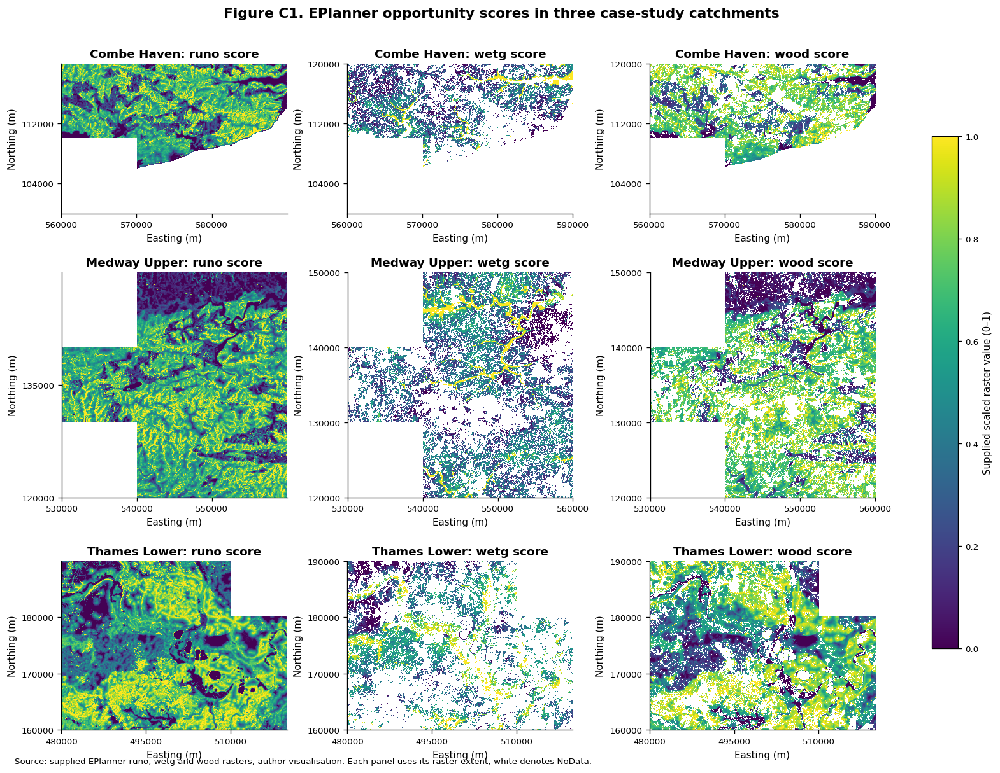

In [ ]:
if HAS_CASE_RASTERS:
    # A shared 0–1 scale makes the supplied scaled layers visually comparable.
    fig,axes=plt.subplots(3,3,figsize=(13,10),constrained_layout=True)
    for i,case in enumerate(CASE_NAMES):
        for j,kind in enumerate(RASTER_KINDS):
            with rasterio.open(CASE_FILES[(case,kind)]) as src:
                scale=min(1,650/max(src.height,src.width))
                arr=src.read(1,out_shape=(max(1,int(src.height*scale)),max(1,int(src.width*scale))),masked=True,resampling=Resampling.nearest)
                arr=np.ma.masked_invalid(arr*src.scales[0]+src.offsets[0])
                extent=(src.bounds.left,src.bounds.right,src.bounds.bottom,src.bounds.top)
            axes[i,j].imshow(arr,extent=extent,cmap='viridis',vmin=0,vmax=1,origin='upper',interpolation='nearest')
            axes[i,j].set_title(f'{case}: {kind} score')
            axes[i,j].set_aspect('equal');axes[i,j].xaxis.set_major_locator(MaxNLocator(3));axes[i,j].yaxis.set_major_locator(MaxNLocator(3))
            axes[i,j].set_xlabel('Easting (m)');axes[i,j].set_ylabel('Northing (m)')
    fig.suptitle('Figure C1. EPlanner opportunity scores in three case-study catchments')
    fig.colorbar(ScalarMappable(norm=Normalize(0,1),cmap='viridis'),ax=axes.ravel().tolist(),shrink=.7,label='Supplied scaled raster value (0–1)')
    fig.text(.01,.005,'Source: supplied EPlanner runo, wetg and wood rasters; author visualisation. Each panel uses its raster extent; white denotes NoData.',fontsize=8)
    export_figure(fig, "RQ3_cell_142")
    display(fig);plt.close(fig)


In [ ]:
if HAS_CASE_RASTERS:
    import pyogrio
    from rasterio.features import rasterize
    from matplotlib.lines import Line2D
    CASE_HIGH_SCORE=0.75
    case_parts=[]
    for case in CASE_NAMES:
        path=CASE_FILES[(case,'wood')]
        with rasterio.open(path) as src:
            bounds=tuple(src.bounds);shape=src.shape;transform=src.transform
            pixel_ha=abs(transform.a*transform.e-transform.b*transform.d)/10000
            score=src.read(1,masked=True)
            data=np.asarray(score.data,dtype='float32')*src.scales[0]+src.offsets[0]
            valid_raster=~np.ma.getmaskarray(score)&np.isfinite(data)&(data>=0)&(data<=1)
        geo=pyogrio.read_dataframe(GPKG_PATH,layer=LAYER,columns=['field_id','flame_source','available_ha'],bbox=bounds)
        geo=geo.loc[geo.geometry.notna()&~geo.geometry.is_empty].copy()
        geo['field_id']=geo.field_id.astype(str)
        for source,sub in geo.groupby('flame_source'):
            sub=sub.reset_index(drop=True)
            if sub.empty:continue
            labels=rasterize(((g,j+1) for j,g in enumerate(sub.geometry)),out_shape=shape,transform=transform,fill=0,dtype='int32')
            valid=(labels>0)&valid_raster
            ix=labels[valid].astype('int64');vals=data[valid].astype('float64')
            counts=np.bincount(ix,minlength=len(sub)+1)[1:]
            sums=np.bincount(ix,weights=vals,minlength=len(sub)+1)[1:]
            highs=np.bincount(ix,weights=(vals>=CASE_HIGH_SCORE),minlength=len(sub)+1)[1:]
            part=sub[['field_id','flame_source','available_ha']].copy()
            part['case_study']=case;part['valid_pixel_count']=counts;part['scored_area_ha']=counts*pixel_ha
            part['mean_wood_score']=np.divide(sums,counts,out=np.full(len(sub),np.nan),where=counts>0)
            part['high_wood_score_area_ha']=highs*pixel_ha
            case_parts.append(part.loc[part.valid_pixel_count.gt(0)])
            print(case,source,'fields scored:',int((counts>0).sum()),flush=True)
    case_alignment=pd.concat(case_parts,ignore_index=True) if case_parts else pd.DataFrame()
    if not case_alignment.empty:
        cost=field_payments.reset_index() if 'field_id' not in field_payments.columns else field_payments.copy()
        cost['field_id']=cost.field_id.astype(str)
        case_alignment=case_alignment.merge(cost[['field_id','flame_source','woodland_residual_per_ha']],
            on=['field_id','flame_source'],how='left',validate='many_to_one')
        case_alignment['illustrative_candidate']=(case_alignment.high_wood_score_area_ha.ge(1.0)&
            case_alignment.woodland_residual_per_ha.le(case_alignment.groupby(['case_study','flame_source']).woodland_residual_per_ha.transform('median')))
        case_summary=(case_alignment.groupby(['case_study','flame_source'],observed=True).agg(
            fields_scored=('field_id','count'),scored_area_ha=('scored_area_ha','sum'),
            high_score_area_ha=('high_wood_score_area_ha','sum'),median_wood_score=('mean_wood_score','median'),
            median_woodland_gap_gbp_ha_year=('woodland_residual_per_ha','median'),
            illustrative_candidates=('illustrative_candidate','sum')).reset_index())
        print('Table C2. Woodland raster and cost alignment — source: EPlanner wood raster and author compensation model')
        display(case_summary.round(2))


Combe Haven farm fields scored: 1552
Combe Haven owner fields scored: 934
Medway Upper farm fields scored: 2725
Medway Upper owner fields scored: 1947
Thames Lower farm fields scored: 1657
Thames Lower owner fields scored: 1831
Table C2. Woodland raster and cost alignment — source: EPlanner wood raster and author compensation model


,case_study,flame_source,fields_scored,scored_area_ha,high_score_area_ha,median_wood_score,median_woodland_gap_gbp_ha_year,illustrative_candidates
0,Combe Haven,farm,1552,7984.68,3499.56,0.74,5885.49,542
1,Combe Haven,owner,934,6321.55,2451.39,0.73,5885.49,338
2,Medway Upper,farm,2725,17636.06,6240.60,0.70,3855.49,466
3,Medway Upper,owner,1947,13314.12,3802.96,0.67,3855.49,293
4,Thames Lower,farm,1657,10214.85,2357.39,0.57,3855.49,170
5,Thames Lower,owner,1831,14205.74,3928.62,0.56,3855.49,167


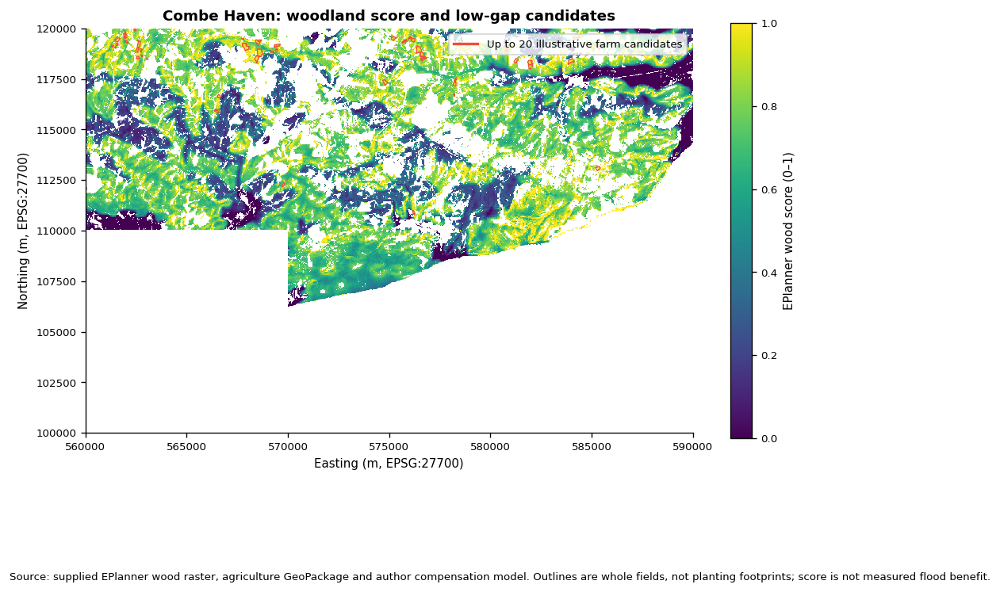

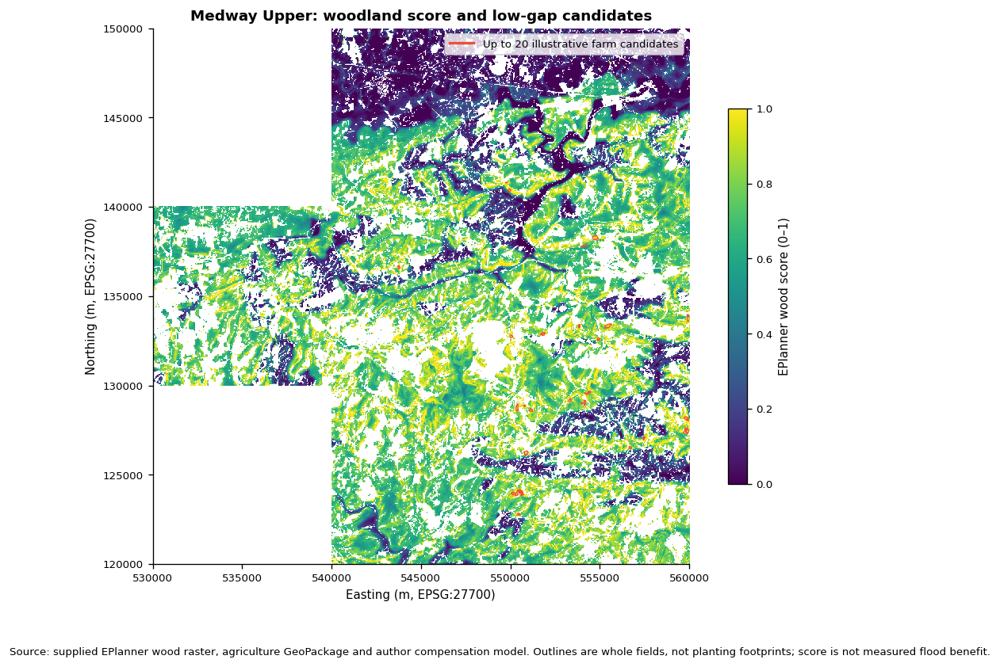

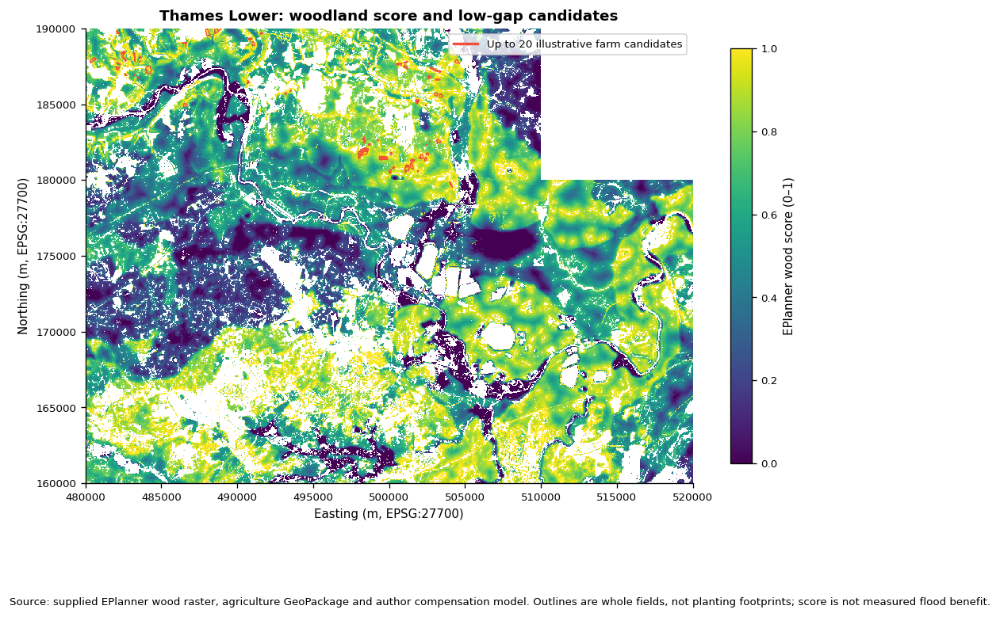

In [ ]:
if HAS_CASE_RASTERS and not case_alignment.empty:
    for case in CASE_NAMES:
        with rasterio.open(CASE_FILES[(case,'wood')]) as src:
            scale=min(1,1000/max(src.height,src.width))
            arr=src.read(1,out_shape=(max(1,int(src.height*scale)),max(1,int(src.width*scale))),masked=True,resampling=Resampling.nearest)
            arr=np.ma.masked_invalid(arr*src.scales[0]+src.offsets[0]);extent=(src.bounds.left,src.bounds.right,src.bounds.bottom,src.bounds.top)
        selected=(case_alignment.loc[case_alignment.case_study.eq(case)&case_alignment.flame_source.eq('farm')&case_alignment.illustrative_candidate]
                  .sort_values(['mean_wood_score','woodland_residual_per_ha'],ascending=[False,True]).head(20))
        fig,ax=plt.subplots(figsize=(9,7))
        ax.imshow(arr,extent=extent,origin='upper',cmap='viridis',vmin=0,vmax=1,interpolation='nearest')
        if not selected.empty:
            ids=selected.field_id.astype(str).tolist()
            # Read the case footprint only; candidate outlines are whole fields.
            outlines=pyogrio.read_dataframe(GPKG_PATH,layer=LAYER,columns=['field_id'],bbox=(extent[0],extent[2],extent[1],extent[3]))
            chosen=outlines.loc[outlines.field_id.astype(str).isin(ids)]
            if not chosen.empty:chosen.boundary.plot(ax=ax,color='#F04E37',linewidth=.8)
        ax.set(xlim=extent[:2],ylim=extent[2:],title=f'{case}: woodland score and low-gap candidates',
               xlabel='Easting (m, EPSG:27700)',ylabel='Northing (m, EPSG:27700)',aspect='equal')
        fig.colorbar(ScalarMappable(norm=Normalize(0,1),cmap='viridis'),ax=ax,shrink=.7,label='EPlanner wood score (0–1)')
        ax.legend(handles=[Line2D([0],[0],color='#F04E37',lw=2,label='Up to 20 illustrative farm candidates')],loc='upper right')
        fig.text(.01,.01,'Source: supplied EPlanner wood raster, agriculture GeoPackage and author compensation model. Outlines are whole fields, not planting footprints; score is not measured flood benefit.',fontsize=8)
        fig.tight_layout(rect=(0,.07,1,1));export_figure(fig, "RQ3_cell_144")
        display(fig);plt.close(fig)


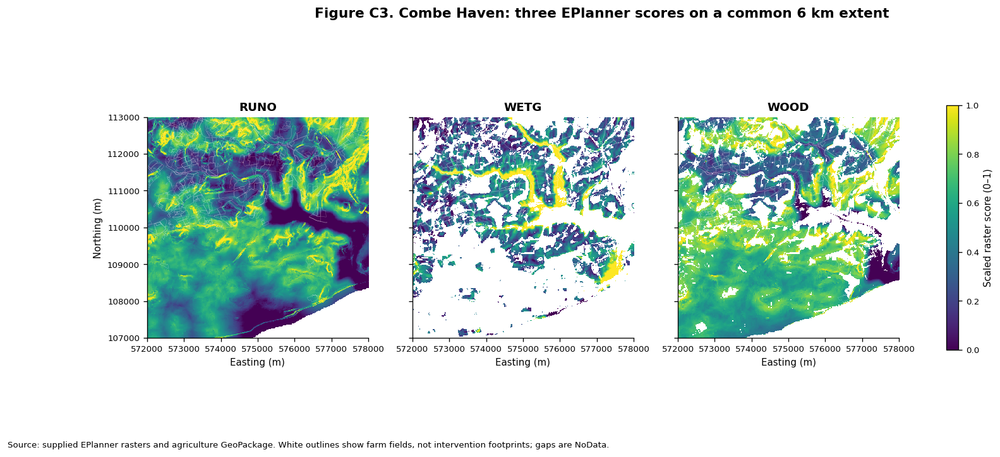

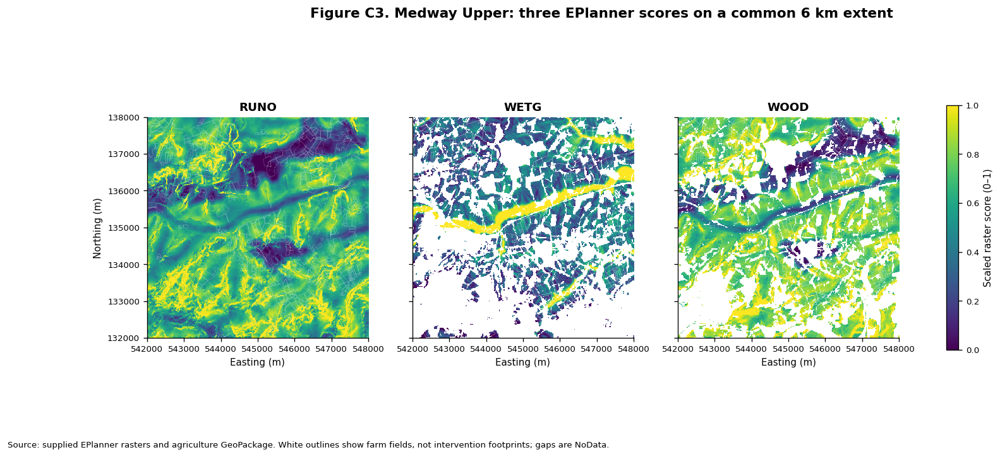

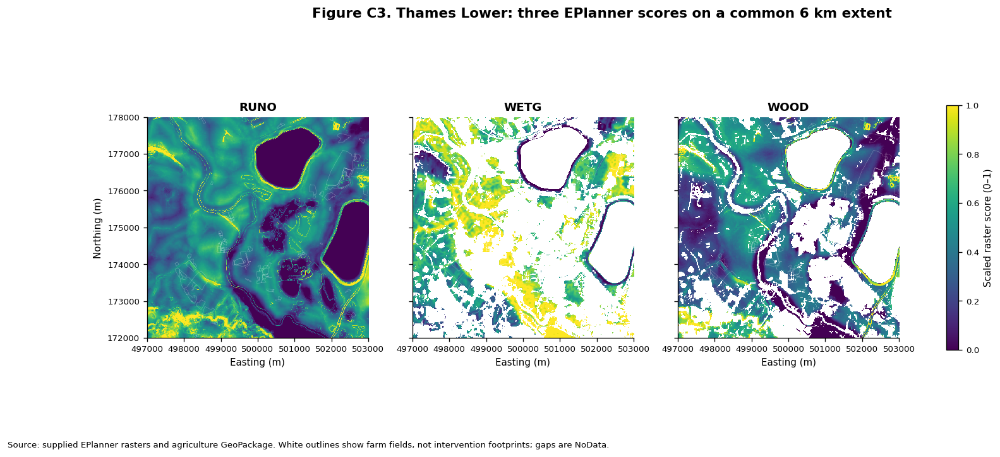

In [ ]:
if HAS_CASE_RASTERS:
    from rasterio.windows import from_bounds
    WIDTH_M=6000
    for case in CASE_NAMES:
        with rasterio.open(CASE_FILES[(case,'wood')]) as ref:
            centre=((ref.bounds.left+ref.bounds.right)/2,(ref.bounds.bottom+ref.bounds.top)/2)
            left=max(ref.bounds.left,centre[0]-WIDTH_M/2);right=min(ref.bounds.right,centre[0]+WIDTH_M/2)
            bottom=max(ref.bounds.bottom,centre[1]-WIDTH_M/2);top=min(ref.bounds.top,centre[1]+WIDTH_M/2)
        bounds=(left,bottom,right,top)
        outlines=pyogrio.read_dataframe(GPKG_PATH,layer=LAYER,columns=['field_id','flame_source'],bbox=bounds)
        outlines=outlines.loc[outlines.flame_source.eq('farm')]
        fig,axes=plt.subplots(1,3,figsize=(16,6),sharex=True,sharey=True)
        for ax,kind in zip(axes,RASTER_KINDS):
            with rasterio.open(CASE_FILES[(case,kind)]) as src:
                window=from_bounds(*bounds,transform=src.transform).round_offsets().round_lengths()
                arr=src.read(1,window=window,masked=True,out_shape=(800,800),resampling=Resampling.nearest)
                arr=np.ma.masked_invalid(arr*src.scales[0]+src.offsets[0]);bb=rasterio.windows.bounds(window,src.transform)
            ax.imshow(arr,extent=(bb[0],bb[2],bb[1],bb[3]),origin='upper',cmap='viridis',vmin=0,vmax=1,interpolation='nearest')
            if not outlines.empty:outlines.boundary.plot(ax=ax,color='white',linewidth=.2,alpha=.5)
            ax.set(xlim=(left,right),ylim=(bottom,top),title=kind.upper(),xlabel='Easting (m)',aspect='equal')
        axes[0].set_ylabel('Northing (m)')
        fig.suptitle(f'Figure C3. {case}: three EPlanner scores on a common 6 km extent')
        fig.colorbar(ScalarMappable(norm=Normalize(0,1),cmap='viridis'),ax=axes.ravel().tolist(),shrink=.7,label='Scaled raster score (0–1)')
        fig.text(.01,.01,'Source: supplied EPlanner rasters and agriculture GeoPackage. White outlines show farm fields, not intervention footprints; gaps are NoData.',fontsize=8)
        export_figure(fig, "RQ3_cell_145")
        display(fig);plt.close(fig)


,case_study,width_km,height_km,extent_area_km2,pixel_width_m,pixel_height_m
0,Combe Haven,30.0,20.0,600.0,5.0,5.0
1,Medway Upper,30.0,30.0,900.0,5.0,5.0
2,Thames Lower,40.0,30.0,1200.0,5.0,5.0


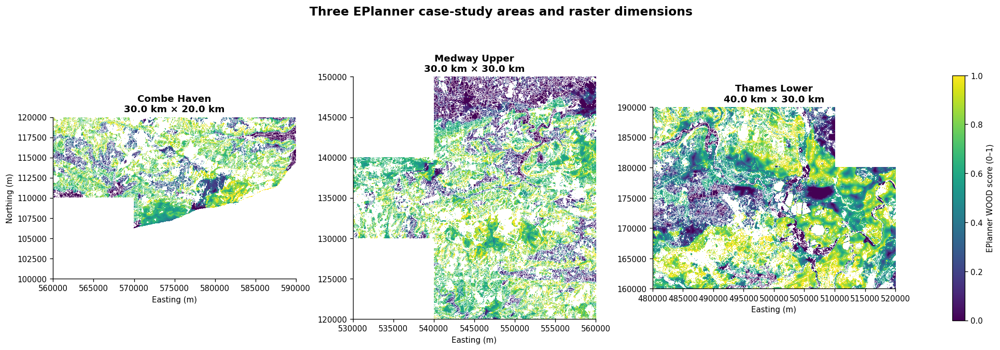

In [ ]:
cases = ["Combe Haven", "Medway Upper", "Thames Lower"]
dimension_rows = []

fields = parcels.to_crs("EPSG:27700")

fig, axes = plt.subplots(
    1, 3,
    figsize=(16, 6),
    constrained_layout=True,
)

for ax, case in zip(axes, cases):
    path = CASE_FILES[(case, "wood")]

    with rasterio.open(path) as src:
        if src.crs.to_epsg() != 27700:
            raise ValueError(f"Unexpected CRS for {case}: {src.crs}")

        width_km = (src.bounds.right - src.bounds.left) / 1000
        height_km = (src.bounds.top - src.bounds.bottom) / 1000
        extent_area_km2 = width_km * height_km

        dimension_rows.append({
            "case_study": case,
            "width_km": width_km,
            "height_km": height_km,
            "extent_area_km2": extent_area_km2,
            "pixel_width_m": abs(src.res[0]),
            "pixel_height_m": abs(src.res[1]),
        })

        # Downsample for display only.
        scale = min(1, 900 / max(src.width, src.height))
        out_height = max(1, int(src.height * scale))
        out_width = max(1, int(src.width * scale))

        data = src.read(
            1,
            out_shape=(out_height, out_width),
            masked=True,
            resampling=Resampling.nearest,
        )
        data = np.ma.masked_invalid(
            data * src.scales[0] + src.offsets[0]
        )

        bounds = src.bounds
        extent = (
            bounds.left, bounds.right,
            bounds.bottom, bounds.top,
        )

    ax.imshow(
        data,
        extent=extent,
        origin="upper",
        cmap="viridis",
        vmin=0,
        vmax=1,
        interpolation="nearest",
    )

    # Show parcel outlines within the raster coverage.
    local_fields = fields.cx[
        bounds.left:bounds.right,
        bounds.bottom:bounds.top,
    ]
    if not local_fields.empty:
        local_fields.boundary.plot(
            ax=ax,
            color="white",
            linewidth=0.25,
            alpha=0.65,
        )

    ax.set_xlim(bounds.left, bounds.right)
    ax.set_ylim(bounds.bottom, bounds.top)
    ax.set_aspect("equal")
    ax.set_title(
        f"{case}\n{width_km:.1f} km × {height_km:.1f} km",
        fontsize=11,
        fontweight="semibold",
    )
    ax.set_xlabel("Easting (m)")

axes[0].set_ylabel("Northing (m)")

fig.colorbar(
    ScalarMappable(
        norm=Normalize(0, 1),
        cmap="viridis",
    ),
    ax=axes,
    shrink=0.7,
    label="EPlanner WOOD score (0–1)",
)

fig.suptitle(
    "Three EPlanner case-study areas and raster dimensions",
    fontsize=14,
    fontweight="semibold",
)

display(pd.DataFrame(dimension_rows).round(2))
plt.show()

In [ ]:
import pandas as pd

financing_table = pd.DataFrame([
    ["Earth bund", "£0", 100.0, 24778, 16932, 18625, "Intervention footprint"],
    ["Leaky woody barrier", "£707 proxy", 90.6, 10672, 7528, 8281, "Intervention footprint"],
    ["Riparian woodland", "£742 proxy", 84.3, 2081, 4733, 5207, "Contract duration"],
    ["New hedgerow", "£0", 100.0, 58986, 39737, 43711, "Intervention footprint"],
    ["Grass buffer strip", "£515 direct", 63.5, 1125, 1410, 1551, "Intervention footprint"],
    ["Sediment pond", "£0", 100.0, 91151, 61180, 67298, "Intervention footprint"],
], columns=[
    "Intervention",
    "Annual scheme rate",
    "Gross cost remaining after offset (%)",
    "Largest sensitivity range (£/ha/year)",
    "Central median (£/ha/year)",
    "With 10% participation premium (£/ha/year)",
    "Most influential parameter",
])

display(
    financing_table.style.format({
        "Gross cost remaining after offset (%)": "{:.1f}",
        "Largest sensitivity range (£/ha/year)": "{:,.0f}",
        "Central median (£/ha/year)": "{:,.0f}",
        "With 10% participation premium (£/ha/year)": "{:,.0f}",
    })
)

,Intervention,Annual scheme rate,Gross cost remaining after offset (%),Largest sensitivity range (£/ha/year),Central median (£/ha/year),With 10% participation premium (£/ha/year),Most influential parameter
0,Earth bund,£0,100.0,"24,778","16,932","18,625",Intervention footprint
1,Leaky woody barrier,£707 proxy,90.6,"10,672","7,528","8,281",Intervention footprint
2,Riparian woodland,£742 proxy,84.3,"2,081","4,733","5,207",Contract duration
3,New hedgerow,£0,100.0,"58,986","39,737","43,711",Intervention footprint
4,Grass buffer strip,£515 direct,63.5,"1,125","1,410","1,551",Intervention footprint
5,Sediment pond,£0,100.0,"91,151","61,180","67,298",Intervention footprint


## References and source notes


Sheikh, H., Singh, A., Kushwaha, N., Christiaen, C., Tkachenko, N. and Caldecott, B. (2025a) 'A Field-Level Asset Mapping Dataset for England's Agricultural Sector'. [https://doi.org/10.5281/zenodo.15630940.](https://doi.org/10.5281/zenodo.15630940.)

DEFRA (2024) 'Crop Map of England (CROME)'. Available at: [https://environment.data.gov.uk/dataset/0903079b-35a2-47de-b805-77a0cc0c57bf](https://environment.data.gov.uk/dataset/0903079b-35a2-47de-b805-77a0cc0c57bf) (Accessed: 1 January 2026).

DEFRA (2025d) 'Predictive Agricultural Land Classification Map for England'. Available at: [https://environment.data.gov.uk/dataset/a817d96f-271d-487b-89ad-48d271f931aa](https://environment.data.gov.uk/dataset/a817d96f-271d-487b-89ad-48d271f931aa) (Accessed: 1 July 2026).

DEFRA (2021) 'agCensus'. Available at: [https://digimap.edina.ac.uk/agcensus](https://digimap.edina.ac.uk/agcensus) (Accessed: 1 July 2026).

DEFRA (2026a) 'RPA Parcel Points (England)'. Available at: [https://environment.data.gov.uk/dataset/93a2433d-054a-484c-aec4-4e2ce9d7f2a9](https://environment.data.gov.uk/dataset/93a2433d-054a-484c-aec4-4e2ce9d7f2a9) (Accessed: 1 July 2026).

ONS (2025) 'Regions (December 2025) Boundaries EN BFE'. Available at: [https://geoportal.statistics.gov.uk/datasets/ons::regions-december-2025-boundaries-en-bfc/about](https://geoportal.statistics.gov.uk/datasets/ons::regions-december-2025-boundaries-en-bfc/about) (Accessed: 1 July 2026).

DEFRA (2026b) 'WFD Surface Water Operational Catchments Cycle 4'. Available at: [https://environment.data.gov.uk/dataset/70e304bb-8fdb-4a98-af6f-62c7e6f38665](https://environment.data.gov.uk/dataset/70e304bb-8fdb-4a98-af6f-62c7e6f38665) (Accessed: 1 July 2026).

Ordnance Survey (2026a) 'OS Boundaries'. Available at: [https://www.ordnancesurvey.co.uk/products/os-boundaries](https://www.ordnancesurvey.co.uk/products/os-boundaries) (Accessed: 1 July 2026).

Ordnance Survey (2022) 'OS Open Built Up Areas'. Available at: [https://digimap.edina.ac.uk](https://digimap.edina.ac.uk) (Accessed: 1 July 2026).

Ordnance Survey (2026) 'OS Open Roads'. Available at: [https://www.ordnancesurvey.co.uk/products/os-open-roads](https://www.ordnancesurvey.co.uk/products/os-open-roads) (Accessed: 1 July 2026).

HOT (2025) 'OpenStreetMap United Kingdom Railways'. Available at: [https://data.humdata.org/dataset/hotosm_gbr_railways](https://data.humdata.org/dataset/hotosm_gbr_railways) (Accessed: 1 July 2026).

Taylor, P. J. (2021) 'Spatial inventory of UK waterbodies'. Available at: [https://doi.org/10.5285/b6b92ce3-dcd7-4f0b-8e43-e937ddf1d4eb](https://doi.org/10.5285/b6b92ce3-dcd7-4f0b-8e43-e937ddf1d4eb).


Ordnance Survey (2026b) 'OS MasterMap Water Network'. Available at: [https://docs.os.uk/os-downloads/resources/product-resources/end-of-life-product-documentation/os-mastermap-water-network-layer#summary](https://docs.os.uk/os-downloads/resources/product-resources/end-of-life-product-documentation/os-mastermap-water-network-layer#summary) (Accessed: 1 July 2026).

DEFRA (2025b) 'England Peat Map, Peaty Soil Depth'. Available at: [https://englandpeatmap-defra.hub.arcgis.com/content/bc4527cbbc0c4acc92b44e85528c975e/about](https://englandpeatmap-defra.hub.arcgis.com/content/bc4527cbbc0c4acc92b44e85528c975e/about) (Accessed: 1 July 2026).

Natural England (2024a) 'Areas of Outstanding Natural Beauty (England)'. Available at: [https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::areas-of-outstanding-natural-beauty-england/about](https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::areas-of-outstanding-natural-beauty-england/about) (Accessed: 1 July 2026).

Natural England (2024b) 'National Parks (England)'. Available at: [https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::national-parks-england/about](https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::national-parks-england/about) (Accessed: 1 July 2026).

Natural England (2024c) 'Ramsar (England)'. Available at: [https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::ramsar-england/about](https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::ramsar-england/about).

Natural England (2024d) 'Special Areas of Conservation (England)'. Available at: [https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::special-areas-of-conservation-england/about](https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::special-areas-of-conservation-england/about) (Accessed: 1 July 2026).

Natural England (2025) 'Special Protection Area (England)'. Available at: [https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::special-protection-areas-england/about](https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::special-protection-areas-england/about) (Accessed: 1 July 2026).

Natural England (2026a) 'Local Nature Reserves (England)'. Available at: [https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::local-nature-reserves-england/about](https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::local-nature-reserves-england/about) (Accessed: 1 July 2026).

Natural England (2026b) 'National Nature Reserves (England)'. Available at: [https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::national-nature-reserves-england/about](https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::national-nature-reserves-england/about) (Accessed: 1 July 2026).

Natural England (2026c) 'Sites of Special Scientific Interest (England)'. Available at: [https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::sites-of-special-scientific-interest-england/about](https://naturalengland-defra.opendata.arcgis.com/datasets/Defra::sites-of-special-scientific-interest-england/about) (Accessed: 1 July 2026).

Environment Agency (2025a) 'Flood Map for Planning - Flood Zones'. Available at: [https://www.data.gov.uk/dataset/104434b0-5263-4c90-9b1e-e43b1d57c750/flood-map-for-planning-flood-zones1#licence-information](https://www.data.gov.uk/dataset/104434b0-5263-4c90-9b1e-e43b1d57c750/flood-map-for-planning-flood-zones1#licence-information).
